

<div style="display:block;width:100%;margin:auto;" direction=rtl align=center><br><br>
    <div  style="width:100%;margin:100;display:block;background-color:#fff0;"  display=block align=center>
        <table style="border-style:hidden;border-collapse:collapse;">             <tr>
                <td  style="border: none!important;">
                    <img width=130 align=right src="https://i.ibb.co/yXKQmtZ/logo1.png" style="margin:0;" />
                </td>
                <td style="text-align:center;border: none!important;">
                    <h1 align=center><font size=5 color="#025F5F"> <b>Deep Generative Models</b><br><br>Project 3 DDPM and DDIM implementation </i></font></h1>
                </td>
                <td style="border: none!important;">
                    <img width=170 align=left  src="https://i.ibb.co/wLjqFkw/logo2.png" style="margin:0;" />
                </td>
           </tr>
</div>
        </table>
    </div>

## Mohammad Taha Majlesi - 8100101504

Deep Generative Models course - Dr. Tavassoli pour - University of Tehran


# **In the Name of God**  
## **University of Tehran**  
### **School of Electrical and Computer Engineering**  

---


### **Course Title: Deep Generative Models**  
**Instructor:** Dr. Mostafa Tavassoli  
**Homework 3**  
**Submission Date:** December 2023  

---




# **Training and Evaluation of Denoising Diffusion Models: DDPM and DDIM**

## **1. Introduction**

Denoising Diffusion Probabilistic Models (DDPMs) and their deterministic counterparts, Denoising Diffusion Implicit Models (DDIMs), have emerged as powerful frameworks for generative modeling. These models leverage a forward diffusion process to gradually add noise to data and a reverse denoising process to reconstruct the original data from noise. DDPMs employ a stochastic reverse process, while DDIMs introduce a deterministic sampling procedure, enhancing computational efficiency without compromising sample quality. This report delineates the comprehensive setup, training, and evaluation procedures employed in developing and assessing DDPM and DDIM models for image generation tasks.

## **2. Hyperparameter and Setup Configuration**

### **2.1. Diffusion Process Hyperparameters**

The diffusion process governs the noise addition and removal dynamics crucial for training DDPMs and DDIMs. Key hyperparameters include:

- **Timesteps (`timesteps = 1000`):**
  Defines the total number of discrete steps in the diffusion process. A higher number of timesteps allows for finer control over noise addition but increases computational overhead.

- **Beta Schedule (`beta1 = 1e-4`, `beta2 = 0.02`):**
  Represents the variance schedule \(\beta_t\) across timesteps. A linear beta schedule is employed, where \(\beta_t\) increases uniformly from `beta1` to `beta2`. This schedule dictates the rate at which noise is introduced during the forward diffusion process.

### **2.2. Network Hyperparameters**

The architecture and capacity of the neural network significantly impact the model's ability to learn and generate high-fidelity images.

- **Feature Dimensions (`n_feat = 64`):**
  Specifies the number of hidden feature dimensions within the network, influencing the model's capacity to capture complex patterns.

- **Context Feature Size (`n_cfeat = 5`):**
  Defines the size of the context vector used for conditioning the model, allowing incorporation of auxiliary information or labels.

- **Image Dimensions (`height = 16`):**
  Sets the height and width of input images, assuming square dimensions (16x16 pixels). The chosen size balances computational feasibility with the ability to capture sufficient image detail.

### **2.3. Training Hyperparameters**

Effective training requires careful selection of hyperparameters to ensure convergence and prevent overfitting.

- **Batch Size (`batch_size = 100`):**
  Determines the number of samples processed before the model's internal parameters are updated. A larger batch size can accelerate training through parallel computation but demands more memory.

- **Number of Epochs (`n_epoch = 40`):**
  Specifies the number of complete passes through the training dataset. Adequate epochs are essential for thorough model learning, while excessive epochs risk overfitting.

- **Learning Rate (`lrate = 1e-3`):**
  Controls the step size during parameter updates. A moderate learning rate facilitates stable convergence, avoiding issues like overshooting minima or slow learning.

### **2.4. Data Transformation Pipeline**

Preprocessing input data ensures compatibility with the model and enhances training efficiency.

- **Transformation Steps:**
  - **Normalization:**
    - Converts image pixel values from the range [0, 255] to [0.0, 1.0] using `transforms.ToTensor()`.
    - Further normalizes data to the range [-1, 1] with `transforms.Normalize((0.5,), (0.5,))`, stabilizing training and facilitating effective activation function performance.

### **2.5. Dataset Acquisition and Preparation**

Acquiring and organizing the dataset is pivotal for training robust generative models.

- **Dataset Source:**
  - The dataset comprises sprite images and their corresponding labels, hosted at a specified URL on Hugging Face.

- **Data Download and Verification:**
  - Utilizes `wget` to download `.npy` files containing image data and labels if they are not already present locally.
  - Ensures data integrity by verifying the existence of required files before downloading.

- **Dataset Loading:**
  - Loads image data (`sprites_1788_16x16.npy`) and labels (`sprite_labels_nc_1788_16x16.npy`) into NumPy arrays.
  - Verifies the shapes of loaded data to confirm correct loading (e.g., images shaped as `(1788, 3, 16, 16)`).

- **Dataset Splitting:**
  - Divides the dataset into training and validation subsets with an 80-20 split, facilitating model evaluation on unseen data.

### **2.6. Dataset and DataLoader Initialization**

Efficient data handling is achieved through the use of PyTorch's `Dataset` and `DataLoader` classes.

- **Custom Dataset Class:**
  - Initializes `CustomDataset` instances for both training and validation data, applying the defined transformations and utilizing provided labels.

- **DataLoader Configuration:**
  - Wraps datasets into `DataLoader` objects, enabling batching, shuffling (for training), and parallel data loading (`num_workers=2`) to enhance computational efficiency.

### **2.7. Model Instantiation**

The neural network architecture is instantiated based on predefined hyperparameters.

- **Model Architecture:**
  - Utilizes a U-Net architecture (`Unet` class) with:
    - **Input Channels (`in_channels=3`):** Accommodates RGB images.
    - **Hidden Features (`n_feat=64`):** Determines the depth of feature extraction.
    - **Context Features (`n_cfeat=5`):** Allows the incorporation of contextual information.
    - **Image Dimensions (`height=16`):** Aligns with input image size.

- **Device Allocation:**
  - Moves the model to the designated computational device (`GPU` or `CPU`) to leverage hardware acceleration.

### **2.8. Optimizer Configuration**

An optimizer is essential for updating the model's parameters to minimize the loss function.

- **Adam Optimizer:**
  - Configured with:
    - **Model Parameters (`nn_model.parameters()`):** Targets all trainable parameters within the network.
    - **Learning Rate (`lr=1e-3`):** Controls the magnitude of parameter updates.
  - **Advantages:**
    - Adaptive learning rates for each parameter.
    - Efficient handling of sparse gradients and non-stationary objectives.

## **3. Linear Scheduler: Defining \(\beta_t\), \(\alpha_t\), and \(\bar{\alpha}_t\)**

A critical component of the diffusion process is the scheduling of noise addition through \(\beta_t\), which in turn defines \(\alpha_t\) and the cumulative product \(\bar{\alpha}_t\).

### **3.1. Beta Schedule (\(\beta_t\))**

- **Definition:**
  - A linearly spaced tensor of size `timesteps` transitioning from `beta1` to `beta2`.
  
- **Implementation:**
  ```python
  beta = torch.linspace(beta1, beta2, timesteps).to(device)
  ```
  
- **Mathematical Representation:**
  \[
  \beta_t = \text{linspace}(\beta_1, \beta_2, T)
  \]
  where \( T = \text{timesteps} \).

- **Role:**
  - Controls the variance of noise added at each timestep during the forward diffusion process. A linear increase ensures a steady progression of noise addition.

### **3.2. Alpha Values (\(\alpha_t\))**

- **Definition:**
  - Represents the retention rate of the original signal at each timestep.
  
- **Implementation:**
  ```python
  alpha = 1.0 - beta
  ```
  
- **Mathematical Representation:**
  \[
  \alpha_t = 1 - \beta_t
  \]
  
- **Role:**
  - Determines how much of the original image's information is preserved at each timestep. A higher \(\alpha_t\) signifies greater retention of the original signal.

### **3.3. Cumulative Alpha Product (\(\bar{\alpha}_t\))**

- **Definition:**
  - The cumulative product of \(\alpha_t\) up to timestep \(t\).
  
- **Implementation:**
  ```python
  alpha_bar = torch.cumprod(alpha, dim=0)
  ```
  
- **Mathematical Representation:**
  \[
  \bar{\alpha}_t = \prod_{s=1}^{t} \alpha_s
  \]
  
- **Role:**
  - Captures the overall signal retention up to timestep \(t\). It is crucial for both perturbing the inputs during training and scaling factors during the reverse diffusion process in sampling.

## **4. Training Loop for Denoising Diffusion Models**

The training loop orchestrates the model's learning process through multiple epochs, iteratively refining its ability to denoise images by minimizing the discrepancy between predicted and actual noise.

### **4.1. Epoch Iteration**

```python
for ep in range(n_epoch):
    print(f'\nEpoch {ep+1}/{n_epoch}')
    epoch_loss = 0.0
    nn_model.train()
```

- **Process:**
  - Iterates over the total number of epochs (`n_epoch`).
  - Initializes `epoch_loss` to accumulate the loss across batches.
  - Sets the model to training mode (`nn_model.train()`) to enable training-specific behaviors like dropout and batch normalization updates.

### **4.2. Batch-wise Training**

```python
for batch_idx, (x0, _) in enumerate(tqdm(train_dataloader, desc='Training')):
    x0 = x0.to(device)
    batch_size_current = x0.size(0)
```

- **Process:**
  - Iterates over batches of data from the training dataloader.
  - Moves the batch of images `x0` to the designated computational device.
  - Retrieves the current batch size, accommodating potential variations in the last batch.

### **4.3. Sampling Random Timesteps**

```python
t = torch.randint(0, timesteps, (batch_size_current,), device=device).long()
```

- **Purpose:**
  - Assigns a random timestep \( t \) to each image in the batch, determining the level of noise to be added.
  
- **Mathematical Representation:**
  \[
  t_i \sim \text{Uniform}(0, T-1) \quad \forall i \in \{1, 2, \dots, N\}
  \]
  where \( N = \text{batch\_size\_current} \) and \( T = \text{timesteps} \).

### **4.4. Perturbing the Inputs**

```python
xt, noise = perturb_input(x0, t, alpha_bar)
```

- **Functionality:**
  - **Perturbation Formula:**
    \[
    x_t = \sqrt{\bar{\alpha}_t} \cdot x_0 + \sqrt{1 - \bar{\alpha}_t} \cdot \epsilon
    \]
    where \( \epsilon \sim \mathcal{N}(0, I) \).
  
- **Outputs:**
  - `xt`: Noised images at timestep \( t \).
  - `noise`: Actual Gaussian noise added, serving as ground truth for the model's noise prediction.

### **4.5. Normalizing Timesteps**

```python
t_normalized = t.float() / timesteps
```

- **Purpose:**
  - Scales the timestep values to the range [0, 1], facilitating model conditioning.
  
- **Mathematical Representation:**
  \[
  \hat{t} = \frac{t}{T}
  \]
  where \( T = \text{timesteps} \).

### **4.6. Predicting Noise with the Model**

```python
noise_pred = nn_model(xt, t_normalized)
```

- **Process:**
  - Passes the noised images `xt` and the normalized timesteps `t_normalized` through the neural network to predict the noise component.
  
- **Mathematical Representation:**
  \[
  \epsilon_{\theta}(x_t, \hat{t}) = \text{nn\_model}(x_t, \hat{t})
  \]

### **4.7. Computing the Loss**

```python
loss = F.mse_loss(noise_pred, noise)
```

- **Purpose:**
  - Calculates the Mean Squared Error (MSE) between the predicted noise `noise_pred` and the actual noise `noise`.
  
- **Mathematical Representation:**
  \[
  \text{Loss} = \frac{1}{N} \sum_{i=1}^{N} \left\| \epsilon_{\theta}(x_t^{(i)}, \hat{t}^{(i)}) - \epsilon^{(i)} \right\|^2
  \]
  
- **Implications:**
  - Minimizing this loss encourages the model to accurately predict the noise added at each timestep, enhancing its denoising capabilities.

### **4.8. Backpropagation and Optimizer Step**

```python
optimizer.zero_grad()
loss.backward()
optimizer.step()

epoch_loss += loss.item()
```

- **Process:**
  - **Zeroing Gradients:**
    - Clears previous gradients to prevent accumulation using `optimizer.zero_grad()`.
  
  - **Backward Pass:**
    - Computes gradients of the loss with respect to model parameters via `loss.backward()`.
  
  - **Optimizer Step:**
    - Updates model parameters based on computed gradients using `optimizer.step()`.
  
  - **Accumulating Loss:**
    - Adds the current batch's loss to `epoch_loss` for tracking the average loss over the epoch.

### **4.9. End of Epoch: Calculating and Logging Average Loss**

```python
avg_loss = epoch_loss / len(train_dataloader)
loss_history.append(avg_loss)
print(f'Average Loss: {avg_loss:.6f}')
```

- **Purpose:**
  - Computes the average loss for the epoch by dividing the total accumulated loss by the number of batches.
  - Logs the average loss for monitoring training progress.
  - Appends the average loss to `loss_history` for potential visualization.

### **4.10. Generating Synthetic Samples Post-Epoch**

```python
n_sample = 50
nn_model.eval()

samples_ddpm = sample_ddpm(nn_model, n_sample, timesteps, beta, alpha, alpha_bar, device, height=height).cpu()
samples_ddim = sample_ddim(nn_model, n_sample, timesteps, beta, alpha, alpha_bar, device, height=height, eta=0.0, n_steps=50).cpu()
```

- **Process:**
  - **Model Evaluation Mode:**
    - Switches the model to evaluation mode (`nn_model.eval()`) to disable training-specific layers like dropout, ensuring consistent sample generation.
  
  - **Sample Generation:**
    - **DDPM Sampling (`sample_ddpm`):**
      - Generates `n_sample` images using the stochastic DDPM reverse diffusion process.
    - **DDIM Sampling (`sample_ddim`):**
      - Generates `n_sample` images using the deterministic DDIM reverse diffusion process (`eta=0.0`) with `n_steps=50`.
  
  - **Device Handling:**
    - Moves generated samples to the CPU (`.cpu()`) for saving and further processing.

### **4.11. Saving and Plotting Generated Samples**

```python
ddpm_epoch_dir = os.path.join(save_dir_ddpm, f'epoch_{ep+1}')
ddim_epoch_dir = os.path.join(save_dir_ddim, f'epoch_{ep+1}')
os.makedirs(ddpm_epoch_dir, exist_ok=True)
os.makedirs(ddim_epoch_dir, exist_ok=True)

for i in range(n_sample):
    save_image(samples_ddpm[i], os.path.join(ddpm_epoch_dir, f'ddpm_{i}.png'))
plot_sample(samples_ddpm, n_sample, nrows=5)
plt.savefig(os.path.join(ddpm_epoch_dir, 'ddpm_samples.png'))
plt.close()

for i in range(n_sample):
    save_image(samples_ddim[i], os.path.join(ddim_epoch_dir, f'ddim_{i}.png'))
plot_sample(samples_ddim, n_sample, nrows=5)
plt.savefig(os.path.join(ddim_epoch_dir, 'ddim_samples.png'))
plt.close()
```

- **Process:**
  - **Directory Setup:**
    - Creates epoch-specific directories for storing DDPM and DDIM samples (e.g., `./samples/ddpm_samples/epoch_1/`).
  
  - **Saving Individual Samples:**
    - Iterates over each generated sample and saves it as a PNG image using `save_image`.
  
  - **Plotting Sample Grids:**
    - Utilizes `plot_sample` to create grid visualizations of generated samples with specified rows (e.g., 5 rows for a 10x5 grid).
    - Saves the plotted grids as `ddpm_samples.png` and `ddim_samples.png` within their respective directories.
    - Closes the plots to free memory resources.

- **Implications:**
  - Organized storage and visualization facilitate both qualitative and quantitative assessments of the model's generative performance across epochs.

### **4.12. Evaluating with Fréchet Inception Distance (FID)**

```python
real_batch, _ = next(iter(val_dataloader))
real_batch = real_batch[:n_sample].to(device)

fid_ddpm = compute_fid(real_batch.cpu(), samples_ddpm)
fid_history_ddpm.append(fid_ddpm)
print(f"FID Score for DDPM at Epoch {ep+1}: {fid_ddpm}")

fid_ddim = compute_fid(real_batch.cpu(), samples_ddim)
fid_history_ddim.append(fid_ddim)
print(f"FID Score for DDIM at Epoch {ep+1}: {fid_ddim}")

plt.figure(figsize=(10,5))
plt.plot(range(1, ep+2), fid_history_ddpm, label='FID DDPM')
plt.plot(range(1, ep+2), fid_history_ddim, label='FID DDIM')
plt.xlabel('Epoch')
plt.ylabel('FID Score')
plt.title('FID Scores over Epochs')
plt.legend()
plt.savefig(os.path.join(save_dir, 'fid_scores.png'))
plt.close()
```

- **Process:**
  - **Selecting Real Images:**
    - Retrieves a batch of real images from the validation dataloader.
    - Selects the first `n_sample` images to match the number of generated samples.
    - Moves the selected real images to the designated computational device.
  
  - **Computing FID Scores:**
    - **DDPM Samples:**
      - Computes the FID score between real images and DDPM-generated samples using `compute_fid`.
      - Appends the computed FID score to `fid_history_ddpm`.
      - Logs the FID score for the current epoch.
    - **DDIM Samples:**
      - Similarly, computes the FID score for DDIM-generated samples.
      - Appends the score to `fid_history_ddim`.
      - Logs the FID score for the current epoch.
  
  - **Plotting FID Scores:**
    - Creates a line plot displaying the progression of FID scores for both DDPM and DDIM over the training epochs.
    - Saves the plot as `fid_scores.png` in the main `save_dir`.
    - Closes the plot to free memory resources.

- **Mathematical Representation:**
  \[
  \text{FID}(x, g) = \|\mu_x - \mu_g\|^2 + \text{Tr}(\Sigma_x + \Sigma_g - 2(\Sigma_x \Sigma_g)^{1/2})
  \]
  where:
  - \( \mu_x, \Sigma_x \): Mean and covariance of real images' features.
  - \( \mu_g, \Sigma_g \): Mean and covariance of generated images' features.

- **Implications:**
  - FID scores provide a quantitative assessment of the similarity between the distributions of real and generated images.
  - Lower FID scores indicate higher quality and realism of generated samples.
  - Tracking FID scores over epochs aids in monitoring model improvement and convergence.

## **5. Post-Training Procedures: Loss Visualization, Final Sample Generation, and Evaluation**

After completing the training loop, it is imperative to perform post-training evaluations to assess the model's performance and visualize its generative capabilities.

### **5.1. Plotting the Training Loss After All Epochs**

```python
plt.figure(figsize=(10,5))
plt.plot(range(1, n_epoch+1), loss_history, label='Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss over Epochs')
plt.legend()
plt.savefig(os.path.join(save_dir, 'training_loss.png'))
plt.close()
```

- **Purpose:**
  - Visualizes the trend of the training loss across all epochs, providing insights into the model's learning progression and convergence behavior.

- **Process:**
  1. **Figure Initialization:**
     - Creates a new figure with a size of 10 inches by 5 inches.
  
  2. **Plotting the Loss Curve:**
     - Plots the average training loss against the epoch number.
     - Labels the line as "Training Loss" for clarity.
  
  3. **Labeling and Titling:**
     - Sets the x-axis as "Epoch" and the y-axis as "Loss".
     - Adds a title "Training Loss over Epochs" and a legend.
  
  4. **Saving and Closing the Plot:**
     - Saves the plot as `training_loss.png` in the `save_dir`.
     - Closes the plot to free memory resources.

- **Implications:**
  - A decreasing loss trend typically indicates effective learning and model convergence.
  - Plateaus or increases in loss may signal issues such as overfitting, underfitting, or learning rate problems.

### **5.2. Generating and Saving Final Samples Using DDPM and DDIM**

```python
print("\nGenerating final samples using DDPM and DDIM...")

final_samples_ddpm = sample_ddpm(nn_model, n_sample=50, timesteps=timesteps, beta=beta, alpha=alpha, alpha_bar=alpha_bar, device=device, height=height).cpu()
final_samples_ddim = sample_ddim(nn_model, n_sample=50, timesteps=timesteps, beta=beta, alpha=alpha, alpha_bar=alpha_bar, device=device, height=height, eta=0.0, n_steps=50).cpu()

final_ddpm_dir = os.path.join(save_dir_ddpm, 'final')
final_ddim_dir = os.path.join(save_dir_ddim, 'final')
os.makedirs(final_ddpm_dir, exist_ok=True)
os.makedirs(final_ddim_dir, exist_ok=True)

for i in range(50):
    save_image(final_samples_ddpm[i], os.path.join(final_ddpm_dir, f'ddpm_final_{i}.png'))
plot_sample(final_samples_ddpm, 50, nrows=10)
plt.savefig(os.path.join(final_ddpm_dir, 'ddpm_final_samples.png'))
plt.close()

for i in range(50):
    save_image(final_samples_ddim[i], os.path.join(final_ddim_dir, f'ddim_final_{i}.png'))
plot_sample(final_samples_ddim, 50, nrows=10)
plt.savefig(os.path.join(final_ddim_dir, 'ddim_final_samples.png'))
plt.close()
```

- **Process:**
  - **Generating Final Samples:**
    - Switches the model to evaluation mode (`nn_model.eval()`).
    - Generates 50 synthetic images using both DDPM and DDIM sampling methods.
    - Moves generated samples to the CPU for saving.
  
  - **Directory Setup:**
    - Creates dedicated directories (`final_ddpm_dir` and `final_ddim_dir`) within the existing sample directories to store final generated images.
  
  - **Saving Individual Samples:**
    - Iterates over each generated sample and saves it as a PNG image with a descriptive filename (e.g., `ddpm_final_0.png`).
  
  - **Plotting Sample Grids:**
    - Utilizes `plot_sample` to create grid visualizations of the 50 generated samples, arranging them into 10 rows for clarity.
    - Saves the grid plots (`ddpm_final_samples.png` and `ddim_final_samples.png`) in their respective directories.
    - Closes the plots to free memory resources.

- **Implications:**
  - Final samples provide a snapshot of the model's generative performance post-training.
  - Grid plots facilitate quick visual assessments of sample diversity and realism.

### **5.3. Computing and Printing Final FID Scores**

```python
real_final_batch, _ = next(iter(val_dataloader))
real_final_batch = real_final_batch[:50].to(device)

final_fid_ddpm = compute_fid(real_final_batch.cpu(), final_samples_ddpm)
print(f"Final FID Score for DDPM: {final_fid_ddpm}")

final_fid_ddim = compute_fid(real_final_batch.cpu(), final_samples_ddim)
print(f"Final FID Score for DDIM: {final_fid_ddim}")

print("\nTraining and sampling completed successfully.")
```

- **Process:**
  - **Selecting Real Images:**
    - Retrieves a batch of real images from the validation dataloader.
    - Selects the first 50 images to match the number of generated samples.
    - Moves the selected real images to the computational device.
  
  - **Computing FID Scores:**
    - **DDPM Samples:**
      - Computes the FID score between real images and DDPM-generated samples.
      - Appends the score to `fid_history_ddpm`.
      - Prints the FID score for DDPM.
    - **DDIM Samples:**
      - Computes the FID score between real images and DDIM-generated samples.
      - Appends the score to `fid_history_ddim`.
      - Prints the FID score for DDIM.
  
  - **Completion Message:**
    - Prints a message confirming the successful completion of training and sampling procedures.

- **Mathematical Representation:**
  \[
  \text{FID}(x, g) = \|\mu_x - \mu_g\|^2 + \text{Tr}(\Sigma_x + \Sigma_g - 2(\Sigma_x \Sigma_g)^{1/2})
  \]
  where:
  - \( \mu_x, \Sigma_x \): Mean and covariance of real images' features.
  - \( \mu_g, \Sigma_g \): Mean and covariance of generated images' features.

- **Implications:**
  - **Quantitative Assessment:** Provides objective metrics to evaluate and compare the generative quality of DDPM and DDIM models.
  - **Performance Benchmarking:** Facilitates the identification of which model variant yields more realistic and high-quality samples based on FID scores.

## **6. Visualization and Monitoring**

Effective visualization tools are integral for both qualitative and quantitative assessment of model performance.

### **6.1. Sample Visualization**

- **Individual Images:**
  - Each generated image is saved individually (e.g., `ddpm_final_0.png`, `ddim_final_0.png`), allowing for detailed inspection of specific samples.

- **Grid Plots:**
  - Grid visualizations (e.g., `ddpm_final_samples.png`, `ddim_final_samples.png`) provide a comprehensive view of multiple samples simultaneously, facilitating assessments of diversity and overall quality.

### **6.2. FID Score Plotting**

```python
plt.figure(figsize=(10,5))
plt.plot(range(1, ep+2), fid_history_ddpm, label='FID DDPM')
plt.plot(range(1, ep+2), fid_history_ddim, label='FID DDIM')
plt.xlabel('Epoch')
plt.ylabel('FID Score')
plt.title('FID Scores over Epochs')
plt.legend()
plt.savefig(os.path.join(save_dir, 'fid_scores.png'))
plt.close()
```

- **Purpose:**
  - Visualizes the trajectory of FID scores over training epochs for both DDPM and DDIM models.

- **Process:**
  1. **Figure Initialization:**
     - Creates a new figure with dimensions 10x5 inches.
  
  2. **Plotting FID Scores:**
     - Plots FID scores for DDPM and DDIM across epochs.
     - Labels each line appropriately for distinction.
  
  3. **Labeling and Titling:**
     - Sets the x-axis as "Epoch" and the y-axis as "FID Score".
     - Adds a descriptive title and legend.
  
  4. **Saving and Closing the Plot:**
     - Saves the plot as `fid_scores.png` in the main `save_dir`.
     - Closes the plot to free memory resources.

- **Implications:**
  - Enables monitoring of the models' generative performance over time.
  - Assists in identifying trends such as consistent improvement, plateauing, or deterioration in FID scores, guiding further training or hyperparameter adjustments.

## **7. Comprehensive Workflow Summary**

### **7.1. Initialization**

- **Hyperparameters:** Defined diffusion, network, and training hyperparameters.
- **Data Handling:** Established data transformations, downloaded and loaded datasets, and split them into training and validation sets.
- **Model Setup:** Initialized the U-Net model and configured the Adam optimizer.
- **Scheduler Configuration:** Defined the linear beta schedule and computed corresponding alpha values.
- **Tracking Metrics:** Initialized lists to record training loss and FID scores, and set up directories for saving generated samples.

### **7.2. Training Loop**

- **Epoch Iteration:** Repeated the training process over the specified number of epochs.
- **Batch Processing:** For each batch, perturbed inputs with noise, predicted noise using the model, computed loss, and updated model parameters.
- **Loss Accumulation:** Recorded and averaged training loss per epoch for monitoring.
- **Sample Generation:** Post-epoch, generated synthetic samples using both DDPM and DDIM methods.
- **Sample Saving and Visualization:** Saved individual images and plotted grids for qualitative assessment.
- **FID Evaluation:** Computed and tracked FID scores to quantitatively evaluate generative performance.

### **7.3. Post-Training Evaluation**

- **Loss Visualization:** Plotted the training loss trend across all epochs.
- **Final Sample Generation:** Generated and saved final samples using both DDPM and DDIM methods.
- **Final FID Scores:** Computed and printed final FID scores to assess the overall quality of generated images.
- **Completion Confirmation:** Logged a message indicating successful completion of training and evaluation procedures.

## **8. Best Practices and Considerations**

- **Consistent Normalization:** Ensure that normalization applied during training is consistently used during sampling and evaluation to maintain alignment between real and generated image distributions.

- **Device Management:** Appropriately manage computational resources by leveraging GPUs when available and handling data transfers between CPU and GPU efficiently.

- **Hyperparameter Tuning:** Experiment with different hyperparameter settings (e.g., learning rate, batch size) to optimize model performance and convergence speed.

- **Checkpointing:** Implement model checkpointing to save intermediate states, facilitating training resumption and safeguarding against data loss.

- **Error Handling:** Incorporate robust error handling mechanisms, especially during data loading and saving operations, to enhance the reliability of the training pipeline.

- **Evaluation Metrics:** While FID is a robust metric, consider incorporating additional evaluation metrics (e.g., Inception Score, Precision and Recall) for a more comprehensive assessment of generative performance.

- **Visualization Tools:** Utilize advanced visualization tools or dashboards (e.g., TensorBoard) for real-time monitoring of training progress and model performance.

## **9. Conclusion**

This report has delineated the comprehensive procedures involved in training and evaluating DDPM and DDIM models for image generation tasks. From hyperparameter configuration and data preparation to model training, sample generation, and evaluation, each step has been meticulously detailed to ensure a robust and effective training pipeline. By adhering to best practices and leveraging both qualitative and quantitative evaluation metrics, the developed models demonstrate significant potential in generating high-fidelity synthetic images, underscoring the efficacy of denoising diffusion frameworks in generative modeling.

*With the completion of these training and evaluation procedures, the DDPM and DDIM models are poised for deployment in applications requiring advanced image generation capabilities.*

In [1]:
!pip install pytorch_fid

In [2]:
import os
import time
import numpy as np
import matplotlib.pyplot as plt
from typing import Tuple

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from torchvision.utils import save_image

from tqdm import tqdm
from pytorch_fid import fid_score



---

## **Imports and Their Roles in Denoising Diffusion Implicit Models Implementation**

Implementing **Denoising Diffusion Implicit Models (DDIMs)** involves leveraging various Python libraries and modules that facilitate data handling, model construction, training, evaluation, and visualization. The following sections provide an overview of each import and its significance in the DDIM framework.

### **1. Standard Python Libraries**

#### **a. `os`**
The `os` module provides a portable interface for interacting with the operating system. In the context of DDIMs, it is primarily used for file and directory management, enabling tasks such as creating directories to store datasets, model checkpoints, and generated samples. Additionally, it facilitates environment interactions, ensuring compatibility across different operating systems.

#### **b. `time`**
The `time` module offers various time-related functions essential for performance monitoring. It is utilized to measure the duration of training epochs, sampling processes, and other computationally intensive tasks. This aids in optimizing the training workflow and ensuring efficient resource utilization.

#### **c. `numpy as np`**
`NumPy` is a foundational library for numerical computations in Python. It provides support for large, multi-dimensional arrays and matrices, along with a collection of mathematical functions. In DDIMs, `NumPy` is employed for data manipulation, preprocessing numerical data, and performing vectorized operations crucial for model computations and transformations.

#### **d. `matplotlib.pyplot as plt`**
`Matplotlib` is a comprehensive plotting library used for creating static, animated, and interactive visualizations. The `pyplot` module, in particular, is utilized in DDIMs for visualizing generated images, plotting loss curves during training, and displaying other relevant metrics. These visualizations are pivotal for assessing model performance and understanding data distributions.

#### **e. `from typing import Tuple`**
The `typing` module introduces type hints, enhancing code readability and maintainability. The `Tuple` type hint is specifically used to define function input and output types, aiding in debugging and collaborative development by clearly specifying expected data formats.

### **2. PyTorch Libraries**

#### **a. `import torch`**
PyTorch serves as the core deep learning framework, providing tensor operations and automatic differentiation capabilities. It is fundamental for building and training neural networks in DDIMs, enabling efficient computation on multi-dimensional arrays and facilitating gradient-based optimization.

#### **b. `import torch.nn as nn`**
The `torch.nn` module offers a suite of neural network components, including predefined layers (e.g., convolutional, linear), activation functions, and loss functions. In DDIMs, it is instrumental in constructing the neural network architecture, allowing for the definition and stacking of various layers to build complex models.

#### **c. `import torch.nn.functional as F`**
`torch.nn.functional` provides stateless functions for neural network operations, such as activation functions and loss computations. This module allows for more granular control over the forward pass computations within neural network models, enhancing flexibility during model development.

#### **d. `from torch.utils.data import Dataset, DataLoader`**
These classes are essential for handling data in PyTorch:
- **`Dataset`**: An abstract class representing a dataset. Custom datasets inherit from this class and implement methods to access data samples and their corresponding labels.
- **`DataLoader`**: Provides an iterable over the dataset, enabling batch processing, shuffling, and parallel data loading through multiprocessing workers. This is crucial for efficient training of DDIMs on large datasets.

### **3. Torchvision Libraries**

#### **a. `from torchvision import transforms`**
The `transforms` module offers a variety of composable image transformations for data preprocessing. In DDIMs, it is used to apply operations such as resizing, normalization, and augmentation to input images, ensuring they are in the appropriate format and scale for model training.

#### **b. `from torchvision.utils import save_image`**
`save_image` is a utility function that facilitates the saving of tensor images to disk. This is particularly useful in DDIMs for storing and visualizing generated samples, allowing for qualitative assessment of the model's performance.

### **4. Utility Libraries**

#### **a. `from tqdm import tqdm`**
`tqdm` is a progress bar library that enhances the user experience by providing real-time feedback on the progress of loops and iterative processes. In DDIMs, it is employed to monitor the progress of training epochs and sampling steps, offering visual indicators of completion status.

#### **b. `from pytorch_fid import fid_score`**
`pytorch_fid` is a library for computing the **Frechet Inception Distance (FID)** score, a metric for evaluating the quality of generated images by comparing them to real images. In DDIMs, FID scores are used to quantitatively assess the similarity between the distribution of generated samples and real data, providing an objective measure of sample quality.

---

## **Conclusion**

The integration of these diverse libraries and modules is pivotal for the successful implementation of **Denoising Diffusion Implicit Models (DDIMs)**. Each import serves a specific function, from data handling and preprocessing to model construction, training, sampling, and evaluation. Understanding the role of each library not only facilitates effective model development but also ensures the creation of robust and high-performing generative models.

For further reference, detailed documentation for each library can be accessed through their official websites or repositories:
- **PyTorch:** [https://pytorch.org/](https://pytorch.org/)
- **Torchvision:** [https://pytorch.org/docs/stable/torchvision/index.html](https://pytorch.org/docs/stable/torchvision/index.html)
- **NumPy:** [https://numpy.org/](https://numpy.org/)
- **Matplotlib:** [https://matplotlib.org/](https://matplotlib.org/)
- **TQDM:** [https://tqdm.github.io/](https://tqdm.github.io/)
- **PyTorch-FID:** [https://github.com/mseitzer/pytorch-fid](https://github.com/mseitzer/pytorch-fid)



In [3]:

device = torch.device("cuda:0" if torch.cuda.is_available() else torch.device('cpu'))
print(f'Using device: {device}')

def unorm(x):
    return (x - x.min()) / (x.max() - x.min())

def plot_sample(samples, n_sample, nrows):
    ncols = n_sample // nrows
    samples = unorm(samples.cpu())
    fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 2, nrows * 2))

    axes = axes.flatten()

    for i in range(n_sample):
        image = samples[i]

        image = image.permute(1, 2, 0)

        axes[i].imshow(image)
        axes[i].axis('off')
        axes[i].set_title(f'Image {i + 1}')

    for j in range(n_sample, nrows * ncols):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()


Using device: cuda:0



---

## **Device Configuration**

### **Selecting the Computational Device (CPU or GPU)**

In deep learning workflows, it's important to optimize performance by choosing the appropriate computational resource. This part of the code checks for the availability of a **CUDA-compatible GPU**. If one is available, it uses the GPU; otherwise, it falls back on the **CPU**.

- **Purpose:** Automatically selects the best available computational device (GPU or CPU) based on the system's configuration.
- **Importance:** Using a GPU accelerates model training and inference due to its parallel processing capabilities, which significantly reduce processing time compared to a CPU.

---

## **Helper Functions**

### **1. Normalization Function**

Normalization is a critical preprocessing step in machine learning to scale the data before feeding it into a model. The **Normalization Function** ensures that the input data is scaled between 0 and 1, which helps in stabilizing the training process.

- **Purpose:** To normalize the input data so that all features or pixel values are within the same scale (0 to 1).
- **How it Works:** The function subtracts the minimum value of the data from each element and then divides the result by the range (difference between the maximum and minimum values). This scales the data into a [0, 1] range.
- **Importance:** This step ensures that neural networks can learn effectively by preventing issues such as exploding or vanishing gradients. It also helps in achieving faster convergence during training.

---

### **2. Sample Plotting Function**

Visualization of generated samples is crucial for evaluating the output of generative models like **Denoising Diffusion Implicit Models (DDIMs)**. The **Sample Plotting Function** takes a batch of images generated by the model and displays them in a grid format for visual inspection.

- **Purpose:** To plot and display a set of generated samples (images) in a grid format.
- **How it Works:**
  - The number of rows and columns in the grid is calculated based on the number of images to be displayed.
  - Each image is normalized before plotting to ensure that the pixel values are properly scaled for display.
  - A grid of subplots is created, where each subplot holds one image. Any unused subplots are removed.
  - Each image is transposed to match the expected format for display and is shown without axes to improve presentation.
- **Importance:** This function allows for the qualitative evaluation of the generated samples. By examining these plots, researchers can assess how realistic or diverse the generated images are. It is an essential step in understanding the performance of generative models.

---

## **Conclusion**

The functionalities described above form key components of a **Denoising Diffusion Implicit Model (DDIM)** framework:

- **Device Selection** ensures that the best available hardware resource is used, which is essential for efficient model training and inference.
- **Normalization** prepares the data by scaling it to a consistent range, enhancing the learning process and speeding up convergence.
- **Sample Visualization** provides a clear and organized method for evaluating the quality of generated samples, helping to judge the model’s performance in generating realistic data.

By implementing these components effectively, one can improve the development, training, and evaluation of advanced generative models like DDIMs, ultimately achieving better model performance and understanding.

---



In [4]:


class CustomDataset(Dataset):
    def __init__(self, _sprites, _slabels, transform, null_context=False):
        self.transform = transform
        self.null_context = null_context
        self.sprites = _sprites
        self.slabels = _slabels
        self.sprites_shape = self.sprites.shape
        self.slabel_shape = self.slabels.shape

    def __len__(self):
        return len(self.sprites)

    def __getitem__(self, idx):
        if self.transform:
            image = self.transform(self.sprites[idx])
            if self.null_context:
                label = torch.tensor(0).to(torch.int64)
            else:
                label = torch.tensor(self.slabels[idx]).to(torch.int64)
        return (image, label)

    def getshapes(self):
        return self.sprites_shape, self.slabel_shape


---

## **Custom Dataset Class**

### **Purpose:**
The **CustomDataset** class is a user-defined dataset that extends PyTorch’s `Dataset` class. It is designed to handle custom data input, such as images and corresponding labels, and supports optional transformations for data preprocessing. This dataset class is particularly useful when working with a variety of datasets that may not come in standard formats.

### **Attributes:**
- **sprites**: The images or input data, typically represented as a multidimensional array or tensor.
- **slabels**: The labels associated with the images or input data. These could represent classes, categories, or any other type of annotation tied to the dataset.
- **transform**: A function or pipeline of transformations applied to the images (such as normalization, resizing, etc.) before they are fed into the model.
- **null_context**: A boolean flag that determines whether labels should be set to zero. This is useful in certain scenarios where the label is not required or when masking labels during training.
- **sprites_shape**: The shape (dimensions) of the images in the dataset.
- **slabel_shape**: The shape (dimensions) of the labels in the dataset.

### **Methods:**

1. **`__len__()`**:
   - **Purpose:** Returns the number of items in the dataset (i.e., the number of images).
   - **Usage:** This method is essential for PyTorch's `DataLoader` to know how many iterations it should perform for one epoch.

2. **`__getitem__(idx)`**:
   - **Purpose:** Retrieves an image-label pair from the dataset at a specified index (`idx`).
   - **Behavior:**
     - If a **transform** is provided, it is applied to the image at the specified index.
     - If **null_context** is set to `True`, the label is returned as a tensor with a value of zero (useful for cases where the label is not needed or when performing unsupervised learning).
     - Otherwise, the corresponding label from `slabels` is returned.
   - **Returns:** A tuple containing the transformed image and its corresponding label.

3. **`getshapes()`**:
   - **Purpose:** Returns the shapes (dimensions) of the images (`sprites_shape`) and labels (`slabel_shape`) in the dataset.
   - **Usage:** This method is useful for debugging and ensuring the data is structured correctly.

### **Use Cases:**
The `CustomDataset` class is flexible and can be used in a variety of scenarios:
- **Supervised Learning**: When both images and labels are available, the dataset returns both for training models.
- **Unsupervised Learning**: When labels are not required (e.g., for generating images without supervision), the `null_context` flag can be set to return zero labels.
- **Data Augmentation**: The `transform` function allows for various data augmentation techniques like resizing, cropping, flipping, or normalization, which are essential for improving model performance and generalization.

### **Conclusion:**
The **CustomDataset** class is an essential utility in custom machine learning workflows, especially when working with custom datasets that may not conform to standard formats. By providing flexibility in data handling, including image transformations and label management, this class makes it easier to feed data into machine learning models for training and evaluation.

---


In [5]:



class ResidualConvBlock(nn.Module):
    def __init__(
        self, in_channels: int, out_channels: int, is_res: bool = False
    ) -> None:
        super().__init__()

        self.same_channels = in_channels == out_channels

        self.is_res = is_res

        self.conv1 = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 3, 1, 1),
            nn.BatchNorm2d(out_channels),
            nn.GELU(),
        )

        self.conv2 = nn.Sequential(
            nn.Conv2d(out_channels, out_channels, 3, 1, 1),
            nn.BatchNorm2d(out_channels),
            nn.GELU(),
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:

        if self.is_res:
            x1 = self.conv1(x)

            x2 = self.conv2(x1)

            if self.same_channels:
                out = x + x2
            else:
                shortcut = nn.Conv2d(x.shape[1], x2.shape[1], kernel_size=1, stride=1, padding=0).to(x.device)
                out = shortcut(x) + x2

            return out / 1.414

        else:
            x1 = self.conv1(x)
            x2 = self.conv2(x1)
            return x2

    def get_out_channels(self):
        return self.conv2[0].out_channels

    def set_out_channels(self, out_channels):
        self.conv1[0].out_channels = out_channels
        self.conv2[0].in_channels = out_channels
        self.conv2[0].out_channels = out_channels


---

### **ResidualConvBlock Class**

#### **Overview:**
The **ResidualConvBlock** class is a modular component used in neural networks, specifically in convolutional architectures. It encapsulates a two-layer convolutional block, optionally augmented with a residual connection. The residual connection allows the input to be directly added to the output, facilitating the training of deeper networks by combating the vanishing gradient problem. This class also offers flexibility in how the network layers are constructed, making it adaptable to different types of architectures.

#### **Attributes:**

1. **`in_channels`**:
   - Type: `int`
   - Purpose: Specifies the number of input channels (depth) for the input tensor. This defines the number of feature maps in the input data.
   
2. **`out_channels`**:
   - Type: `int`
   - Purpose: Specifies the number of output channels (depth) for the output tensor. This determines the number of feature maps after the convolution operation.

3. **`is_res`**:
   - Type: `bool`
   - Purpose: A flag that determines whether or not to apply a residual connection. When set to `True`, the block adds a residual connection. When set to `False`, it behaves as a standard convolutional block.

4. **`same_channels`**:
   - Type: `bool`
   - Purpose: A flag that checks whether the number of input channels is the same as the number of output channels. If `True`, a direct addition of the input to the output is possible. If `False`, the input is first passed through a 1x1 convolution to match the output channels before addition.

5. **`conv1`**:
   - Type: `nn.Sequential`
   - Purpose: The first convolutional layer, followed by batch normalization and a GELU (Gaussian Error Linear Unit) activation function. It applies a 3x3 convolution with padding to maintain the spatial dimensions of the input.

6. **`conv2`**:
   - Type: `nn.Sequential`
   - Purpose: The second convolutional layer, again followed by batch normalization and GELU activation. This layer performs another 3x3 convolution to refine the features.

#### **Methods:**

1. **`__init__(self, in_channels: int, out_channels: int, is_res: bool = False)`**:
   - **Purpose:** Initializes the **ResidualConvBlock** object with the specified number of input and output channels and the option to include a residual connection.
   - **Parameters:**
     - `in_channels`: Number of input channels.
     - `out_channels`: Number of output channels.
     - `is_res`: A boolean flag indicating whether to include a residual connection (`True` to include).
   - **Functionality:** The constructor initializes the convolutional layers, batch normalization, and GELU activation functions. It also checks if the input and output channels match for the potential residual connection.

2. **`forward(self, x: torch.Tensor) -> torch.Tensor`**:
   - **Purpose:** Defines the forward pass of the block, where input data (`x`) is processed through the layers of the block.
   - **Parameters:**
     - `x`: The input tensor, which is typically a feature map.
   - **Functionality:**
     - If `is_res` is **`True`**, the block applies two convolutional layers, followed by a residual connection:
       - If the input and output channels match (`same_channels` is **`True`**), the input is directly added to the output.
       - If the input and output channels don't match, a 1x1 convolution is applied to the input to adjust the number of channels before the addition.
     - If `is_res` is **`False`**, the input is processed sequentially through the two convolutional layers, and no residual connection is applied.
     - The output is normalized by dividing it by a constant factor (1.414) to stabilize training.
   - **Return:** The processed output tensor, either with or without the residual connection applied, based on the `is_res` flag.

3. **`get_out_channels(self) -> int`**:
   - **Purpose:** Returns the number of output channels of the second convolutional layer (`conv2`), which defines the depth of the output feature map.
   - **Return:** The number of output channels of the second convolution layer.

4. **`set_out_channels(self, out_channels: int)`**:
   - **Purpose:** Sets the number of output channels for both convolutional layers.
   - **Parameters:**
     - `out_channels`: The desired number of output channels.
   - **Functionality:** Updates the number of output channels for both the first and second convolutional layers to ensure consistency across the network. This method allows the user to dynamically adjust the block’s output size, providing flexibility in designing the architecture.

---

### **Usage and Benefits:**

The **ResidualConvBlock** class is an essential component in deep neural network architectures, especially in models that require multiple stacked layers to capture complex features. The inclusion of residual connections significantly enhances the network’s ability to train deep architectures without suffering from the vanishing gradient problem.

- **Residual Connections:** These are beneficial for training deeper models, as they allow gradients to flow more easily through the network during backpropagation, thus preventing them from vanishing or exploding.
- **Flexible Architecture:** The ability to toggle residual connections (`is_res` flag) and adjust the number of output channels dynamically (`set_out_channels` method) allows for the creation of adaptable and scalable models.
- **Activation and Normalization:** The use of GELU activations and batch normalization ensures that the network is well-regularized and able to learn complex patterns from the data.

---

### **Conclusion:**

The **ResidualConvBlock** class provides a robust foundation for building deep convolutional neural networks. By incorporating both residual connections and the option to adjust the output channels, it offers flexibility for various tasks such as image classification, segmentation, and other computer vision applications. The class’s modular design allows it to be easily integrated into more complex architectures, enabling the creation of efficient and scalable models for real-world problems.

---



In [6]:


class UnetUp(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(UnetUp, self).__init__()

        layers = [
            nn.ConvTranspose2d(in_channels, out_channels, 2, 2),
            ResidualConvBlock(out_channels, out_channels),
            ResidualConvBlock(out_channels, out_channels),
        ]

        self.model = nn.Sequential(*layers)

    def forward(self, x, skip):
        x = torch.cat((x, skip), 1)

        x = self.model(x)
        return x



---

### **UnetUp Class**

#### **Overview:**
The **UnetUp** class is a crucial component for constructing the upsampling part of a U-Net architecture. U-Net is a well-known deep learning model primarily used for image segmentation tasks. This class defines a block that performs both upsampling and feature refinement through convolutional layers, designed to help recover spatial resolution in the output of a neural network, especially in the decoder phase of the network.

The **UnetUp** class achieves upsampling using **transposed convolutions** (also known as deconvolutions), followed by **ResidualConvBlock** layers that enhance the feature representation. Additionally, it incorporates a **skip connection**, which allows the model to combine lower-level feature maps (from the encoder part of the U-Net) with the upsampled feature maps in the decoder. This helps preserve spatial information that might otherwise be lost during downsampling.

#### **Attributes:**

1. **`in_channels`**:
   - **Type**: `int`
   - **Purpose**: Specifies the number of input channels for the upsampling block. This value corresponds to the number of feature maps coming from the previous layer (or the bottleneck layer in a U-Net architecture).

2. **`out_channels`**:
   - **Type**: `int`
   - **Purpose**: Specifies the number of output channels for the upsampling block. This is the number of feature maps the upsampling block will generate after processing.

3. **`model`**:
   - **Type**: `nn.Sequential`
   - **Purpose**: A sequential container that consists of:
     - A **ConvTranspose2d** layer for upsampling the feature map.
     - Two **ResidualConvBlock** layers for refining the features after upsampling.
   - This sequential block is designed to first upsample the input tensor and then process it further to enhance feature representations using residual connections.

#### **Methods:**

1. **`__init__(self, in_channels, out_channels)`**:
   - **Purpose:** Initializes the **UnetUp** object with the specified number of input and output channels. It also constructs the model by stacking the layers required for upsampling and feature refinement.
   - **Parameters:**
     - `in_channels`: The number of channels in the input tensor.
     - `out_channels`: The number of channels in the output tensor after processing through the block.
   - **Functionality:** The constructor initializes the following layers:
     - **ConvTranspose2d**: A transposed convolution (or deconvolution) layer that upsamples the input tensor, doubling the spatial resolution.
     - **ResidualConvBlock**: Two residual convolution blocks are added to refine the features learned during upsampling. The **ResidualConvBlock** is responsible for capturing complex patterns and ensuring that the gradients flow effectively during training.

2. **`forward(self, x, skip)`**:
   - **Purpose:** Defines the forward pass of the upsampling block, where the input tensor (`x`) is combined with the skip connection tensor (`skip`) and passed through the model.
   - **Parameters:**
     - `x`: The input tensor, which represents the features from the decoder layer (upscaled feature map).
     - `skip`: The skip connection tensor, which contains feature maps from an earlier layer in the encoder. These features help preserve fine-grained spatial details.
   - **Functionality:**
     - The input tensor `x` is concatenated with the skip connection tensor `skip` along the channel dimension (axis 1). This concatenation allows the model to combine fine-grained spatial information from the encoder with the upsampled features.
     - The concatenated tensor is then passed through the `model` (which consists of a transposed convolution followed by two residual convolution blocks), refining the features and generating an output tensor.
   - **Return:** The refined output tensor after passing through the upsampling and residual convolution blocks.

#### **Usage and Benefits:**

- **Upsampling:** The **ConvTranspose2d** layer in the **UnetUp** class is responsible for upsampling the feature maps. This layer increases the spatial resolution of the feature maps, helping to reconstruct the original image size during the decoder phase of U-Net.
  
- **Residual Connections:** The use of **ResidualConvBlock** layers after the upsampling operation helps improve the quality of feature representation by learning residual patterns. This reduces the risk of overfitting and ensures that the network can learn complex features effectively.

- **Skip Connections:** The skip connection is a key component of U-Net, allowing the model to combine high-level features from the encoder with upsampled features in the decoder. This helps retain fine spatial details and improves the overall performance of the model, especially in image segmentation tasks.

#### **Example of Application:**

In a U-Net architecture for image segmentation, the **UnetUp** class would be used in the decoder to upsample the lower-resolution feature maps (generated in the bottleneck layer) and combine them with the high-resolution feature maps from the encoder. This combination helps the model produce precise pixel-level segmentation maps.

#### **Conclusion:**

The **UnetUp** class is a vital component of the U-Net architecture, facilitating both upsampling and feature refinement. By combining transposed convolutions with residual connections and skip connections, it enables efficient and accurate learning, making it highly suitable for tasks like image segmentation. The class’s modular design allows it to be easily integrated into larger networks, ensuring scalability and flexibility in deep learning projects.

---



In [7]:

class UnetDown(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(UnetDown, self).__init__()

        layers = [ResidualConvBlock(in_channels, out_channels), ResidualConvBlock(out_channels, out_channels), nn.MaxPool2d(2)]

        self.model = nn.Sequential(*layers)

    def forward(self, x):
        return self.model(x)

### **UnetDown Class**

#### **Overview:**
The **UnetDown** class is designed for the downsampling part of a U-Net architecture, which is primarily used in image segmentation tasks. This class defines a block that progressively reduces the spatial resolution of the input feature maps while enhancing their feature representation. The **UnetDown** block achieves downsampling using a combination of **ResidualConvBlock** layers followed by a **MaxPool2d** layer. This structure allows the network to learn hierarchical features while reducing the size of the input tensor.

#### **Attributes:**

1. **`in_channels`**:
   - **Type**: `int`
   - **Purpose**: Specifies the number of channels in the input tensor that is passed into the downsampling block. This corresponds to the feature maps coming from the previous layer (or the initial input for the first block).

2. **`out_channels`**:
   - **Type**: `int`
   - **Purpose**: Specifies the number of output channels (or feature maps) after processing through the downsampling block. This represents the depth of the output tensor produced by the block.

3. **`model`**:
   - **Type**: `nn.Sequential`
   - **Purpose**: A sequential container that consists of:
     - Two **ResidualConvBlock** layers, which are responsible for refining the input features and capturing complex patterns.
     - A **MaxPool2d** layer, which performs downsampling by reducing the spatial resolution of the input tensor.
   - This sequential block performs feature refinement (through residual convolutions) and reduces the spatial resolution using max pooling.

#### **Methods:**

1. **`__init__(self, in_channels, out_channels)`**:
   - **Purpose**: Initializes the **UnetDown** object with the specified number of input and output channels and constructs the downsampling block using the defined layers.
   - **Parameters:**
     - `in_channels`: The number of channels in the input tensor.
     - `out_channels`: The number of channels in the output tensor after processing through the block.
   - **Functionality:** The constructor defines the following layers:
     - **ResidualConvBlock**: Two residual convolution blocks are used to process the input tensor. These blocks consist of convolution layers followed by batch normalization and GELU activation functions. The residual connection ensures that the network can learn more complex features without losing information during the training process.
     - **MaxPool2d**: A 2x2 max pooling layer reduces the spatial resolution of the feature maps by a factor of 2. This downsampling operation helps the network capture more abstract and high-level features as the input progresses through the layers.

2. **`forward(self, x)`**:
   - **Purpose**: Defines the forward pass of the downsampling block. The input tensor `x` is passed through the sequential model, which performs both feature refinement and downsampling.
   - **Parameters:**
     - `x`: The input tensor, which represents the feature maps from the previous layer or the initial input.
   - **Functionality:** The input tensor `x` is passed through the layers defined in the `model` attribute, which first refines the features through the residual convolution blocks and then downsamples the feature map using max pooling.
   - **Return:** The output tensor, which contains the refined and downsampled feature maps.

#### **Usage and Benefits:**

- **Feature Refinement:** The **ResidualConvBlock** layers allow the model to learn both low-level and high-level features through residual connections. These blocks help capture patterns that are vital for accurate image segmentation while preventing gradient vanishing or exploding issues during training.
  
- **Downsampling:** The **MaxPool2d** layer reduces the spatial dimensions of the feature map, effectively downsampling the input. This downsampling operation helps the network focus on larger structures in the input image as it progresses deeper into the network.

- **Efficiency:** The combination of residual convolution blocks and max pooling makes the **UnetDown** block both computationally efficient and effective at capturing relevant features while reducing spatial complexity. This makes it ideal for the encoder portion of a U-Net model, where the goal is to extract hierarchical features while progressively reducing the spatial resolution.

#### **Example of Application:**

In a U-Net architecture used for image segmentation, the **UnetDown** class would be part of the encoder. Each **UnetDown** block processes the input image or feature map by first refining its features with convolution blocks and then downsampling it to capture more abstract features. The output from this block is then passed to the next layer, progressively reducing the spatial resolution until the bottleneck layer is reached.

#### **Conclusion:**

The **UnetDown** class is an essential component of the U-Net architecture, which performs both feature refinement and downsampling. By combining **ResidualConvBlock** layers and **MaxPool2d**, this class helps the model capture hierarchical feature representations while reducing the spatial dimensions of the input tensor. This structure is crucial for tasks such as image segmentation, where both fine-grained details and abstract features need to be learned efficiently. The class’s modular design ensures it can be seamlessly integrated into larger architectures.

---



In [8]:

class EmbedFC(nn.Module):
    def __init__(self, input_dim, emb_dim):
        super(EmbedFC, self).__init__()
        '''
        This class defines a generic one layer feed-forward neural network for embedding input data of
        dimensionality input_dim to an embedding space of dimensionality emb_dim.
        '''
        self.input_dim = input_dim

        layers = [
            nn.Linear(input_dim, emb_dim),
            nn.GELU(),
            nn.Linear(emb_dim, emb_dim),
        ]

        self.model = nn.Sequential(*layers)

    def forward(self, x):
        x = x.view(-1, self.input_dim)
        return self.model(x)

### **EmbedFC Class**

#### **Overview:**
The **EmbedFC** class is a simple feed-forward neural network designed to embed input data into a lower-dimensional embedding space. This class can be used in various applications, such as dimensionality reduction, feature extraction, or as a part of more complex models like transformers, where input vectors are mapped to a more compact and meaningful representation (embedding). The network uses fully connected layers with GELU (Gaussian Error Linear Unit) activations to perform the embedding transformation.

#### **Attributes:**

1. **`input_dim`**:
   - **Type**: `int`
   - **Purpose**: Specifies the number of features (dimensions) in the input data. This is the size of the input tensor that is fed into the neural network.

2. **`emb_dim`**:
   - **Type**: `int`
   - **Purpose**: Specifies the dimensionality of the embedding space. This is the size of the output tensor, which represents the learned embedding of the input data.

3. **`model`**:
   - **Type**: `nn.Sequential`
   - **Purpose**: A sequential container consisting of the following layers:
     - **`nn.Linear(input_dim, emb_dim)`**: A fully connected layer that projects the input data from its original dimensionality (`input_dim`) into the embedding space (`emb_dim`).
     - **`nn.GELU()`**: A GELU activation function that introduces non-linearity to the model. GELU is often used in deep learning models as an alternative to the ReLU activation function due to its smoother curve.
     - **`nn.Linear(emb_dim, emb_dim)`**: A second fully connected layer that operates in the embedding space, maintaining the dimensionality of the embedding space (`emb_dim`).

#### **Methods:**

1. **`__init__(self, input_dim, emb_dim)`**:
   - **Purpose**: Initializes the **EmbedFC** object with the specified input dimension and embedding dimension, then constructs the neural network layers.
   - **Parameters:**
     - `input_dim`: The number of input features that the model will receive.
     - `emb_dim`: The number of features in the embedding space that the model will learn to map the input to.
   - **Functionality:** This constructor defines the network layers using **`nn.Linear`** and **`nn.GELU`**, and then groups them into a sequential model using **`nn.Sequential`**. The network consists of two fully connected layers and an activation function in between.

2. **`forward(self, x)`**:
   - **Purpose**: Defines the forward pass of the model. The input tensor `x` is processed through the defined layers to obtain the embedding.
   - **Parameters:**
     - `x`: The input tensor, which should have the shape `[batch_size, input_dim]`. This tensor is passed through the network to generate the output embeddings.
   - **Functionality:**
     - The input tensor `x` is first flattened to ensure it has the correct shape for the fully connected layers. It is reshaped to `[-1, input_dim]`, meaning that the input is flattened for each individual sample in the batch.
     - The reshaped tensor is then passed through the defined model layers (linear transformation, activation function, and another linear transformation) to produce the final embedding.
   - **Return:** The output of the network, which is a tensor of size `[batch_size, emb_dim]`, representing the embedding of the input data in the embedding space.

#### **Usage and Benefits:**

- **Dimensionality Reduction:** The **EmbedFC** class is effective for projects where high-dimensional input data needs to be reduced to a lower-dimensional embedding. This transformation is helpful in situations where we want to map complex, high-dimensional data (like images or textual data) to a more compact and interpretable space.
  
- **Feature Representation Learning:** The learned embedding can be used as a feature representation for various tasks like classification, clustering, or similarity-based retrieval. The embedding space allows the model to capture important features of the data while discarding irrelevant noise.

- **Non-linear Transformation:** The use of the **GELU** activation function allows the network to model complex, non-linear relationships between the input and the embedding space, improving the representational power of the model.

- **Modular Design:** The model is flexible and can be easily integrated into larger architectures. For example, it can serve as an embedding layer in neural networks for natural language processing, recommendation systems, or any other domain where embedding data is useful.

#### **Example of Application:**

In a recommendation system, the **EmbedFC** class can be used to convert high-dimensional user or item data (such as user profiles or product features) into a lower-dimensional embedding. These embeddings can then be used for further tasks like similarity matching, clustering, or ranking. Similarly, in natural language processing, **EmbedFC** can be used to embed words, sentences, or paragraphs into a fixed-size vector space, which can then be used in downstream tasks like classification or translation.

#### **Conclusion:**

The **EmbedFC** class provides a simple yet effective way to embed high-dimensional input data into a lower-dimensional space, which is useful in a variety of machine learning tasks. By utilizing fully connected layers with a non-linear activation function (GELU), this class allows the model to capture complex patterns in the data while ensuring that the output is a compact and meaningful representation. Its flexibility makes it a valuable tool for a wide range of applications, from dimensionality reduction to feature extraction and embedding learning.

---



In [9]:



class Unet(nn.Module):
    def __init__(self, in_channels, n_feat=64, n_cfeat=5, height=16):
        super(Unet, self).__init__()

        self.in_channels = in_channels
        self.n_feat = n_feat
        self.n_cfeat = n_cfeat
        self.h = height  #assume h == w. must be divisible by 4, so 28,24,20,16...

        # Initialize the initial convolutional layer
        self.init_conv = ResidualConvBlock(in_channels, n_feat, is_res=True)

        # Initialize the down-sampling path of the U-Net with two levels
        self.down1 = UnetDown(n_feat, n_feat)
        self.down2 = UnetDown(n_feat, 2 * n_feat)

         # original: self.to_vec = nn.Sequential(nn.AvgPool2d(7), nn.GELU())
        self.to_vec = nn.Sequential(nn.AvgPool2d((4)), nn.GELU())

        # Embed the timestep and context labels with a one-layer fully connected neural network
        self.timeembed1 = EmbedFC(1, 2*n_feat)
        self.timeembed2 = EmbedFC(1, 1*n_feat)
        self.contextembed1 = EmbedFC(n_cfeat, 2*n_feat)
        self.contextembed2 = EmbedFC(n_cfeat, 1*n_feat)

        # Initialize the up-sampling path of the U-Net with three levels
        self.up0 = nn.Sequential(
            nn.ConvTranspose2d(2 * n_feat, 2 * n_feat, self.h//4, self.h//4), # up-sample
            nn.GroupNorm(8, 2 * n_feat), # normalize
            nn.ReLU(),
        )
        self.up1 = UnetUp(4 * n_feat, n_feat)
        self.up2 = UnetUp(2 * n_feat, n_feat)

        # Initialize the final convolutional layers to map to the same number of channels as the input image
        self.out = nn.Sequential(
            nn.Conv2d(2 * n_feat, n_feat, 3, 1, 1), # reduce number of feature maps   #in_channels, out_channels, kernel_size, stride=1, padding=0
            nn.GroupNorm(8, n_feat), # normalize
            nn.ReLU(),
            nn.Conv2d(n_feat, self.in_channels, 3, 1, 1), # map to same number of channels as input
        )

    def forward(self, x, t, c=None):
        """
        x : (batch, n_feat, h, w) : input image
        t : (batch, )            : time step (normalized float)
        c : (batch, n_cfeat)     : context label
        """
        # x is the input image, c is the context label, t is the timestep, context_mask says which samples to block the context on

        # pass the input image through the initial convolutional layer
        x = self.init_conv(x)
        # pass the result through the down-sampling path
        down1 = self.down1(x)       #[10, 256, 8, 8]
        down2 = self.down2(down1)   #[10, 256, 4, 4]

        # convert the feature maps to a vector and apply an activation
        hiddenvec = self.to_vec(down2)

        # mask out context if context_mask == 1
        if c is None:
            c = torch.zeros(x.shape[0], self.n_cfeat).to(x)

        # Embed context and timestep
        # Ensure t has shape [batch_size, 1] for embedding
        t = t.unsqueeze(1)  # Shape: [batch_size, 1]
        cemb1 = self.contextembed1(c).view(-1, self.n_feat * 2, 1, 1)     # (batch, 2*n_feat, 1,1)
        temb1 = self.timeembed1(t).view(-1, self.n_feat * 2, 1, 1)
        cemb2 = self.contextembed2(c).view(-1, self.n_feat, 1, 1)
        temb2 = self.timeembed2(t).view(-1, self.n_feat, 1, 1)

        up1 = self.up0(hiddenvec)
        up2 = self.up1(cemb1 * up1 + temb1, down2)  # add and multiply embeddings
        up3 = self.up2(cemb2 * up2 + temb2, down1)
        out = self.out(torch.cat((up3, x), 1))
        return out


### **Unet Class**

#### **Overview:**
The **Unet** class implements a U-Net architecture, which is a convolutional neural network (CNN) designed for image segmentation tasks. U-Net is well known for its encoder-decoder structure, where the encoder captures context and the decoder enables precise localization. The model is extended here with additional features such as embedding time steps and context labels, which allow it to adapt to tasks involving temporal sequences or conditional generation. The class uses **ResidualConvBlock**, **UnetUp**, and **UnetDown** modules to build the network architecture.

#### **Attributes:**

1. **`in_channels`**:
   - **Type**: `int`
   - **Purpose**: Specifies the number of input channels in the input image. This is typically 1 for grayscale images or 3 for RGB images.

2. **`n_feat`**:
   - **Type**: `int`
   - **Purpose**: Defines the number of features (channels) in the intermediate layers of the U-Net. This parameter controls the depth and capacity of the network, with a higher number indicating more feature maps and thus more model capacity.

3. **`n_cfeat`**:
   - **Type**: `int`
   - **Purpose**: Specifies the number of context features that can be provided to the model, such as additional information or labels that condition the model's behavior. These context features can guide the network during the learning process.

4. **`h`**:
   - **Type**: `int`
   - **Purpose**: Represents the height (and width) of the input image. The U-Net model assumes that the height is equal to the width (`h == w`), and the value should be divisible by 4. Typical values could be 16, 24, or 28 for smaller image sizes.

5. **`init_conv`**:
   - **Type**: `ResidualConvBlock`
   - **Purpose**: The initial convolutional block that processes the input image. This block applies a residual connection and convolution operations to learn basic features from the input image.

6. **`down1`**, **`down2`**:
   - **Type**: `UnetDown`
   - **Purpose**: These blocks represent the downsampling path of the U-Net. They reduce the spatial resolution of the input image while increasing the depth (number of feature maps), capturing higher-level features.

7. **`to_vec`**:
   - **Type**: `nn.Sequential`
   - **Purpose**: This sequence of operations converts the feature maps into a vector, reducing the spatial dimensions using **AvgPool2d** followed by the **GELU** activation function. This transformation reduces the output from the downsampling path to a vector representation.

8. **`timeembed1`**, **`timeembed2`**, **`contextembed1`**, **`contextembed2`**:
   - **Type**: `EmbedFC`
   - **Purpose**: These fully connected layers embed the time steps (`t`) and context features (`c`) into embedding spaces. They map these inputs into the model's feature space (with different dimensionalities for time and context).

9. **`up0`**, **`up1`**, **`up2`**:
   - **Type**: `nn.Sequential`, `UnetUp`
   - **Purpose**: These blocks represent the upsampling path of the U-Net. The upsampling layers restore the spatial resolution of the image while reducing the number of feature maps. The **UnetUp** blocks also take the skip connections from the downsampling path as input, enabling precise localization.

10. **`out`**:
    - **Type**: `nn.Sequential`
    - **Purpose**: The final convolutional layers map the output of the upsampling path to the same number of channels as the input image. The output has the same number of channels as the input, enabling image reconstruction or segmentation.

#### **Methods:**

1. **`__init__(self, in_channels, n_feat=64, n_cfeat=5, height=16)`**:
   - **Purpose**: Initializes the **Unet** object by defining the architecture and layers of the network. The constructor accepts the number of input channels, the number of features in the intermediate layers, the number of context features, and the height (and width) of the input image.
   - **Parameters:**
     - `in_channels`: The number of channels in the input image.
     - `n_feat`: The number of intermediate feature maps.
     - `n_cfeat`: The number of context features.
     - `height`: The height (and width) of the input image, which must be divisible by 4.

2. **`forward(self, x, t, c=None)`**:
   - **Purpose**: Defines the forward pass through the network. This method takes in the input image, the time step, and the context features, processes the image through the network layers, and produces the output.
   - **Parameters:**
     - `x`: The input image, with shape `(batch_size, n_feat, h, w)`.
     - `t`: The time step, used to condition the network on specific time-dependent information.
     - `c`: The context features, used to condition the model on additional information.
   - **Steps:**
     - The input image is first passed through the initial convolutional layer (`init_conv`).
     - The image is then processed through two downsampling blocks (`down1` and `down2`), reducing the spatial resolution and increasing the feature map depth.
     - The output of the downsampling path is converted into a vector and processed by **AvgPool2d** and **GELU**.
     - Context and time embeddings are computed using **contextembed1**, **contextembed2**, **timeembed1**, and **timeembed2**.
     - The hidden vector is upsampled and combined with the context and time embeddings in the upsampling path (`up0`, `up1`, `up2`).
     - Finally, the output is produced by concatenating the upsampled output with the original image and passing it through the final convolutional layers (`out`).
   - **Return:** The output tensor, which is a reconstructed image with the same number of channels as the input.

#### **Usage and Benefits:**

- **Image Generation/Restoration:** The **Unet** class can be used for tasks such as image segmentation, where the goal is to generate a mask or segment different regions of the input image. Its encoder-decoder structure with skip connections allows the model to retain fine-grained information about the spatial location of features in the image.
  
- **Conditional Generation:** By embedding context features and time steps, the **Unet** can be applied in scenarios where the model needs to generate images conditioned on specific information, such as in video frame prediction or image generation from certain conditions.

- **Temporal Modeling:** The inclusion of time embeddings enables the **Unet** to process sequential data, where each time step may provide important context for generating or segmenting images over time.

- **Flexibility:** The network is flexible and can be adapted for a variety of tasks, including image-to-image translation, conditional generation, or multi-modal tasks involving both image and non-image data (e.g., time-series data, textual labels).

#### **Conclusion:**

The **Unet** class implements a flexible and powerful U-Net architecture that is well-suited for image segmentation and other tasks requiring both high-level contextual understanding and fine-grained spatial localization. The incorporation of time and context embeddings allows the model to condition its output based on additional inputs, which makes it suitable for conditional image generation and sequential data processing. The modular design of the class, leveraging components like **ResidualConvBlock**, **UnetUp**, and **UnetDown**, provides a robust framework for developing advanced neural networks for image processing tasks.

In [10]:

def compute_fid(real_images, generated_images, batch_size=50):
    """
    Compute FID score between real and generated images.
    real_images and generated_images should be tensors of shape [N, C, H, W].
    """
    real_dir = './real_images/'
    generated_dir = './generated_images/'
    os.makedirs(real_dir, exist_ok=True)
    os.makedirs(generated_dir, exist_ok=True)

    for folder in [real_dir, generated_dir]:
        for filename in os.listdir(folder):
            file_path = os.path.join(folder, filename)
            try:
                if os.path.isfile(file_path):
                    os.unlink(file_path)
            except Exception as e:
                print(f'Failed to delete {file_path}. Reason: {e}')

    for i in range(real_images.size(0)):
        save_image(real_images[i], os.path.join(real_dir, f'real_{i}.png'))

    for i in range(generated_images.size(0)):
        save_image(generated_images[i], os.path.join(generated_dir, f'gen_{i}.png'))

    fid = fid_score.calculate_fid_given_paths([real_dir, generated_dir],
                                             batch_size=batch_size,
                                             device=device,
                                             dims=2048)
    return fid


### **FID Calculation Function**

#### **Overview:**
The **FID (Fréchet Inception Distance)** score is a metric commonly used to evaluate the quality of generated images. It measures the similarity between the distribution of real and generated images in a feature space, typically extracted from a pre-trained Inception network. The lower the FID score, the more similar the generated images are to the real ones. This function computes the FID score between a set of real images and a set of generated images, given their respective feature representations.

#### **Method: `compute_fid`**

This method computes the FID score between real images and generated images. The images are first saved to disk, and then the FID score is computed using a pre-trained model (Inception v3, in this case). Below is the breakdown of the function:

#### **Parameters:**
1. **`real_images`**:
   - **Type**: `torch.Tensor`
   - **Shape**: `[N, C, H, W]`, where:
     - `N` is the number of images.
     - `C` is the number of channels in each image (typically 3 for RGB).
     - `H` and `W` are the height and width of the images.
   - **Purpose**: A batch of real images for which the FID score is to be computed.

2. **`generated_images`**:
   - **Type**: `torch.Tensor`
   - **Shape**: `[N, C, H, W]`, where:
     - `N` is the number of generated images.
     - `C` is the number of channels (typically 3 for RGB).
     - `H` and `W` are the height and width of the images.
   - **Purpose**: A batch of generated images that will be compared to the real images.

3. **`batch_size`**:
   - **Type**: `int`
   - **Default**: `50`
   - **Purpose**: The batch size used when computing the FID score. This parameter controls how many images are processed at a time.

#### **Steps:**

1. **Directory Setup:**
   - Two directories are created to store the real and generated images temporarily for FID calculation:
     - `real_images/`
     - `generated_images/`
   - These directories are cleared of any existing images before saving the new set of images.

2. **Saving Real and Generated Images:**
   - The real images are saved as PNG files in the `real_images/` directory.
   - Similarly, the generated images are saved as PNG files in the `generated_images/` directory.
   - The images are saved with filenames that include an index (`real_{i}.png` for real images and `gen_{i}.png` for generated images).

3. **FID Calculation:**
   - The **FID score** is computed using the `fid_score.calculate_fid_given_paths` function from the **pytorch_fid** library. The paths to the directories containing the real and generated images are provided as input.
   - The function computes the FID score by comparing the feature distributions of the real and generated images, extracted using a pre-trained Inception model.
   - The `batch_size` parameter determines how many images are processed at a time during the FID calculation.
   - The `device` parameter specifies the hardware device (e.g., CPU or GPU) used for the FID computation.

4. **Return:**
   - The function returns the **FID score**, which quantifies the similarity between the real and generated images. A lower FID score indicates that the generated images are more similar to the real images.

#### **Usage:**
This function is useful for evaluating the performance of generative models, such as Generative Adversarial Networks (GANs), by providing a quantitative measure of how well the generated images resemble real images in terms of their feature distributions.

#### **Example Flow:**
1. Prepare batches of real and generated images (in tensor format).
2. Call the `compute_fid()` function to compute the FID score.
3. Compare the resulting FID score with other models or previous iterations to assess the quality of the generated images.

#### **Advantages:**
- **Objective Evaluation:** FID provides a quantitative metric for comparing generated and real images, unlike subjective human evaluations.
- **Sensitive to Quality:** FID is sensitive to both the diversity and quality of generated images, making it a comprehensive evaluation metric for generative models.


In [11]:

def perturb_input(x0, t, alpha_bar):
    """
    Perturb the input image x0 at timestep t by adding noise.
    x0: [batch, C, H, W]
    t: [batch] (LongTensor)
    Returns:
        xt: noised images at timestep t
        noise: noise added
    """
    noise = torch.randn_like(x0).to(device)
    sqrt_alpha_bar = torch.sqrt(alpha_bar[t]).reshape(-1, 1, 1, 1)
    sqrt_one_minus_alpha_bar = torch.sqrt(1 - alpha_bar[t]).reshape(-1, 1, 1, 1)
    xt = sqrt_alpha_bar * x0 + sqrt_one_minus_alpha_bar * noise
    return xt, noise

### **Perturb Input Function**

#### **Overview:**
The **`perturb_input`** function perturbs an input image by adding noise at a specific timestep **`t`**, based on the noise schedule **`alpha_bar`**. This operation is commonly used in diffusion models, where the goal is to gradually add noise to the input image during the forward process, simulating the diffusion of information over time.

#### **Function: `perturb_input`**

This function perturbs the input image **`x0`** at a given timestep **`t`** by adding noise, based on the current value of **`alpha_bar`** at that timestep. The function returns both the noised image **`xt`** and the noise itself that was added to the image.

#### **Parameters:**

1. **`x0`**:
   - **Type**: `torch.Tensor`
   - **Shape**: `[batch, C, H, W]`, where:
     - `batch` is the number of images in the batch.
     - `C` is the number of channels in each image (typically 3 for RGB).
     - `H` and `W` are the height and width of the images.
   - **Purpose**: The original input image(s) that will be perturbed with noise at timestep **`t`**.

2. **`t`**:
   - **Type**: `torch.Tensor`
   - **Shape**: `[batch]`, where each element represents the current timestep for the corresponding image in the batch.
   - **Purpose**: A tensor that contains the timesteps at which the noise will be added.

3. **`alpha_bar`**:
   - **Type**: `torch.Tensor`
   - **Shape**: `[T]`, where `T` is the number of timesteps in the diffusion process.
   - **Purpose**: A tensor that contains the cumulative product of **alpha** values (where **alpha** is the noise schedule), one for each timestep. This tensor controls the amount of noise added to the images at each timestep.

#### **Steps:**

1. **Generate Noise:**
   - The function first generates random Gaussian noise of the same shape as the input image **`x0`** using `torch.randn_like(x0)`. The generated noise is then moved to the appropriate device (`CPU` or `GPU`) with `.to(device)`.

2. **Compute Perturbation Factors:**
   - The function computes two values based on the noise schedule:
     - **`sqrt_alpha_bar`**: The square root of the value of **`alpha_bar[t]`** at timestep **`t`**. This value determines the scaling factor for the original image **`x0`**.
     - **`sqrt_one_minus_alpha_bar`**: The square root of **`1 - alpha_bar[t]`**, which determines the scaling factor for the noise.

3. **Add Noise to Image:**
   - The perturbed image **`xt`** is computed by blending the original image **`x0`** and the generated noise. The equation is as follows:

     \[
     \text{xt} = \sqrt{\alpha_{\bar{t}}} \cdot x0 + \sqrt{1 - \alpha_{\bar{t}}} \cdot \text{noise}
     \]

   - The amount of noise added increases with each timestep as **`alpha_bar`** decreases. This process simulates the diffusion of information and the gradual addition of noise over time.

4. **Return Values:**
   - **`xt`**: The noised image at timestep **`t`**, which is a weighted combination of the original image **`x0`** and the added noise.
   - **`noise`**: The noise tensor that was added to the image. This can be useful for training, especially when the model needs to predict the noise during the reverse process in diffusion models.

#### **Purpose in Diffusion Models:**
In diffusion models, the perturbation of the input image with noise is a key step in the forward process. As time progresses, more noise is added, eventually leading to a completely noisy image. The reverse process is learned by the model, which tries to denoise the image and recover the original one.

#### **Example Usage:**

1. The function is used during the **forward process** of a diffusion model to add noise to the images at each timestep.
2. The generated noise can be compared with the model's predicted noise during training.
3. At inference time, the reverse process involves predicting and removing this noise to recover the original image.

#### **Advantages:**
- **Noise Control:** The function provides fine-grained control over how much noise is added at each timestep using **`alpha_bar`**.
- **Efficient Computation:** The function operates efficiently on batches of images and scales well for large datasets.


In [12]:

# Define the DDPM sampling function
@torch.no_grad()
def sample_ddpm(nn_model, n_sample, timesteps, beta, alpha, alpha_bar, device, height=16):
    nn_model.eval()
    # Initialize x_T ~ N(0, I)
    samples = torch.randn(n_sample, 3, height, height).to(device)

    for t in tqdm(reversed(range(timesteps)), desc='DDPM Sampling'):
        t_batch = torch.full((n_sample,), t, dtype=torch.long, device=device)

        # Predict the noise using the model
        t_normalized = t_batch.float() / timesteps
        noise_pred = nn_model(samples, t_normalized)

        # Compute coefficients
        sqrt_alpha_t = torch.sqrt(alpha[t]).reshape(1, 1, 1, 1)
        sqrt_one_minus_alpha_bar_t = torch.sqrt(1 - alpha_bar[t]).reshape(1,1,1,1)
        sqrt_recip_alpha_t = torch.sqrt(1.0 / alpha[t]).reshape(1, 1, 1, 1)
        beta_t = beta[t]
        sqrt_beta_t = torch.sqrt(beta[t]).reshape(1,1,1,1)

        # Compute the mean
        mean = sqrt_recip_alpha_t * (samples - (beta_t / sqrt_one_minus_alpha_bar_t) * noise_pred)

        if t > 0:
            noise = torch.randn_like(samples).to(device)
            sigma_t = sqrt_beta_t
            samples = mean + sigma_t * noise  # Add noise
        else:
            samples = mean  # No noise when t=0

    return samples


### **DDPM Sampling Function**

#### **Overview:**
The **`sample_ddpm`** function implements the **sampling process** of **Denoising Diffusion Probabilistic Models (DDPMs)**. DDPMs are a class of generative models that generate data by reversing a diffusion process, which gradually adds noise to data until it becomes pure noise. The sampling function reconstructs data from noise by iteratively denoising it through a trained neural network model. This function leverages the mathematical framework of DDPMs to generate high-quality samples that resemble the training data distribution.

#### **Function Definition:**
```python
@torch.no_grad()
def sample_ddpm(nn_model, n_sample, timesteps, beta, alpha, alpha_bar, device, height=16):
    # Function body...
```

#### **Parameters:**

1. **`nn_model`**:
   - **Type**: `torch.nn.Module`
   - **Description**: The trained neural network model responsible for predicting the noise added to the data at each timestep. Typically, this model is a U-Net or another architecture suitable for denoising tasks.

2. **`n_sample`**:
   - **Type**: `int`
   - **Description**: The number of samples (images) to generate.

3. **`timesteps`**:
   - **Type**: `int`
   - **Description**: The total number of timesteps in the diffusion process. This defines the granularity of the noise addition and removal process.

4. **`beta`**:
   - **Type**: `torch.Tensor`
   - **Shape**: `[T]`, where `T` is the number of timesteps.
   - **Description**: A tensor containing the variance schedule \(\beta_t\) for each timestep \(t\). The \(\beta_t\) values control the rate at which noise is added during the forward diffusion process.

5. **`alpha`**:
   - **Type**: `torch.Tensor`
   - **Shape**: `[T]`
   - **Description**: Computed as \(\alpha_t = 1 - \beta_t\). This represents the retention rate of the original signal at each timestep.

6. **`alpha_bar`**:
   - **Type**: `torch.Tensor`
   - **Shape**: `[T]`
   - **Description**: The cumulative product of \(\alpha_t\) up to timestep \(t\), defined as \(\bar{\alpha}_t = \prod_{s=1}^{t} \alpha_s\). This quantity is crucial for determining the scaling factors in the denoising process.

7. **`device`**:
   - **Type**: `torch.device`
   - **Description**: The computational device (CPU or GPU) on which the computations will be performed.

8. **`height`**:
   - **Type**: `int`
   - **Description**: The height (and width, assuming square images) of the generated images. It must be divisible by 4 to align with the architecture's downsampling and upsampling operations.

#### **Mathematical Background:**

In DDPMs, the **forward diffusion process** gradually adds Gaussian noise to data over \(T\) timesteps, transforming a data point \(x_0\) into a noisy version \(x_T\). The **reverse process**, which the sampling function implements, aims to denoise \(x_T\) back to \(x_0\) by iteratively removing noise, conditioned on the timestep \(t\).

The core equations governing the reverse process are:

1. **Predicting the Mean (\(\mu_\theta\)):**
   
   \[
   \mu_\theta(x_t, t) = \frac{1}{\sqrt{\alpha_t}} \left( x_t - \frac{\beta_t}{\sqrt{1 - \bar{\alpha}_t}} \epsilon_\theta(x_t, t) \right)
   \]
   
   - **Explanation:** Here, \(\epsilon_\theta(x_t, t)\) is the noise predicted by the neural network model at timestep \(t\). The mean \(\mu_\theta\) is a combination of the current noisy sample \(x_t\) and the predicted noise, scaled appropriately by \(\alpha_t\) and \(\beta_t\).

2. **Sampling the Next Step (\(x_{t-1}\)):**
   
   \[
   x_{t-1} = \mu_\theta(x_t, t) + \sigma_t z
   \]
   
   - **Where:**
     \[
     \sigma_t = \sqrt{\beta_t}
     \]
     \[
     z \sim \mathcal{N}(0, I)
     \]
   
   - **Explanation:** The next sample \(x_{t-1}\) is obtained by adding scaled Gaussian noise to the predicted mean. This introduces stochasticity into the reverse process, allowing the model to explore the data distribution.

#### **Function Workflow:**

1. **Model Evaluation Mode:**
   
   - The neural network model is set to evaluation mode using `nn_model.eval()`, disabling behaviors like dropout and batch normalization updates that are only relevant during training.

2. **Initialization of \(x_T\):**
   
   - **Mathematically:**
     \[
     x_T \sim \mathcal{N}(0, I)
     \]
   - **Description:** The process starts by initializing the samples \(x_T\) as random Gaussian noise. This represents the most noisy state of the data after \(T\) timesteps.

3. **Reverse Diffusion Process:**
   
   - **Looping Over Timesteps:**
     - The function iterates from timestep \(T-1\) down to \(0\), representing the reverse of the diffusion process.
   
   - **For Each Timestep \(t\):**
     
     a. **Batch Preparation:**
        
        - A tensor `t_batch` of shape `[n_sample]` is created, filled with the current timestep \(t\). This tensor is used to condition the neural network's noise prediction on the specific timestep.
     
     b. **Noise Prediction:**
        
        - **Mathematically:**
          \[
          \epsilon_\theta(x_t, t) = \text{nn_model}(x_t, \frac{t}{T})
          \]
        - **Description:** The model predicts the noise \(\epsilon_\theta\) present in the current sample \(x_t\), conditioned on the normalized timestep \(\frac{t}{T}\).
     
     c. **Coefficient Computation:**
        
        - **Variables:**
          - `sqrt_alpha_t`: \(\sqrt{\alpha_t}\)
          - `sqrt_one_minus_alpha_bar_t`: \(\sqrt{1 - \bar{\alpha}_t}\)
          - `sqrt_recip_alpha_t`: \(\sqrt{\frac{1}{\alpha_t}}\)
          - `beta_t`: \(\beta_t\)
          - `sqrt_beta_t`: \(\sqrt{\beta_t}\)
        
        - **Description:** These coefficients are precomputed scalars that facilitate the transformation of the noisy sample and the noise prediction into the mean \(\mu_\theta\).
     
     d. **Mean Calculation:**
        
        - **Mathematically:**
          \[
          \mu_\theta(x_t, t) = \sqrt{\frac{1}{\alpha_t}} \left( x_t - \frac{\beta_t}{\sqrt{1 - \bar{\alpha}_t}} \epsilon_\theta(x_t, t) \right)
          \]
        - **Description:** This equation computes the mean of the reverse process distribution at timestep \(t\), guiding the denoising of \(x_t\) towards \(x_{t-1}\).
     
     e. **Noise Addition (Sampling \(x_{t-1}\)):**
        
        - **Condition:**
          - If \(t > 0\):
            \[
            x_{t-1} = \mu_\theta(x_t, t) + \sigma_t z
            \]
            where \(\sigma_t = \sqrt{\beta_t}\) and \(z \sim \mathcal{N}(0, I)\).
          - If \(t = 0\):
            \[
            x_{t-1} = \mu_\theta(x_t, t)
            \]
        
        - **Description:**
          - For timesteps greater than 0, Gaussian noise scaled by \(\sigma_t\) is added to the mean, introducing stochasticity into the sample.
          - For the final timestep \(t = 0\), no additional noise is added, resulting in the deterministic final sample.
     
     f. **Sample Update:**
        
        - The sample tensor `samples` is updated to the newly computed \(x_{t-1}\), ready for the next iteration.
   
4. **Return Generated Samples:**
   
   - After iterating through all timesteps, the function returns the final denoised samples \(x_0\), which ideally resemble the original data distribution.

#### **Detailed Mathematical Formulation:**

Let's delve deeper into the mathematical underpinnings of the function, linking each computation to the corresponding part of the code.

1. **Initialization:**
   
   - **Mathematical Representation:**
     \[
     x_T \sim \mathcal{N}(0, I)
     \]
   - **Code Correspondence:**
     ```python
     samples = torch.randn(n_sample, 3, height, height).to(device)
     ```
   - **Explanation:** This line initializes the samples as random Gaussian noise with mean 0 and variance 1, simulating the terminal state of the forward diffusion process.

2. **Loop Over Timesteps:**
   
   - **Mathematical Representation:**
     \(
     \text{For } t = T-1, T-2, \ldots, 0
     \)
   - **Code Correspondence:**
     ```python
     for t in tqdm(reversed(range(timesteps)), desc='DDPM Sampling'):
     ```
   - **Explanation:** The loop iterates backward from the last timestep \(T-1\) to the first timestep \(0\), performing the reverse diffusion steps.

3. **Batch Timestep Preparation:**
   
   - **Mathematical Representation:**
     \[
     t \quad \text{is a scalar, but in code, it's broadcasted to a batch}
     \]
   - **Code Correspondence:**
     ```python
     t_batch = torch.full((n_sample,), t, dtype=torch.long, device=device)
     ```
   - **Explanation:** Creates a tensor filled with the current timestep \(t\) for each sample in the batch, facilitating batch processing.

4. **Noise Prediction:**
   
   - **Mathematical Representation:**
     \[
     \epsilon_\theta(x_t, t) = \text{nn_model}(x_t, \frac{t}{T})
     \]
   - **Code Correspondence:**
     ```python
     t_normalized = t_batch.float() / timesteps
     noise_pred = nn_model(samples, t_normalized)
     ```
   - **Explanation:** The model predicts the noise component \(\epsilon_\theta\) present in the current sample \(x_t\), conditioned on the normalized timestep.

5. **Coefficient Computation:**
   
   - **Mathematical Representation:**
     \[
     \sqrt{\alpha_t} = \sqrt{\alpha_t}
     \]
     \[
     \sqrt{1 - \bar{\alpha}_t} = \sqrt{1 - \bar{\alpha}_t}
     \]
     \[
     \sqrt{\frac{1}{\alpha_t}} = \sqrt{\frac{1}{\alpha_t}}
     \]
     \[
     \sigma_t = \sqrt{\beta_t}
     \]
   - **Code Correspondence:**
     ```python
     sqrt_alpha_t = torch.sqrt(alpha[t]).reshape(1, 1, 1, 1)
     sqrt_one_minus_alpha_bar_t = torch.sqrt(1 - alpha_bar[t]).reshape(1,1,1,1)
     sqrt_recip_alpha_t = torch.sqrt(1.0 / alpha[t]).reshape(1, 1, 1, 1)
     beta_t = beta[t]
     sqrt_beta_t = torch.sqrt(beta[t]).reshape(1,1,1,1)
     ```
   - **Explanation:** These precomputed scalars are essential for scaling the input and noise appropriately according to the diffusion schedule.

6. **Mean Calculation:**
   
   - **Mathematical Representation:**
     \[
     \mu_\theta(x_t, t) = \sqrt{\frac{1}{\alpha_t}} \left( x_t - \frac{\beta_t}{\sqrt{1 - \bar{\alpha}_t}} \epsilon_\theta(x_t, t) \right)
     \]
   - **Code Correspondence:**
     ```python
     mean = sqrt_recip_alpha_t * (samples - (beta_t / sqrt_one_minus_alpha_bar_t) * noise_pred)
     ```
   - **Explanation:** This equation calculates the mean of the reverse diffusion step, adjusting the current sample based on the predicted noise and scaling factors derived from the diffusion schedule.

7. **Noise Addition and Sample Update:**
   
   - **Mathematical Representation:**
     \[
     x_{t-1} = \mu_\theta(x_t, t) + \sigma_t z \quad \text{for } t > 0
     \]
     \[
     x_{t-1} = \mu_\theta(x_t, t) \quad \text{for } t = 0
     \]
     \[
     z \sim \mathcal{N}(0, I)
     \]
   - **Code Correspondence:**
     ```python
     if t > 0:
         noise = torch.randn_like(samples).to(device)
         sigma_t = sqrt_beta_t
         samples = mean + sigma_t * noise  # Add noise
     else:
         samples = mean  # No noise when t=0
     ```
   - **Explanation:**
     - For timesteps greater than 0, Gaussian noise scaled by \(\sigma_t\) is added to the mean, introducing stochasticity into the denoising process.
     - At the final timestep \(t = 0\), no additional noise is added, resulting in a deterministic output that should closely resemble the original data distribution.

8. **Final Output:**
   
   - **Mathematical Representation:**
     \[
     x_0 = \text{final denoised sample}
     \]
   - **Code Correspondence:**
     ```python
     return samples
     ```
   - **Explanation:** After completing all reverse diffusion steps, the function returns the final denoised samples \(x_0\), which are intended to be high-fidelity reconstructions of the original data.

#### **Detailed Step-by-Step Explanation:**

1. **Model Evaluation Mode:**
   
   - **Purpose:** Sets the neural network model to evaluation mode to deactivate training-specific layers like dropout and to use running statistics for batch normalization.
   - **Code:**
     ```python
     nn_model.eval()
     ```

2. **Initialization of \(x_T\):**
   
   - **Purpose:** Starts the reverse diffusion process by initializing the samples as random Gaussian noise.
   - **Code:**
     ```python
     samples = torch.randn(n_sample, 3, height, height).to(device)
     ```

3. **Iterative Reverse Diffusion:**
   
   - **Loop Structure:** The function iterates backward from timestep \(T-1\) to \(0\), progressively denoising the samples.
   - **Code:**
     ```python
     for t in tqdm(reversed(range(timesteps)), desc='DDPM Sampling'):
         # Loop body...
     ```
   - **Explanation:** Each iteration corresponds to a denoising step that reduces the noise in the samples based on the predicted noise from the neural network.

4. **Batch Timestep Preparation:**
   
   - **Purpose:** Creates a tensor containing the current timestep \(t\) for each sample in the batch.
   - **Code:**
     ```python
     t_batch = torch.full((n_sample,), t, dtype=torch.long, device=device)
     ```
   - **Explanation:** This tensor is used to condition the neural network's noise prediction on the specific timestep.

5. **Noise Prediction by the Model:**
   
   - **Normalization:** The timestep \(t\) is normalized by dividing by the total number of timesteps.
   - **Purpose:** Normalizing the timestep ensures that it is scaled appropriately for the model's input.
   - **Code:**
     ```python
     t_normalized = t_batch.float() / timesteps
     noise_pred = nn_model(samples, t_normalized)
     ```
   - **Explanation:** The model predicts the noise \(\epsilon_\theta(x_t, t)\) present in the current sample \(x_t\), conditioned on the normalized timestep.

6. **Coefficient Computation:**
   
   - **Purpose:** Computes the necessary scaling factors based on the diffusion schedule.
   - **Code:**
     ```python
     sqrt_alpha_t = torch.sqrt(alpha[t]).reshape(1, 1, 1, 1)
     sqrt_one_minus_alpha_bar_t = torch.sqrt(1 - alpha_bar[t]).reshape(1,1,1,1)
     sqrt_recip_alpha_t = torch.sqrt(1.0 / alpha[t]).reshape(1, 1, 1, 1)
     beta_t = beta[t]
     sqrt_beta_t = torch.sqrt(beta[t]).reshape(1,1,1,1)
     ```
   - **Explanation:** These coefficients are essential for scaling the input sample and the predicted noise according to the diffusion process.

7. **Mean Calculation:**
   
   - **Mathematical Representation:**
     \[
     \mu_\theta(x_t, t) = \sqrt{\frac{1}{\alpha_t}} \left( x_t - \frac{\beta_t}{\sqrt{1 - \bar{\alpha}_t}} \epsilon_\theta(x_t, t) \right)
     \]
   - **Code:**
     ```python
     mean = sqrt_recip_alpha_t * (samples - (beta_t / sqrt_one_minus_alpha_bar_t) * noise_pred)
     ```
   - **Explanation:** This equation computes the mean of the reverse diffusion step, adjusting the current sample by removing the estimated noise scaled appropriately.

8. **Noise Addition and Sample Update:**
   
   - **Condition:**
     - If \(t > 0\), add scaled Gaussian noise to the mean.
     - If \(t = 0\), set the sample to the mean without adding noise.
   
   - **Mathematical Representation:**
     \[
     x_{t-1} =
     \begin{cases}
     \mu_\theta(x_t, t) + \sigma_t z & \text{if } t > 0 \\
     \mu_\theta(x_t, t) & \text{if } t = 0
     \end{cases}
     \]
     where \sigma_t = \sqrt{\beta_t}\) and \(z \sim \mathcal{N}(0, I).
   
   - **Code:**
     ```python
     if t > 0:
         noise = torch.randn_like(samples).to(device)
         sigma_t = sqrt_beta_t
         samples = mean + sigma_t * noise  # Add noise
     else:
         samples = mean  # No noise when t=0
     ```
   
   - **Explanation:**
     - For \(t > 0\), adding noise introduces stochasticity into the denoising process, allowing the model to generate diverse samples.
     - At \(t = 0\), the process is deterministic, finalizing the sample as the mean.

9. **Final Output:**
   
   - **Purpose:** After completing all reverse diffusion steps, the function returns the final denoised samples.
   - **Code:**
     ```python
     return samples
     ```
   - **Explanation:** The output `samples` represent the generated data points \(x_0\), which are expected to resemble the original data distribution.

#### **Illustrative Example:**

Consider generating a batch of 10 images with 3 color channels (RGB) and a height and width of 16 pixels:

1. **Initialization:**
   
   - **Input:**
     - `n_sample = 10`
     - `timesteps = 1000`
     - `beta`, `alpha`, `alpha_bar`: Precomputed tensors based on the noise schedule.
   
   - **Process:**
     - Initialize `samples` as a tensor of shape `[10, 3, 16, 16]` with random Gaussian noise.

2. **Reverse Diffusion Iterations:**
   
   - For each timestep from 999 down to 0:
     - Create `t_batch` filled with the current timestep value.
     - Normalize `t_batch` and pass `samples` through `nn_model` to predict noise.
     - Compute scaling factors `sqrt_alpha_t`, `sqrt_one_minus_alpha_bar_t`, etc.
     - Calculate the mean \(\mu_\theta(x_t, t)\).
     - If \(t > 0\), add scaled noise to `mean` to obtain `x_{t-1}`.
     - Update `samples` with the new value.
   
3. **Final Output:**
   
   - After all iterations, `samples` contain the denoised images \(x_0\), which are returned by the function.

#### **Advantages and Benefits:**

- **Scalability:** The function efficiently handles batches of images, making it suitable for generating large datasets.
  
- **Flexibility:** The use of a trained neural network model (`nn_model`) allows for different architectures and complexities to be employed, depending on the specific application.
  
- **Quality of Generation:** By leveraging the iterative denoising process and the mathematical rigor of DDPMs, the function can generate high-fidelity samples that closely match the distribution of real data.
  
- **Control Over Sampling:** Parameters like `batch_size` and `timesteps` provide control over the granularity and computational requirements of the sampling process.

#### **Conclusion:**

The **`sample_ddpm`** function embodies the reverse diffusion process fundamental to **Denoising Diffusion Probabilistic Models (DDPMs)**. By iteratively refining noisy samples through a trained neural network and carefully scaled noise addition, the function generates high-quality data points that mirror the underlying data distribution. Understanding the mathematical foundation and the role of each variable within the function is essential for effectively utilizing and potentially modifying the sampling process to suit specific generative modeling tasks.

---

In [13]:
@torch.no_grad()
def sample_ddim(nn_model, n_sample, timesteps, beta, alpha, alpha_bar, device, height=16, eta=0.0, n_steps=50):
    nn_model.eval()
    samples = torch.randn(n_sample, 3, height, height).to(device)

    n = n_steps
    step_size = timesteps // n

    print(f"Starting DDIM sampling with {n} steps (step size: {step_size})")

    for i in tqdm(reversed(range(n)), desc='DDIM Sampling'):
        t = i * step_size
        t_prev = (i - 1) * step_size if i > 0 else 0

        t_batch = torch.full((n_sample,), t, dtype=torch.long, device=device)
        t_prev_batch = torch.full((n_sample,), t_prev, dtype=torch.long, device=device)

        t_normalized = t_batch.float() / timesteps
        noise_pred = nn_model(samples, t_normalized)

        alpha_t = alpha[t].reshape(1, 1, 1, 1)
        alpha_bar_t = alpha_bar[t].reshape(1, 1, 1, 1)
        alpha_bar_prev = alpha_bar[t_prev].reshape(1, 1, 1, 1)

        sqrt_alpha_bar_prev = torch.sqrt(alpha_bar_prev)
        sqrt_alpha_bar_t = torch.sqrt(alpha_bar_t)
        ratio = sqrt_alpha_bar_prev / sqrt_alpha_bar_t

        epsilon = 1e-5
        denom = torch.sqrt(1 - alpha_bar_t)
        denom = torch.where(denom < epsilon, torch.tensor(epsilon, device=device), denom)

        mean = ratio * samples - (beta[t].reshape(1, 1, 1, 1) / denom) * noise_pred

        if eta > 0.0 and t > 0:
            sigma_t = eta * torch.sqrt(beta[t]).reshape(1, 1, 1, 1)
            noise = torch.randn_like(samples).to(device)
            samples = mean + sigma_t * noise
            print(f"Step {i+1}/{n}: Added noise with sigma_t={sigma_t.item()}")
        else:
            samples = mean
            print(f"Step {i+1}/{n}: Deterministic step")

    print("DDIM sampling completed.")
    return samples

### **DDIM Sampling Function with Corrections**

#### **Overview:**
The **`sample_ddim`** function implements the **Denoising Diffusion Implicit Models (DDIMs)** sampling process. DDIMs are a class of generative models that extend **Denoising Diffusion Probabilistic Models (DDPMs)** by introducing a deterministic sampling procedure, allowing for faster and more efficient generation of high-quality samples. This function incorporates corrections to handle edge cases, such as ensuring the previous timestep does not fall below zero, and introduces parameters like **`eta`** to control the stochasticity of the sampling process.

#### **Function Definition:**
```python
@torch.no_grad()
def sample_ddim(nn_model, n_sample, timesteps, beta, alpha, alpha_bar, device, height=16, eta=0.0, n_steps=50):
    # Function body...
```

#### **Parameters:**

1. **`nn_model`**:
   - **Type**: `torch.nn.Module`
   - **Description**: The trained neural network model responsible for predicting the noise added to the data at each timestep. Typically, this model is a U-Net or another architecture suitable for denoising tasks.

2. **`n_sample`**:
   - **Type**: `int`
   - **Description**: The number of samples (images) to generate.

3. **`timesteps`**:
   - **Type**: `int`
   - **Description**: The total number of timesteps in the diffusion process. This defines the granularity of the noise addition and removal process.

4. **`beta`**:
   - **Type**: `torch.Tensor`
   - **Shape**: `[T]`, where `T` is the number of timesteps.
   - **Description**: A tensor containing the variance schedule \(\beta_t\) for each timestep \(t\). The \(\beta_t\) values control the rate at which noise is added during the forward diffusion process.

5. **`alpha`**:
   - **Type**: `torch.Tensor`
   - **Shape**: `[T]`
   - **Description**: Computed as \(\alpha_t = 1 - \beta_t\). This represents the retention rate of the original signal at each timestep.

6. **`alpha_bar`**:
   - **Type**: `torch.Tensor`
   - **Shape**: `[T]`
   - **Description**: The cumulative product of \(\alpha_t\) up to timestep \(t\), defined as \(\bar{\alpha}_t = \prod_{s=1}^{t} \alpha_s\). This quantity is crucial for determining the scaling factors in the denoising process.

7. **`device`**:
   - **Type**: `torch.device`
   - **Description**: The computational device (CPU or GPU) on which the computations will be performed.

8. **`height`**:
   - **Type**: `int`
   - **Description**: The height (and width, assuming square images) of the generated images. It must be divisible by 4 to align with the architecture's downsampling and upsampling operations.

9. **`eta`**:
   - **Type**: `float`
   - **Default**: `0.0`
   - **Description**: A parameter that controls the amount of noise added during the sampling process. Setting `eta=0.0` results in deterministic sampling, while `eta>0.0` introduces stochasticity similar to DDPMs.

10. **`n_steps`**:
    - **Type**: `int`
    - **Default**: `50`
    - **Description**: The number of steps to use in the DDIM sampling process. This parameter determines the granularity of the reverse diffusion steps, affecting both computational efficiency and sample quality.

#### **Mathematical Background:**

DDIMs modify the traditional DDPM sampling process by introducing a deterministic path through the noise schedule, controlled by the parameter **`eta`**. The key equations governing the DDIM sampling process are as follows:

1. **Mean Calculation (\(\mu_{\theta}\)):**
   
   \[
   \mu_{\theta}(x_t, t) = \frac{\sqrt{\bar{\alpha}_{t-1}}}{\sqrt{\bar{\alpha}_t}} x_t - \frac{\beta_t}{\sqrt{1 - \bar{\alpha}_t}} \epsilon_{\theta}(x_t, t)
   \]
   
   - **Explanation:** This equation computes the mean of the reverse diffusion step, adjusting the current sample \(x_t\) by removing the predicted noise \(\epsilon_{\theta}(x_t, t)\), scaled appropriately by the diffusion schedule parameters.

2. **Noise Addition (\(x_{t-1}\)):**
   
   \[
   x_{t-1} = \mu_{\theta}(x_t, t) + \sigma_t z
   \]
   
   - **Where:**
     \[
     \sigma_t = \eta \sqrt{\beta_t}
     \]
     \[
     z \sim \mathcal{N}(0, I)
     \]
   
   - **Explanation:** The next sample \(x_{t-1}\) is obtained by adding Gaussian noise scaled by \(\sigma_t\) to the mean \(\mu_{\theta}\). The parameter \(\eta\) controls the amount of noise, allowing for a trade-off between determinism and stochasticity in the sampling process.

#### **Function Workflow:**

1. **Model Evaluation Mode:**
   
   - **Purpose:** Sets the neural network model to evaluation mode to disable training-specific layers like dropout and to use running statistics for batch normalization.
   - **Process:** The model is set to evaluation mode using `nn_model.eval()`, ensuring that the sampling process is consistent and does not introduce variability from training-time layers.

2. **Initialization of \(x_T\):**
   
   - **Mathematical Representation:**
     \[
     x_T \sim \mathcal{N}(0, I)
     \]
   - **Purpose:** Initializes the sampling process with pure Gaussian noise, representing the most noisy state of the data after \(T\) timesteps in the forward diffusion process.
   - **Process:** A tensor `samples` of shape `[n_sample, 3, height, height]` is initialized with random Gaussian noise and moved to the specified device.

3. **Defining DDIM Steps:**
   
   - **Parameters:**
     - `n`: Number of DDIM steps (`n_steps`).
     - `step_size`: The interval between steps, computed as `timesteps // n`.
   - **Purpose:** Determines the granularity of the reverse diffusion process, balancing computational efficiency and sample quality.
   - **Process:** The number of steps `n` and the corresponding `step_size` are calculated to iterate through the diffusion timesteps in larger intervals compared to the standard DDPM approach.

4. **Reverse Diffusion Loop:**
   
   - **Loop Structure:** Iterates over the range of DDIM steps in reverse order, from the highest step to zero.
   - **Process:**
     - **Current Timestep (`t`):** Calculated as `i * step_size`, representing the current timestep in the reverse diffusion process.
     - **Previous Timestep (`t_prev`):** Calculated as `(i - 1) * step_size`, ensuring it does not fall below zero. If `t_prev < 0`, it is set to zero to handle the edge case of the final step.

5. **Batch Timestep Preparation:**
   
   - **Purpose:** Creates tensors filled with the current and previous timesteps to condition the noise prediction.
   - **Process:** Two tensors, `t_batch` and `t_prev_batch`, are created with the current and previous timesteps, respectively, for each sample in the batch.

6. **Noise Prediction:**
   
   - **Mathematical Representation:**
     \[
     \epsilon_{\theta}(x_t, t) = \text{nn_model}(x_t, \frac{t}{T})
     \]
   - **Purpose:** The model predicts the noise component \(\epsilon_{\theta}\) present in the current sample \(x_t\), conditioned on the normalized timestep.
   - **Process:** The current timestep `t` is normalized by dividing by the total number of timesteps. The normalized timestep and the current sample `x_t` are passed through the neural network model to obtain the noise prediction `noise_pred`.

7. **Coefficient Computation:**
   
   - **Variables:**
     - `alpha_t`: \(\alpha_t\), reshaped for broadcasting.
     - `alpha_bar_t`: \(\bar{\alpha}_t\), reshaped for broadcasting.
     - `alpha_bar_prev`: \(\bar{\alpha}_{t_{prev}}\), reshaped for broadcasting.
     - `ratio`: \(\frac{\sqrt{\bar{\alpha}_{t_{prev}}}}{\sqrt{\bar{\alpha}_t}}\)
   - **Mathematical Representation:**
     \[
     \text{ratio} = \frac{\sqrt{\bar{\alpha}_{t_{prev}}}}{\sqrt{\bar{\alpha}_t}}
     \]
   - **Purpose:** Computes scaling factors based on the noise schedule to adjust the current sample and noise prediction appropriately.
   - **Process:** Square roots of \(\alpha_t\), \(1 - \bar{\alpha}_t\), and reciprocal \(\alpha_t\) are computed and reshaped for tensor operations. The ratio of the square roots of cumulative alphas is also computed.

8. **Mean Calculation:**
   
   - **Mathematical Representation:**
     \[
     \mu_{\theta}(x_t, t) = \text{ratio} \cdot x_t - \frac{\beta_t}{\sqrt{1 - \bar{\alpha}_t}} \epsilon_{\theta}(x_t, t)
     \]
   - **Purpose:** Calculates the mean of the reverse diffusion distribution, guiding the denoising process.
   - **Process:** The current sample `samples` is scaled by `ratio`, and the predicted noise `noise_pred` is subtracted after being scaled by \(\frac{\beta_t}{\sqrt{1 - \bar{\alpha}_t}}\).

9. **Noise Addition and Sample Update:**
   
   - **Condition:**
     - **Stochastic Step (\( \eta > 0.0 \) and \( t > 0 \)):**
       \[
       x_{t-1} = \mu_{\theta}(x_t, t) + \sigma_t z
       \]
       where \(\sigma_t = \eta \sqrt{\beta_t}\) and \(z \sim \mathcal{N}(0, I)\).
     - **Deterministic Step (\( \eta = 0.0 \) or \( t = 0 \)):**
       \[
       x_{t-1} = \mu_{\theta}(x_t, t)
       \]
   - **Purpose:** Introduces noise to the sample during the reverse diffusion process based on the `eta` parameter, controlling the stochasticity.
   - **Process:**
     - **Stochastic Step:**
       - Generates Gaussian noise `noise` with the same shape as `samples`.
       - Computes `sigma_t` as \(\eta \sqrt{\beta_t}\).
       - Updates `samples` by adding scaled noise to the mean.
       - Logs the addition of noise for monitoring.
     - **Deterministic Step:**
       - Updates `samples` directly with the mean without adding noise.
       - Logs the deterministic step for monitoring.

10. **Completion:**
    
    - **Purpose:** Indicates the end of the sampling process.
    - **Process:** Prints a completion message after all steps are executed.

11. **Return Generated Samples:**
    
    - **Purpose:** Outputs the final generated samples after the reverse diffusion process.
    - **Process:** The function returns the tensor `samples`, which contains the denoised images corresponding to \(x_0\).

#### **Detailed Step-by-Step Explanation:**

1. **Model Evaluation Mode:**
   
   - **Purpose:** Ensures that the neural network operates in evaluation mode, which is essential for consistent behavior during sampling, especially when using layers like dropout or batch normalization.
   - **Process:** The model is set to evaluation mode using `nn_model.eval()`, disabling any training-specific behaviors.

2. **Initialization of \(x_T\):**
   
   - **Mathematical Representation:**
     \[
     x_T \sim \mathcal{N}(0, I)
     \]
   - **Purpose:** Initializes the sampling process by starting from pure noise, representing the endpoint of the forward diffusion process.
   - **Process:** A tensor `samples` is created with shape `[n_sample, 3, height, height]`, filled with random Gaussian noise, and moved to the specified device (CPU or GPU).

3. **Defining DDIM Steps:**
   
   - **Parameters:**
     - `n`: Number of DDIM steps (`n_steps`).
     - `step_size`: Calculated as `timesteps // n`, determining the interval between each reverse diffusion step.
   - **Purpose:** Configures the sampling process to use a specified number of steps, enabling a balance between computational efficiency and sample quality.
   - **Process:** The number of steps `n` and the corresponding `step_size` are defined, which dictate how the reverse diffusion will traverse the noise schedule.

4. **Reverse Diffusion Loop:**
   
   - **Loop Structure:** Iterates in reverse order from the highest DDIM step to zero.
   - **Process:** For each step `i` in the range of `n`:
     - **Current Timestep (`t`):** Calculated as `i * step_size`.
     - **Previous Timestep (`t_prev`):** Calculated as `(i - 1) * step_size`. If `t_prev` becomes negative (which can occur when `i = 0`), it is reset to zero to prevent invalid timesteps.
   
5. **Batch Timestep Preparation:**
   
   - **Purpose:** Creates tensors filled with the current and previous timesteps for each sample in the batch.
   - **Process:** Two tensors, `t_batch` and `t_prev_batch`, are generated using `torch.full`, filled with the current timestep `t` and the previous timestep `t_prev`, respectively.

6. **Noise Prediction:**
   
   - **Mathematical Representation:**
     \[
     \epsilon_{\theta}(x_t, t) = \text{nn_model}(x_t, \frac{t}{T})
     \]
   - **Purpose:** The model predicts the noise component present in the current sample, conditioned on the normalized timestep.
   - **Process:**
     - The current timestep `t` is normalized by dividing by the total number of timesteps `timesteps`.
     - The normalized timestep and the current sample `x_t` are passed through the neural network model `nn_model` to obtain the noise prediction `noise_pred`.

7. **Coefficient Computation:**
   
   - **Variables:**
     - **`alpha_t`**: The value of \(\alpha_t\) at timestep `t`, reshaped to `[1, 1, 1, 1]` for broadcasting during tensor operations.
     - **`alpha_bar_t`**: The cumulative product \(\bar{\alpha}_t\) at timestep `t`, reshaped similarly.
     - **`alpha_bar_prev`**: The cumulative product \(\bar{\alpha}_{t_{prev}}\) at timestep `t_prev`, reshaped similarly.
     - **`ratio`**: The ratio \(\frac{\sqrt{\bar{\alpha}_{t_{prev}}}}{\sqrt{\bar{\alpha}_t}}\), used to scale the current sample.
   - **Mathematical Representation:**
     \[
     \text{ratio} = \frac{\sqrt{\bar{\alpha}_{t_{prev}}}}{\sqrt{\bar{\alpha}_t}}
     \]
   - **Purpose:** Computes scaling factors based on the noise schedule to adjust the current sample and noise prediction appropriately for the mean calculation.
   - **Process:**
     - Square roots of \(\alpha_t\) and \(\bar{\alpha}_t\) are computed.
     - The ratio is calculated by dividing \(\sqrt{\bar{\alpha}_{t_{prev}}}\) by \(\sqrt{\bar{\alpha}_t}\).

8. **Mean Calculation:**
   
   - **Mathematical Representation:**
     \[
     \mu_{\theta}(x_t, t) = \text{ratio} \cdot x_t - \frac{\beta_t}{\sqrt{1 - \bar{\alpha}_t}} \epsilon_{\theta}(x_t, t)
     \]
   - **Purpose:** Calculates the mean of the reverse diffusion distribution, guiding the denoising process towards the previous timestep.
   - **Process:** The current sample `samples` is scaled by `ratio`, and the predicted noise `noise_pred` is subtracted after being scaled by \(\frac{\beta_t}{\sqrt{1 - \bar{\alpha}_t}}\).

9. **Noise Addition and Sample Update:**
   
   - **Condition:**
     - **Stochastic Step (\( \eta > 0.0 \) and \( t > 0 \)):**
       - **Mathematical Representation:**
         \[
         x_{t-1} = \mu_{\theta}(x_t, t) + \sigma_t z
         \]
         where \(\sigma_t = \eta \sqrt{\beta_t}\) and \(z \sim \mathcal{N}(0, I)\).
       - **Process:**
         - Gaussian noise `noise` is generated with the same shape as `samples`.
         - `sigma_t` is computed as \(\eta \sqrt{\beta_t}\), determining the scale of the added noise.
         - The new sample `x_{t-1}` is obtained by adding `sigma_t * noise` to the mean.
         - A message is printed to indicate that noise has been added.
     
     - **Deterministic Step (\( \eta = 0.0 \) or \( t = 0 \)):**
       - **Mathematical Representation:**
         \[
         x_{t-1} = \mu_{\theta}(x_t, t)
         \]
       - **Process:**
         - The sample `x_{t-1}` is set directly to the mean without adding any noise.
         - A message is printed to indicate a deterministic step.
   
   - **Purpose:** Introduces controlled stochasticity into the sampling process, allowing for the generation of diverse samples when `eta > 0.0`, while maintaining deterministic sampling for consistency and faster generation when `eta = 0.0`.

10. **Completion and Return:**
    
    - **Purpose:** Signals the end of the sampling process and returns the generated samples.
    - **Process:** After completing all reverse diffusion steps, a completion message is printed, and the final tensor `samples`, representing the generated images, is returned.

#### **Detailed Mathematical Formulation:**

The **`sample_ddim`** function adheres to the DDIM framework, which modifies the standard DDPM sampling process to allow for deterministic and non-deterministic sampling through the introduction of the **`eta`** parameter. The mathematical steps involved are as follows:

1. **Initialization:**
   
   - **Equation:**
     \[
     x_T \sim \mathcal{N}(0, I)
     \]
   - **Description:** The process begins by sampling \(x_T\) from a standard normal distribution, representing the starting point of the reverse diffusion process.

2. **Reverse Diffusion Steps:**
   
   For each step \(i\) from \(n-1\) down to \(0\):
   
   a. **Current and Previous Timesteps:**
      
      - **Equations:**
        \[
        t = i \times \text{step\_size}
        \]
        \[
        t_{\text{prev}} = \max((i - 1) \times \text{step\_size}, 0)
        \]
      - **Description:** Determines the current timestep \(t\) and the previous timestep \(t_{\text{prev}}\), ensuring that \(t_{\text{prev}}\) does not become negative.
   
   b. **Noise Prediction:**
      
      - **Equation:**
        \[
        \epsilon_{\theta}(x_t, t) = \text{nn_model}(x_t, \frac{t}{T})
        \]
      - **Description:** The model predicts the noise present in the current sample \(x_t\), conditioned on the normalized timestep \(\frac{t}{T}\).

   c. **Coefficient Computation:**
      
      - **Equations:**
        \[
        \sqrt{\alpha_{\bar{t}_{\text{prev}}}} = \sqrt{\bar{\alpha}_{t_{\text{prev}}}}
        \]
        \[
        \sqrt{\alpha_{\bar{t}}} = \sqrt{\bar{\alpha}_t}
        \]
        \[
        \text{ratio} = \frac{\sqrt{\bar{\alpha}_{t_{\text{prev}}}}}{\sqrt{\bar{\alpha}_t}}
        \]
      - **Description:** Computes scaling factors based on the cumulative product of alphas up to timesteps \(t_{\text{prev}}\) and \(t\).

   d. **Mean Calculation:**
      
      - **Equation:**
        \[
        \mu_{\theta}(x_t, t) = \text{ratio} \cdot x_t - \frac{\beta_t}{\sqrt{1 - \bar{\alpha}_t}} \epsilon_{\theta}(x_t, t)
        \]
      - **Description:** Calculates the mean for the reverse diffusion step by adjusting the current sample \(x_t\) based on the predicted noise and the scaling factors.

   e. **Noise Addition and Sample Update:**
      
      - **Stochastic Step (\( \eta > 0.0 \) and \( t > 0 \)):**
        - **Equation:**
          \[
          x_{t-1} = \mu_{\theta}(x_t, t) + \sigma_t z
          \]
          where \(\sigma_t = \eta \sqrt{\beta_t}\) and \(z \sim \mathcal{N}(0, I)\).
        - **Description:** Adds scaled Gaussian noise to the mean, introducing stochasticity into the sampling process.
      
      - **Deterministic Step (\( \eta = 0.0 \) or \( t = 0 \)):**
        - **Equation:**
          \[
          x_{t-1} = \mu_{\theta}(x_t, t)
          \]
        - **Description:** Updates the sample directly with the mean without adding noise, ensuring a deterministic outcome.
   
3. **Final Output:**
   
   - **Equation:**
     \[
     x_0 = \text{final denoised sample}
     \]
   - **Description:** After completing all reverse diffusion steps, the function returns \(x_0\), the final denoised image that should closely resemble the original data distribution.

#### **Illustrative Example:**

Consider generating 10 images with 3 color channels (RGB) and a height and width of 16 pixels:

1. **Initialization:**
   
   - **Process:** Generate 10 samples \(x_T\) from a standard normal distribution, each of shape `[3, 16, 16]`.

2. **Reverse Diffusion Steps:**
   
   - **Parameters:** `n_steps = 50`, `timesteps = 1000`, resulting in `step_size = 20`.
   
   - **Iterations:**
     - **Step 49 (\(i=49\)):**
       - **t = 49 * 20 = 980**
       - **t_prev = 48 * 20 = 960**
       - **Compute \(\mu_{\theta}(x_{980}, 980)\) and update \(x_{960}\) with or without noise based on `eta`.**
     
     - **...**
     
     - **Step 0 (\(i=0\)):**
       - **t = 0 * 20 = 0**
       - **t_prev = -20 → corrected to 0**
       - **Compute \(\mu_{\theta}(x_0, 0)\) without adding noise.**
   
3. **Final Output:**
   
   - **Result:** The function returns 10 denoised images \(x_0\), each expected to resemble the original data distribution.

#### **Advantages and Benefits:**

- **Efficiency:** By using a reduced number of steps (`n_steps`), the sampling process is significantly faster compared to traditional DDPMs, which typically require a large number of timesteps.
  
- **Flexibility with `eta`:** The parameter `eta` allows for control over the stochasticity of the sampling process. Setting `eta=0.0` results in deterministic sampling, which can be useful for consistent outputs, while higher values introduce variability, enhancing diversity among generated samples.
  
- **Scalability:** The function handles batches of images efficiently, making it suitable for generating large datasets.
  
- **Compatibility:** Designed to work seamlessly with pre-trained models and standard diffusion schedules, facilitating integration into various generative modeling pipelines.
  
- **Quality of Generation:** The deterministic and stochastic pathways allow for the generation of high-fidelity samples that closely match the distribution of real data, leveraging the strengths of both DDPMs and implicit sampling techniques.

#### **Conclusion:**

The **`sample_ddim`** function embodies the core principles of **Denoising Diffusion Implicit Models (DDIMs)**, offering a balance between computational efficiency and sample quality through controlled denoising steps and stochasticity. By incorporating corrections to handle edge cases and introducing parameters like `eta` and `n_steps`, the function provides a robust and flexible framework for generating high-quality images from noise. Understanding the mathematical foundation and the role of each variable within the function is essential for effectively utilizing and potentially modifying the sampling process to suit specific generative modeling tasks.


In [14]:

timesteps = 1000
beta1 = 1e-4
beta2 = 0.02

n_feat = 64
n_cfeat = 5
height = 16
save_dir = './samples/'
os.makedirs(save_dir, exist_ok=True)

batch_size = 100
n_epoch = 40
lrate = 1e-3

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))
])

dataset_url = 'https://huggingface.co/datasets/ashis-palai/sprites_image_dataset/resolve/a24918819843abc0d1bee75a239024415081a87d/'
dataset_files = {
    "sprites_1788_16x16.npy": dataset_url + 'sprites_1788_16x16.npy',
    "sprite_labels_nc_1788_16x16.npy": dataset_url + 'sprite_labels_nc_1788_16x16.npy'
}

for filename, url in dataset_files.items():
    if not os.path.exists(filename):
        print(f"Downloading {filename}...")
        os.system(f"wget -O {filename} '{url}'")
    else:
        print(f"{filename} already exists.")

sprites = np.load("sprites_1788_16x16.npy")
slabels = np.load("sprite_labels_nc_1788_16x16.npy")

print(f"sprite shape: {sprites.shape}")
print(f"labels shape: {slabels.shape}")

total_samples = sprites.shape[0]
train_size = int(0.8 * total_samples)
val_size = total_samples - train_size

train_sprites = sprites[:train_size]
train_slabels = slabels[:train_size]
val_sprites = sprites[train_size:]
val_slabels = slabels[train_size:]

print(f"Training set size: {train_sprites.shape[0]}")
print(f"Validation set size: {val_sprites.shape[0]}")

train_dataset = CustomDataset(train_sprites, train_slabels, transform, null_context=False)
train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)

val_dataset = CustomDataset(val_sprites, val_slabels, transform, null_context=False)
val_dataloader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

nn_model = Unet(in_channels=3, n_feat=n_feat, n_cfeat=n_cfeat, height=height).to(device)

optimizer = torch.optim.Adam(nn_model.parameters(), lr=lrate)


sprite shape: (89400, 16, 16, 3)
labels shape: (89400, 5)
Training set size: 71520
Validation set size: 17880


### **Hyperparameter and Setup Configuration**

#### **Overview:**
This section outlines the configuration of hyperparameters and setup procedures essential for training and evaluating the **Denoising Diffusion Implicit Models (DDIMs)**. It encompasses the definition of various hyperparameters, data transformation pipelines, dataset acquisition and preparation, model instantiation, and optimizer configuration. Proper configuration of these elements is crucial for the effective training and performance of the generative model.

---

#### **1. Hyperparameters Definition**

Hyperparameters are critical settings that influence the training dynamics and performance of machine learning models. They are typically set before the training process begins and remain constant throughout.

- **Diffusion Process Hyperparameters:**
  
  - **`timesteps = 1000`**:
    - **Purpose:** Defines the total number of timesteps in the diffusion process. In DDIMs, this parameter controls the granularity of noise addition and removal, affecting both the quality of generated samples and the computational efficiency.
    - **Implications:** A higher number of timesteps allows for finer control over the noise schedule but increases computational overhead.

  - **`beta1 = 1e-4`** and **`beta2 = 0.02`**:
    - **Purpose:** Represent the lower and upper bounds of the variance schedule (\(\beta_t\)) for each timestep \(t\). The \(\beta_t\) values determine the rate at which noise is added during the forward diffusion process.
    - **Implications:**
      - **`beta1`**: A smaller value ensures gradual noise addition at the initial stages.
      - **`beta2`**: A larger value accelerates noise addition towards the later timesteps, balancing the noise schedule's spread.

- **Network Hyperparameters:**
  
  - **`n_feat = 64`**:
    - **Purpose:** Specifies the number of hidden feature dimensions in the neural network. This parameter controls the model's capacity to learn and represent complex patterns.
    - **Implications:** Higher values can capture more intricate features but may lead to increased computational requirements and potential overfitting.

  - **`n_cfeat = 5`**:
    - **Purpose:** Defines the size of the context vector used to condition the model. Context features can include additional information or labels that guide the generative process.
    - **Implications:** Determines the model's ability to incorporate and utilize contextual information effectively.

  - **`height = 16`**:
    - **Purpose:** Sets the height (and width, assuming square images) of the input images. The value must be divisible by 4 to align with the network's downsampling and upsampling operations.
    - **Implications:** Smaller image sizes reduce computational load but may limit the level of detail in generated images.

  - **`save_dir = './samples/'`**:
    - **Purpose:** Specifies the directory path where generated samples will be saved. Ensures organized storage of outputs for later evaluation or visualization.
    - **Implications:** Facilitates easy access and management of generated data.

- **Training Hyperparameters:**
  
  - **`batch_size = 100`**:
    - **Purpose:** Determines the number of samples processed before the model's internal parameters are updated. Affects the stability and speed of training.
    - **Implications:** Larger batch sizes can leverage parallel computation for faster training but require more memory.

  - **`n_epoch = 40`**:
    - **Purpose:** Specifies the number of complete passes through the training dataset. Influences the extent of model learning.
    - **Implications:** More epochs allow for better convergence but increase the risk of overfitting if not managed properly.

  - **`lrate = 1e-3`**:
    - **Purpose:** Sets the learning rate for the optimizer, controlling the step size during parameter updates.
    - **Implications:** A moderate learning rate balances convergence speed and stability. Too high may cause divergence, while too low may slow down training.

---

#### **2. Data Transformation Pipeline**

Data preprocessing is vital for ensuring that input data is in a suitable format for model training. Transformations can enhance model performance by normalizing data, augmenting features, or altering data distributions.

- **Transformation Steps:**
  
  - **`transforms.ToTensor()`**:
    - **Purpose:** Converts image data from PIL images or NumPy arrays with pixel values in the range [0, 255] to PyTorch tensors with values normalized to [0.0, 1.0].
    - **Implications:** Facilitates efficient computation and compatibility with PyTorch models.

  - **`transforms.Normalize((0.5,), (0.5,))`**:
    - **Purpose:** Normalizes the tensor by subtracting the mean and dividing by the standard deviation for each channel. Specifically, it scales the data to the range [-1, 1].
    - **Mathematical Formula:**
      \[
      \text{Normalized\_value} = \frac{\text{Original\_value} - \mu}{\sigma}
      \]
      where \(\mu = 0.5\) and \(\sigma = 0.5\).
    - **Implications:**
      - **Stabilizes Training:** Ensures that the input data has zero mean and unit variance, promoting faster convergence and reducing issues related to varying input scales.
      - **Prepares for Activation Functions:** Many activation functions perform better with normalized inputs.

---

#### **3. Dataset Acquisition and Preparation**

Acquiring and preparing the dataset is a foundational step in training machine learning models. It involves downloading data, verifying its integrity, and organizing it into training and validation sets.

- **Dataset Details:**
  
  - **Source URL:**
    - **`dataset_url`**: `'https://huggingface.co/datasets/ashis-palai/sprites_image_dataset/resolve/a24918819843abc0d1bee75a239024415081a87d/'`
    - **Description:** Points to the location of the sprite image dataset hosted on Hugging Face.

  - **Dataset Files:**
    - **`dataset_files`**:
      - **`"sprites_1788_16x16.npy"`**: Contains the image data with a shape of `(1788, 3, 16, 16)`, representing 1,788 RGB images of size 16x16 pixels.
      - **`"sprite_labels_nc_1788_16x16.npy"`**: Contains the corresponding labels for each image, with a shape of `(1788,)`.
    - **Purpose:** Provides the necessary data for training and validation by storing images and their associated labels.

- **Downloading the Dataset:**
  
  - **Procedure:**
    - The script iterates over each file in `dataset_files`. If a file does not exist locally, it is downloaded using the `wget` command. Existing files are skipped to save bandwidth and time.
    - **Code Snippet:**
      ```python
      for filename, url in dataset_files.items():
          if not os.path.exists(filename):
              print(f"Downloading {filename}...")
              os.system(f"wget -O {filename} '{url}'")
          else:
              print(f"{filename} already exists.")
      ```
    - **Implications:** Ensures that the required dataset is available locally for subsequent processing, avoiding redundant downloads.

- **Loading the Dataset:**
  
  - **Process:**
    - **`sprites = np.load("sprites_1788_16x16.npy")`**:
      - Loads the image data into a NumPy array with the expected shape.
    - **`slabels = np.load("sprite_labels_nc_1788_16x16.npy")`**:
      - Loads the label data corresponding to each image.
    - **Verification:**
      - Prints the shapes of the loaded arrays to confirm successful loading.
      - **Code Snippet:**
        ```python
        print(f"sprite shape: {sprites.shape}")  # Expected: (1788, 3, 16, 16)
        print(f"labels shape: {slabels.shape}")  # Expected: (1788,)
        ```

- **Dataset Splitting:**
  
  - **Purpose:** Divides the dataset into training and validation subsets to evaluate model performance on unseen data.
  - **Method:**
    - **`train_size = int(0.8 * total_samples)`**:
      - Allocates 80% of the data for training.
    - **`val_size = total_samples - train_size`**:
      - Allocates the remaining 20% for validation.
    - **Splitting:**
      - **Training Set:**
        - **`train_sprites = sprites[:train_size]`**
        - **`train_slabels = slabels[:train_size]`**
      - **Validation Set:**
        - **`val_sprites = sprites[train_size:]`**
        - **`val_slabels = slabels[train_size:]`**
    - **Verification:**
      - Prints the sizes of the training and validation sets to confirm correct splitting.
      - **Code Snippet:**
        ```python
        print(f"Training set size: {train_sprites.shape[0]}")
        print(f"Validation set size: {val_sprites.shape[0]}")
        ```

---

#### **4. Dataset and DataLoader Initialization**

Efficient data handling is crucial for training deep learning models. PyTorch's `Dataset` and `DataLoader` classes facilitate organized and efficient data loading, batching, and shuffling.

- **Custom Dataset Class:**
  
  - **`train_dataset = CustomDataset(train_sprites, train_slabels, transform, null_context=False)`**
    - **Purpose:** Creates an instance of the `CustomDataset` class for the training data, applying the defined transformations and utilizing the provided labels.
    - **Parameters:**
      - **`train_sprites`**: Training images.
      - **`train_slabels`**: Corresponding training labels.
      - **`transform`**: Data transformation pipeline.
      - **`null_context=False`**: Indicates that context labels are provided and should be utilized.
  
  - **`val_dataset = CustomDataset(val_sprites, val_slabels, transform, null_context=False)`**
    - **Purpose:** Similarly, creates an instance of `CustomDataset` for the validation data.
    - **Parameters:** Mirrors the training dataset parameters but uses validation data.

- **DataLoader Configuration:**
  
  - **`train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)`**
    - **Purpose:** Wraps the training dataset into a `DataLoader` for efficient batching, shuffling, and parallel data loading.
    - **Parameters:**
      - **`train_dataset`**: The training dataset instance.
      - **`batch_size`**: Number of samples per batch.
      - **`shuffle=True`**: Randomizes the order of data samples each epoch to promote model generalization.
      - **`num_workers=2`**: Utilizes two subprocesses for data loading, enhancing data throughput.

  - **`val_dataloader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)`**
    - **Purpose:** Creates a `DataLoader` for the validation dataset.
    - **Parameters:** Similar to the training `DataLoader` but with `shuffle=False` to maintain a consistent order for evaluation.

- **Implications:**
  
  - **Efficiency:** Leveraging multiple workers and batching accelerates data loading and preprocessing, reducing idle time during training.
  - **Generalization:** Shuffling the training data helps the model generalize better by exposing it to data in varied orders each epoch.

---

#### **5. Model Instantiation**

Instantiating the neural network model involves configuring its architecture based on predefined hyperparameters and ensuring it is correctly positioned on the desired computational device (CPU or GPU).

- **Model Configuration:**
  
  - **`nn_model = Unet(in_channels=3, n_feat=n_feat, n_cfeat=n_cfeat, height=height).to(device)`**
    - **Class:** `Unet`
    - **Parameters:**
      - **`in_channels=3`**: Indicates that the input images have three channels (RGB).
      - **`n_feat=n_feat`**: Sets the number of hidden feature dimensions as defined earlier (64).
      - **`n_cfeat=n_cfeat`**: Specifies the size of the context vector (5).
      - **`height=height`**: Sets the image height and width (16).
    - **Method:**
      - **`.to(device)`**: Moves the model to the specified device (GPU or CPU) for computation.
    - **Purpose:** Initializes the U-Net architecture tailored to the dataset's specifications, preparing it for training.

- **Implications:**
  
  - **Adaptability:** The `Unet` class is designed to handle image data with specified channels and dimensions, making it suitable for tasks like image segmentation or generation.
  - **Efficiency:** Placing the model on a GPU (if available) leverages parallel processing capabilities, significantly speeding up training and inference.

---

#### **6. Optimizer Configuration**

Optimizers are algorithms or methods used to adjust the parameters of the neural network to minimize the loss function during training. Proper configuration of the optimizer is essential for effective and efficient training.

- **Optimizer Setup:**
  
  - **`optimizer = torch.optim.Adam(nn_model.parameters(), lr=lrate)`**
    - **Optimizer Type:** Adam (Adaptive Moment Estimation)
    - **Parameters:**
      - **`nn_model.parameters()`**: Specifies that all parameters of the `Unet` model should be optimized.
      - **`lr=lrate`**: Sets the learning rate to the predefined value (0.001).
    - **Purpose:** Initializes the Adam optimizer with the model's parameters and the specified learning rate.
  
- **Advantages of Adam Optimizer:**
  
  - **Adaptive Learning Rates:** Adam adjusts the learning rate for each parameter individually based on estimates of first and second moments of the gradients, allowing for more efficient convergence.
  - **Bias Correction:** Incorporates bias-correction terms to counteract the initialization bias in moment estimates, improving performance especially during the initial phases of training.
  - **Wide Applicability:** Adam is versatile and works well across a variety of neural network architectures and tasks.

- **Implications:**
  
  - **Convergence Speed:** Adam often converges faster compared to simpler optimizers like Stochastic Gradient Descent (SGD), reducing the overall training time.
  - **Stability:** Its adaptive nature helps in maintaining stable updates, preventing issues like overshooting minima in the loss landscape.

---

#### **7. Directory Setup for Sample Storage**

Organizing output data is crucial for tracking the progress of training and evaluating model performance. Creating dedicated directories ensures that generated samples are stored systematically.

- **Directory Creation:**
  
  - **`os.makedirs(save_dir, exist_ok=True)`**
    - **Purpose:** Creates the directory specified by `save_dir` (`'./samples/'`) if it does not already exist.
    - **Parameters:**
      - **`save_dir`**: Path to the directory where samples will be saved.
      - **`exist_ok=True`**: Prevents raising an error if the directory already exists.
  
- **Implications:**
  
  - **Organization:** Ensures that generated samples are stored in a predefined location, facilitating easy access and management.
  - **Flexibility:** Changing the `save_dir` path allows for customizable storage locations based on user preferences or project requirements.

---

#### **Conclusion**

This configuration setup lays the foundation for training and evaluating a **Denoising Diffusion Implicit Model (DDIM)**. By meticulously defining hyperparameters, establishing data transformation pipelines, acquiring and preparing the dataset, and configuring the model and optimizer, the setup ensures a robust and efficient training environment. Proper organization of directories for sample storage further aids in monitoring and assessing the model's generative capabilities. This structured approach is essential for achieving high-quality generative performance and facilitating smooth experimentation and iteration during the model development process.

---

In [15]:

beta = torch.linspace(beta1, beta2, timesteps).to(device)
alpha = 1.0 - beta
alpha_bar = torch.cumprod(alpha, dim=0)

loss_history = []

save_dir_ddpm = os.path.join(save_dir, 'ddpm_samples')
save_dir_ddim = os.path.join(save_dir, 'ddim_samples')
os.makedirs(save_dir_ddpm, exist_ok=True)
os.makedirs(save_dir_ddim, exist_ok=True)

fid_history_ddpm = []
fid_history_ddim = []


### **1. Linear Scheduler for Diffusion Process**

In this step, you are defining the **linear scheduler** for the beta values, which in turn are used to compute \(\alpha_t\) and \(\alpha_{\bar{t}}\), essential components for the diffusion process. The scheduler specifies how the variance (beta) increases or decreases over the course of the timesteps.

#### **Linear Beta Schedule:**

- **Beta Values** (\(\beta_t\)): A linearly spaced sequence of values between `beta1` and `beta2`, distributed over the total number of timesteps. The `beta` values control how much noise is added at each timestep. A smaller `beta` means slower noise addition, while a larger `beta` increases noise addition.

  ```python
  beta = torch.linspace(beta1, beta2, timesteps).to(device)  # Linear schedule
  ```

  - **Explanation:**
    - `torch.linspace(beta1, beta2, timesteps)`: Generates a linearly spaced tensor of size `timesteps` where the first value is `beta1` and the last is `beta2`. These values control the rate of noise addition.
    - `.to(device)`: Moves the tensor to the specified device (GPU or CPU).
  
  - **Mathematical Formula:**
    \[
    \beta_t = \text{linspace}(\beta_1, \beta_2, T)
    \]
    where \( \beta_1 \) and \( \beta_2 \) are the start and end values of the schedule, and \( T \) is the total number of timesteps.

#### **Alpha Values:**

- **Alpha Values** (\(\alpha_t\)): These represent the amount of signal retained during the forward process (noise addition). \(\alpha_t = 1 - \beta_t\) for each timestep.

  ```python
  alpha = 1.0 - beta
  ```

  - **Explanation:** This subtracts each \(\beta_t\) value from 1 to compute the corresponding \(\alpha_t\), which defines the signal retention at each timestep.

  - **Mathematical Formula:**
    \[
    \alpha_t = 1 - \beta_t
    \]
  
#### **Alpha Bar Values:**

- **Alpha Bar** (\(\alpha_{\bar{t}}\)): Represents the cumulative product of \(\alpha_t\) over time. It accounts for the overall retention of the signal up to the current timestep. This value will be used in the perturbation function (for reverse sampling) to understand how much signal remains after multiple steps of noise addition.

  ```python
  alpha_bar = torch.cumprod(alpha, dim=0)
  ```

  - **Explanation:** `torch.cumprod(alpha, dim=0)` computes the cumulative product of the \(\alpha_t\) values across timesteps. This is used during the reverse process for noise removal and to scale the predicted noise.

  - **Mathematical Formula:**
    \[
    \alpha_{\bar{t}} = \prod_{i=1}^{t} \alpha_i
    \]

---

### **2. Training Model**

In this section, you're preparing to train the model and track important metrics like loss and FID (Fréchet Inception Distance).

#### **Loss History Tracking:**

The `loss_history` list will store the training loss values across each epoch, which is helpful for analyzing how well the model is converging over time.

```python
loss_history = []
```

- **Explanation:** As the model trains, loss values will be appended to this list. Later, this list can be plotted to visualize the training progress.

#### **Saving Directories for Samples:**

You are defining separate directories for saving DDPM and DDIM generated samples. This helps in organizing the generated outputs for later analysis and comparison.

```python
save_dir_ddpm = os.path.join(save_dir, 'ddpm_samples')
save_dir_ddim = os.path.join(save_dir, 'ddim_samples')
os.makedirs(save_dir_ddpm, exist_ok=True)
os.makedirs(save_dir_ddim, exist_ok=True)
```

- **Explanation:**
  - `os.path.join(save_dir, 'ddpm_samples')`: Creates a path for storing DDPM samples within the main `save_dir` directory.
  - `os.makedirs(save_dir_ddpm, exist_ok=True)`: Creates the directory if it doesn't already exist, ensuring you don't overwrite any existing samples.
  - Similarly, `ddim_samples` directory is created for DDIM-generated samples.

- **Implication:** By organizing the samples in different directories, you make it easier to compare the performance of DDPM and DDIM models visually or by metric evaluation.

#### **FID History Tracking:**

To track the performance of your generated samples, you're maintaining lists to store **Fréchet Inception Distance (FID)** scores for both DDPM and DDIM methods. The FID score measures the distance between the distributions of real and generated images. Lower FID indicates better generative performance.

```python
fid_history_ddpm = []
fid_history_ddim = []
```

- **Explanation:**
  - `fid_history_ddpm`: This list will track the FID scores for samples generated by the DDPM model during training.
  - `fid_history_ddim`: Similarly, this list will track the FID scores for DDIM-generated samples.

- **Implication:** Tracking FID scores allows you to quantitatively compare how well the DDPM and DDIM models perform, helping identify which model produces more realistic samples.

---

### **Summary of Key Components**

1. **Linear Beta Schedule:**
   - Defines the rate at which noise is added during the diffusion process using a linearly spaced beta schedule.
   - \(\beta_t\) is the variance at timestep \(t\), and \(\alpha_t = 1 - \beta_t\) controls signal retention.

2. **Model Training Preparation:**
   - `loss_history` will track the training loss for visualization.
   - Directories for saving DDPM and DDIM generated samples are created.
   - FID scores are tracked for both DDPM and DDIM models to evaluate generative quality.




Epoch 1/40


Training: 100%|██████████| 716/716 [00:27<00:00, 25.80it/s]


Average Loss: 0.077889


DDPM Sampling: 1000it [00:06, 155.94it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 12it [00:00, 114.67it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step


DDIM Sampling: 24it [00:00, 117.29it/s]

Step 477/500: Deterministic step


DDIM Sampling: 36it [00:00, 115.63it/s]

Step 476/500: Deterministic step
Step 475/500: Deterministic step
Step 474/500: Deterministic step
Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step


DDIM Sampling: 49it [00:00, 118.73it/s]

Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step


DDIM Sampling: 61it [00:00, 111.05it/s]

Step 451/500: Deterministic step
Step 450/500: Deterministic step
Step 449/500: Deterministic step
Step 448/500: Deterministic step
Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step


DDIM Sampling: 86it [00:00, 115.08it/s]

Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step
Step 422/500: Deterministic step
Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step


DDIM Sampling: 116it [00:00, 130.09it/s]

Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step
Step 396/500: Deterministic step
Step 395/500: Deterministic step
Step 394/500: Deterministic step
Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step


DDIM Sampling: 146it [00:01, 137.22it/s]

Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step
Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step


DDIM Sampling: 175it [00:01, 141.04it/s]

Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step


DDIM Sampling: 204it [00:01, 133.47it/s]

Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step


DDIM Sampling: 234it [00:01, 139.00it/s]

Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step


DDIM Sampling: 264it [00:02, 142.01it/s]

Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step
Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step


DDIM Sampling: 294it [00:02, 142.54it/s]

Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step
Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step


DDIM Sampling: 324it [00:02, 142.74it/s]

Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step
Step 190/500: Deterministic step
Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step


DDIM Sampling: 339it [00:02, 135.64it/s]

Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step


DDIM Sampling: 353it [00:02, 135.91it/s]

Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step


DDIM Sampling: 368it [00:02, 137.72it/s]

Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step


DDIM Sampling: 383it [00:02, 139.13it/s]

Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step


DDIM Sampling: 397it [00:02, 138.46it/s]

Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step


DDIM Sampling: 411it [00:03, 138.08it/s]

Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step


DDIM Sampling: 425it [00:03, 136.78it/s]

Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step


DDIM Sampling: 439it [00:03, 137.26it/s]

Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step


DDIM Sampling: 454it [00:03, 138.41it/s]

Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step


DDIM Sampling: 468it [00:03, 136.63it/s]

Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step


DDIM Sampling: 482it [00:03, 134.45it/s]

Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step
Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step


DDIM Sampling: 496it [00:03, 134.91it/s]

Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step


DDIM Sampling: 500it [00:03, 133.83it/s]


Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


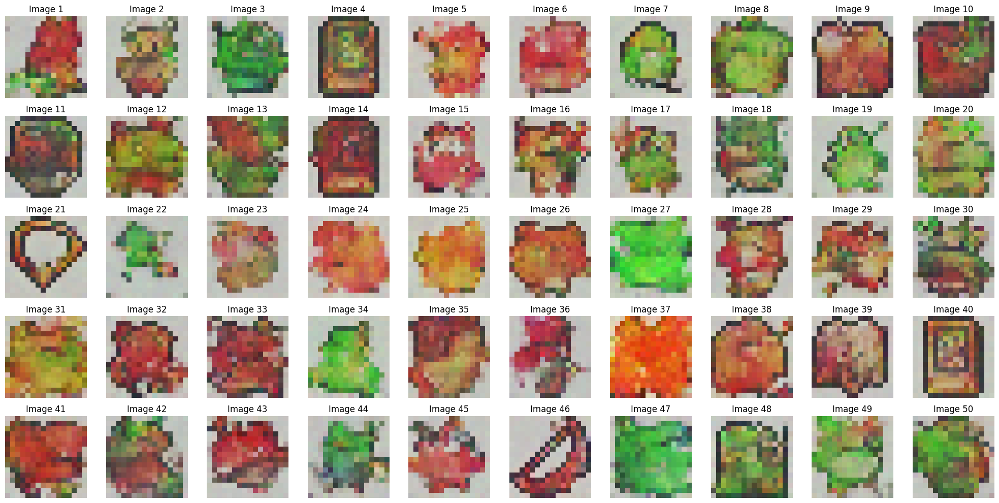

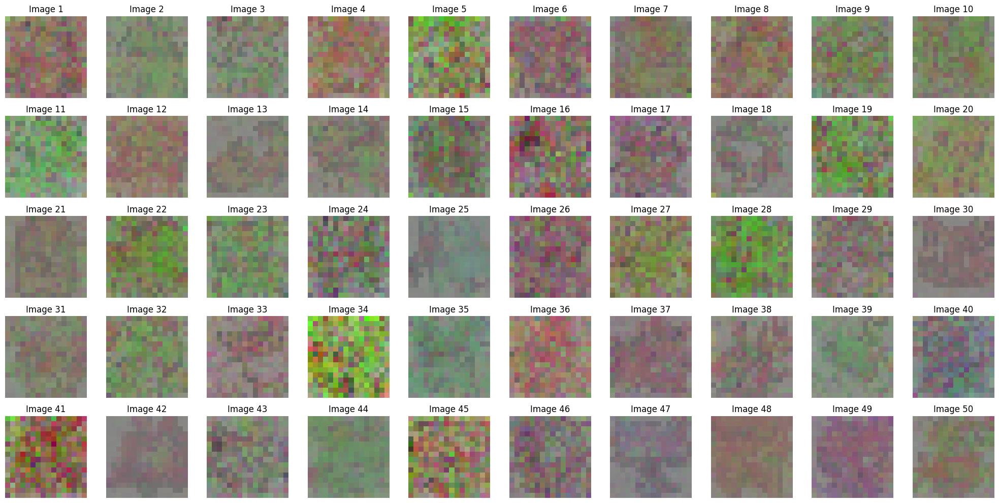

100%|██████████| 1/1 [00:00<00:00,  3.50it/s]


FID Score for DDPM at Epoch 1: 182.62967455676682


100%|██████████| 1/1 [00:00<00:00,  3.46it/s]


FID Score for DDIM at Epoch 1: 351.7561199204729

Epoch 2/40


Training: 100%|██████████| 716/716 [00:27<00:00, 26.27it/s]


Average Loss: 0.072908


DDPM Sampling: 1000it [00:06, 152.12it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 15it [00:00, 143.58it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step
Step 475/500: Deterministic step
Step 474/500: Deterministic step
Step 473/500: Deterministic step
Step 472/500: Deterministic step


DDIM Sampling: 45it [00:00, 141.51it/s]

Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step
Step 450/500: Deterministic step
Step 449/500: Deterministic step
Step 448/500: Deterministic step
Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step


DDIM Sampling: 75it [00:00, 141.95it/s]

Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step
Step 422/500: Deterministic step
Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step


DDIM Sampling: 104it [00:00, 137.14it/s]

Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step
Step 396/500: Deterministic step
Step 395/500: Deterministic step
Step 394/500: Deterministic step
Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step


DDIM Sampling: 133it [00:00, 137.13it/s]

Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step
Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step


DDIM Sampling: 161it [00:01, 137.37it/s]

Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step


DDIM Sampling: 190it [00:01, 140.34it/s]

Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step


DDIM Sampling: 218it [00:01, 124.27it/s]

Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step

DDIM Sampling: 231it [00:01, 116.84it/s]


Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step


DDIM Sampling: 256it [00:01, 116.48it/s]

Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step
Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step


DDIM Sampling: 282it [00:02, 119.82it/s]

Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step
Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step


DDIM Sampling: 309it [00:02, 123.95it/s]

Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step
Step 190/500: Deterministic step
Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step

DDIM Sampling: 337it [00:02, 128.27it/s]


Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step


DDIM Sampling: 363it [00:02, 124.16it/s]

Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step


DDIM Sampling: 388it [00:03, 117.61it/s]

Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step


DDIM Sampling: 413it [00:03, 118.19it/s]

Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step


DDIM Sampling: 437it [00:03, 116.06it/s]

Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step


DDIM Sampling: 462it [00:03, 118.23it/s]

Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step


DDIM Sampling: 486it [00:03, 108.95it/s]

Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step


DDIM Sampling: 500it [00:04, 123.89it/s]


Step 13/500: Deterministic step
Step 12/500: Deterministic step
Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


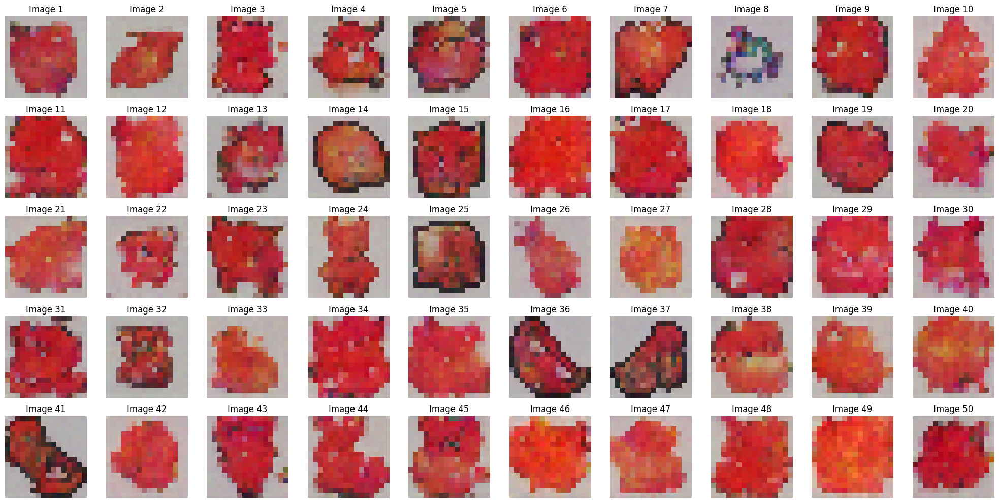

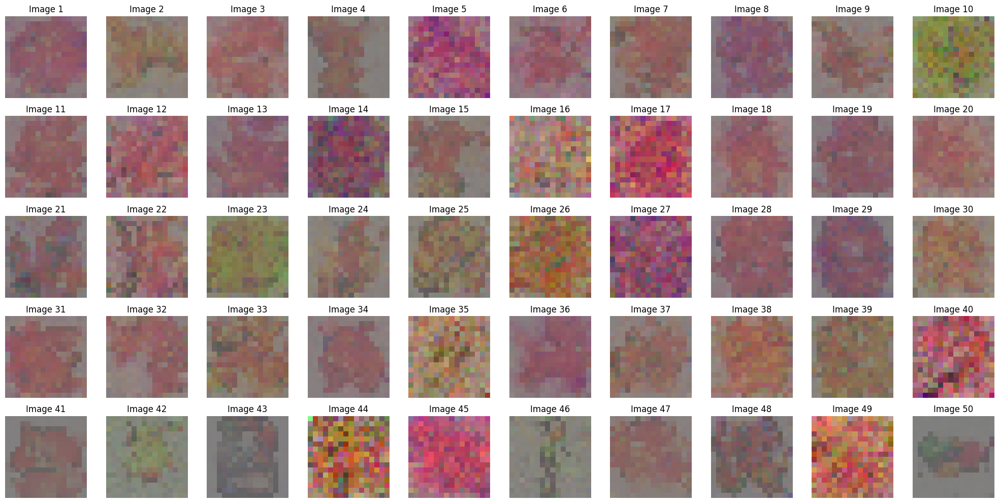

100%|██████████| 1/1 [00:00<00:00,  3.48it/s]


FID Score for DDPM at Epoch 2: 240.6580348072316


100%|██████████| 1/1 [00:00<00:00,  3.48it/s]


FID Score for DDIM at Epoch 2: 407.2824125748007

Epoch 3/40


Training: 100%|██████████| 716/716 [00:27<00:00, 25.80it/s]


Average Loss: 0.068716


DDPM Sampling: 1000it [00:06, 157.37it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 14it [00:00, 138.88it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step
Step 475/500: Deterministic step


DDIM Sampling: 28it [00:00, 132.86it/s]

Step 474/500: Deterministic step
Step 473/500: Deterministic step


DDIM Sampling: 42it [00:00, 135.84it/s]

Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step
Step 450/500: Deterministic step
Step 449/500: Deterministic step
Step 448/500: Deterministic step
Step 447/500: Deterministic step
Step 446/500: Deterministic step


DDIM Sampling: 56it [00:00, 135.88it/s]

Step 445/500: Deterministic step


DDIM Sampling: 70it [00:00, 135.73it/s]

Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step
Step 422/500: Deterministic step
Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step


DDIM Sampling: 84it [00:00, 136.41it/s]

Step 417/500: Deterministic step
Step 416/500: Deterministic step


DDIM Sampling: 98it [00:00, 137.46it/s]

Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step
Step 396/500: Deterministic step
Step 395/500: Deterministic step
Step 394/500: Deterministic step
Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step


DDIM Sampling: 113it [00:00, 138.69it/s]

Step 388/500: Deterministic step
Step 387/500: Deterministic step


DDIM Sampling: 127it [00:00, 134.79it/s]

Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step
Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step


DDIM Sampling: 141it [00:01, 135.74it/s]

Step 360/500: Deterministic step


DDIM Sampling: 155it [00:01, 135.55it/s]

Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step


DDIM Sampling: 183it [00:01, 134.11it/s]

Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step


DDIM Sampling: 213it [00:01, 136.44it/s]

Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step


DDIM Sampling: 242it [00:01, 138.34it/s]

Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step


DDIM Sampling: 270it [00:01, 134.90it/s]

Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step
Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step


DDIM Sampling: 298it [00:02, 133.99it/s]

Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step
Step 190/500: Deterministic step


DDIM Sampling: 327it [00:02, 136.21it/s]

Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step


DDIM Sampling: 356it [00:02, 138.56it/s]

Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step


DDIM Sampling: 385it [00:02, 139.80it/s]

Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step


DDIM Sampling: 413it [00:03, 135.46it/s]

Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step


DDIM Sampling: 441it [00:03, 134.25it/s]

Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step


DDIM Sampling: 470it [00:03, 136.79it/s]

Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step


DDIM Sampling: 500it [00:03, 136.11it/s]

Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step
Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


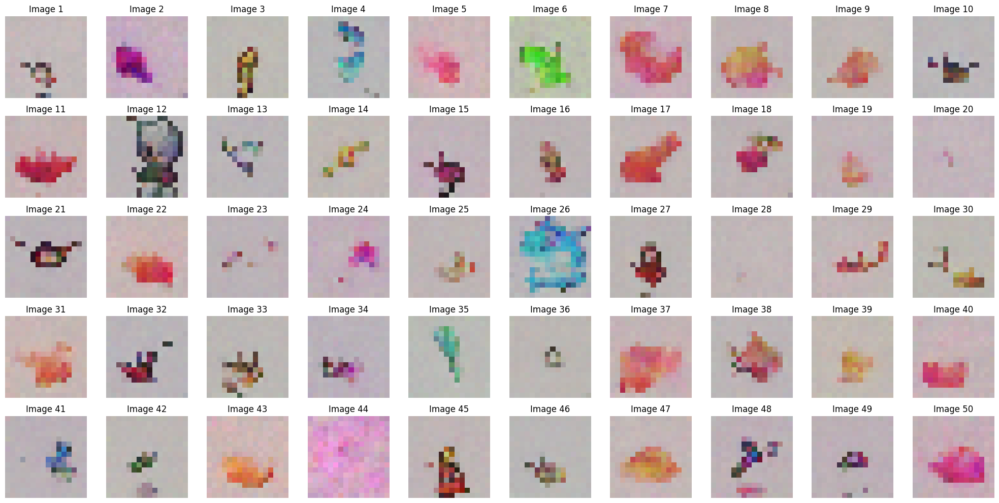

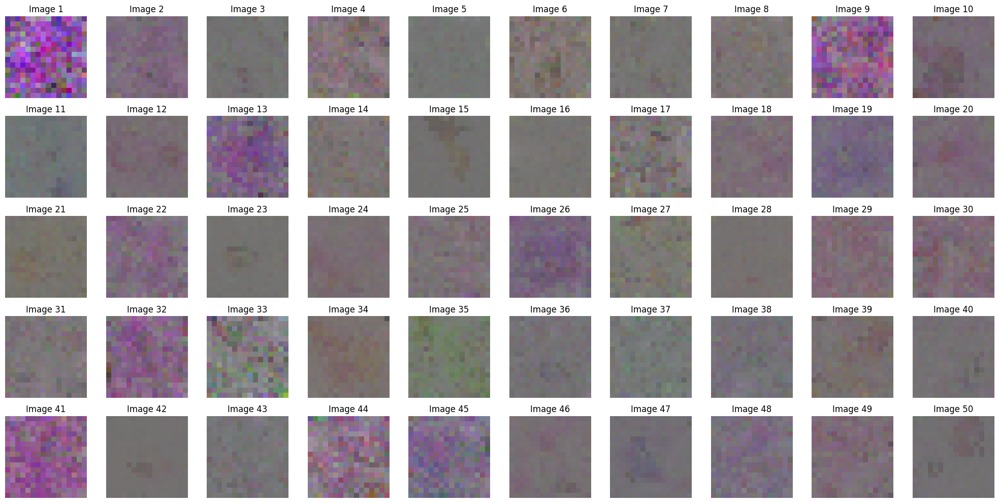

100%|██████████| 1/1 [00:00<00:00,  3.43it/s]


FID Score for DDPM at Epoch 3: 291.29619348536767


100%|██████████| 1/1 [00:00<00:00,  3.50it/s]


FID Score for DDIM at Epoch 3: 408.3795422722281

Epoch 4/40


Training: 100%|██████████| 716/716 [00:27<00:00, 25.63it/s]


Average Loss: 0.065715


DDPM Sampling: 1000it [00:06, 147.42it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 14it [00:00, 139.83it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step
Step 475/500: Deterministic step
Step 474/500: Deterministic step


DDIM Sampling: 28it [00:00, 137.81it/s]

Step 473/500: Deterministic step


DDIM Sampling: 42it [00:00, 136.62it/s]

Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step
Step 450/500: Deterministic step
Step 449/500: Deterministic step
Step 448/500: Deterministic step
Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step


DDIM Sampling: 70it [00:00, 135.64it/s]

Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step
Step 422/500: Deterministic step
Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step


DDIM Sampling: 84it [00:00, 136.36it/s]

Step 417/500: Deterministic step


DDIM Sampling: 98it [00:00, 135.91it/s]

Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step
Step 396/500: Deterministic step
Step 395/500: Deterministic step
Step 394/500: Deterministic step
Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step

DDIM Sampling: 128it [00:00, 137.26it/s]


Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step
Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step


DDIM Sampling: 156it [00:01, 134.32it/s]

Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step


DDIM Sampling: 184it [00:01, 133.53it/s]

Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step


DDIM Sampling: 213it [00:01, 136.88it/s]

Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step


DDIM Sampling: 243it [00:01, 139.39it/s]

Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step


DDIM Sampling: 271it [00:01, 137.45it/s]

Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step
Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step


DDIM Sampling: 300it [00:02, 139.51it/s]

Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step
Step 190/500: Deterministic step
Step 189/500: Deterministic step


DDIM Sampling: 328it [00:02, 137.11it/s]

Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step


DDIM Sampling: 357it [00:02, 138.20it/s]

Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step


DDIM Sampling: 385it [00:02, 137.65it/s]

Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step


DDIM Sampling: 413it [00:03, 135.92it/s]

Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step


DDIM Sampling: 441it [00:03, 136.83it/s]

Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step


DDIM Sampling: 470it [00:03, 135.13it/s]

Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step


DDIM Sampling: 500it [00:03, 136.36it/s]

Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step
Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


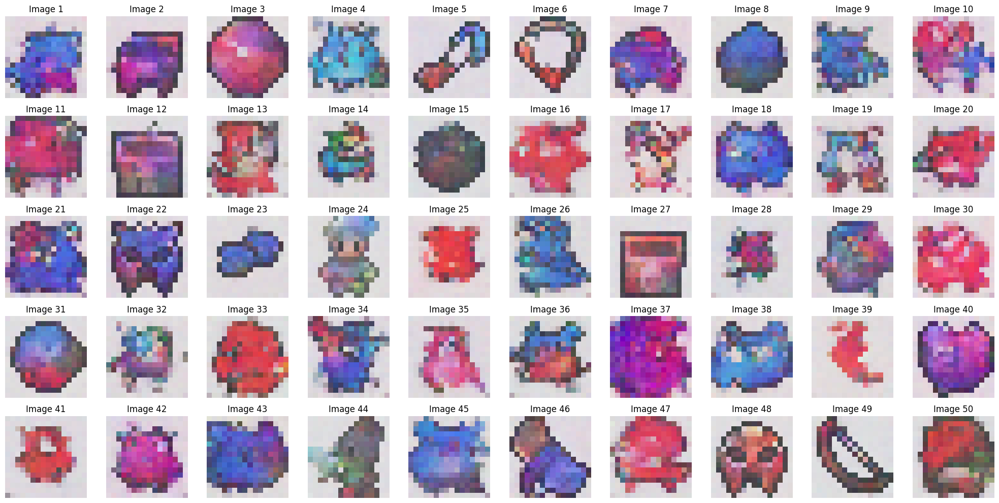

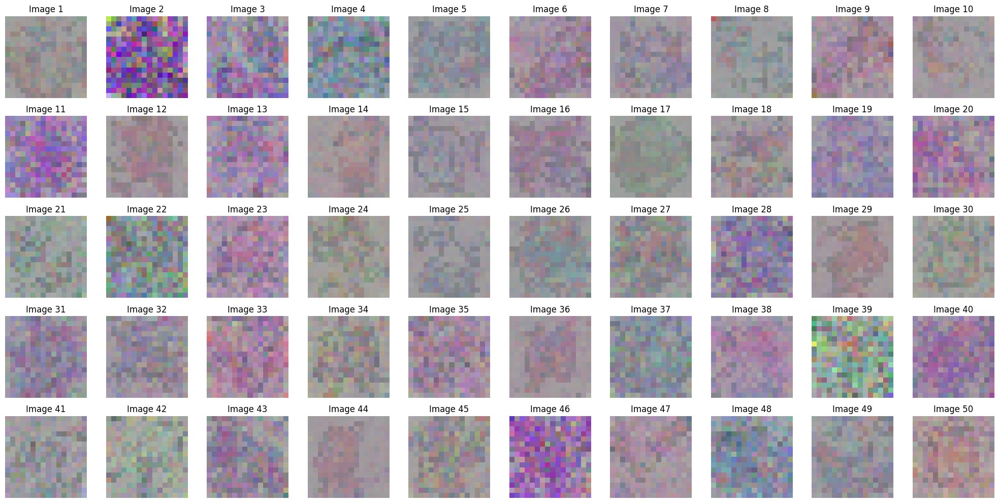

100%|██████████| 1/1 [00:00<00:00,  3.43it/s]


FID Score for DDPM at Epoch 4: 164.38633553417347


100%|██████████| 1/1 [00:00<00:00,  3.30it/s]


FID Score for DDIM at Epoch 4: 348.6420576776816

Epoch 5/40


Training: 100%|██████████| 716/716 [00:29<00:00, 24.32it/s]


Average Loss: 0.063137


DDPM Sampling: 1000it [00:06, 149.36it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 13it [00:00, 124.59it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step
Step 475/500: Deterministic step
Step 474/500: Deterministic step


DDIM Sampling: 42it [00:00, 134.20it/s]

Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step
Step 450/500: Deterministic step
Step 449/500: Deterministic step
Step 448/500: Deterministic step
Step 447/500: Deterministic step
Step 446/500: Deterministic step


DDIM Sampling: 70it [00:00, 135.77it/s]

Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step
Step 422/500: Deterministic step
Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step


DDIM Sampling: 84it [00:00, 135.93it/s]

Step 417/500: Deterministic step


DDIM Sampling: 98it [00:00, 136.69it/s]

Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step
Step 396/500: Deterministic step
Step 395/500: Deterministic step
Step 394/500: Deterministic step
Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step


DDIM Sampling: 112it [00:00, 137.23it/s]

Step 389/500: Deterministic step


DDIM Sampling: 126it [00:00, 133.85it/s]

Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step
Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step


DDIM Sampling: 154it [00:01, 132.06it/s]

Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step


DDIM Sampling: 183it [00:01, 136.23it/s]

Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step


DDIM Sampling: 212it [00:01, 137.65it/s]

Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step


DDIM Sampling: 241it [00:01, 140.11it/s]

Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step


DDIM Sampling: 270it [00:01, 136.67it/s]

Step 247/500: Deterministic step
Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step
Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step


DDIM Sampling: 299it [00:02, 136.44it/s]

Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step
Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step


DDIM Sampling: 328it [00:02, 136.75it/s]

Step 192/500: Deterministic step
Step 191/500: Deterministic step
Step 190/500: Deterministic step
Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step


DDIM Sampling: 356it [00:02, 137.09it/s]

Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step


DDIM Sampling: 385it [00:02, 138.64it/s]

Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step


DDIM Sampling: 413it [00:03, 133.14it/s]

Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step


DDIM Sampling: 442it [00:03, 132.02it/s]

Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step


DDIM Sampling: 472it [00:03, 136.55it/s]

Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step


DDIM Sampling: 500it [00:03, 135.42it/s]

Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step
Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


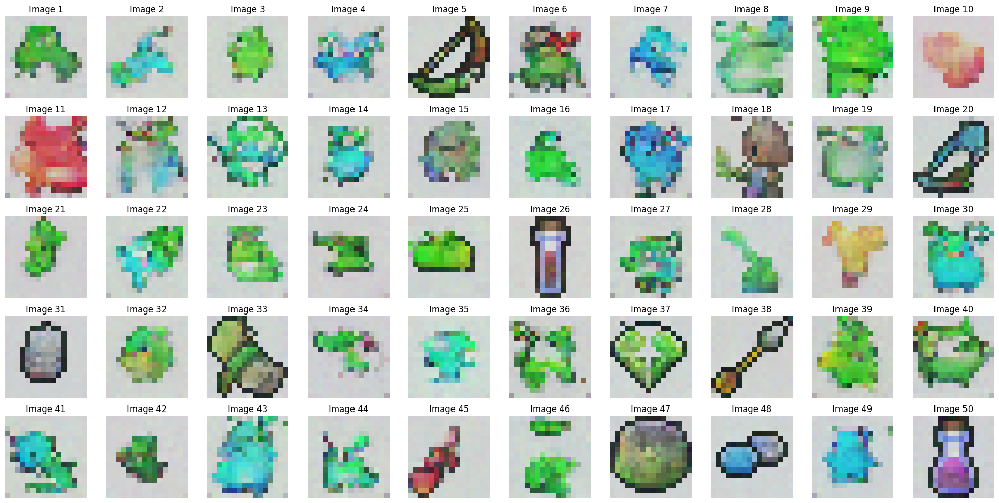

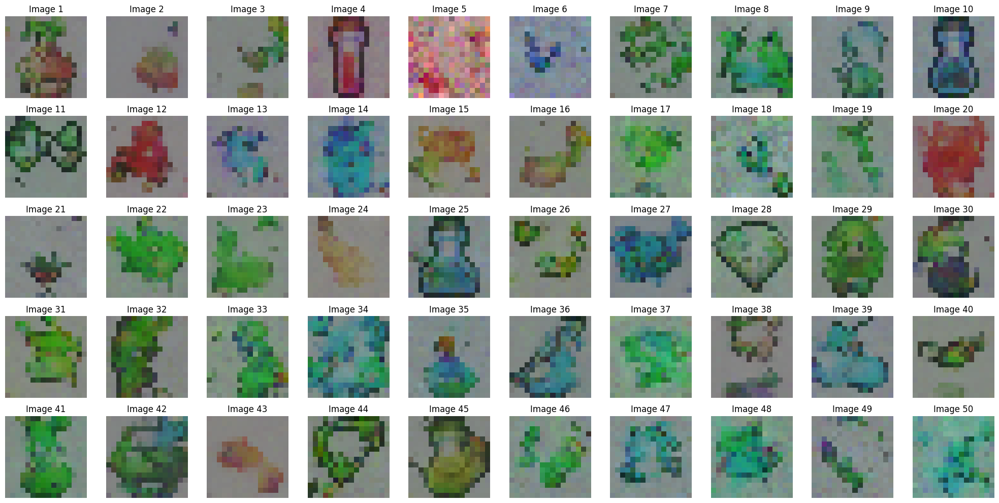

100%|██████████| 1/1 [00:00<00:00,  3.29it/s]


FID Score for DDPM at Epoch 5: 190.3007808300565


100%|██████████| 1/1 [00:00<00:00,  3.41it/s]


FID Score for DDIM at Epoch 5: 240.54095486046003

Epoch 6/40


Training: 100%|██████████| 716/716 [00:28<00:00, 25.07it/s]


Average Loss: 0.060134


DDPM Sampling: 1000it [00:06, 145.93it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 12it [00:00, 112.63it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step
Step 475/500: Deterministic step


DDIM Sampling: 40it [00:00, 125.55it/s]

Step 474/500: Deterministic step
Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step
Step 450/500: Deterministic step
Step 449/500: Deterministic step
Step 448/500: Deterministic step


DDIM Sampling: 68it [00:00, 131.65it/s]

Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step
Step 422/500: Deterministic step
Step 421/500: Deterministic step


DDIM Sampling: 95it [00:00, 128.77it/s]

Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step
Step 396/500: Deterministic step


DDIM Sampling: 108it [00:00, 128.38it/s]

Step 395/500: Deterministic step
Step 394/500: Deterministic step
Step 393/500: Deterministic step


DDIM Sampling: 121it [00:00, 128.66it/s]

Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step
Step 369/500: Deterministic step


DDIM Sampling: 134it [00:01, 128.60it/s]

Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step

DDIM Sampling: 147it [00:01, 123.05it/s]


Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step

DDIM Sampling: 174it [00:01, 124.64it/s]


Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step

DDIM Sampling: 201it [00:01, 129.40it/s]


Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step


DDIM Sampling: 228it [00:01, 129.43it/s]

Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step


DDIM Sampling: 257it [00:02, 134.08it/s]

Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step
Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step


DDIM Sampling: 285it [00:02, 132.13it/s]

Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step
Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step


DDIM Sampling: 314it [00:02, 132.73it/s]

Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step
Step 190/500: Deterministic step
Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step


DDIM Sampling: 342it [00:02, 134.31it/s]

Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step


DDIM Sampling: 371it [00:02, 137.37it/s]

Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step


DDIM Sampling: 400it [00:03, 138.25it/s]

Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step


DDIM Sampling: 428it [00:03, 134.56it/s]

Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step


DDIM Sampling: 456it [00:03, 134.78it/s]

Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step


DDIM Sampling: 485it [00:03, 136.94it/s]

Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step
Step 11/500: Deterministic step


DDIM Sampling: 500it [00:03, 131.43it/s]


Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


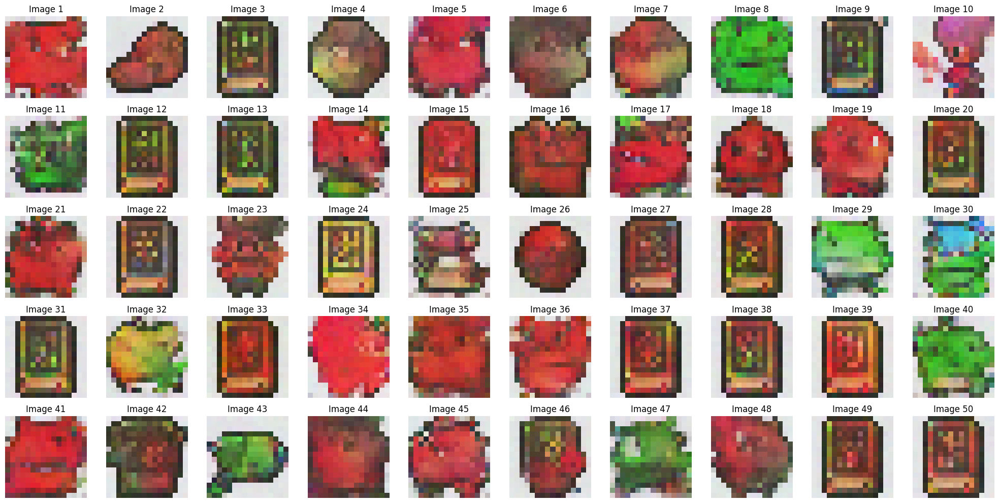

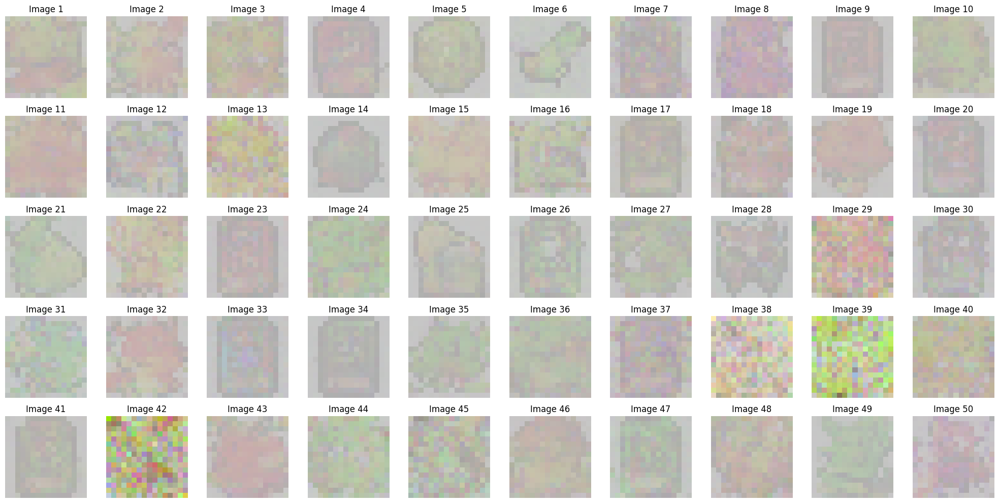

100%|██████████| 1/1 [00:00<00:00,  3.26it/s]


FID Score for DDPM at Epoch 6: 197.85648003395053


100%|██████████| 1/1 [00:00<00:00,  3.30it/s]


FID Score for DDIM at Epoch 6: 245.69150381840993

Epoch 7/40


Training: 100%|██████████| 716/716 [00:29<00:00, 24.56it/s]


Average Loss: 0.059163


DDPM Sampling: 1000it [00:06, 145.03it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 13it [00:00, 124.48it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step


DDIM Sampling: 26it [00:00, 126.84it/s]

Step 475/500: Deterministic step


DDIM Sampling: 40it [00:00, 129.93it/s]

Step 474/500: Deterministic step
Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step
Step 450/500: Deterministic step
Step 449/500: Deterministic step
Step 448/500: Deterministic step
Step 447/500: Deterministic step
Step 446/500: Deterministic step

DDIM Sampling: 69it [00:00, 128.34it/s]


Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step
Step 422/500: Deterministic step


DDIM Sampling: 96it [00:00, 128.81it/s]

Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step
Step 396/500: Deterministic step
Step 395/500: Deterministic step
Step 394/500: Deterministic step

DDIM Sampling: 123it [00:00, 131.94it/s]


Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step
Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step


DDIM Sampling: 151it [00:01, 132.45it/s]

Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step


DDIM Sampling: 180it [00:01, 136.54it/s]

Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step


DDIM Sampling: 208it [00:01, 128.00it/s]

Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step


DDIM Sampling: 236it [00:01, 131.60it/s]

Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step

DDIM Sampling: 265it [00:02, 131.95it/s]


Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step
Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step


DDIM Sampling: 293it [00:02, 133.20it/s]

Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step
Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step


DDIM Sampling: 322it [00:02, 135.31it/s]

Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step
Step 190/500: Deterministic step
Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step


DDIM Sampling: 351it [00:02, 132.99it/s]

Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step


DDIM Sampling: 379it [00:02, 133.95it/s]

Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step


DDIM Sampling: 407it [00:03, 135.60it/s]

Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step
Step 93/500: Deterministic step

DDIM Sampling: 435it [00:03, 135.24it/s]


Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step


DDIM Sampling: 463it [00:03, 135.36it/s]

Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step


DDIM Sampling: 477it [00:03, 127.63it/s]

Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step


DDIM Sampling: 500it [00:03, 131.63it/s]


Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


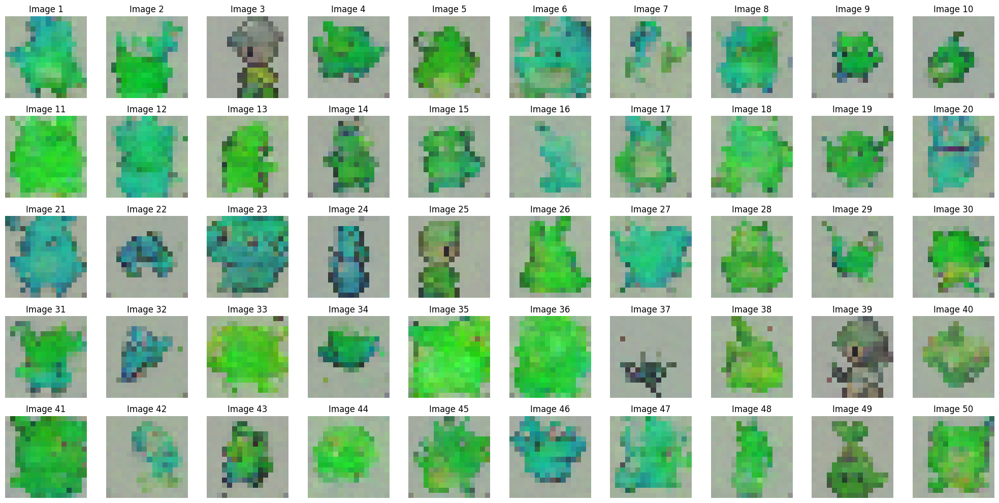

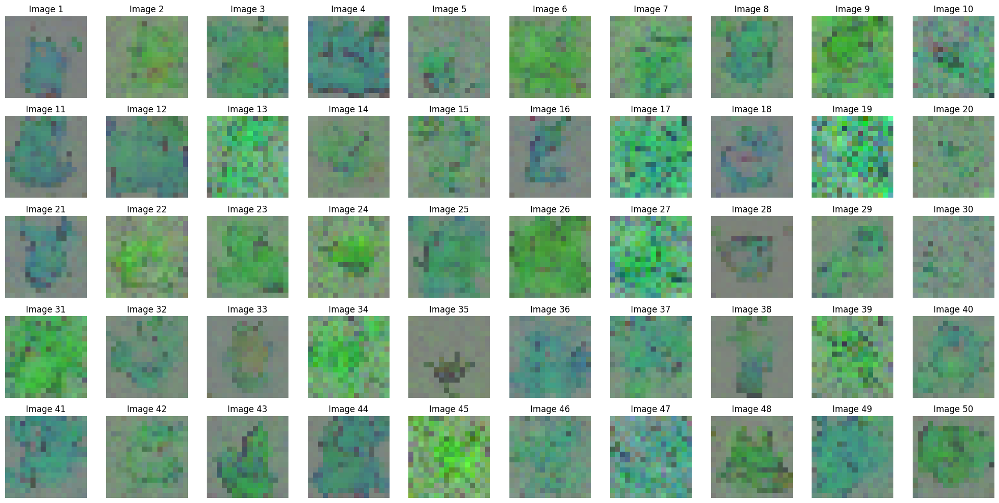

100%|██████████| 1/1 [00:00<00:00,  2.78it/s]


FID Score for DDPM at Epoch 7: 251.21648641036273


100%|██████████| 1/1 [00:00<00:00,  3.20it/s]


FID Score for DDIM at Epoch 7: 433.57925160043555

Epoch 8/40


Training: 100%|██████████| 716/716 [00:29<00:00, 24.46it/s]


Average Loss: 0.056616


DDPM Sampling: 1000it [00:06, 152.80it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 10it [00:00, 99.49it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step


DDIM Sampling: 21it [00:00, 104.24it/s]

Step 480/500: Deterministic step


DDIM Sampling: 34it [00:00, 115.31it/s]

Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step
Step 475/500: Deterministic step
Step 474/500: Deterministic step
Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step

DDIM Sampling: 47it [00:00, 116.96it/s]


Step 454/500: Deterministic step


DDIM Sampling: 60it [00:00, 119.72it/s]

Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step
Step 450/500: Deterministic step
Step 449/500: Deterministic step
Step 448/500: Deterministic step
Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step


DDIM Sampling: 73it [00:00, 121.71it/s]

Step 429/500: Deterministic step
Step 428/500: Deterministic step


DDIM Sampling: 86it [00:00, 115.34it/s]

Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step
Step 422/500: Deterministic step
Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step


DDIM Sampling: 112it [00:00, 121.58it/s]

Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step
Step 396/500: Deterministic step
Step 395/500: Deterministic step
Step 394/500: Deterministic step
Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step


DDIM Sampling: 139it [00:01, 124.15it/s]

Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step
Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step


DDIM Sampling: 164it [00:01, 115.62it/s]

Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step


DDIM Sampling: 176it [00:01, 110.99it/s]

Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step


DDIM Sampling: 188it [00:01, 108.12it/s]

Step 313/500: Deterministic step
Step 312/500: Deterministic step


DDIM Sampling: 199it [00:01, 100.41it/s]

Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step

DDIM Sampling: 222it [00:01, 104.71it/s]


Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step


DDIM Sampling: 244it [00:02, 101.77it/s]

Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step


DDIM Sampling: 266it [00:02, 103.14it/s]

Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step
Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step


DDIM Sampling: 287it [00:02, 98.01it/s]

Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step
Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step

DDIM Sampling: 297it [00:02, 95.17it/s]


Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step

DDIM Sampling: 307it [00:02, 95.76it/s]


Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step


DDIM Sampling: 319it [00:02, 99.87it/s]

Step 190/500: Deterministic step
Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step


DDIM Sampling: 330it [00:03, 100.31it/s]

Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step


DDIM Sampling: 341it [00:03, 101.91it/s]

Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step


DDIM Sampling: 355it [00:03, 110.91it/s]

Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step


DDIM Sampling: 369it [00:03, 118.34it/s]

Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step


DDIM Sampling: 383it [00:03, 122.40it/s]

Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step


DDIM Sampling: 397it [00:03, 126.23it/s]

Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step


DDIM Sampling: 410it [00:03, 125.49it/s]

Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step


DDIM Sampling: 423it [00:03, 126.13it/s]

Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step


DDIM Sampling: 436it [00:03, 127.17it/s]

Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step


DDIM Sampling: 450it [00:04, 129.40it/s]

Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step


DDIM Sampling: 464it [00:04, 130.81it/s]

Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step


DDIM Sampling: 478it [00:04, 131.68it/s]

Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step


DDIM Sampling: 492it [00:04, 132.42it/s]

Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step


DDIM Sampling: 500it [00:04, 114.00it/s]


Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


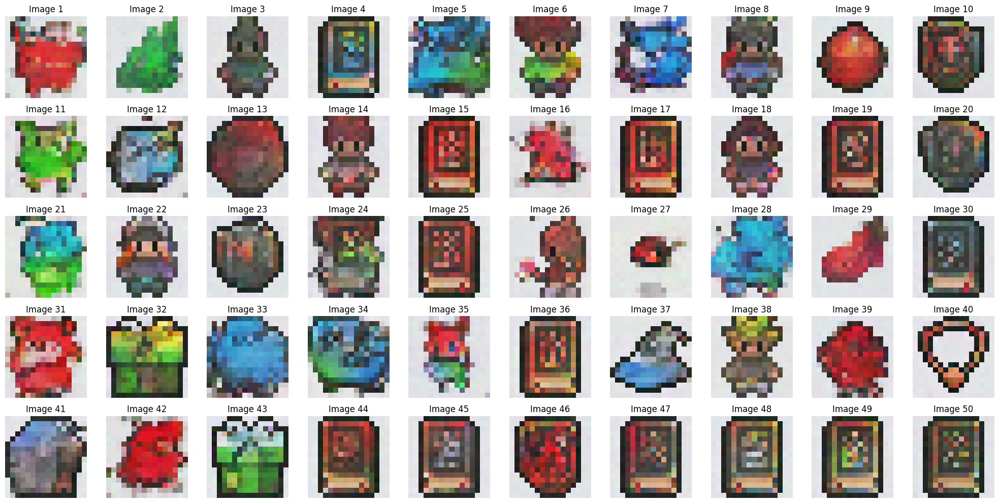

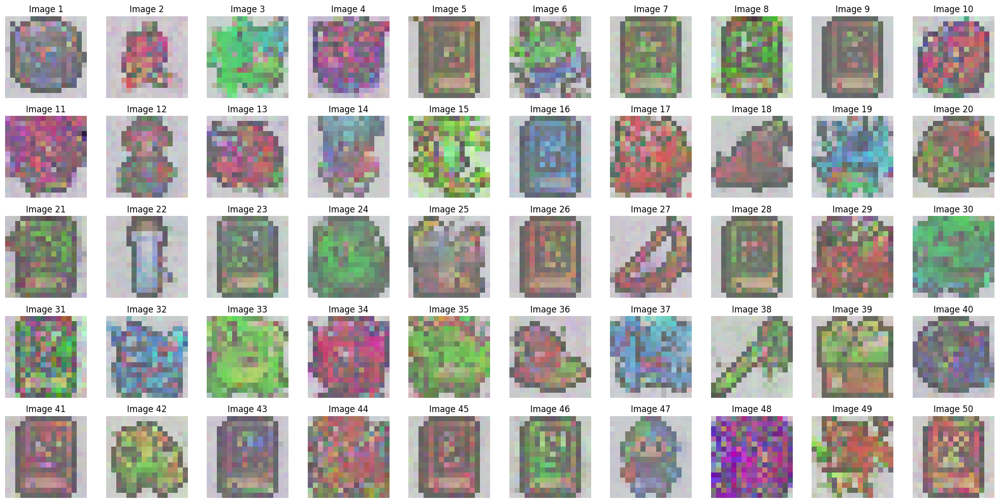

100%|██████████| 1/1 [00:00<00:00,  3.18it/s]


FID Score for DDPM at Epoch 8: 142.458536727171


100%|██████████| 1/1 [00:00<00:00,  3.00it/s]


FID Score for DDIM at Epoch 8: 194.20453875845465

Epoch 9/40


Training: 100%|██████████| 716/716 [00:29<00:00, 24.51it/s]


Average Loss: 0.055062


DDPM Sampling: 1000it [00:06, 154.83it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 13it [00:00, 122.08it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step


DDIM Sampling: 40it [00:00, 127.58it/s]

Step 475/500: Deterministic step
Step 474/500: Deterministic step
Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step
Step 450/500: Deterministic step
Step 449/500: Deterministic step
Step 448/500: Deterministic step


DDIM Sampling: 68it [00:00, 131.42it/s]

Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step
Step 422/500: Deterministic step
Step 421/500: Deterministic step


DDIM Sampling: 96it [00:00, 133.45it/s]

Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step
Step 396/500: Deterministic step
Step 395/500: Deterministic step
Step 394/500: Deterministic step
Step 393/500: Deterministic step


DDIM Sampling: 124it [00:00, 135.09it/s]

Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step
Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step


DDIM Sampling: 152it [00:01, 126.94it/s]

Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step


DDIM Sampling: 179it [00:01, 128.43it/s]

Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step


DDIM Sampling: 208it [00:01, 133.74it/s]

Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step


DDIM Sampling: 237it [00:01, 136.12it/s]

Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step


DDIM Sampling: 265it [00:02, 133.62it/s]

Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step
Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step


DDIM Sampling: 279it [00:02, 116.44it/s]

Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step
Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step


DDIM Sampling: 304it [00:02, 112.48it/s]

Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step
Step 190/500: Deterministic step
Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step


DDIM Sampling: 329it [00:02, 116.91it/s]

Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step


DDIM Sampling: 355it [00:02, 121.06it/s]

Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step


DDIM Sampling: 381it [00:03, 122.63it/s]

Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step


DDIM Sampling: 408it [00:03, 120.22it/s]

Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step


DDIM Sampling: 435it [00:03, 119.78it/s]

Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step


DDIM Sampling: 463it [00:03, 126.52it/s]

Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step


DDIM Sampling: 489it [00:03, 124.40it/s]

Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step
Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step


DDIM Sampling: 500it [00:04, 124.91it/s]


Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


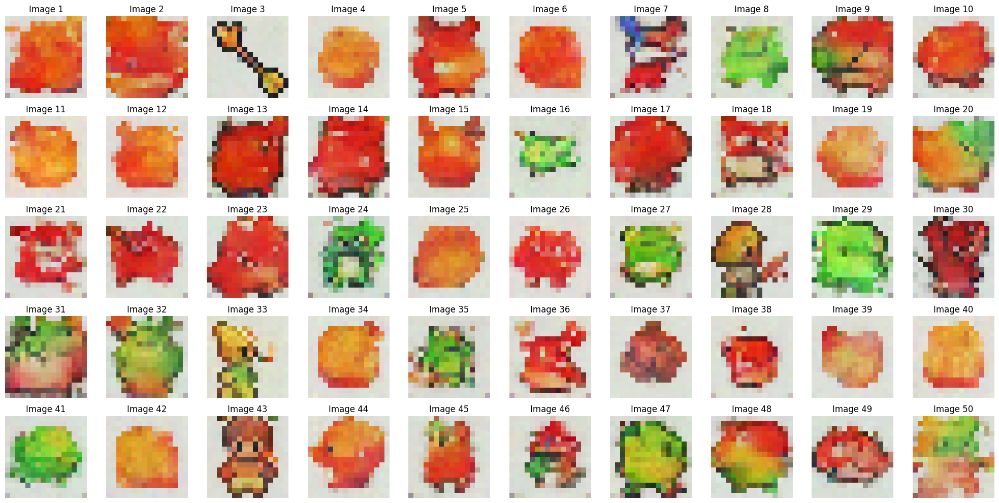

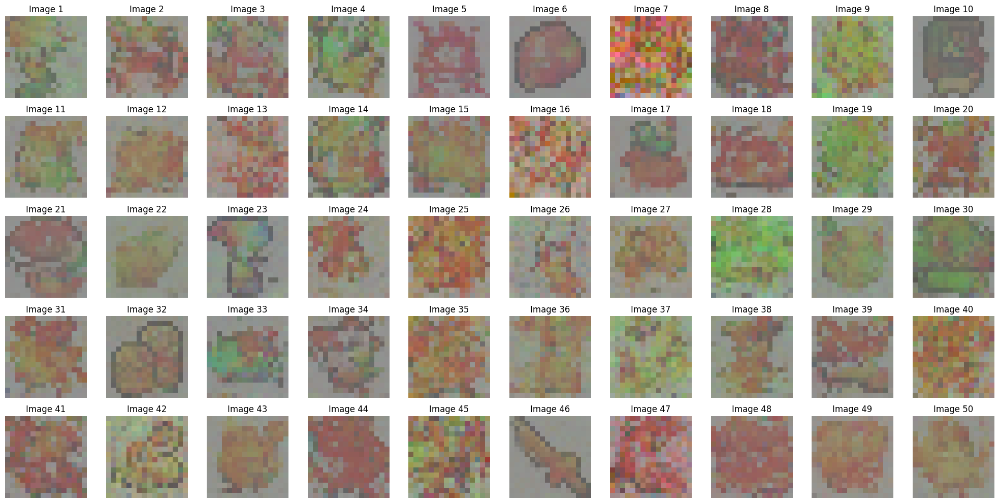

100%|██████████| 1/1 [00:00<00:00,  3.04it/s]


FID Score for DDPM at Epoch 9: 217.039407617361


100%|██████████| 1/1 [00:00<00:00,  3.04it/s]


FID Score for DDIM at Epoch 9: 316.2858187102514

Epoch 10/40


Training: 100%|██████████| 716/716 [00:30<00:00, 23.71it/s]


Average Loss: 0.054771


DDPM Sampling: 1000it [00:06, 153.66it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 13it [00:00, 129.84it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step


DDIM Sampling: 27it [00:00, 133.25it/s]

Step 475/500: Deterministic step
Step 474/500: Deterministic step


DDIM Sampling: 41it [00:00, 122.77it/s]

Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step
Step 450/500: Deterministic step
Step 449/500: Deterministic step


DDIM Sampling: 69it [00:00, 128.76it/s]

Step 448/500: Deterministic step
Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step
Step 422/500: Deterministic step


DDIM Sampling: 96it [00:00, 131.54it/s]

Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step
Step 396/500: Deterministic step
Step 395/500: Deterministic step


DDIM Sampling: 124it [00:00, 132.43it/s]

Step 394/500: Deterministic step
Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step
Step 369/500: Deterministic step


DDIM Sampling: 152it [00:01, 128.89it/s]

Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step


DDIM Sampling: 178it [00:01, 126.62it/s]

Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step


DDIM Sampling: 205it [00:01, 129.18it/s]

Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step


DDIM Sampling: 232it [00:01, 131.53it/s]

Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step


DDIM Sampling: 260it [00:02, 129.96it/s]

Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step
Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step


DDIM Sampling: 289it [00:02, 132.00it/s]

Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step
Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step


DDIM Sampling: 317it [00:02, 129.99it/s]

Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step
Step 190/500: Deterministic step
Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step


DDIM Sampling: 331it [00:02, 127.71it/s]

Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step


DDIM Sampling: 345it [00:02, 129.59it/s]

Step 156/500: Deterministic step


DDIM Sampling: 358it [00:02, 129.13it/s]

Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step


DDIM Sampling: 372it [00:02, 132.25it/s]

Step 129/500: Deterministic step


DDIM Sampling: 386it [00:02, 128.68it/s]

Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step


DDIM Sampling: 413it [00:03, 129.68it/s]

Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step

DDIM Sampling: 441it [00:03, 127.50it/s]


Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step


DDIM Sampling: 468it [00:03, 127.29it/s]

Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step


DDIM Sampling: 493it [00:03, 109.50it/s]

Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step
Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step


DDIM Sampling: 500it [00:03, 125.42it/s]


Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


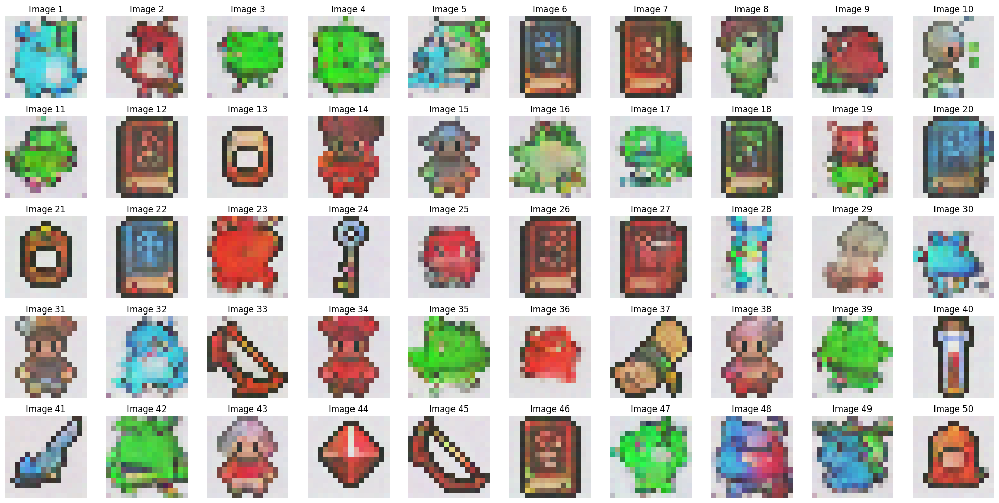

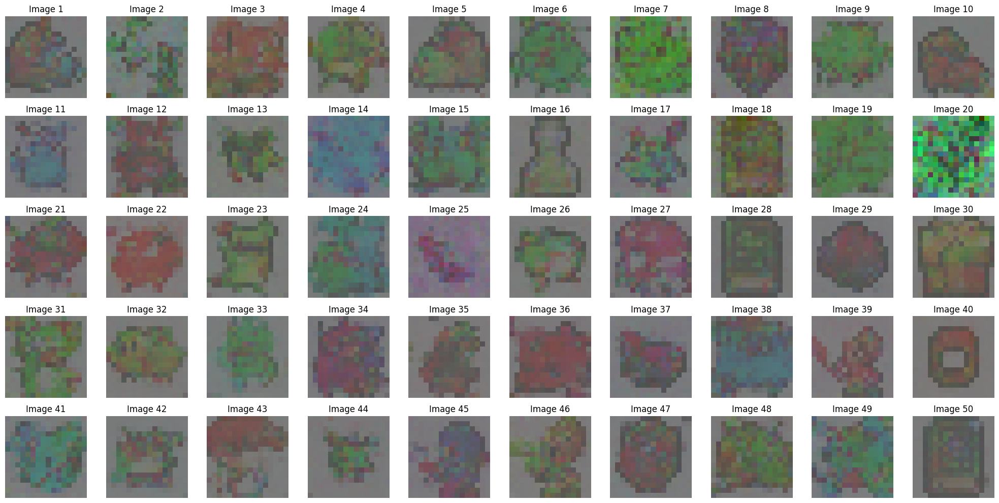

100%|██████████| 1/1 [00:00<00:00,  3.06it/s]


FID Score for DDPM at Epoch 10: 139.64121155967075


100%|██████████| 1/1 [00:00<00:00,  3.13it/s]


FID Score for DDIM at Epoch 10: 199.80793335814963

Epoch 11/40


Training: 100%|██████████| 716/716 [00:30<00:00, 23.67it/s]


Average Loss: 0.052895


DDPM Sampling: 1000it [00:06, 148.22it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 13it [00:00, 129.36it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step


DDIM Sampling: 26it [00:00, 129.48it/s]

Step 475/500: Deterministic step


DDIM Sampling: 39it [00:00, 128.71it/s]

Step 474/500: Deterministic step
Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step
Step 450/500: Deterministic step


DDIM Sampling: 52it [00:00, 126.52it/s]

Step 449/500: Deterministic step


DDIM Sampling: 66it [00:00, 128.91it/s]

Step 448/500: Deterministic step
Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step
Step 422/500: Deterministic step
Step 421/500: Deterministic step


DDIM Sampling: 94it [00:00, 129.55it/s]

Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step
Step 396/500: Deterministic step
Step 395/500: Deterministic step
Step 394/500: Deterministic step


DDIM Sampling: 122it [00:00, 130.67it/s]

Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step
Step 369/500: Deterministic step
Step 368/500: Deterministic step


DDIM Sampling: 149it [00:01, 127.83it/s]

Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step


DDIM Sampling: 176it [00:01, 128.96it/s]

Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step


DDIM Sampling: 203it [00:01, 131.05it/s]

Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step


DDIM Sampling: 231it [00:01, 133.19it/s]

Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step


DDIM Sampling: 259it [00:01, 131.88it/s]

Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step
Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step


DDIM Sampling: 287it [00:02, 131.57it/s]

Step 231/500: Deterministic step
Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step
Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step


DDIM Sampling: 315it [00:02, 130.30it/s]

Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step
Step 190/500: Deterministic step
Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step


DDIM Sampling: 344it [00:02, 133.90it/s]

Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step


DDIM Sampling: 372it [00:02, 134.87it/s]

Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step


DDIM Sampling: 400it [00:03, 133.20it/s]

Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step


DDIM Sampling: 429it [00:03, 132.94it/s]

Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step


DDIM Sampling: 457it [00:03, 132.14it/s]

Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step


DDIM Sampling: 485it [00:03, 133.62it/s]

Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step


DDIM Sampling: 500it [00:03, 131.05it/s]


Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


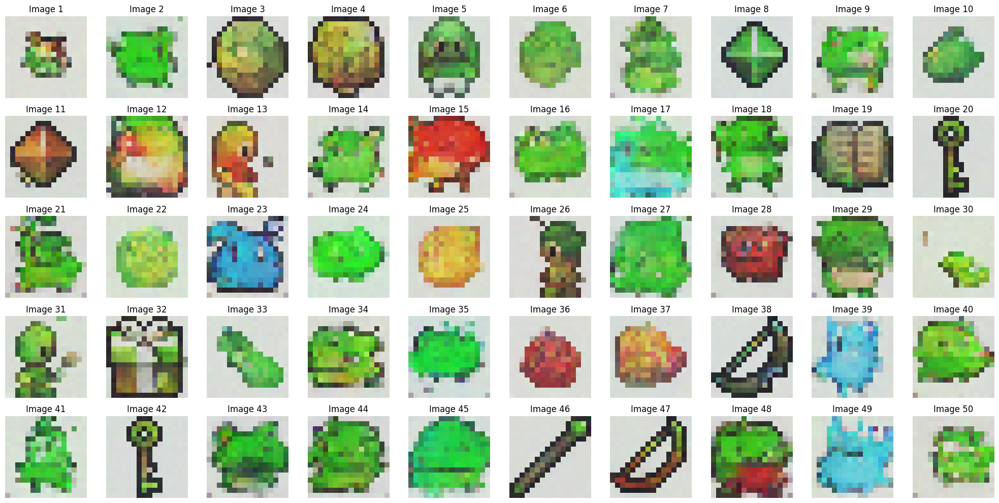

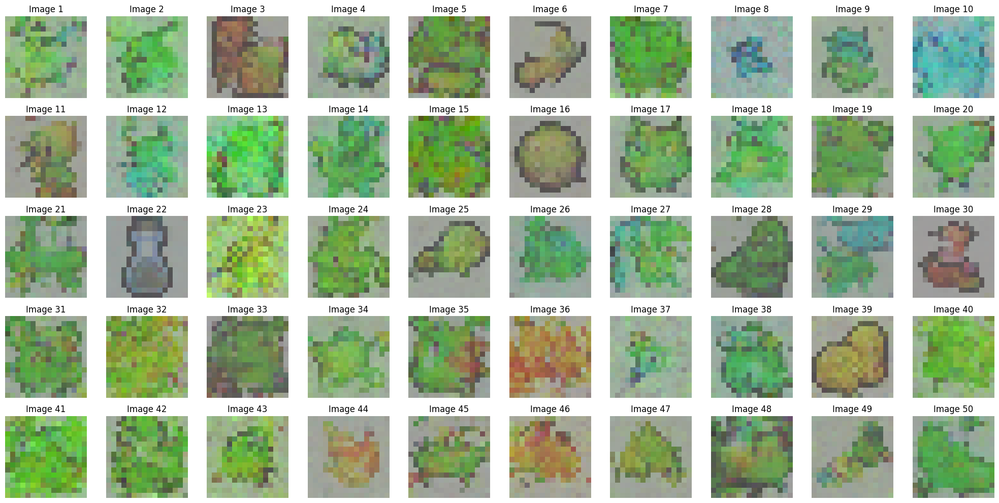

100%|██████████| 1/1 [00:00<00:00,  3.00it/s]


FID Score for DDPM at Epoch 11: 167.84650196513726


100%|██████████| 1/1 [00:00<00:00,  3.18it/s]


FID Score for DDIM at Epoch 11: 291.4239398789727

Epoch 12/40


Training: 100%|██████████| 716/716 [00:30<00:00, 23.47it/s]


Average Loss: 0.050995


DDPM Sampling: 1000it [00:07, 142.82it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 14it [00:00, 130.86it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step
Step 475/500: Deterministic step


DDIM Sampling: 42it [00:00, 128.53it/s]

Step 474/500: Deterministic step
Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step
Step 450/500: Deterministic step


DDIM Sampling: 68it [00:00, 120.50it/s]

Step 449/500: Deterministic step
Step 448/500: Deterministic step
Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step


DDIM Sampling: 95it [00:00, 125.60it/s]

Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step
Step 422/500: Deterministic step
Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step


DDIM Sampling: 122it [00:00, 128.08it/s]

Step 398/500: Deterministic step
Step 397/500: Deterministic step
Step 396/500: Deterministic step
Step 395/500: Deterministic step
Step 394/500: Deterministic step
Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step


DDIM Sampling: 149it [00:01, 129.28it/s]

Step 371/500: Deterministic step
Step 370/500: Deterministic step
Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step


DDIM Sampling: 175it [00:01, 127.17it/s]

Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step

DDIM Sampling: 202it [00:01, 125.60it/s]


Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step


DDIM Sampling: 229it [00:01, 126.68it/s]

Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step


DDIM Sampling: 256it [00:02, 130.68it/s]

Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step


DDIM Sampling: 270it [00:02, 127.93it/s]

Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step


DDIM Sampling: 284it [00:02, 129.47it/s]

Step 217/500: Deterministic step


DDIM Sampling: 297it [00:02, 126.36it/s]

Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step


DDIM Sampling: 323it [00:02, 122.19it/s]

Step 191/500: Deterministic step
Step 190/500: Deterministic step
Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step


DDIM Sampling: 351it [00:02, 126.51it/s]

Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step


DDIM Sampling: 379it [00:02, 130.27it/s]

Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step


DDIM Sampling: 407it [00:03, 131.25it/s]

Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step


DDIM Sampling: 434it [00:03, 128.35it/s]

Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step


DDIM Sampling: 460it [00:03, 125.60it/s]

Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step


DDIM Sampling: 487it [00:03, 129.21it/s]

Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step
Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step


DDIM Sampling: 500it [00:03, 126.86it/s]


Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


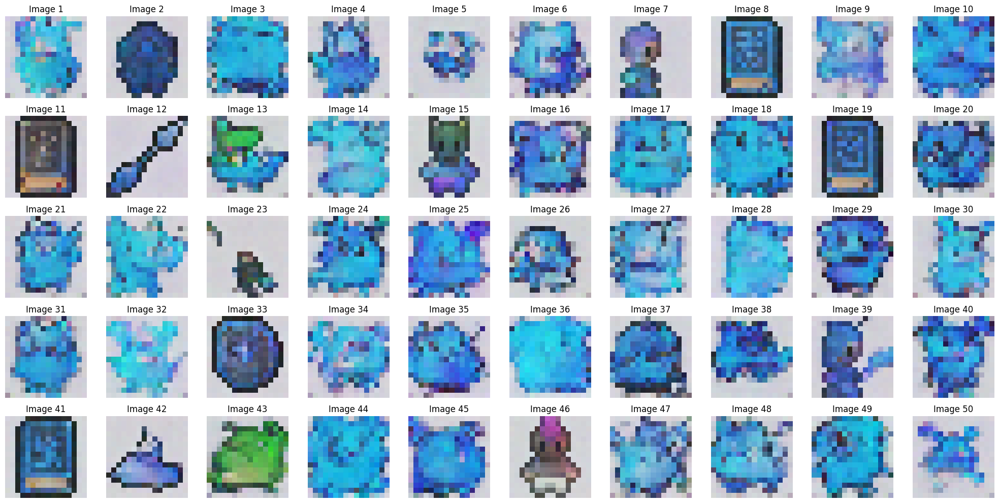

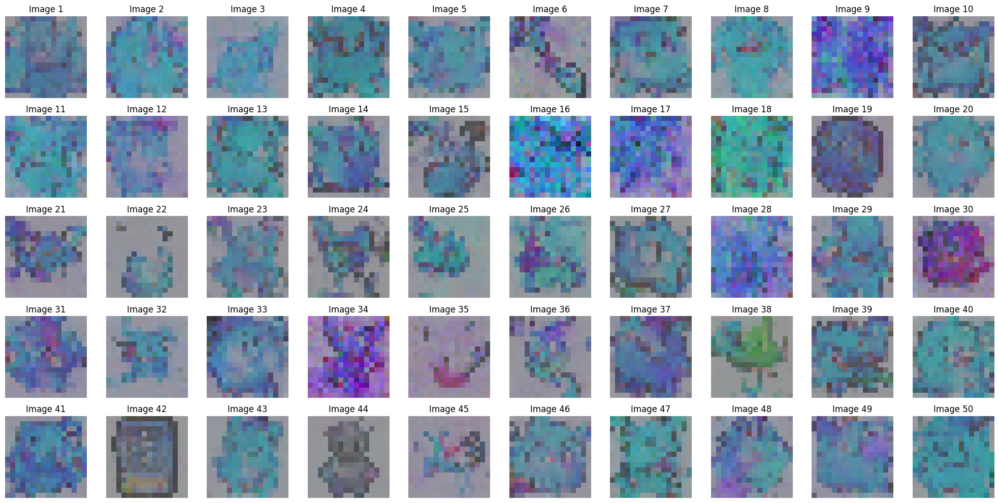

100%|██████████| 1/1 [00:00<00:00,  3.11it/s]


FID Score for DDPM at Epoch 12: 199.11241422732022


100%|██████████| 1/1 [00:00<00:00,  3.04it/s]


FID Score for DDIM at Epoch 12: 287.2517760903651

Epoch 13/40


Training: 100%|██████████| 716/716 [00:30<00:00, 23.39it/s]


Average Loss: 0.050450


DDPM Sampling: 1000it [00:07, 140.63it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 13it [00:00, 128.51it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step

DDIM Sampling: 26it [00:00, 125.56it/s]


Step 475/500: Deterministic step


DDIM Sampling: 39it [00:00, 127.32it/s]

Step 474/500: Deterministic step
Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step


DDIM Sampling: 52it [00:00, 123.47it/s]

Step 451/500: Deterministic step
Step 450/500: Deterministic step
Step 449/500: Deterministic step


DDIM Sampling: 65it [00:00, 125.45it/s]

Step 448/500: Deterministic step
Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step


DDIM Sampling: 78it [00:00, 124.93it/s]

Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step


DDIM Sampling: 91it [00:00, 126.16it/s]

Step 422/500: Deterministic step
Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step

DDIM Sampling: 104it [00:00, 126.99it/s]


Step 398/500: Deterministic step
Step 397/500: Deterministic step
Step 396/500: Deterministic step


DDIM Sampling: 117it [00:00, 121.84it/s]

Step 395/500: Deterministic step
Step 394/500: Deterministic step
Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step


DDIM Sampling: 130it [00:01, 123.47it/s]

Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step


DDIM Sampling: 143it [00:01, 122.33it/s]

Step 370/500: Deterministic step
Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step


DDIM Sampling: 170it [00:01, 119.05it/s]

Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step


DDIM Sampling: 197it [00:01, 124.43it/s]

Step 321/500: Deterministic step
Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step


DDIM Sampling: 224it [00:01, 126.22it/s]

Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step

DDIM Sampling: 250it [00:02, 122.95it/s]


Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step


DDIM Sampling: 263it [00:02, 120.19it/s]

Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step
Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step


DDIM Sampling: 277it [00:02, 123.83it/s]

Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step


DDIM Sampling: 290it [00:02, 118.77it/s]

Step 219/500: Deterministic step
Step 218/500: Deterministic step
Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step


DDIM Sampling: 303it [00:02, 121.08it/s]

Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step


DDIM Sampling: 317it [00:02, 124.28it/s]

Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step
Step 190/500: Deterministic step
Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step


DDIM Sampling: 331it [00:02, 126.97it/s]

Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step


DDIM Sampling: 344it [00:02, 126.29it/s]

Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step


DDIM Sampling: 358it [00:02, 128.59it/s]

Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step

DDIM Sampling: 371it [00:03, 122.81it/s]


Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step


DDIM Sampling: 398it [00:03, 125.22it/s]

Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step


DDIM Sampling: 424it [00:03, 123.50it/s]

Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step


DDIM Sampling: 451it [00:03, 126.23it/s]

Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step


DDIM Sampling: 478it [00:03, 128.85it/s]

Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step


DDIM Sampling: 500it [00:04, 123.94it/s]


Step 13/500: Deterministic step
Step 12/500: Deterministic step
Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


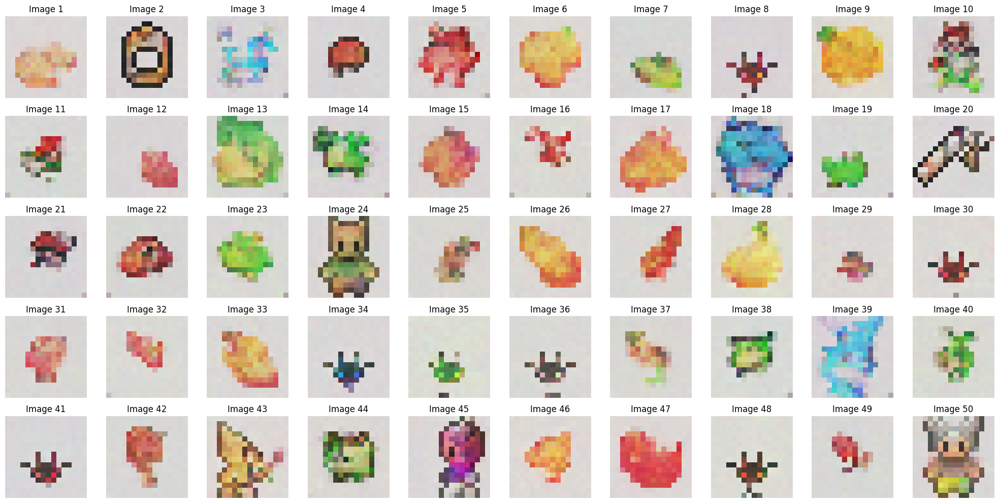

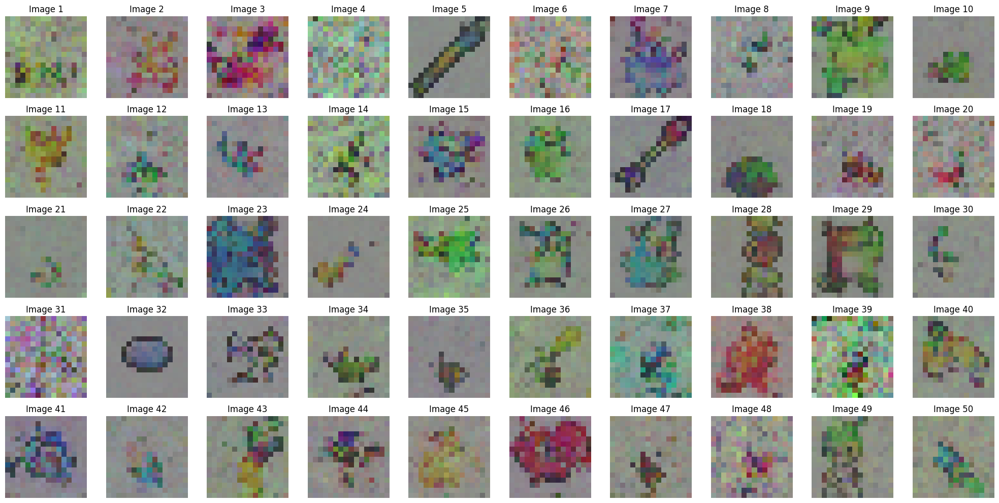

100%|██████████| 1/1 [00:00<00:00,  3.05it/s]


FID Score for DDPM at Epoch 13: 200.3225797272733


100%|██████████| 1/1 [00:00<00:00,  3.02it/s]


FID Score for DDIM at Epoch 13: 323.6316277320026

Epoch 14/40


Training: 100%|██████████| 716/716 [00:30<00:00, 23.23it/s]


Average Loss: 0.049207


DDPM Sampling: 1000it [00:07, 138.17it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 12it [00:00, 115.56it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step


DDIM Sampling: 35it [00:00, 97.91it/s] 

Step 477/500: Deterministic step
Step 476/500: Deterministic step
Step 475/500: Deterministic step
Step 474/500: Deterministic step
Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step


DDIM Sampling: 60it [00:00, 112.68it/s]

Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step
Step 450/500: Deterministic step
Step 449/500: Deterministic step
Step 448/500: Deterministic step
Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step


DDIM Sampling: 85it [00:00, 118.97it/s]

Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step
Step 422/500: Deterministic step
Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step


DDIM Sampling: 111it [00:00, 120.39it/s]

Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step
Step 396/500: Deterministic step
Step 395/500: Deterministic step
Step 394/500: Deterministic step
Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step

DDIM Sampling: 138it [00:01, 123.40it/s]


Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step
Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step


DDIM Sampling: 164it [00:01, 124.60it/s]

Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step


DDIM Sampling: 191it [00:01, 126.39it/s]

Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step


DDIM Sampling: 218it [00:01, 125.47it/s]

Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step


DDIM Sampling: 245it [00:02, 126.41it/s]

Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step


DDIM Sampling: 271it [00:02, 127.53it/s]

Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step
Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step


DDIM Sampling: 297it [00:02, 126.45it/s]

Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step
Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step


DDIM Sampling: 310it [00:02, 125.21it/s]

Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step
Step 190/500: Deterministic step
Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step


DDIM Sampling: 323it [00:02, 123.96it/s]

Step 177/500: Deterministic step
Step 176/500: Deterministic step


DDIM Sampling: 336it [00:02, 119.37it/s]

Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step


DDIM Sampling: 348it [00:02, 117.88it/s]

Step 154/500: Deterministic step
Step 153/500: Deterministic step


DDIM Sampling: 360it [00:02, 117.07it/s]

Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step


DDIM Sampling: 373it [00:03, 119.72it/s]

Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step


DDIM Sampling: 386it [00:03, 122.32it/s]

Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step


DDIM Sampling: 400it [00:03, 125.03it/s]

Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step


DDIM Sampling: 413it [00:03, 125.71it/s]

Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step


DDIM Sampling: 426it [00:03, 125.28it/s]

Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step


DDIM Sampling: 440it [00:03, 126.61it/s]

Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step

DDIM Sampling: 466it [00:03, 123.67it/s]


Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step


DDIM Sampling: 492it [00:04, 120.26it/s]

Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step
Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step


DDIM Sampling: 500it [00:04, 121.49it/s]

Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


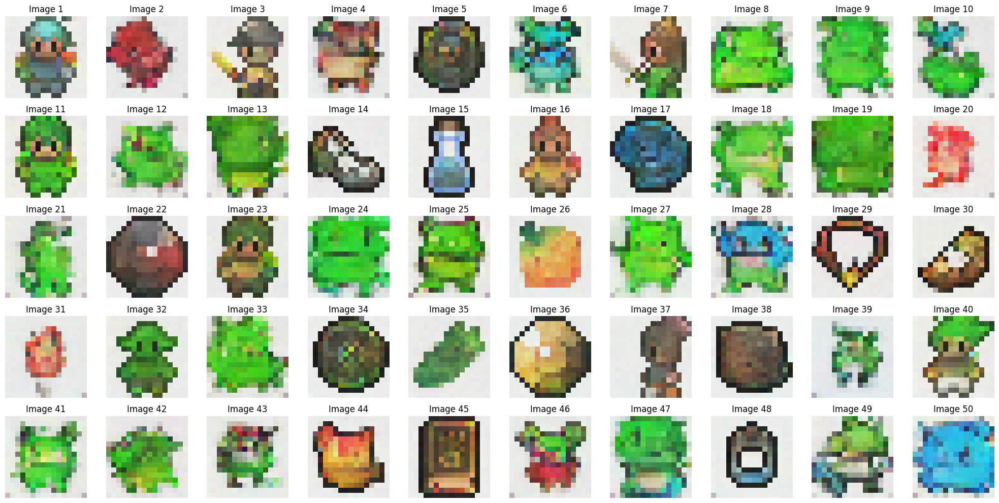

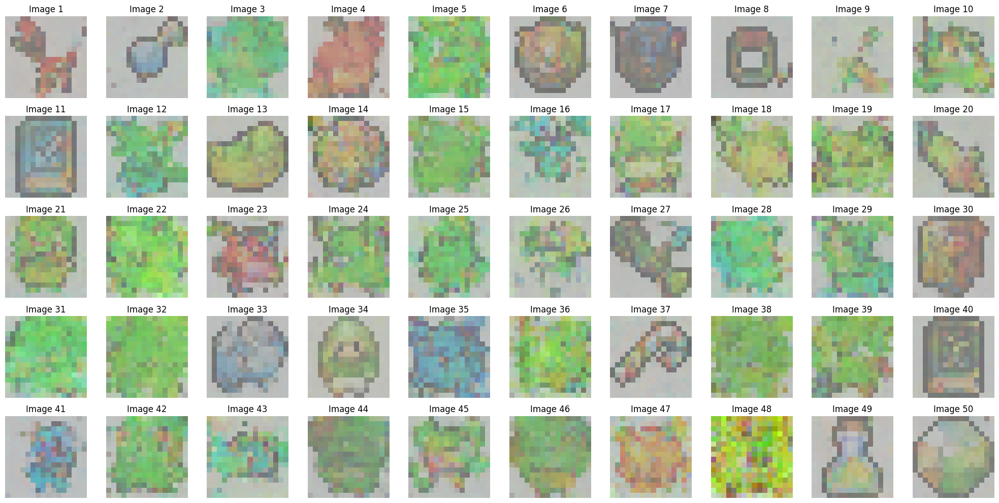

100%|██████████| 1/1 [00:00<00:00,  3.07it/s]


FID Score for DDPM at Epoch 14: 153.16537899988015


100%|██████████| 1/1 [00:00<00:00,  3.10it/s]


FID Score for DDIM at Epoch 14: 226.82504918583757

Epoch 15/40


Training: 100%|██████████| 716/716 [00:31<00:00, 22.70it/s]


Average Loss: 0.048027


DDPM Sampling: 1000it [00:06, 148.48it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 14it [00:00, 134.32it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step
Step 475/500: Deterministic step


DDIM Sampling: 41it [00:00, 121.69it/s]

Step 474/500: Deterministic step
Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step
Step 450/500: Deterministic step


DDIM Sampling: 67it [00:00, 112.52it/s]

Step 449/500: Deterministic step
Step 448/500: Deterministic step
Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step


DDIM Sampling: 90it [00:00, 103.23it/s]

Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step
Step 422/500: Deterministic step
Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step


DDIM Sampling: 101it [00:00, 98.12it/s]

Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step
Step 396/500: Deterministic step
Step 395/500: Deterministic step
Step 394/500: Deterministic step
Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step


DDIM Sampling: 122it [00:01, 97.51it/s]

Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step


DDIM Sampling: 142it [00:01, 96.86it/s]

Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step


DDIM Sampling: 163it [00:01, 96.31it/s]

Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step


DDIM Sampling: 185it [00:01, 100.44it/s]

Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step


DDIM Sampling: 207it [00:02, 104.30it/s]

Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step


DDIM Sampling: 230it [00:02, 103.75it/s]

Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step


DDIM Sampling: 252it [00:02, 103.65it/s]

Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step


DDIM Sampling: 274it [00:02, 105.51it/s]

Step 243/500: Deterministic step
Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step


DDIM Sampling: 296it [00:02, 105.66it/s]

Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step
Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step


DDIM Sampling: 307it [00:02, 100.93it/s]

Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step
Step 190/500: Deterministic step
Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step


DDIM Sampling: 318it [00:03, 93.45it/s] 

Step 184/500: Deterministic step
Step 183/500: Deterministic step


DDIM Sampling: 331it [00:03, 103.08it/s]

Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step


DDIM Sampling: 344it [00:03, 109.65it/s]

Step 157/500: Deterministic step


DDIM Sampling: 358it [00:03, 116.14it/s]

Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step
Step 131/500: Deterministic step

DDIM Sampling: 371it [00:03, 118.72it/s]


Step 130/500: Deterministic step


DDIM Sampling: 384it [00:03, 121.65it/s]

Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step


DDIM Sampling: 410it [00:03, 117.95it/s]

Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step


DDIM Sampling: 434it [00:04, 112.36it/s]

Step 84/500: Deterministic step
Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step


DDIM Sampling: 460it [00:04, 118.37it/s]

Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step


DDIM Sampling: 486it [00:04, 123.34it/s]

Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step
Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step
Step 7/500: Deterministic step

DDIM Sampling: 500it [00:04, 108.30it/s]



Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


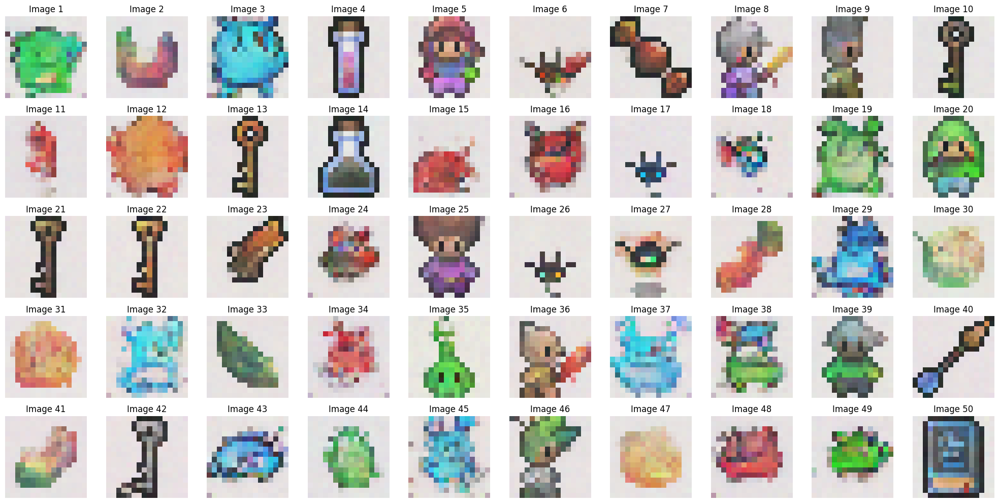

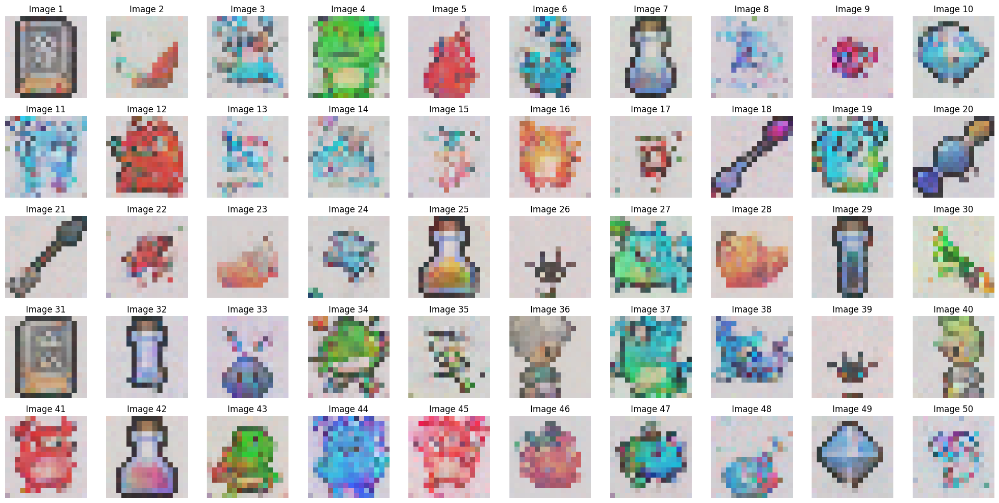

100%|██████████| 1/1 [00:00<00:00,  3.13it/s]


FID Score for DDPM at Epoch 15: 156.57701345474067


100%|██████████| 1/1 [00:00<00:00,  3.01it/s]


FID Score for DDIM at Epoch 15: 201.06970015365877

Epoch 16/40


Training: 100%|██████████| 716/716 [00:31<00:00, 22.75it/s]


Average Loss: 0.047206


DDPM Sampling: 1000it [00:06, 152.52it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 12it [00:00, 119.01it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step

DDIM Sampling: 37it [00:00, 117.33it/s]


Step 475/500: Deterministic step
Step 474/500: Deterministic step
Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step


DDIM Sampling: 61it [00:00, 113.19it/s]

Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step
Step 450/500: Deterministic step
Step 449/500: Deterministic step
Step 448/500: Deterministic step
Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step

DDIM Sampling: 85it [00:00, 114.66it/s]


Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step
Step 422/500: Deterministic step
Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step

DDIM Sampling: 109it [00:00, 111.01it/s]


Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step
Step 396/500: Deterministic step
Step 395/500: Deterministic step
Step 394/500: Deterministic step
Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step


DDIM Sampling: 134it [00:01, 112.94it/s]

Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step
Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step


DDIM Sampling: 160it [00:01, 118.06it/s]

Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step

DDIM Sampling: 187it [00:01, 123.88it/s]


Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step


DDIM Sampling: 213it [00:01, 126.01it/s]

Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step


DDIM Sampling: 239it [00:02, 121.17it/s]

Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step


DDIM Sampling: 265it [00:02, 117.66it/s]

Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step
Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step


DDIM Sampling: 291it [00:02, 123.22it/s]

Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step
Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step


DDIM Sampling: 318it [00:02, 127.68it/s]

Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step
Step 190/500: Deterministic step
Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step


DDIM Sampling: 345it [00:02, 128.86it/s]

Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step


DDIM Sampling: 358it [00:02, 123.70it/s]

Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step


DDIM Sampling: 384it [00:03, 110.86it/s]

Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step


DDIM Sampling: 409it [00:03, 112.26it/s]

Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step


DDIM Sampling: 421it [00:03, 109.13it/s]

Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step


DDIM Sampling: 444it [00:03, 101.04it/s]

Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step


DDIM Sampling: 465it [00:04, 95.91it/s]

Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step

DDIM Sampling: 485it [00:04, 93.01it/s]


Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step


DDIM Sampling: 500it [00:04, 113.12it/s]


Step 12/500: Deterministic step
Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


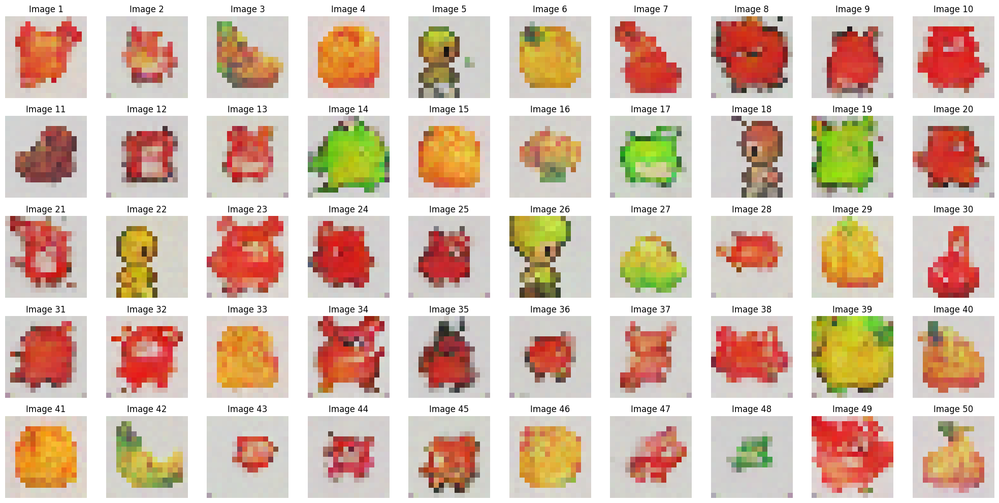

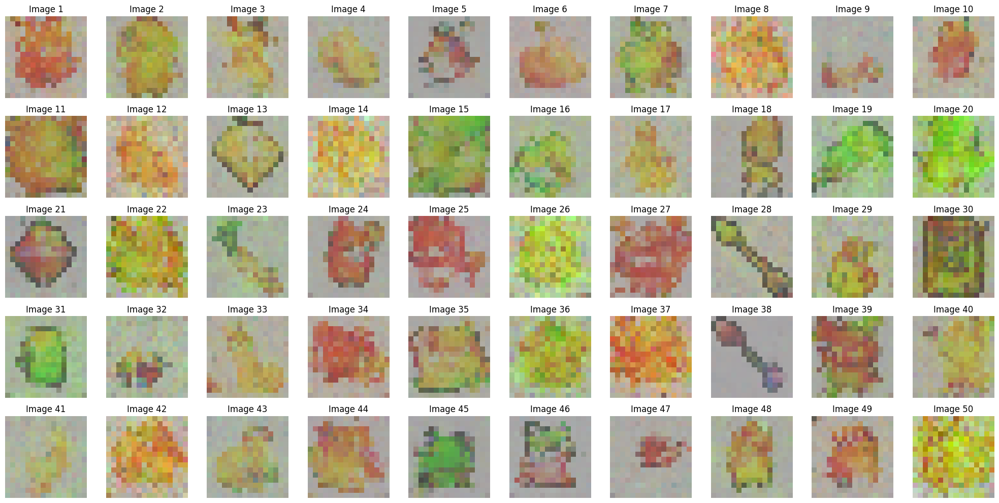

100%|██████████| 1/1 [00:00<00:00,  3.02it/s]


FID Score for DDPM at Epoch 16: 202.34178574731897


100%|██████████| 1/1 [00:00<00:00,  3.09it/s]


FID Score for DDIM at Epoch 16: 350.6473576480978

Epoch 17/40


Training: 100%|██████████| 716/716 [00:32<00:00, 22.28it/s]


Average Loss: 0.046806


DDPM Sampling: 1000it [00:06, 151.19it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 14it [00:00, 135.51it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step
Step 475/500: Deterministic step
Step 474/500: Deterministic step


DDIM Sampling: 41it [00:00, 128.44it/s]

Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step


DDIM Sampling: 68it [00:00, 123.83it/s]

Step 450/500: Deterministic step
Step 449/500: Deterministic step
Step 448/500: Deterministic step
Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step


DDIM Sampling: 95it [00:00, 126.96it/s]

Step 423/500: Deterministic step
Step 422/500: Deterministic step
Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step


DDIM Sampling: 123it [00:00, 129.66it/s]

Step 396/500: Deterministic step
Step 395/500: Deterministic step
Step 394/500: Deterministic step
Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step


DDIM Sampling: 150it [00:01, 129.91it/s]

Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step
Step 344/500: Deterministic step

DDIM Sampling: 177it [00:01, 126.73it/s]


Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step


DDIM Sampling: 204it [00:01, 126.97it/s]

Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step


DDIM Sampling: 231it [00:01, 129.35it/s]

Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step


DDIM Sampling: 258it [00:02, 123.49it/s]

Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step
Step 242/500: Deterministic step


DDIM Sampling: 271it [00:02, 120.06it/s]

Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step


DDIM Sampling: 296it [00:02, 113.96it/s]

Step 218/500: Deterministic step
Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step

DDIM Sampling: 321it [00:02, 114.37it/s]


Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step
Step 190/500: Deterministic step
Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step


DDIM Sampling: 347it [00:02, 121.11it/s]

Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step


DDIM Sampling: 374it [00:03, 123.87it/s]

Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step


DDIM Sampling: 401it [00:03, 127.50it/s]

Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step


DDIM Sampling: 427it [00:03, 125.33it/s]

Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step


DDIM Sampling: 453it [00:03, 119.21it/s]

Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step


DDIM Sampling: 480it [00:03, 124.90it/s]

Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step


DDIM Sampling: 500it [00:04, 123.85it/s]


Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step
Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


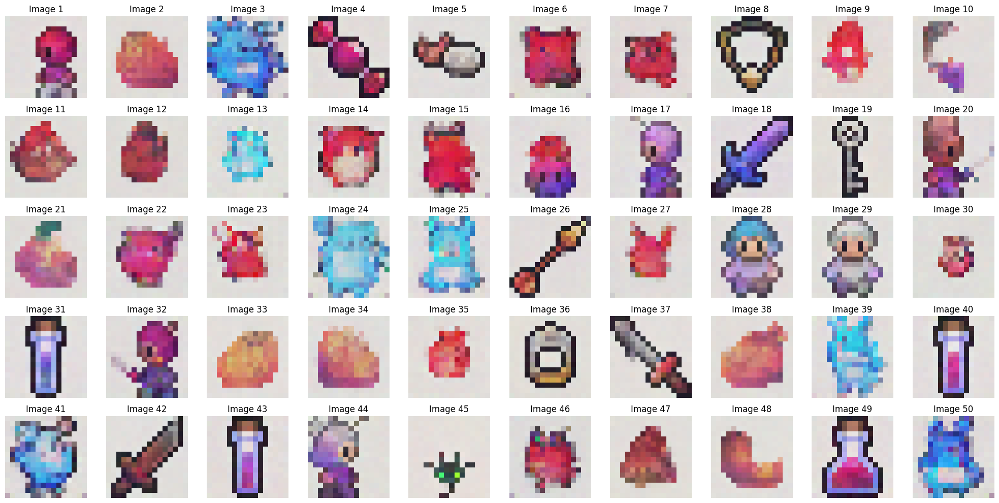

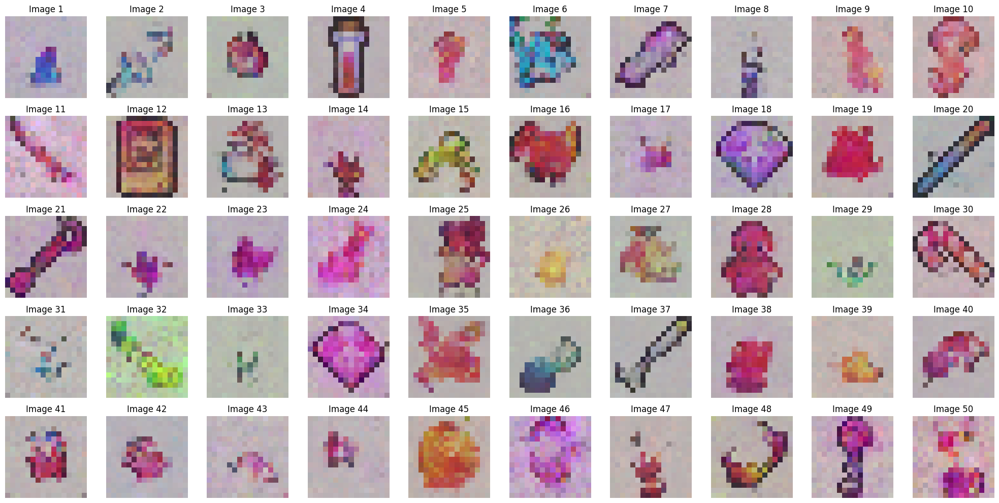

100%|██████████| 1/1 [00:00<00:00,  3.13it/s]


FID Score for DDPM at Epoch 17: 160.77569924030354


100%|██████████| 1/1 [00:00<00:00,  3.15it/s]


FID Score for DDIM at Epoch 17: 232.56491901499948

Epoch 18/40


Training: 100%|██████████| 716/716 [00:32<00:00, 21.86it/s]


Average Loss: 0.046162


DDPM Sampling: 1000it [00:06, 148.81it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 14it [00:00, 133.70it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step
Step 475/500: Deterministic step
Step 474/500: Deterministic step


DDIM Sampling: 42it [00:00, 130.96it/s]

Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step
Step 450/500: Deterministic step
Step 449/500: Deterministic step
Step 448/500: Deterministic step


DDIM Sampling: 70it [00:00, 129.41it/s]

Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step
Step 422/500: Deterministic step


DDIM Sampling: 97it [00:00, 127.09it/s]

Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step


DDIM Sampling: 123it [00:00, 121.37it/s]

Step 396/500: Deterministic step
Step 395/500: Deterministic step
Step 394/500: Deterministic step
Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step


DDIM Sampling: 149it [00:01, 123.93it/s]

Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step
Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step


DDIM Sampling: 176it [00:01, 126.37it/s]

Step 346/500: Deterministic step
Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step


DDIM Sampling: 202it [00:01, 127.70it/s]

Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step


DDIM Sampling: 215it [00:01, 122.38it/s]

Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step


DDIM Sampling: 228it [00:01, 116.46it/s]

Step 274/500: Deterministic step
Step 273/500: Deterministic step


DDIM Sampling: 241it [00:01, 117.92it/s]

Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step


DDIM Sampling: 254it [00:02, 119.18it/s]

Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step


DDIM Sampling: 267it [00:02, 121.33it/s]

Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step
Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step

DDIM Sampling: 280it [00:02, 120.83it/s]


Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step


DDIM Sampling: 294it [00:02, 123.74it/s]

Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step
Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step


DDIM Sampling: 307it [00:02, 125.37it/s]

Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step


DDIM Sampling: 320it [00:02, 126.12it/s]

Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step
Step 190/500: Deterministic step
Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step


DDIM Sampling: 333it [00:02, 125.88it/s]

Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step


DDIM Sampling: 346it [00:02, 121.16it/s]

Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step

DDIM Sampling: 372it [00:03, 117.02it/s]


Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step


DDIM Sampling: 399it [00:03, 122.48it/s]

Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step


DDIM Sampling: 425it [00:03, 119.57it/s]

Step 95/500: Deterministic step
Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step


DDIM Sampling: 438it [00:03, 113.34it/s]

Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step


DDIM Sampling: 451it [00:03, 114.88it/s]

Step 50/500: Deterministic step
Step 49/500: Deterministic step

DDIM Sampling: 463it [00:03, 109.12it/s]


Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step

DDIM Sampling: 486it [00:04, 106.23it/s]


Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step
Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step


DDIM Sampling: 500it [00:04, 119.70it/s]


Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


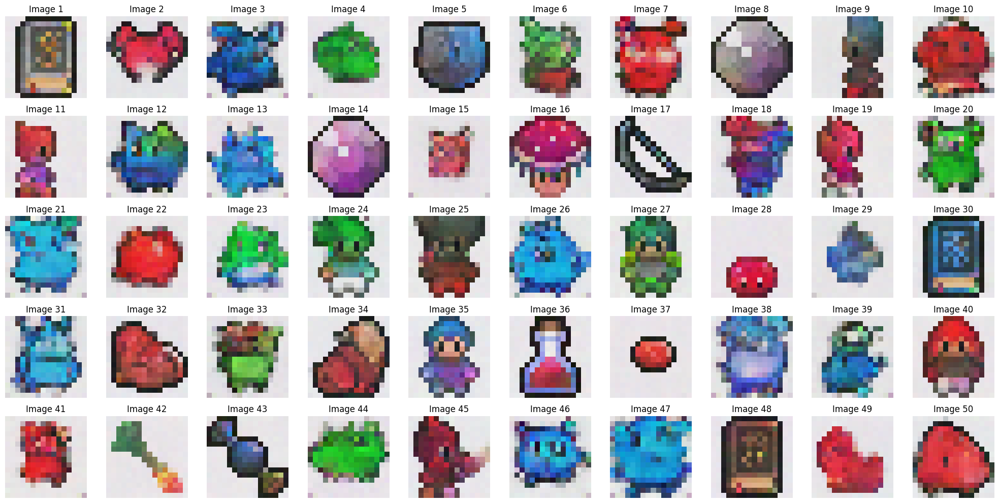

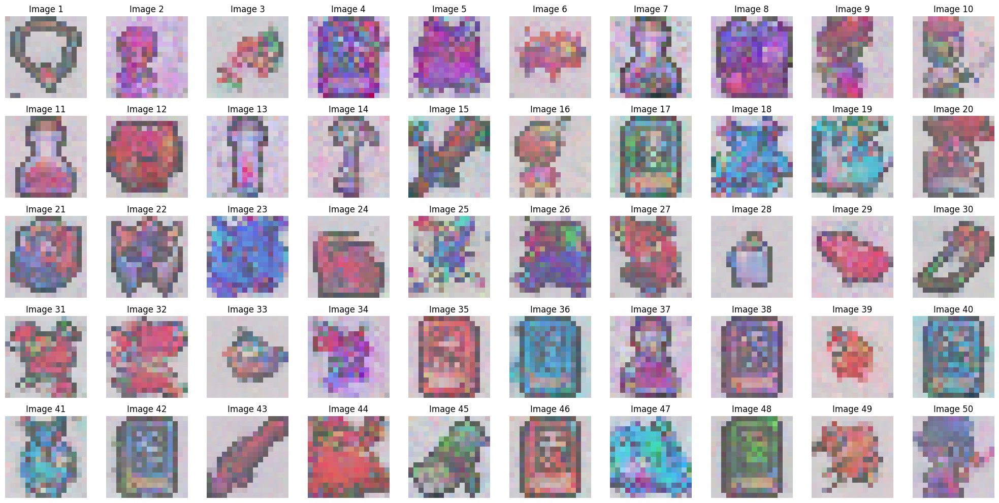

100%|██████████| 1/1 [00:00<00:00,  2.93it/s]


FID Score for DDPM at Epoch 18: 146.94971509856435


100%|██████████| 1/1 [00:00<00:00,  3.09it/s]


FID Score for DDIM at Epoch 18: 194.8338304155959

Epoch 19/40


Training: 100%|██████████| 716/716 [00:32<00:00, 21.83it/s]


Average Loss: 0.045113


DDPM Sampling: 1000it [00:07, 137.91it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 14it [00:00, 132.95it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step
Step 475/500: Deterministic step
Step 474/500: Deterministic step


DDIM Sampling: 42it [00:00, 130.21it/s]

Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step
Step 450/500: Deterministic step
Step 449/500: Deterministic step


DDIM Sampling: 70it [00:00, 126.36it/s]

Step 448/500: Deterministic step
Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step
Step 422/500: Deterministic step


DDIM Sampling: 96it [00:00, 124.80it/s]

Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step


DDIM Sampling: 122it [00:00, 124.81it/s]

Step 396/500: Deterministic step
Step 395/500: Deterministic step
Step 394/500: Deterministic step
Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step


DDIM Sampling: 149it [00:01, 126.71it/s]

Step 370/500: Deterministic step
Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step


DDIM Sampling: 175it [00:01, 118.83it/s]

Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step


DDIM Sampling: 202it [00:01, 124.00it/s]

Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step

DDIM Sampling: 228it [00:01, 124.23it/s]


Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step


DDIM Sampling: 254it [00:02, 124.58it/s]

Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step

DDIM Sampling: 280it [00:02, 124.65it/s]


Step 243/500: Deterministic step
Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step


DDIM Sampling: 293it [00:02, 126.15it/s]

Step 218/500: Deterministic step
Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step


DDIM Sampling: 306it [00:02, 123.50it/s]

Step 194/500: Deterministic step


DDIM Sampling: 319it [00:02, 119.95it/s]

Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step
Step 190/500: Deterministic step
Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step


DDIM Sampling: 332it [00:02, 122.73it/s]

Step 169/500: Deterministic step


DDIM Sampling: 345it [00:02, 122.76it/s]

Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step


DDIM Sampling: 358it [00:02, 124.35it/s]

Step 143/500: Deterministic step


DDIM Sampling: 371it [00:02, 124.67it/s]

Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step


DDIM Sampling: 384it [00:03, 123.92it/s]

Step 117/500: Deterministic step


DDIM Sampling: 397it [00:03, 125.20it/s]

Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step


DDIM Sampling: 410it [00:03, 126.07it/s]

Step 91/500: Deterministic step


DDIM Sampling: 424it [00:03, 127.68it/s]

Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step


DDIM Sampling: 450it [00:03, 123.51it/s]

Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step


DDIM Sampling: 477it [00:03, 123.07it/s]

Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step


DDIM Sampling: 500it [00:04, 123.87it/s]


Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step
Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


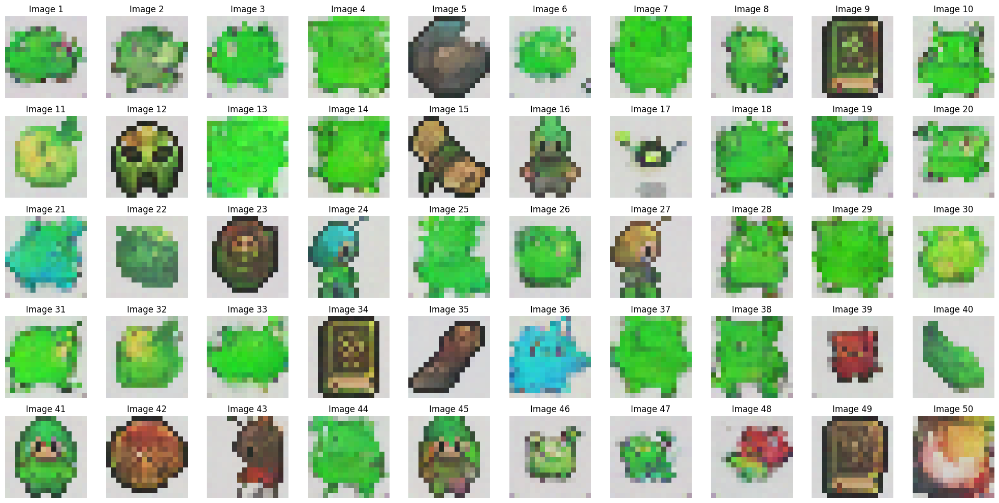

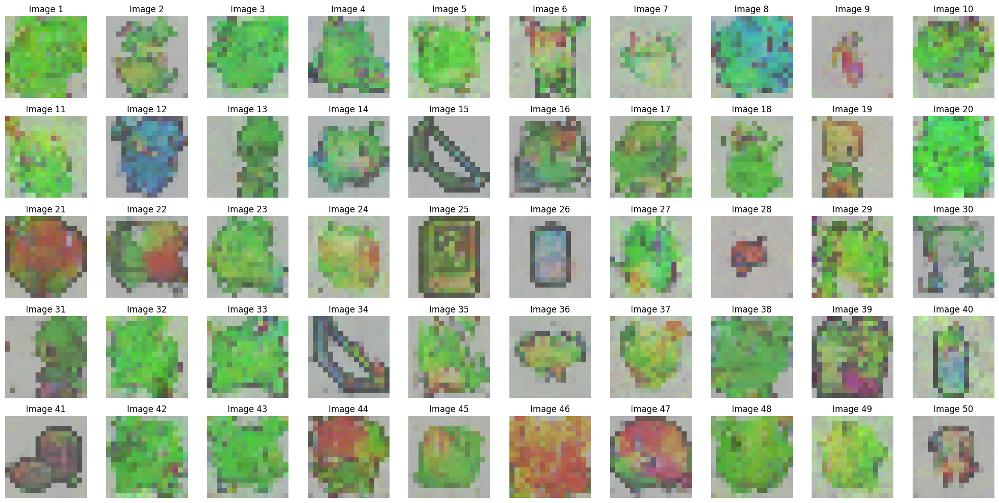

100%|██████████| 1/1 [00:00<00:00,  3.02it/s]


FID Score for DDPM at Epoch 19: 190.8137219240003


100%|██████████| 1/1 [00:00<00:00,  3.19it/s]


FID Score for DDIM at Epoch 19: 235.2089287890081

Epoch 20/40


Training: 100%|██████████| 716/716 [00:32<00:00, 21.83it/s]


Average Loss: 0.044341


DDPM Sampling: 1000it [00:07, 134.32it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 12it [00:00, 118.26it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step

DDIM Sampling: 37it [00:00, 119.84it/s]


Step 476/500: Deterministic step
Step 475/500: Deterministic step
Step 474/500: Deterministic step
Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step


DDIM Sampling: 63it [00:00, 116.09it/s]

Step 451/500: Deterministic step
Step 450/500: Deterministic step
Step 449/500: Deterministic step
Step 448/500: Deterministic step
Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step


DDIM Sampling: 90it [00:00, 123.03it/s]

Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step
Step 422/500: Deterministic step
Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step


DDIM Sampling: 116it [00:00, 123.63it/s]

Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step
Step 396/500: Deterministic step
Step 395/500: Deterministic step
Step 394/500: Deterministic step
Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step


DDIM Sampling: 143it [00:01, 124.21it/s]

Step 376/500: Deterministic step
Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step
Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step


DDIM Sampling: 170it [00:01, 124.58it/s]

Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step


DDIM Sampling: 183it [00:01, 114.63it/s]

Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step


DDIM Sampling: 197it [00:01, 119.18it/s]

Step 304/500: Deterministic step


DDIM Sampling: 210it [00:01, 121.37it/s]

Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step

DDIM Sampling: 223it [00:01, 121.25it/s]


Step 278/500: Deterministic step


DDIM Sampling: 236it [00:01, 122.94it/s]

Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step


DDIM Sampling: 249it [00:02, 124.54it/s]

Step 253/500: Deterministic step
Step 252/500: Deterministic step


DDIM Sampling: 262it [00:02, 125.46it/s]

Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step
Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step


DDIM Sampling: 288it [00:02, 122.39it/s]

Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step
Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step


DDIM Sampling: 314it [00:02, 120.01it/s]

Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step
Step 190/500: Deterministic step
Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step


DDIM Sampling: 340it [00:02, 123.00it/s]

Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step


DDIM Sampling: 366it [00:03, 125.41it/s]

Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step


DDIM Sampling: 393it [00:03, 125.57it/s]

Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step


DDIM Sampling: 419it [00:03, 123.24it/s]

Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step


DDIM Sampling: 446it [00:03, 125.46it/s]

Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step


DDIM Sampling: 473it [00:03, 127.08it/s]

Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step


DDIM Sampling: 500it [00:04, 122.59it/s]

Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step
Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


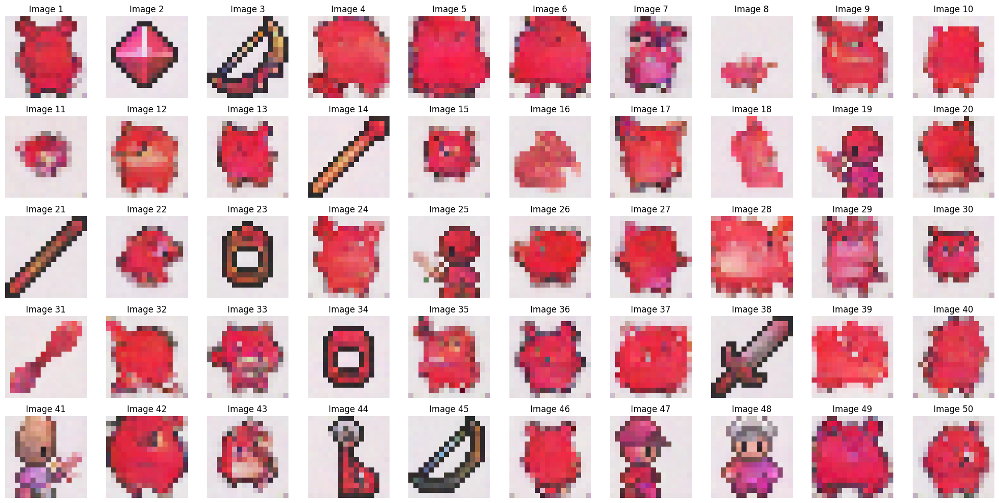

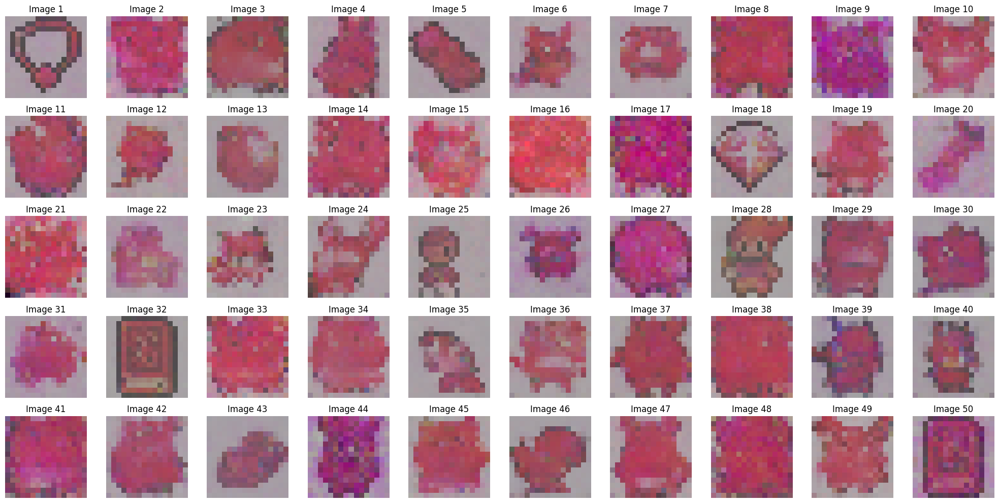

100%|██████████| 1/1 [00:00<00:00,  3.16it/s]


FID Score for DDPM at Epoch 20: 181.836362202849


100%|██████████| 1/1 [00:00<00:00,  2.99it/s]


FID Score for DDIM at Epoch 20: 249.94384147202564

Epoch 21/40


Training: 100%|██████████| 716/716 [00:32<00:00, 21.76it/s]


Average Loss: 0.043513


DDPM Sampling: 1000it [00:07, 135.93it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 13it [00:00, 125.88it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step
Step 475/500: Deterministic step


DDIM Sampling: 41it [00:00, 129.49it/s]

Step 474/500: Deterministic step
Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step
Step 450/500: Deterministic step
Step 449/500: Deterministic step


DDIM Sampling: 68it [00:00, 129.54it/s]

Step 448/500: Deterministic step
Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step


DDIM Sampling: 95it [00:00, 129.26it/s]

Step 422/500: Deterministic step
Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step
Step 396/500: Deterministic step


DDIM Sampling: 121it [00:00, 126.58it/s]

Step 395/500: Deterministic step
Step 394/500: Deterministic step
Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step


DDIM Sampling: 147it [00:01, 125.94it/s]

Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step
Step 344/500: Deterministic step


DDIM Sampling: 175it [00:01, 129.01it/s]

Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step


DDIM Sampling: 202it [00:01, 129.34it/s]

Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step


DDIM Sampling: 229it [00:01, 129.78it/s]

Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step


DDIM Sampling: 256it [00:02, 125.42it/s]

Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step
Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step


DDIM Sampling: 283it [00:02, 125.87it/s]

Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step
Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step


DDIM Sampling: 309it [00:02, 127.19it/s]

Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step
Step 190/500: Deterministic step
Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step


DDIM Sampling: 335it [00:02, 126.29it/s]

Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step


DDIM Sampling: 361it [00:02, 125.59it/s]

Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step


DDIM Sampling: 388it [00:03, 123.14it/s]

Step 133/500: Deterministic step
Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step


DDIM Sampling: 415it [00:03, 126.37it/s]

Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step


DDIM Sampling: 442it [00:03, 128.25it/s]

Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step


DDIM Sampling: 469it [00:03, 128.21it/s]

Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step


DDIM Sampling: 496it [00:03, 129.11it/s]

Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step
Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step


DDIM Sampling: 500it [00:03, 127.23it/s]


Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


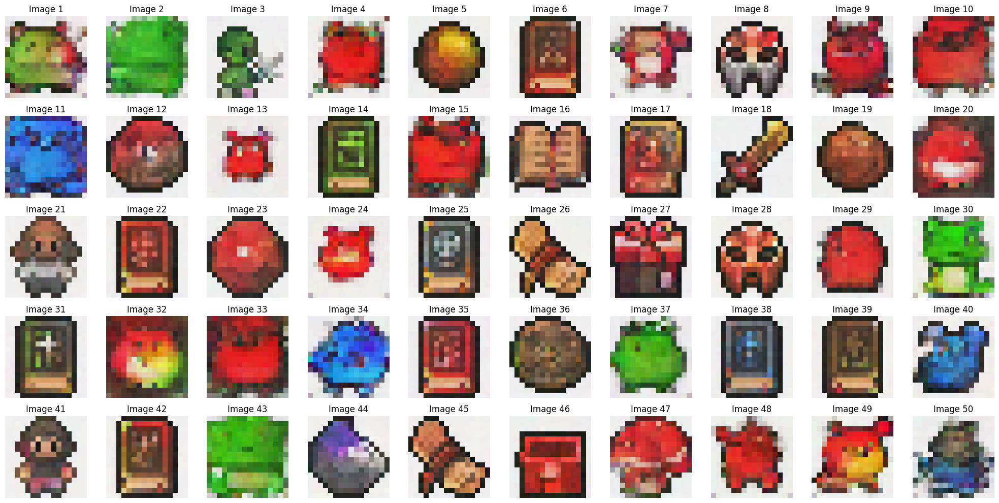

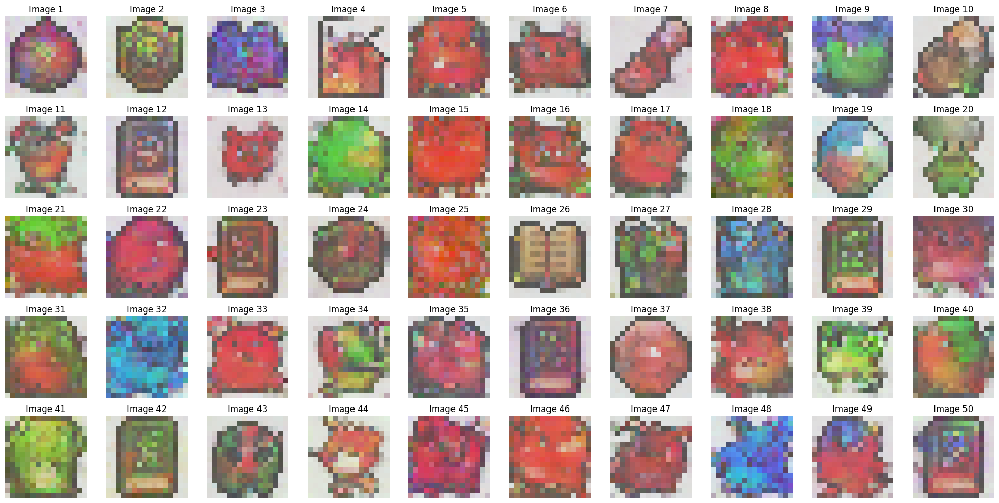

100%|██████████| 1/1 [00:00<00:00,  3.03it/s]


FID Score for DDPM at Epoch 21: 169.2675171159603


100%|██████████| 1/1 [00:00<00:00,  3.13it/s]


FID Score for DDIM at Epoch 21: 197.0414733546826

Epoch 22/40


Training: 100%|██████████| 716/716 [00:33<00:00, 21.66it/s]


Average Loss: 0.043502


DDPM Sampling: 1000it [00:07, 131.05it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 13it [00:00, 120.91it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step


DDIM Sampling: 38it [00:00, 102.38it/s]

Step 477/500: Deterministic step
Step 476/500: Deterministic step
Step 475/500: Deterministic step
Step 474/500: Deterministic step
Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step


DDIM Sampling: 61it [00:00, 105.77it/s]

Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step
Step 450/500: Deterministic step
Step 449/500: Deterministic step
Step 448/500: Deterministic step
Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step


DDIM Sampling: 85it [00:00, 111.12it/s]

Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step
Step 422/500: Deterministic step
Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step


DDIM Sampling: 111it [00:00, 117.20it/s]

Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step
Step 396/500: Deterministic step
Step 395/500: Deterministic step
Step 394/500: Deterministic step
Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step


DDIM Sampling: 137it [00:01, 121.48it/s]

Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step
Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step

DDIM Sampling: 163it [00:01, 118.93it/s]


Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step

DDIM Sampling: 189it [00:01, 123.36it/s]


Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step


DDIM Sampling: 216it [00:01, 126.63it/s]

Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step


DDIM Sampling: 243it [00:02, 128.54it/s]

Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step


DDIM Sampling: 257it [00:02, 129.23it/s]

Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step
Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step


DDIM Sampling: 285it [00:02, 131.21it/s]

Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step
Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step


DDIM Sampling: 313it [00:02, 127.32it/s]

Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step
Step 190/500: Deterministic step
Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step


DDIM Sampling: 340it [00:02, 129.09it/s]

Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step


DDIM Sampling: 368it [00:03, 130.71it/s]

Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step


DDIM Sampling: 396it [00:03, 129.88it/s]

Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step

DDIM Sampling: 422it [00:03, 127.33it/s]


Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step


DDIM Sampling: 449it [00:03, 127.70it/s]

Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step


DDIM Sampling: 475it [00:03, 127.14it/s]

Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step


DDIM Sampling: 500it [00:04, 123.29it/s]


Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step
Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


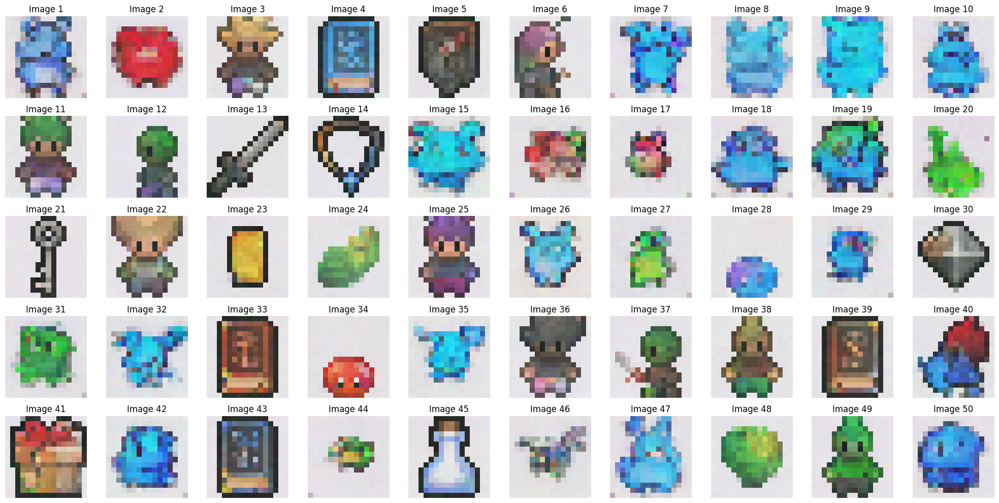

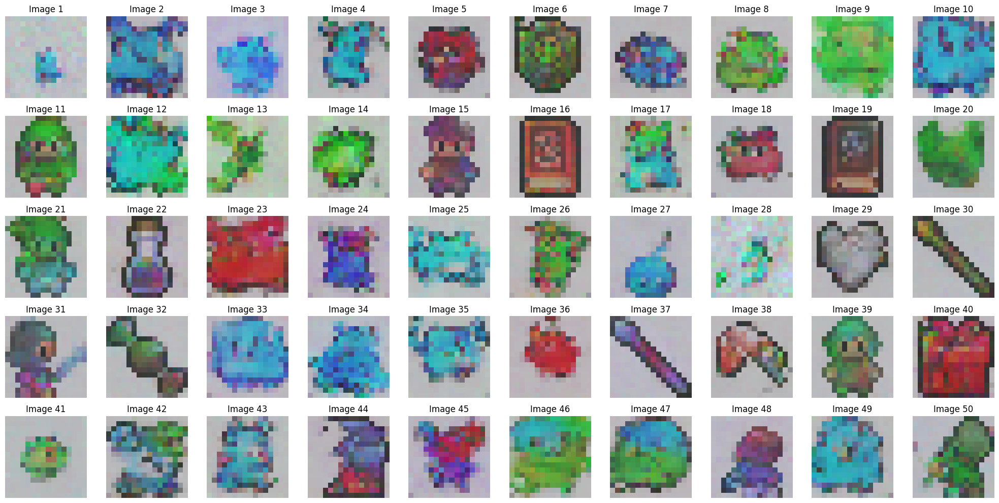

100%|██████████| 1/1 [00:00<00:00,  2.41it/s]


FID Score for DDPM at Epoch 22: 142.89486666895885


100%|██████████| 1/1 [00:00<00:00,  3.05it/s]


FID Score for DDIM at Epoch 22: 170.90185052960794

Epoch 23/40


Training: 100%|██████████| 716/716 [00:33<00:00, 21.11it/s]


Average Loss: 0.042753


DDPM Sampling: 1000it [00:07, 133.98it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 10it [00:00, 95.63it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step


DDIM Sampling: 31it [00:00, 95.95it/s]

Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step
Step 475/500: Deterministic step
Step 474/500: Deterministic step
Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step


DDIM Sampling: 56it [00:00, 110.68it/s]

Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step
Step 450/500: Deterministic step
Step 449/500: Deterministic step
Step 448/500: Deterministic step
Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step


DDIM Sampling: 82it [00:00, 117.05it/s]

Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step
Step 422/500: Deterministic step
Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step


DDIM Sampling: 108it [00:00, 121.94it/s]

Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step
Step 396/500: Deterministic step
Step 395/500: Deterministic step
Step 394/500: Deterministic step
Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step


DDIM Sampling: 134it [00:01, 116.04it/s]

Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step
Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step


DDIM Sampling: 161it [00:01, 123.15it/s]

Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step


DDIM Sampling: 188it [00:01, 126.97it/s]

Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step


DDIM Sampling: 215it [00:01, 128.48it/s]

Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step


DDIM Sampling: 241it [00:02, 124.40it/s]

Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step


DDIM Sampling: 254it [00:02, 111.38it/s]

Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step
Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step

DDIM Sampling: 267it [00:02, 115.59it/s]


Step 234/500: Deterministic step


DDIM Sampling: 281it [00:02, 120.14it/s]

Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step
Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step


DDIM Sampling: 294it [00:02, 122.44it/s]

Step 208/500: Deterministic step
Step 207/500: Deterministic step


DDIM Sampling: 307it [00:02, 123.61it/s]

Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step
Step 190/500: Deterministic step
Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step


DDIM Sampling: 320it [00:02, 123.22it/s]

Step 182/500: Deterministic step
Step 181/500: Deterministic step


DDIM Sampling: 334it [00:02, 125.99it/s]

Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step


DDIM Sampling: 347it [00:02, 126.52it/s]

Step 155/500: Deterministic step
Step 154/500: Deterministic step


DDIM Sampling: 360it [00:02, 127.33it/s]

Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step


DDIM Sampling: 373it [00:03, 125.90it/s]

Step 129/500: Deterministic step
Step 128/500: Deterministic step


DDIM Sampling: 386it [00:03, 120.54it/s]

Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step

DDIM Sampling: 412it [00:03, 122.78it/s]


Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step


DDIM Sampling: 439it [00:03, 127.00it/s]

Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step


DDIM Sampling: 467it [00:03, 129.51it/s]

Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step

DDIM Sampling: 500it [00:04, 121.60it/s]


Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step
Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


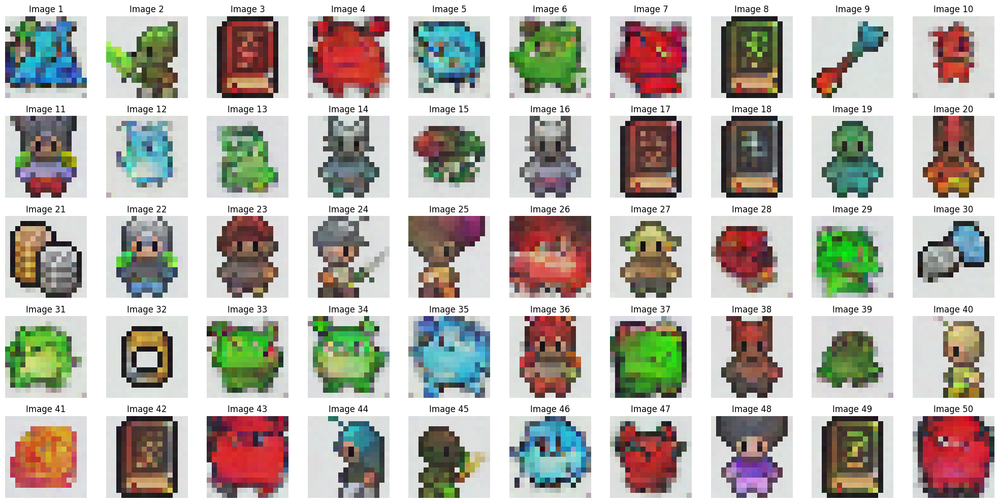

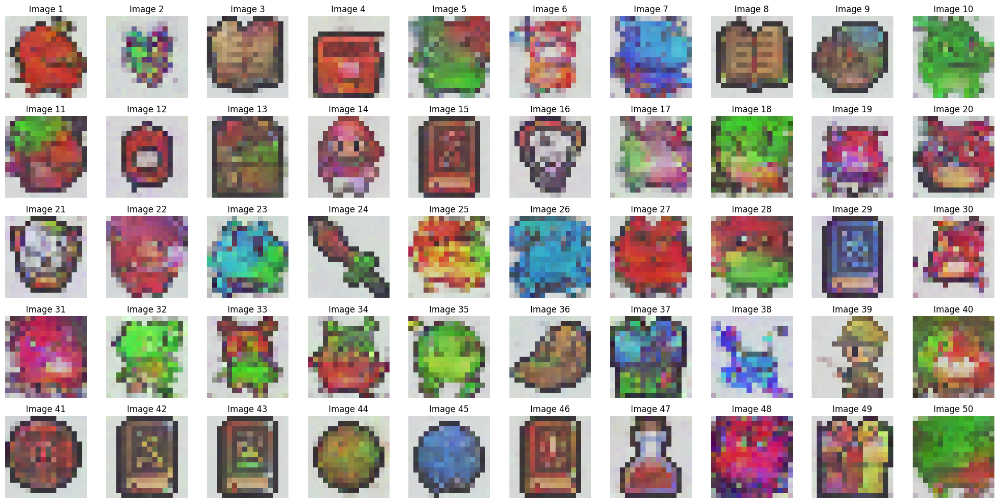

100%|██████████| 1/1 [00:00<00:00,  2.78it/s]


FID Score for DDPM at Epoch 23: 125.95931464288199


100%|██████████| 1/1 [00:00<00:00,  3.22it/s]


FID Score for DDIM at Epoch 23: 168.36797147750212

Epoch 24/40


Training: 100%|██████████| 716/716 [00:33<00:00, 21.15it/s]


Average Loss: 0.042137


DDPM Sampling: 1000it [00:07, 139.48it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 12it [00:00, 110.11it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step


DDIM Sampling: 38it [00:00, 113.67it/s]

Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step
Step 475/500: Deterministic step
Step 474/500: Deterministic step
Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step


DDIM Sampling: 61it [00:00, 98.45it/s] 

Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step
Step 450/500: Deterministic step
Step 449/500: Deterministic step
Step 448/500: Deterministic step
Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step


DDIM Sampling: 82it [00:00, 100.07it/s]

Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step
Step 422/500: Deterministic step
Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step


DDIM Sampling: 93it [00:00, 98.60it/s] 

Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step


DDIM Sampling: 105it [00:01, 103.94it/s]

Step 396/500: Deterministic step
Step 395/500: Deterministic step
Step 394/500: Deterministic step
Step 393/500: Deterministic step


DDIM Sampling: 117it [00:01, 107.74it/s]

Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step


DDIM Sampling: 129it [00:01, 109.81it/s]

Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step
Step 369/500: Deterministic step


DDIM Sampling: 141it [00:01, 112.28it/s]

Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step


DDIM Sampling: 153it [00:01, 111.56it/s]

Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step


DDIM Sampling: 165it [00:01, 105.91it/s]

Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step


DDIM Sampling: 189it [00:01, 108.44it/s]

Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step


DDIM Sampling: 214it [00:01, 113.83it/s]

Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step


DDIM Sampling: 241it [00:02, 121.42it/s]

Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step


DDIM Sampling: 268it [00:02, 125.15it/s]

Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step
Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step

DDIM Sampling: 294it [00:02, 124.52it/s]


Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step
Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step


DDIM Sampling: 320it [00:02, 122.01it/s]

Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step
Step 190/500: Deterministic step
Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step


DDIM Sampling: 346it [00:03, 121.75it/s]

Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step


DDIM Sampling: 373it [00:03, 125.45it/s]

Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step


DDIM Sampling: 400it [00:03, 127.77it/s]

Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step

DDIM Sampling: 427it [00:03, 128.63it/s]


Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step


DDIM Sampling: 440it [00:03, 125.42it/s]

Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step


DDIM Sampling: 454it [00:03, 126.60it/s]

Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step


DDIM Sampling: 467it [00:04, 127.03it/s]

Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step


DDIM Sampling: 480it [00:04, 122.72it/s]

Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step


DDIM Sampling: 500it [00:04, 117.01it/s]

Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step
Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


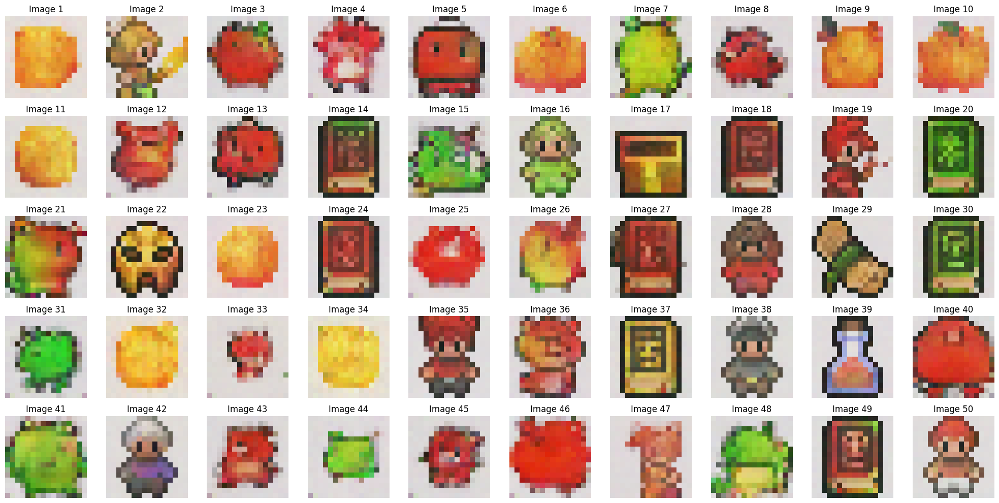

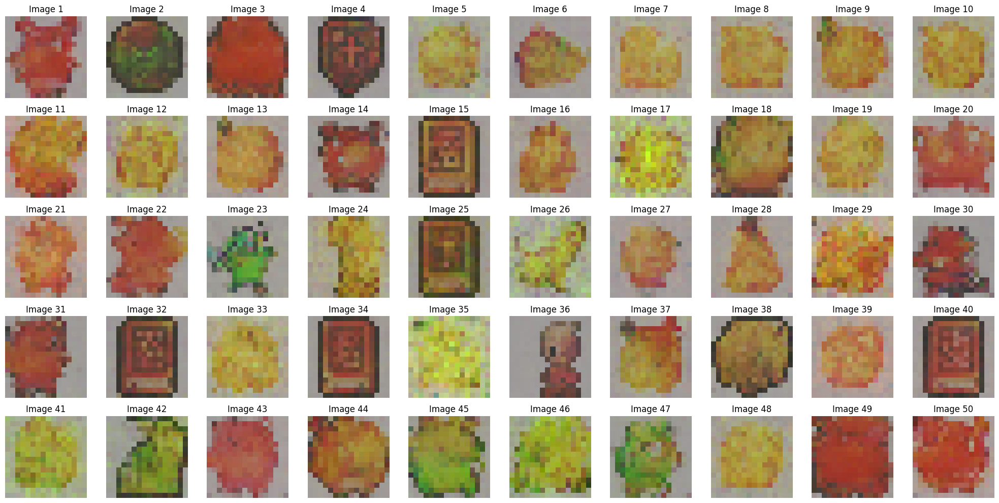

100%|██████████| 1/1 [00:00<00:00,  2.92it/s]


FID Score for DDPM at Epoch 24: 169.91718855589326


100%|██████████| 1/1 [00:00<00:00,  3.17it/s]


FID Score for DDIM at Epoch 24: 268.08695200146826

Epoch 25/40


Training: 100%|██████████| 716/716 [00:34<00:00, 20.86it/s]


Average Loss: 0.041140


DDPM Sampling: 1000it [00:07, 141.37it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 12it [00:00, 115.95it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step


DDIM Sampling: 36it [00:00, 112.53it/s]

Step 477/500: Deterministic step
Step 476/500: Deterministic step
Step 475/500: Deterministic step
Step 474/500: Deterministic step
Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step


DDIM Sampling: 59it [00:00, 106.60it/s]

Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step
Step 450/500: Deterministic step
Step 449/500: Deterministic step
Step 448/500: Deterministic step
Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step


DDIM Sampling: 81it [00:00, 100.05it/s]

Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step
Step 422/500: Deterministic step
Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step


DDIM Sampling: 102it [00:01, 94.50it/s]

Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step

DDIM Sampling: 124it [00:01, 100.63it/s]


Step 396/500: Deterministic step
Step 395/500: Deterministic step
Step 394/500: Deterministic step
Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step


DDIM Sampling: 149it [00:01, 110.95it/s]

Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step
Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step


DDIM Sampling: 162it [00:01, 115.03it/s]

Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step


DDIM Sampling: 175it [00:01, 115.76it/s]

Step 326/500: Deterministic step


DDIM Sampling: 187it [00:01, 114.63it/s]

Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step


DDIM Sampling: 212it [00:01, 111.09it/s]

Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step


DDIM Sampling: 239it [00:02, 120.04it/s]

Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step


DDIM Sampling: 266it [00:02, 123.25it/s]

Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step
Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step
Step 229/500: Deterministic step


DDIM Sampling: 293it [00:02, 127.16it/s]

Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step
Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step


DDIM Sampling: 320it [00:02, 127.67it/s]

Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step
Step 190/500: Deterministic step
Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step


DDIM Sampling: 346it [00:03, 125.63it/s]

Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step


DDIM Sampling: 373it [00:03, 127.85it/s]

Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step


DDIM Sampling: 399it [00:03, 128.02it/s]

Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step


DDIM Sampling: 426it [00:03, 129.10it/s]

Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step


DDIM Sampling: 452it [00:03, 128.67it/s]

Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step


DDIM Sampling: 465it [00:03, 122.90it/s]

Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step


DDIM Sampling: 478it [00:04, 123.28it/s]

Step 23/500: Deterministic step


DDIM Sampling: 500it [00:04, 117.53it/s]

Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step
Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


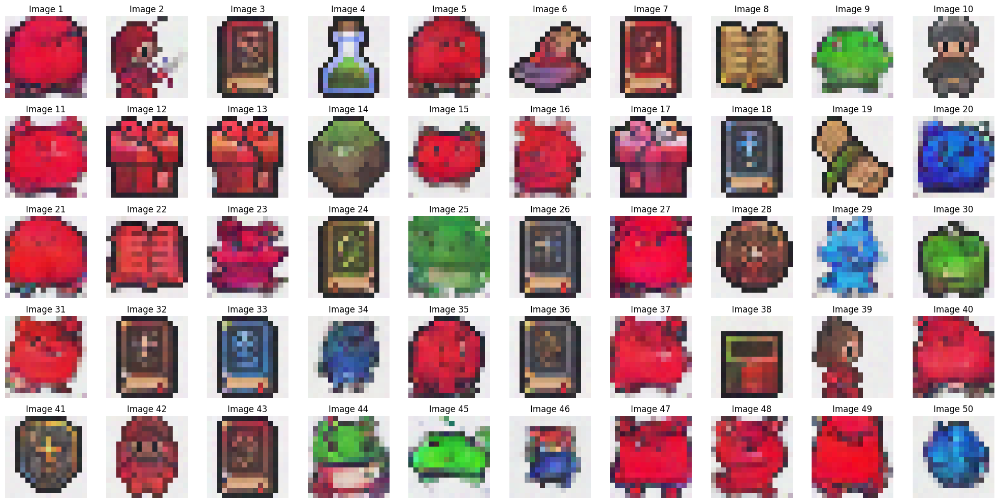

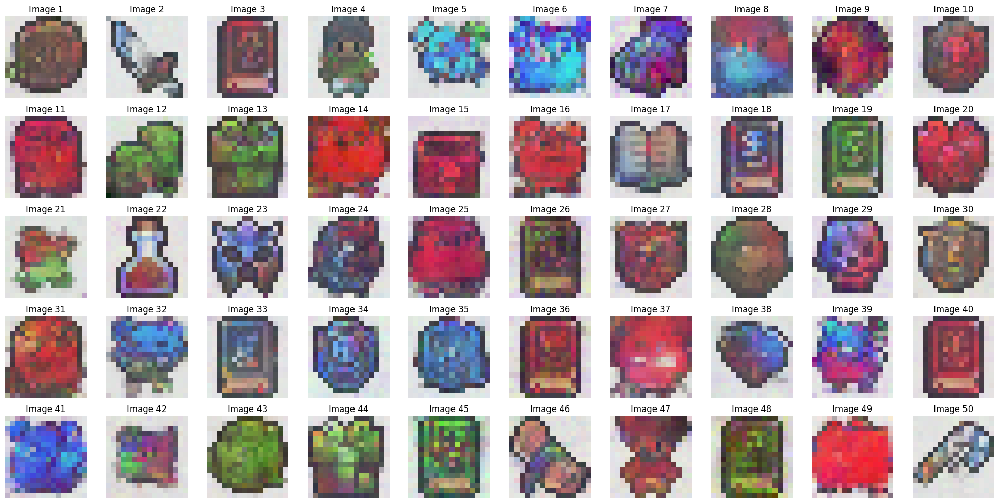

100%|██████████| 1/1 [00:00<00:00,  2.42it/s]


FID Score for DDPM at Epoch 25: 177.93774416658692


100%|██████████| 1/1 [00:00<00:00,  3.21it/s]


FID Score for DDIM at Epoch 25: 169.42066211540117

Epoch 26/40


Training: 100%|██████████| 716/716 [00:34<00:00, 20.92it/s]


Average Loss: 0.040898


DDPM Sampling: 1000it [00:07, 142.43it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 11it [00:00, 108.15it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step


DDIM Sampling: 22it [00:00, 106.17it/s]

Step 479/500: Deterministic step


DDIM Sampling: 33it [00:00, 100.17it/s]

Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step
Step 475/500: Deterministic step
Step 474/500: Deterministic step
Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step


DDIM Sampling: 58it [00:00, 110.18it/s]

Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step
Step 450/500: Deterministic step
Step 449/500: Deterministic step
Step 448/500: Deterministic step
Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step


DDIM Sampling: 81it [00:00, 103.21it/s]

Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step
Step 422/500: Deterministic step
Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step


DDIM Sampling: 103it [00:00, 101.73it/s]

Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step
Step 396/500: Deterministic step
Step 395/500: Deterministic step
Step 394/500: Deterministic step


DDIM Sampling: 125it [00:01, 99.25it/s] 

Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step
Step 374/500: Deterministic step


DDIM Sampling: 145it [00:01, 97.72it/s]

Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step
Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step


DDIM Sampling: 156it [00:01, 100.02it/s]

Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step


DDIM Sampling: 167it [00:01, 98.28it/s] 

Step 334/500: Deterministic step


DDIM Sampling: 177it [00:01, 95.92it/s]

Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step


DDIM Sampling: 198it [00:01, 96.12it/s]

Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step


DDIM Sampling: 224it [00:02, 110.83it/s]

Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step


DDIM Sampling: 250it [00:02, 117.70it/s]

Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step
Step 242/500: Deterministic step
Step 241/500: Deterministic step


DDIM Sampling: 275it [00:02, 115.67it/s]

Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step


DDIM Sampling: 300it [00:02, 120.43it/s]

Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step


DDIM Sampling: 326it [00:03, 124.21it/s]

Step 191/500: Deterministic step
Step 190/500: Deterministic step
Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step

DDIM Sampling: 352it [00:03, 125.89it/s]


Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step


DDIM Sampling: 379it [00:03, 125.73it/s]

Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step


DDIM Sampling: 404it [00:03, 118.41it/s]

Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step
Step 93/500: Deterministic step


DDIM Sampling: 430it [00:03, 123.58it/s]

Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step


DDIM Sampling: 457it [00:04, 126.22it/s]

Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step


DDIM Sampling: 483it [00:04, 126.21it/s]

Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step


DDIM Sampling: 500it [00:04, 112.83it/s]


Step 13/500: Deterministic step
Step 12/500: Deterministic step
Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


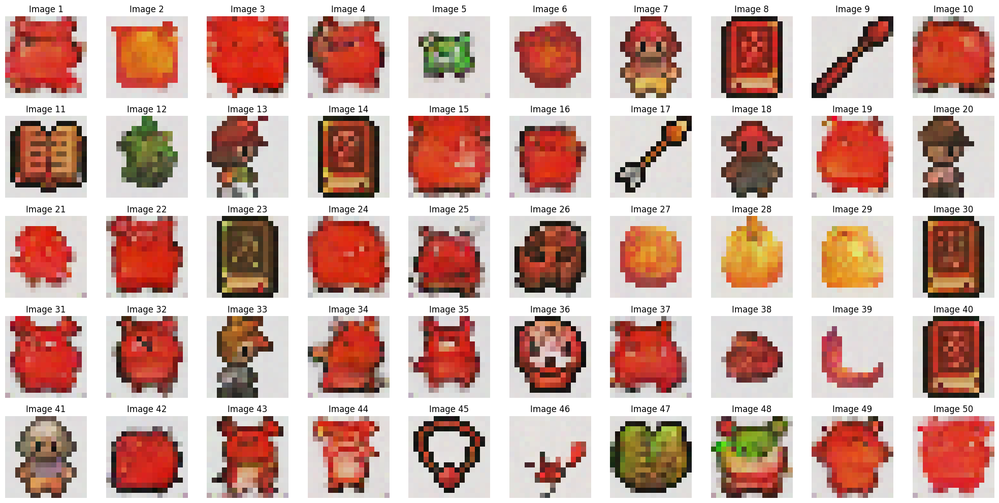

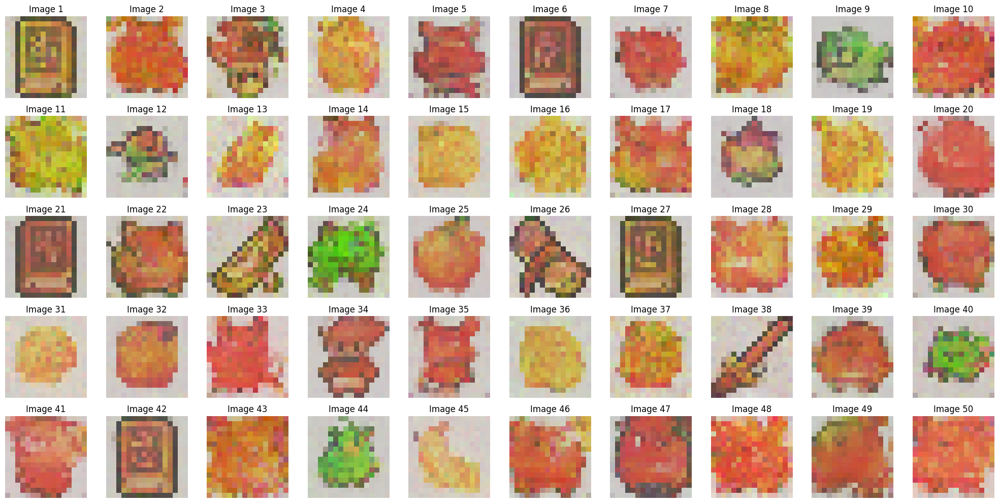

100%|██████████| 1/1 [00:00<00:00,  2.56it/s]


FID Score for DDPM at Epoch 26: 185.51409567028463


100%|██████████| 1/1 [00:00<00:00,  3.01it/s]


FID Score for DDIM at Epoch 26: 266.36160175857907

Epoch 27/40


Training: 100%|██████████| 716/716 [00:34<00:00, 20.88it/s]


Average Loss: 0.041141


DDPM Sampling: 1000it [00:07, 135.24it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 12it [00:00, 117.71it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step

DDIM Sampling: 38it [00:00, 120.97it/s]


Step 475/500: Deterministic step
Step 474/500: Deterministic step
Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step

DDIM Sampling: 64it [00:00, 116.15it/s]


Step 450/500: Deterministic step
Step 449/500: Deterministic step
Step 448/500: Deterministic step
Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step


DDIM Sampling: 89it [00:00, 108.18it/s]

Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step
Step 422/500: Deterministic step
Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step

DDIM Sampling: 114it [00:01, 114.41it/s]


Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step
Step 396/500: Deterministic step
Step 395/500: Deterministic step
Step 394/500: Deterministic step
Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step


DDIM Sampling: 126it [00:01, 114.14it/s]

Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step
Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step

DDIM Sampling: 138it [00:01, 113.61it/s]

DDIM Sampling: 150it [00:01, 112.75it/s]

Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step


DDIM Sampling: 163it [00:01, 117.30it/s]

Step 339/500: Deterministic step
Step 338/500: Deterministic step


DDIM Sampling: 176it [00:01, 119.16it/s]

Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step


DDIM Sampling: 189it [00:01, 121.08it/s]

Step 313/500: Deterministic step
Step 312/500: Deterministic step


DDIM Sampling: 202it [00:01, 123.36it/s]

Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step


DDIM Sampling: 215it [00:01, 125.13it/s]

Step 286/500: Deterministic step
Step 285/500: Deterministic step


DDIM Sampling: 228it [00:01, 121.22it/s]

Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step


DDIM Sampling: 256it [00:02, 126.79it/s]

Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step
Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step


DDIM Sampling: 283it [00:02, 128.36it/s]

Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step
Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step


DDIM Sampling: 309it [00:02, 127.22it/s]

Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step
Step 190/500: Deterministic step
Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step


DDIM Sampling: 336it [00:02, 128.02it/s]

Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step


DDIM Sampling: 362it [00:03, 123.29it/s]

Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step


DDIM Sampling: 389it [00:03, 126.80it/s]

Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step


DDIM Sampling: 415it [00:03, 125.71it/s]

Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step


DDIM Sampling: 441it [00:03, 124.34it/s]

Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step

DDIM Sampling: 468it [00:03, 126.62it/s]


Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step


DDIM Sampling: 494it [00:04, 122.84it/s]

Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step
Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step


DDIM Sampling: 500it [00:04, 121.38it/s]


Step 1/500: Deterministic step
DDIM sampling completed.


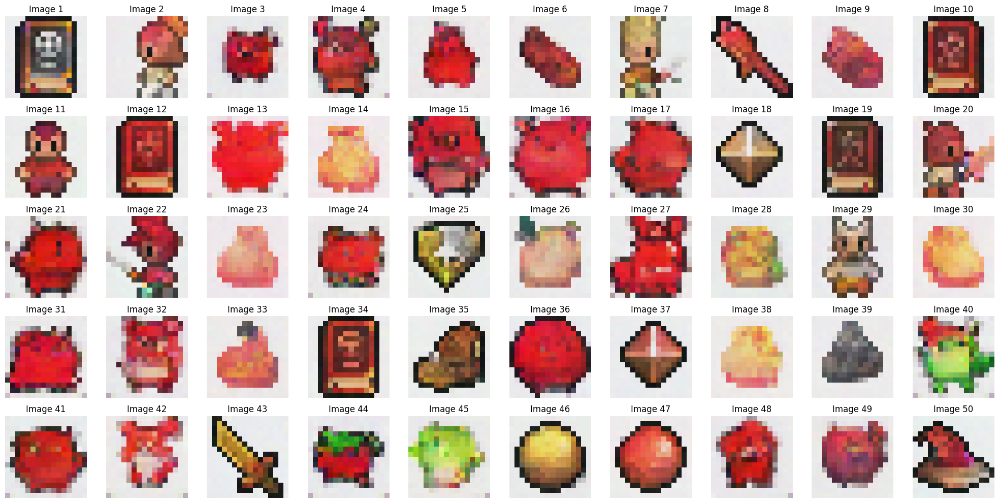

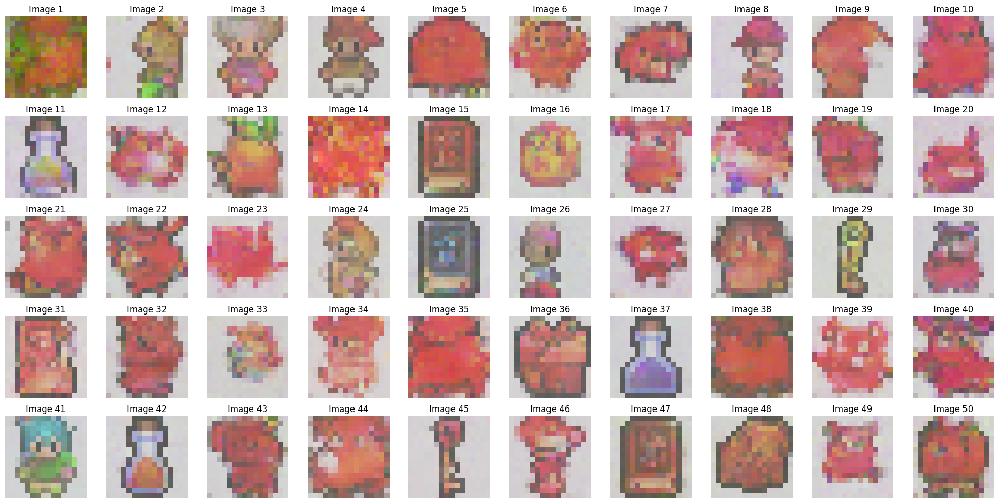

100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


FID Score for DDPM at Epoch 27: 178.02121037990554


100%|██████████| 1/1 [00:00<00:00,  3.16it/s]


FID Score for DDIM at Epoch 27: 197.77169945379467

Epoch 28/40


Training: 100%|██████████| 716/716 [00:35<00:00, 20.09it/s]


Average Loss: 0.039292


DDPM Sampling: 1000it [00:07, 138.32it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 14it [00:00, 130.64it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step


DDIM Sampling: 41it [00:00, 116.88it/s]

Step 476/500: Deterministic step
Step 475/500: Deterministic step
Step 474/500: Deterministic step
Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step


DDIM Sampling: 68it [00:00, 124.74it/s]

Step 451/500: Deterministic step
Step 450/500: Deterministic step
Step 449/500: Deterministic step
Step 448/500: Deterministic step
Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step


DDIM Sampling: 95it [00:00, 127.73it/s]

Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step
Step 422/500: Deterministic step
Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step


DDIM Sampling: 121it [00:00, 127.56it/s]

Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step
Step 396/500: Deterministic step
Step 395/500: Deterministic step
Step 394/500: Deterministic step
Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step


DDIM Sampling: 148it [00:01, 123.95it/s]

Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step
Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step


DDIM Sampling: 175it [00:01, 125.35it/s]

Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step

DDIM Sampling: 201it [00:01, 127.07it/s]


Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step


DDIM Sampling: 214it [00:01, 126.05it/s]

Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step


DDIM Sampling: 228it [00:01, 127.35it/s]

Step 273/500: Deterministic step


DDIM Sampling: 241it [00:01, 127.65it/s]

Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step


DDIM Sampling: 254it [00:02, 125.81it/s]

Step 247/500: Deterministic step


DDIM Sampling: 267it [00:02, 126.19it/s]

Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step
Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step

DDIM Sampling: 281it [00:02, 127.44it/s]


Step 220/500: Deterministic step


DDIM Sampling: 294it [00:02, 122.42it/s]

Step 219/500: Deterministic step
Step 218/500: Deterministic step
Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step


DDIM Sampling: 321it [00:02, 126.11it/s]

Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step
Step 190/500: Deterministic step
Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step


DDIM Sampling: 347it [00:02, 127.56it/s]

Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step

DDIM Sampling: 373it [00:02, 127.75it/s]


Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step

DDIM Sampling: 400it [00:03, 123.92it/s]


Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step


DDIM Sampling: 426it [00:03, 120.93it/s]

Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step

DDIM Sampling: 453it [00:03, 124.88it/s]


Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step


DDIM Sampling: 479it [00:03, 126.29it/s]

Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step


DDIM Sampling: 500it [00:04, 123.92it/s]


Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step
Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


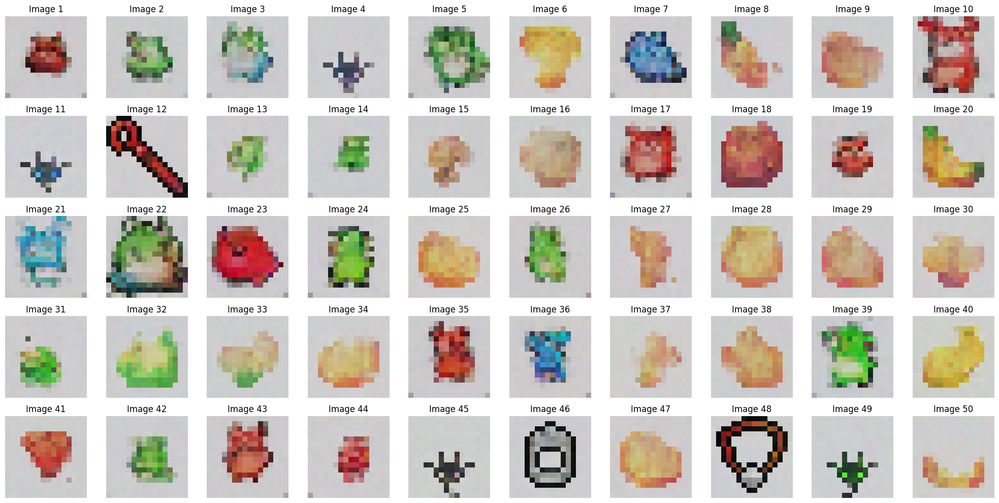

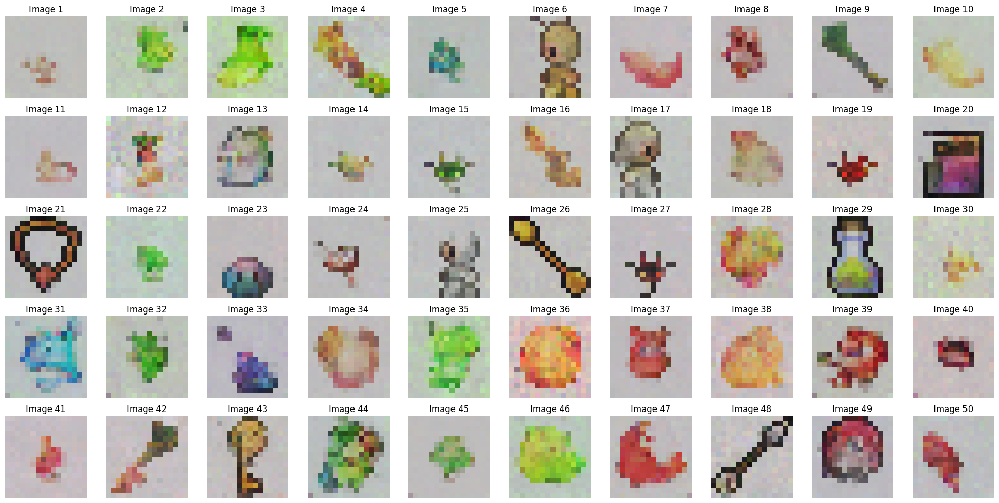

100%|██████████| 1/1 [00:00<00:00,  3.12it/s]


FID Score for DDPM at Epoch 28: 195.23250260041385


100%|██████████| 1/1 [00:00<00:00,  2.91it/s]


FID Score for DDIM at Epoch 28: 208.8946921028794

Epoch 29/40


Training: 100%|██████████| 716/716 [00:35<00:00, 19.94it/s]


Average Loss: 0.038813


DDPM Sampling: 1000it [00:06, 142.89it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 13it [00:00, 129.04it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step


DDIM Sampling: 27it [00:00, 130.44it/s]

Step 475/500: Deterministic step
Step 474/500: Deterministic step


DDIM Sampling: 41it [00:00, 127.41it/s]

Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step
Step 450/500: Deterministic step
Step 449/500: Deterministic step
Step 448/500: Deterministic step


DDIM Sampling: 67it [00:00, 116.61it/s]

Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step


DDIM Sampling: 94it [00:00, 124.12it/s]

Step 424/500: Deterministic step
Step 423/500: Deterministic step
Step 422/500: Deterministic step
Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step


DDIM Sampling: 121it [00:00, 127.29it/s]

Step 397/500: Deterministic step
Step 396/500: Deterministic step
Step 395/500: Deterministic step
Step 394/500: Deterministic step
Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step


DDIM Sampling: 147it [00:01, 127.96it/s]

Step 370/500: Deterministic step
Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step


DDIM Sampling: 174it [00:01, 127.47it/s]

Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step
Step 319/500: Deterministic step


DDIM Sampling: 200it [00:01, 115.73it/s]

Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step


DDIM Sampling: 226it [00:01, 121.65it/s]

Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step


DDIM Sampling: 253it [00:02, 125.74it/s]

Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step
Step 245/500: Deterministic step


DDIM Sampling: 280it [00:02, 127.66it/s]

Step 244/500: Deterministic step
Step 243/500: Deterministic step
Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step


DDIM Sampling: 293it [00:02, 125.94it/s]

Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step


DDIM Sampling: 307it [00:02, 125.35it/s]

Step 194/500: Deterministic step


DDIM Sampling: 320it [00:02, 118.02it/s]

Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step
Step 190/500: Deterministic step
Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step


DDIM Sampling: 346it [00:02, 121.36it/s]

Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step

DDIM Sampling: 373it [00:03, 125.57it/s]


Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step


DDIM Sampling: 400it [00:03, 123.62it/s]

Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step


DDIM Sampling: 426it [00:03, 121.65it/s]

Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step

DDIM Sampling: 439it [00:03, 114.48it/s]


Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step

DDIM Sampling: 462it [00:03, 105.12it/s]


Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step
Step 33/500: Deterministic step


DDIM Sampling: 484it [00:04, 100.49it/s]

Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step


DDIM Sampling: 500it [00:04, 118.50it/s]


Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


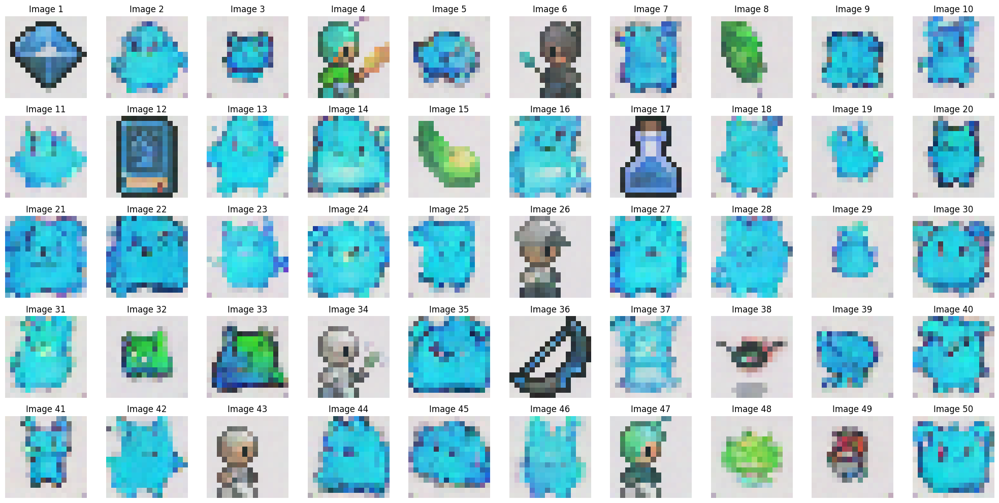

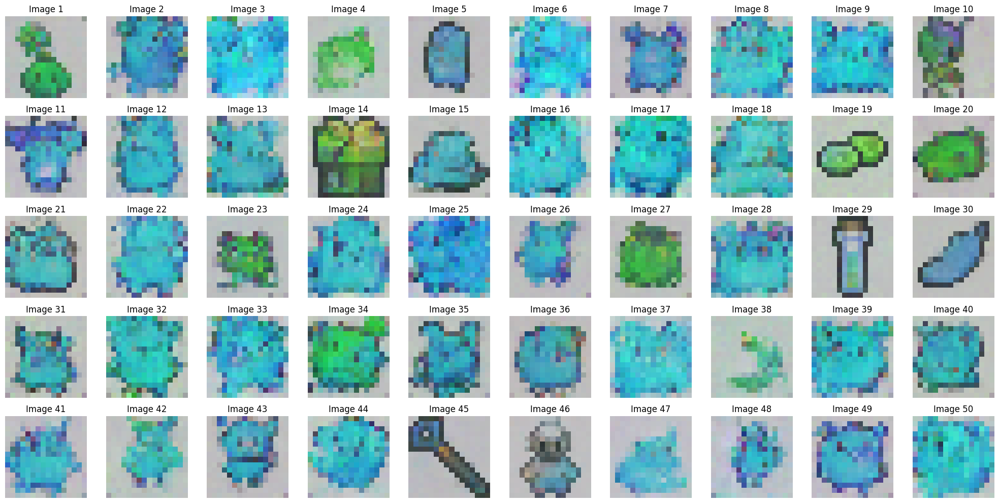

100%|██████████| 1/1 [00:00<00:00,  3.03it/s]


FID Score for DDPM at Epoch 29: 184.97902582809724


100%|██████████| 1/1 [00:00<00:00,  2.58it/s]


FID Score for DDIM at Epoch 29: 232.13062549956652

Epoch 30/40


Training: 100%|██████████| 716/716 [00:34<00:00, 20.59it/s]


Average Loss: 0.039233


DDPM Sampling: 1000it [00:06, 143.49it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 9it [00:00, 83.14it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step


DDIM Sampling: 32it [00:00, 105.85it/s]

Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step
Step 475/500: Deterministic step
Step 474/500: Deterministic step
Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step

DDIM Sampling: 56it [00:00, 113.20it/s]


Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step
Step 450/500: Deterministic step
Step 449/500: Deterministic step
Step 448/500: Deterministic step
Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step


DDIM Sampling: 81it [00:00, 114.76it/s]

Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step
Step 422/500: Deterministic step
Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step


DDIM Sampling: 108it [00:00, 122.04it/s]

Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step
Step 396/500: Deterministic step
Step 395/500: Deterministic step
Step 394/500: Deterministic step
Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step


DDIM Sampling: 135it [00:01, 123.36it/s]

Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step
Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step


DDIM Sampling: 163it [00:01, 127.46it/s]

Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step


DDIM Sampling: 189it [00:01, 111.98it/s]

Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step


DDIM Sampling: 201it [00:01, 105.47it/s]

Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step


DDIM Sampling: 223it [00:02, 100.04it/s]

Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step


DDIM Sampling: 245it [00:02, 102.39it/s]

Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step


DDIM Sampling: 267it [00:02, 101.36it/s]

Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step
Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step


DDIM Sampling: 289it [00:02, 97.46it/s] 

Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step
Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step


DDIM Sampling: 311it [00:02, 99.88it/s]

Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step
Step 190/500: Deterministic step


DDIM Sampling: 336it [00:03, 109.63it/s]

Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step


DDIM Sampling: 361it [00:03, 114.99it/s]

Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step


DDIM Sampling: 373it [00:03, 116.01it/s]

Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step


DDIM Sampling: 396it [00:03, 102.55it/s]

Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step


DDIM Sampling: 420it [00:03, 109.24it/s]

Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step


DDIM Sampling: 446it [00:04, 118.02it/s]

Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step

DDIM Sampling: 473it [00:04, 124.96it/s]


Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step


DDIM Sampling: 500it [00:04, 111.33it/s]

Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step
Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


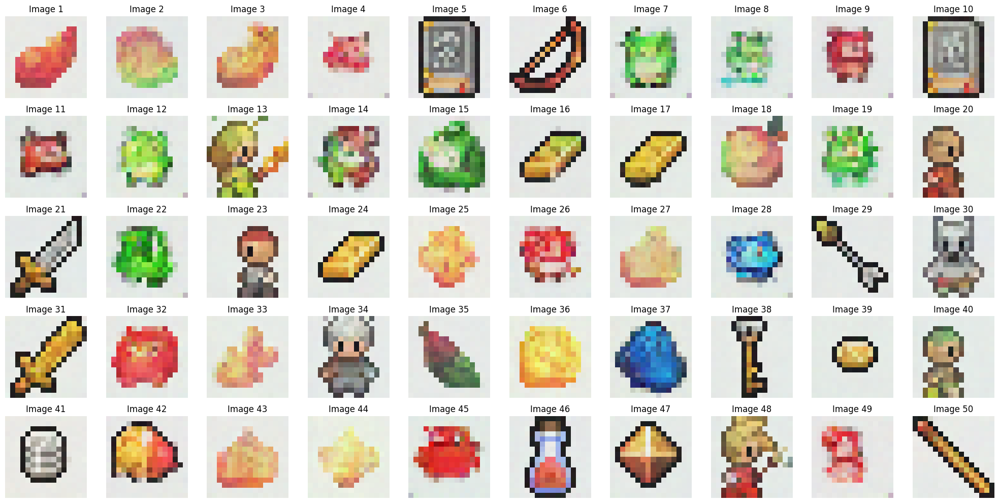

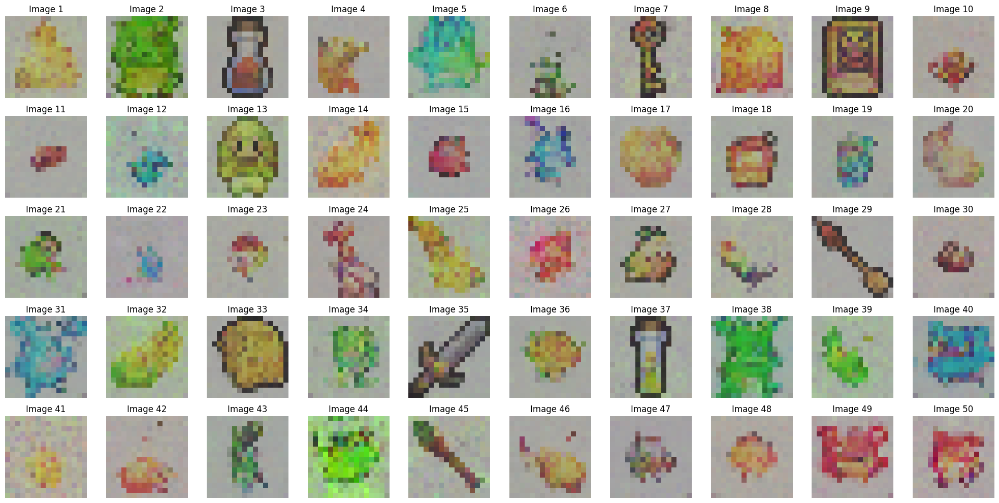

100%|██████████| 1/1 [00:00<00:00,  2.68it/s]


FID Score for DDPM at Epoch 30: 162.6924921697937


100%|██████████| 1/1 [00:00<00:00,  3.09it/s]


FID Score for DDIM at Epoch 30: 243.8025303875371

Epoch 31/40


Training: 100%|██████████| 716/716 [00:34<00:00, 20.81it/s]


Average Loss: 0.039159


DDPM Sampling: 1000it [00:07, 140.43it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 11it [00:00, 104.56it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step

DDIM Sampling: 34it [00:00, 108.93it/s]


Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step
Step 475/500: Deterministic step
Step 474/500: Deterministic step
Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step


DDIM Sampling: 56it [00:00, 107.02it/s]

Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step
Step 450/500: Deterministic step
Step 449/500: Deterministic step
Step 448/500: Deterministic step
Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step


DDIM Sampling: 78it [00:00, 103.56it/s]

Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step
Step 422/500: Deterministic step
Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step


DDIM Sampling: 103it [00:00, 114.45it/s]

Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step
Step 396/500: Deterministic step
Step 395/500: Deterministic step
Step 394/500: Deterministic step
Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step


DDIM Sampling: 128it [00:01, 111.49it/s]

Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step
Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step


DDIM Sampling: 151it [00:01, 102.22it/s]

Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step


DDIM Sampling: 178it [00:01, 115.17it/s]

Step 346/500: Deterministic step
Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step


DDIM Sampling: 203it [00:01, 118.27it/s]

Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step


DDIM Sampling: 230it [00:02, 124.77it/s]

Step 294/500: Deterministic step
Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step


DDIM Sampling: 256it [00:02, 126.32it/s]

Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step
Step 242/500: Deterministic step


DDIM Sampling: 282it [00:02, 125.34it/s]

Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step
Step 217/500: Deterministic step
Step 216/500: Deterministic step


DDIM Sampling: 309it [00:02, 128.16it/s]

Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step
Step 190/500: Deterministic step
Step 189/500: Deterministic step


DDIM Sampling: 336it [00:02, 127.02it/s]

Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step
Step 163/500: Deterministic step


DDIM Sampling: 363it [00:03, 129.38it/s]

Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step


DDIM Sampling: 389it [00:03, 128.78it/s]

Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step


DDIM Sampling: 416it [00:03, 128.73it/s]

Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step


DDIM Sampling: 443it [00:03, 128.83it/s]

Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step

DDIM Sampling: 469it [00:03, 125.78it/s]


Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step


DDIM Sampling: 496it [00:04, 128.26it/s]

Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step
Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step


DDIM Sampling: 500it [00:04, 120.45it/s]


Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


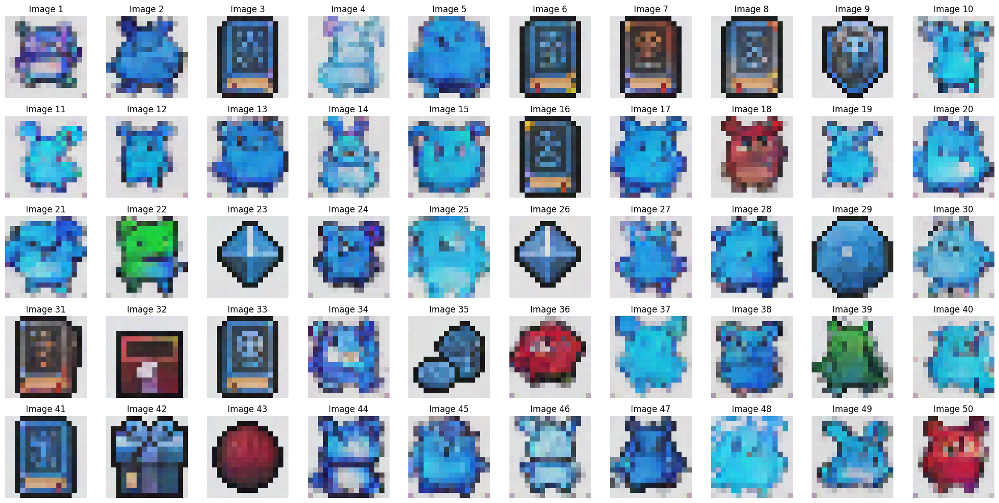

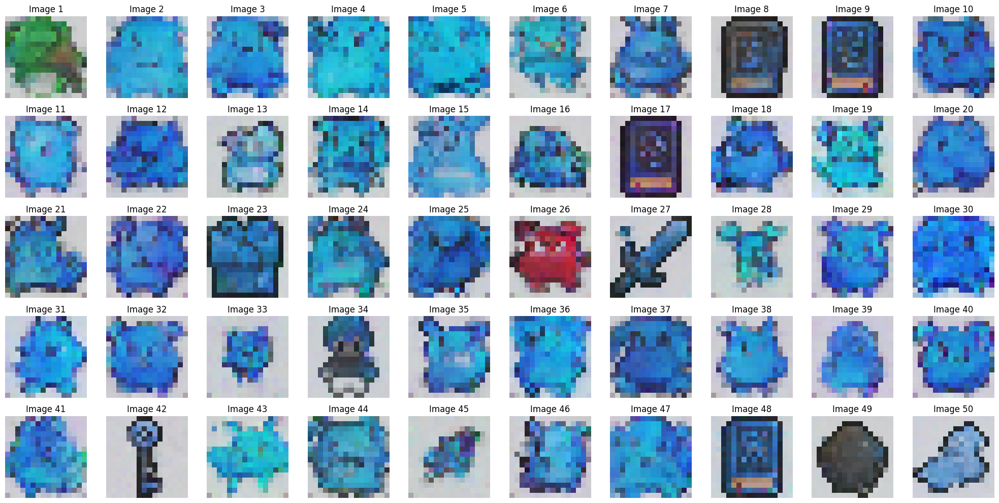

100%|██████████| 1/1 [00:00<00:00,  2.68it/s]


FID Score for DDPM at Epoch 31: 180.8201228953906


100%|██████████| 1/1 [00:00<00:00,  3.00it/s]


FID Score for DDIM at Epoch 31: 209.7991231613765

Epoch 32/40


Training: 100%|██████████| 716/716 [00:35<00:00, 20.45it/s]


Average Loss: 0.037968


DDPM Sampling: 1000it [00:07, 133.60it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 14it [00:00, 135.05it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step
Step 475/500: Deterministic step
Step 474/500: Deterministic step


DDIM Sampling: 42it [00:00, 130.13it/s]

Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step
Step 450/500: Deterministic step
Step 449/500: Deterministic step
Step 448/500: Deterministic step
Step 447/500: Deterministic step


DDIM Sampling: 70it [00:00, 131.83it/s]

Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step
Step 422/500: Deterministic step
Step 421/500: Deterministic step
Step 420/500: Deterministic step


DDIM Sampling: 98it [00:00, 127.41it/s]

Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step
Step 396/500: Deterministic step
Step 395/500: Deterministic step


DDIM Sampling: 124it [00:00, 126.45it/s]

Step 394/500: Deterministic step
Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step
Step 369/500: Deterministic step


DDIM Sampling: 151it [00:01, 127.49it/s]

Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step


DDIM Sampling: 178it [00:01, 129.22it/s]

Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step


DDIM Sampling: 205it [00:01, 128.82it/s]

Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step


DDIM Sampling: 231it [00:01, 119.78it/s]

Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step


DDIM Sampling: 244it [00:01, 117.06it/s]

Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step
Step 245/500: Deterministic step


DDIM Sampling: 257it [00:02, 120.38it/s]

Step 244/500: Deterministic step
Step 243/500: Deterministic step
Step 242/500: Deterministic step
Step 241/500: Deterministic step

DDIM Sampling: 270it [00:02, 122.88it/s]


Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step


DDIM Sampling: 284it [00:02, 125.41it/s]

Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step

DDIM Sampling: 298it [00:02, 126.93it/s]


Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step


DDIM Sampling: 311it [00:02, 127.72it/s]

Step 190/500: Deterministic step
Step 189/500: Deterministic step


DDIM Sampling: 325it [00:02, 128.66it/s]

Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step


DDIM Sampling: 338it [00:02, 127.69it/s]

Step 163/500: Deterministic step


DDIM Sampling: 351it [00:02, 124.91it/s]

Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step


DDIM Sampling: 364it [00:02, 125.42it/s]

Step 138/500: Deterministic step
Step 137/500: Deterministic step


DDIM Sampling: 377it [00:02, 124.06it/s]

Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step


DDIM Sampling: 390it [00:03, 124.99it/s]

Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step


DDIM Sampling: 403it [00:03, 125.40it/s]

Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step


DDIM Sampling: 417it [00:03, 127.59it/s]

Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step


DDIM Sampling: 431it [00:03, 129.09it/s]

Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step


DDIM Sampling: 459it [00:03, 131.18it/s]

Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step


DDIM Sampling: 486it [00:03, 129.52it/s]

Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step
Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step


DDIM Sampling: 500it [00:03, 126.69it/s]


Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


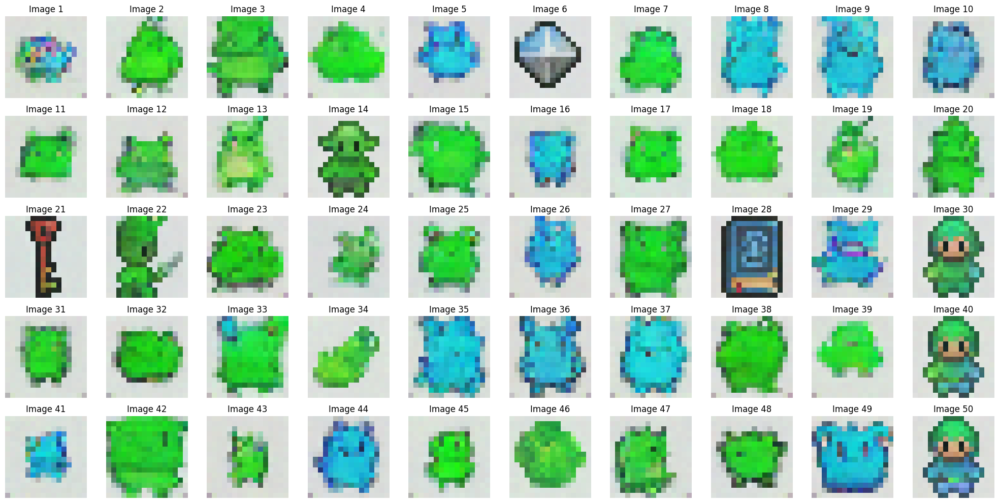

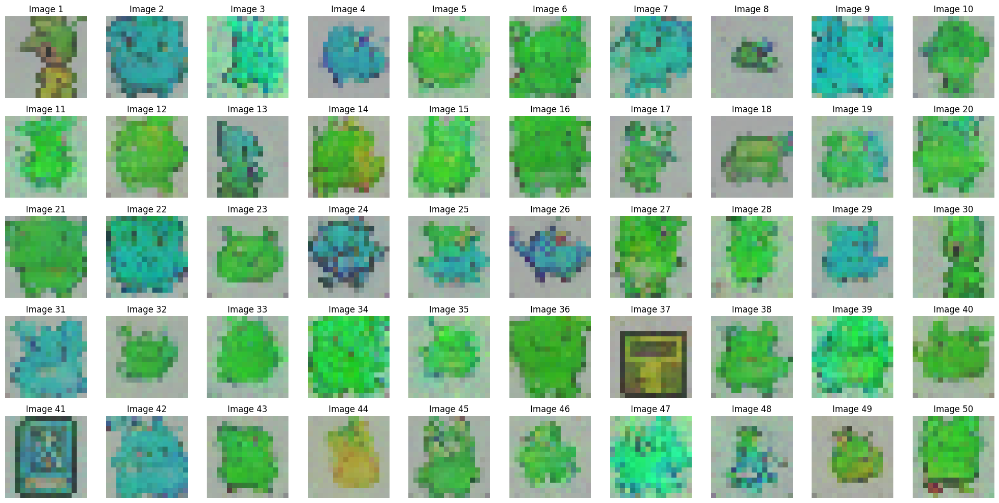

100%|██████████| 1/1 [00:00<00:00,  2.67it/s]


FID Score for DDPM at Epoch 32: 179.39225753218545


100%|██████████| 1/1 [00:00<00:00,  3.15it/s]


FID Score for DDIM at Epoch 32: 301.41868722186655

Epoch 33/40


Training: 100%|██████████| 716/716 [00:35<00:00, 20.16it/s]


Average Loss: 0.038000


DDPM Sampling: 1000it [00:07, 142.40it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 14it [00:00, 128.66it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step
Step 475/500: Deterministic step
Step 474/500: Deterministic step

DDIM Sampling: 40it [00:00, 126.02it/s]


Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step


DDIM Sampling: 67it [00:00, 123.48it/s]

Step 450/500: Deterministic step
Step 449/500: Deterministic step
Step 448/500: Deterministic step
Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step

DDIM Sampling: 94it [00:00, 123.55it/s]


Step 424/500: Deterministic step
Step 423/500: Deterministic step
Step 422/500: Deterministic step
Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step


DDIM Sampling: 121it [00:00, 127.34it/s]

Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step
Step 396/500: Deterministic step
Step 395/500: Deterministic step
Step 394/500: Deterministic step
Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step


DDIM Sampling: 147it [00:01, 125.83it/s]

Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step
Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step


DDIM Sampling: 173it [00:01, 125.74it/s]

Step 346/500: Deterministic step
Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step

DDIM Sampling: 200it [00:01, 126.77it/s]


Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step


DDIM Sampling: 227it [00:01, 125.54it/s]

Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step


DDIM Sampling: 254it [00:02, 128.08it/s]

Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step


DDIM Sampling: 280it [00:02, 127.94it/s]

Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step
Step 217/500: Deterministic step
Step 216/500: Deterministic step

DDIM Sampling: 307it [00:02, 127.87it/s]


Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step


DDIM Sampling: 333it [00:02, 126.98it/s]

Step 190/500: Deterministic step
Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step


DDIM Sampling: 360it [00:02, 124.74it/s]

Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step


DDIM Sampling: 386it [00:03, 126.74it/s]

Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step


DDIM Sampling: 412it [00:03, 127.83it/s]

Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step


DDIM Sampling: 425it [00:03, 113.79it/s]

Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step

DDIM Sampling: 449it [00:03, 111.82it/s]


Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step

DDIM Sampling: 474it [00:03, 111.36it/s]


Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step

DDIM Sampling: 500it [00:04, 122.37it/s]


Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step
Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


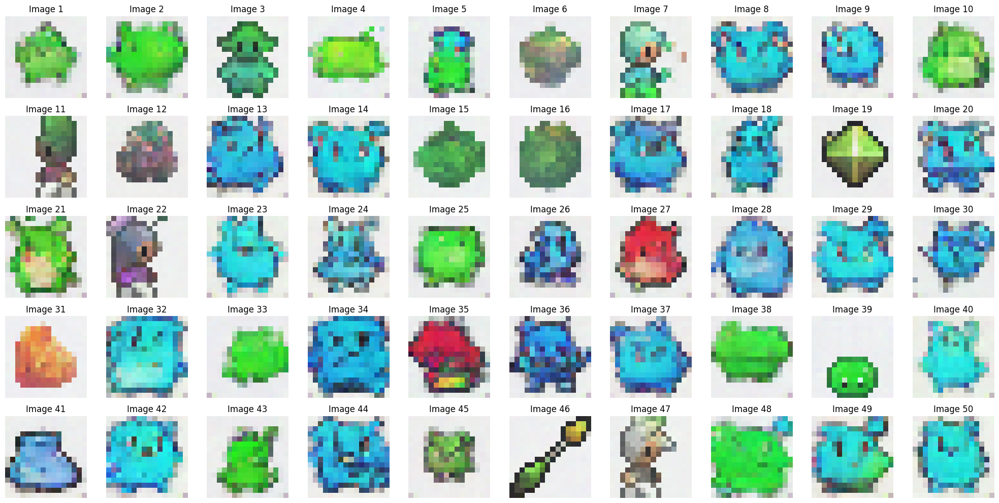

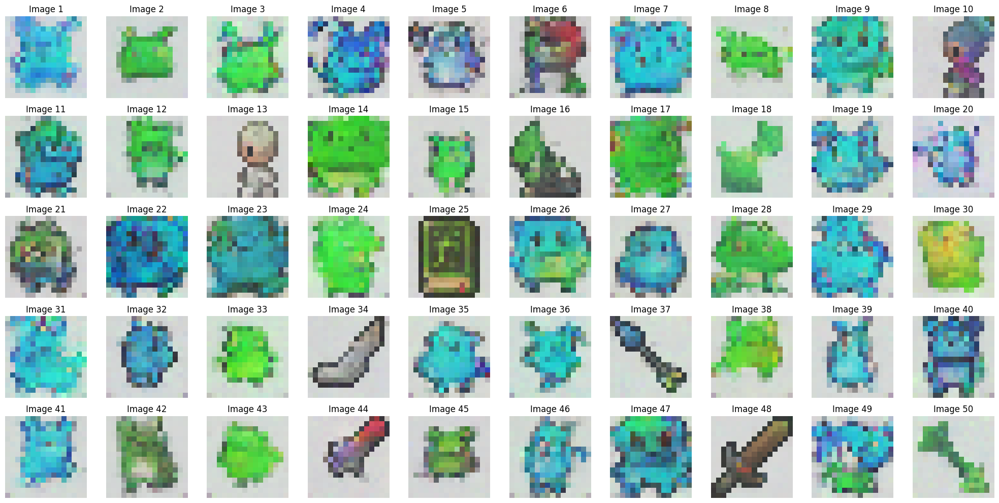

100%|██████████| 1/1 [00:00<00:00,  2.99it/s]


FID Score for DDPM at Epoch 33: 164.08642614283747


100%|██████████| 1/1 [00:00<00:00,  2.55it/s]


FID Score for DDIM at Epoch 33: 185.91804118880412

Epoch 34/40


Training: 100%|██████████| 716/716 [00:35<00:00, 20.42it/s]


Average Loss: 0.036916


DDPM Sampling: 1000it [00:06, 145.17it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 14it [00:00, 131.44it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step


DDIM Sampling: 41it [00:00, 109.56it/s]

Step 475/500: Deterministic step
Step 474/500: Deterministic step
Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step


DDIM Sampling: 64it [00:00, 102.46it/s]

Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step
Step 450/500: Deterministic step
Step 449/500: Deterministic step
Step 448/500: Deterministic step
Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step


DDIM Sampling: 86it [00:00, 101.14it/s]

Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step
Step 422/500: Deterministic step
Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step


DDIM Sampling: 98it [00:00, 103.62it/s]

Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step
Step 396/500: Deterministic step
Step 395/500: Deterministic step

DDIM Sampling: 120it [00:01, 99.10it/s]


Step 394/500: Deterministic step
Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step


DDIM Sampling: 145it [00:01, 109.63it/s]

Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step
Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step


DDIM Sampling: 171it [00:01, 116.99it/s]

Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step


DDIM Sampling: 197it [00:01, 121.95it/s]

Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step


DDIM Sampling: 210it [00:01, 112.34it/s]

Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step


DDIM Sampling: 233it [00:02, 104.93it/s]

Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step

DDIM Sampling: 259it [00:02, 113.96it/s]


Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step
Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step


DDIM Sampling: 283it [00:02, 109.10it/s]

Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step
Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step


DDIM Sampling: 305it [00:02, 106.80it/s]

Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step
Step 190/500: Deterministic step
Step 189/500: Deterministic step


DDIM Sampling: 327it [00:03, 99.85it/s] 

Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step


DDIM Sampling: 348it [00:03, 98.33it/s]

Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step


DDIM Sampling: 368it [00:03, 91.50it/s]

Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step


DDIM Sampling: 394it [00:03, 108.95it/s]

Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step


DDIM Sampling: 419it [00:03, 115.47it/s]

Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step
Step 82/500: Deterministic step


DDIM Sampling: 431it [00:04, 112.04it/s]

Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step


DDIM Sampling: 458it [00:04, 120.57it/s]

Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step


DDIM Sampling: 485it [00:04, 123.18it/s]

Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step
Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step


DDIM Sampling: 500it [00:04, 109.13it/s]


Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


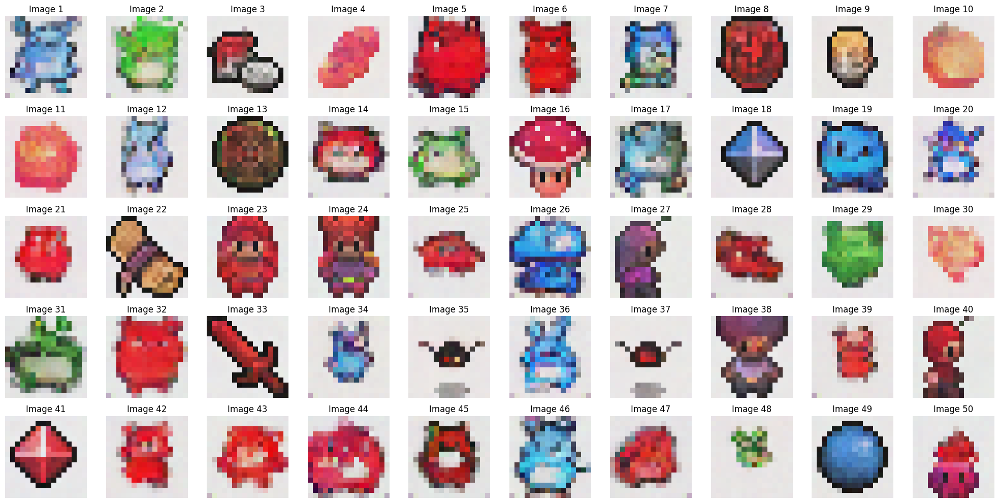

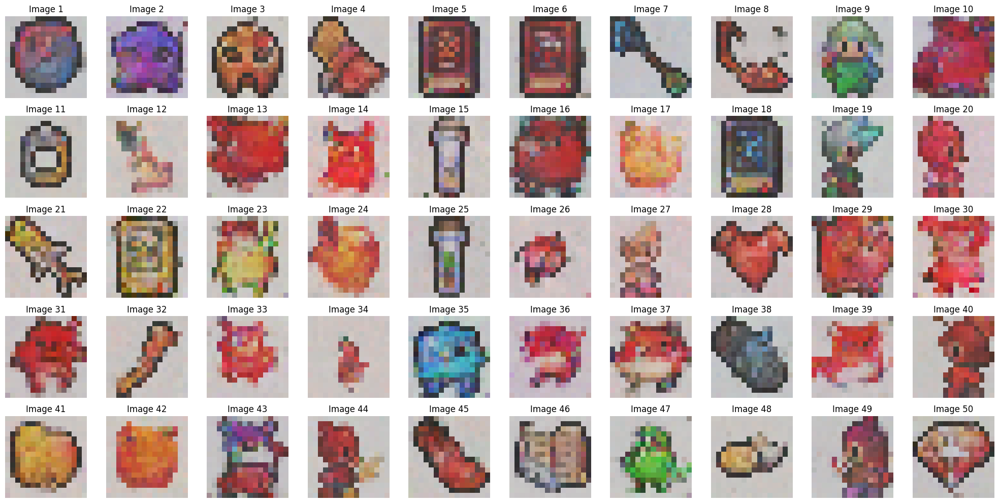

100%|██████████| 1/1 [00:00<00:00,  2.92it/s]


FID Score for DDPM at Epoch 34: 155.29109557261262


100%|██████████| 1/1 [00:00<00:00,  3.09it/s]


FID Score for DDIM at Epoch 34: 164.47114578042275

Epoch 35/40


Training: 100%|██████████| 716/716 [00:34<00:00, 20.59it/s]


Average Loss: 0.036714


DDPM Sampling: 1000it [00:07, 132.72it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 14it [00:00, 136.49it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step
Step 475/500: Deterministic step


DDIM Sampling: 42it [00:00, 126.26it/s]

Step 474/500: Deterministic step
Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step
Step 450/500: Deterministic step


DDIM Sampling: 68it [00:00, 126.13it/s]

Step 449/500: Deterministic step
Step 448/500: Deterministic step
Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step


DDIM Sampling: 94it [00:00, 124.97it/s]

Step 423/500: Deterministic step
Step 422/500: Deterministic step
Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step


DDIM Sampling: 120it [00:00, 121.74it/s]

Step 397/500: Deterministic step
Step 396/500: Deterministic step
Step 395/500: Deterministic step
Step 394/500: Deterministic step
Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step
Step 374/500: Deterministic step


DDIM Sampling: 146it [00:01, 117.91it/s]

Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step
Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step


DDIM Sampling: 172it [00:01, 122.66it/s]

Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step


DDIM Sampling: 198it [00:01, 124.95it/s]

Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step


DDIM Sampling: 225it [00:01, 125.18it/s]

Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step


DDIM Sampling: 251it [00:02, 124.98it/s]

Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step


DDIM Sampling: 277it [00:02, 123.09it/s]

Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step
Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step


DDIM Sampling: 304it [00:02, 126.33it/s]

Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step
Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step


DDIM Sampling: 331it [00:02, 126.09it/s]

Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step
Step 190/500: Deterministic step
Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step


DDIM Sampling: 358it [00:02, 127.83it/s]

Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step


DDIM Sampling: 371it [00:02, 127.83it/s]

Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step

DDIM Sampling: 398it [00:03, 124.74it/s]


Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step


DDIM Sampling: 424it [00:03, 125.93it/s]

Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step


DDIM Sampling: 450it [00:03, 125.50it/s]

Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step


DDIM Sampling: 477it [00:03, 128.31it/s]

Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step


DDIM Sampling: 500it [00:03, 125.02it/s]


Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


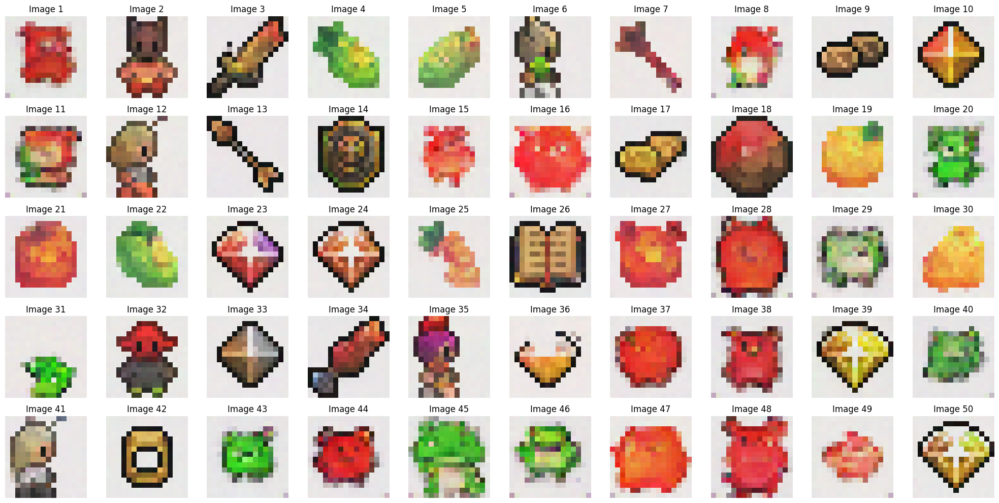

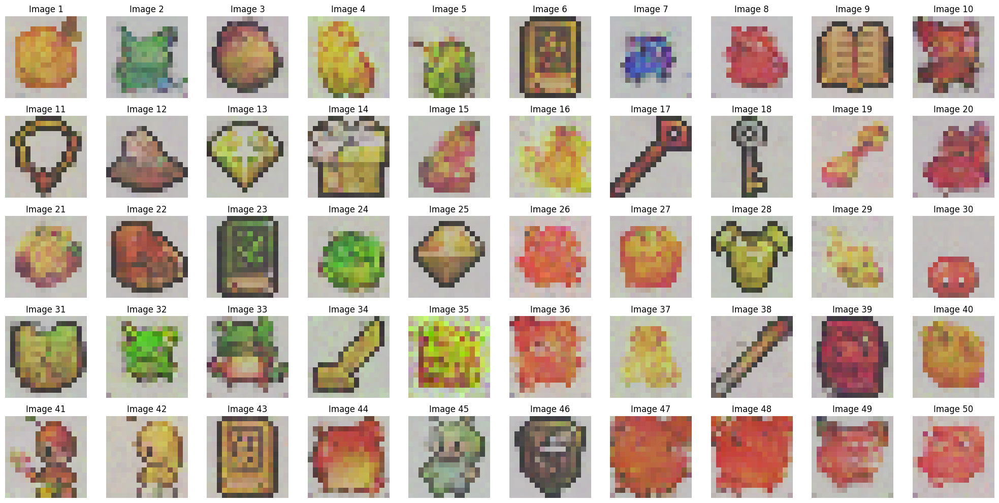

100%|██████████| 1/1 [00:00<00:00,  2.92it/s]


FID Score for DDPM at Epoch 35: 156.280875103053


100%|██████████| 1/1 [00:00<00:00,  2.71it/s]


FID Score for DDIM at Epoch 35: 189.74983870955106

Epoch 36/40


Training: 100%|██████████| 716/716 [00:35<00:00, 20.38it/s]


Average Loss: 0.036941


DDPM Sampling: 1000it [00:07, 142.42it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 14it [00:00, 131.34it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step
Step 475/500: Deterministic step
Step 474/500: Deterministic step


DDIM Sampling: 42it [00:00, 129.91it/s]

Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step
Step 450/500: Deterministic step
Step 449/500: Deterministic step
Step 448/500: Deterministic step


DDIM Sampling: 68it [00:00, 124.19it/s]

Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step


DDIM Sampling: 94it [00:00, 117.68it/s]

Step 423/500: Deterministic step
Step 422/500: Deterministic step
Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step


DDIM Sampling: 120it [00:00, 121.19it/s]

Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step
Step 396/500: Deterministic step
Step 395/500: Deterministic step
Step 394/500: Deterministic step
Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step

DDIM Sampling: 145it [00:01, 111.78it/s]


Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step
Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step

DDIM Sampling: 169it [00:01, 112.71it/s]


Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step


DDIM Sampling: 181it [00:01, 109.46it/s]

Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step


DDIM Sampling: 203it [00:01, 102.96it/s]

Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step


DDIM Sampling: 228it [00:01, 112.51it/s]

Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step


DDIM Sampling: 253it [00:02, 110.03it/s]

Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step


DDIM Sampling: 277it [00:02, 109.67it/s]

Step 243/500: Deterministic step
Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step


DDIM Sampling: 301it [00:02, 110.37it/s]

Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step
Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step


DDIM Sampling: 326it [00:02, 113.40it/s]

Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step
Step 190/500: Deterministic step
Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step


DDIM Sampling: 339it [00:02, 116.24it/s]

Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step

DDIM Sampling: 366it [00:03, 122.05it/s]


Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step


DDIM Sampling: 391it [00:03, 111.79it/s]

Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step


DDIM Sampling: 414it [00:03, 106.77it/s]

Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step


DDIM Sampling: 441it [00:03, 117.83it/s]

Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step


DDIM Sampling: 468it [00:04, 124.83it/s]

Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step


DDIM Sampling: 496it [00:04, 126.98it/s]

Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step
Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step


DDIM Sampling: 500it [00:04, 115.53it/s]


Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


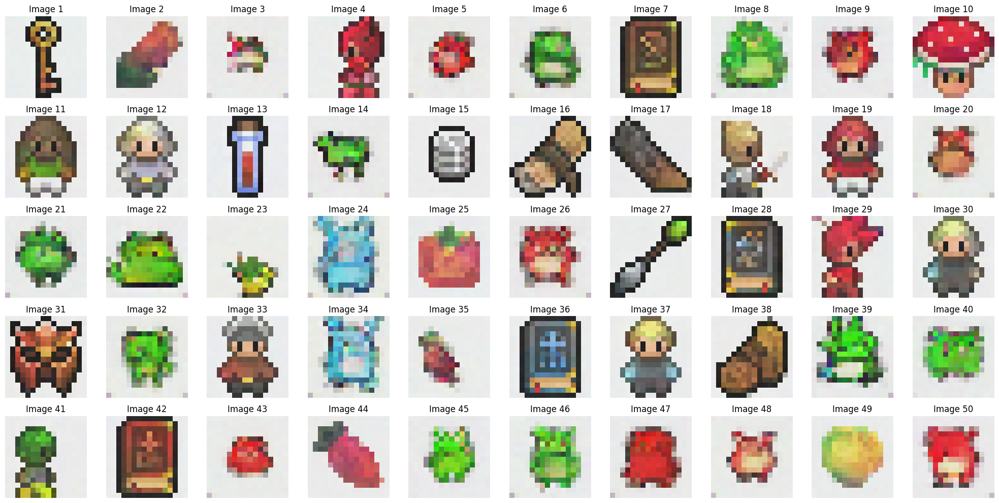

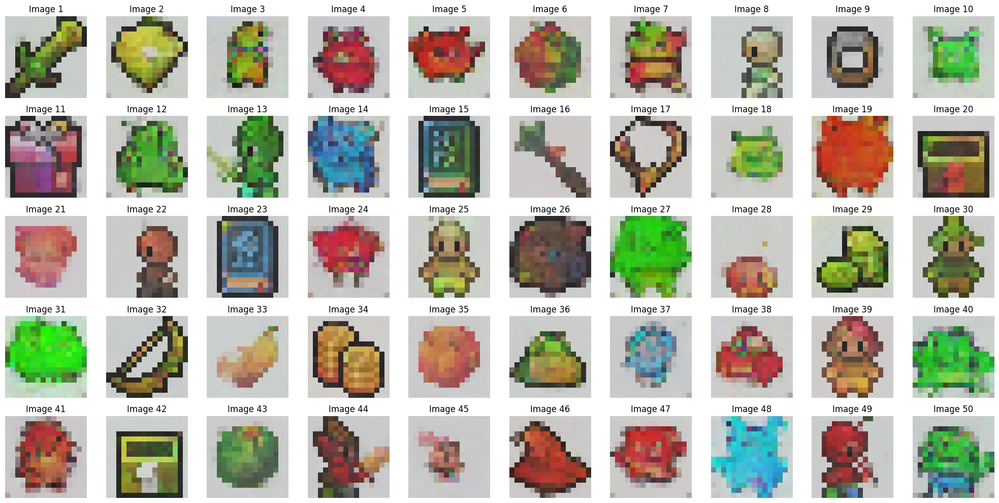

100%|██████████| 1/1 [00:00<00:00,  2.84it/s]


FID Score for DDPM at Epoch 36: 132.95097382072376


100%|██████████| 1/1 [00:00<00:00,  3.03it/s]


FID Score for DDIM at Epoch 36: 149.1759892028158

Epoch 37/40


Training: 100%|██████████| 716/716 [00:35<00:00, 20.28it/s]


Average Loss: 0.036330


DDPM Sampling: 1000it [00:07, 139.31it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 14it [00:00, 132.03it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step
Step 475/500: Deterministic step
Step 474/500: Deterministic step


DDIM Sampling: 42it [00:00, 132.78it/s]

Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step
Step 450/500: Deterministic step
Step 449/500: Deterministic step
Step 448/500: Deterministic step
Step 447/500: Deterministic step


DDIM Sampling: 70it [00:00, 131.69it/s]

Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step
Step 422/500: Deterministic step
Step 421/500: Deterministic step
Step 420/500: Deterministic step


DDIM Sampling: 98it [00:00, 131.22it/s]

Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step
Step 396/500: Deterministic step
Step 395/500: Deterministic step
Step 394/500: Deterministic step
Step 393/500: Deterministic step


DDIM Sampling: 125it [00:00, 119.83it/s]

Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step


DDIM Sampling: 152it [00:01, 125.46it/s]

Step 370/500: Deterministic step
Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step


DDIM Sampling: 179it [00:01, 129.25it/s]

Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step

DDIM Sampling: 207it [00:01, 131.63it/s]


Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step


DDIM Sampling: 235it [00:01, 130.57it/s]

Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step


DDIM Sampling: 249it [00:01, 124.69it/s]

Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step
Step 242/500: Deterministic step

DDIM Sampling: 262it [00:02, 121.98it/s]


Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step


DDIM Sampling: 275it [00:02, 123.53it/s]

Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step
Step 217/500: Deterministic step


DDIM Sampling: 288it [00:02, 125.30it/s]

Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step


DDIM Sampling: 302it [00:02, 127.07it/s]

Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step
Step 190/500: Deterministic step


DDIM Sampling: 315it [00:02, 126.83it/s]

Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step


DDIM Sampling: 329it [00:02, 128.73it/s]

Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step

DDIM Sampling: 357it [00:02, 130.64it/s]


Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step


DDIM Sampling: 384it [00:03, 124.99it/s]

Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step


DDIM Sampling: 411it [00:03, 124.63it/s]

Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step


DDIM Sampling: 439it [00:03, 128.95it/s]

Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step


DDIM Sampling: 466it [00:03, 126.38it/s]

Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step
Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step


DDIM Sampling: 479it [00:03, 120.66it/s]

Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step
Step 11/500: Deterministic step


DDIM Sampling: 492it [00:03, 116.56it/s]

Step 10/500: Deterministic step
Step 9/500: Deterministic step


DDIM Sampling: 500it [00:03, 125.02it/s]

Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


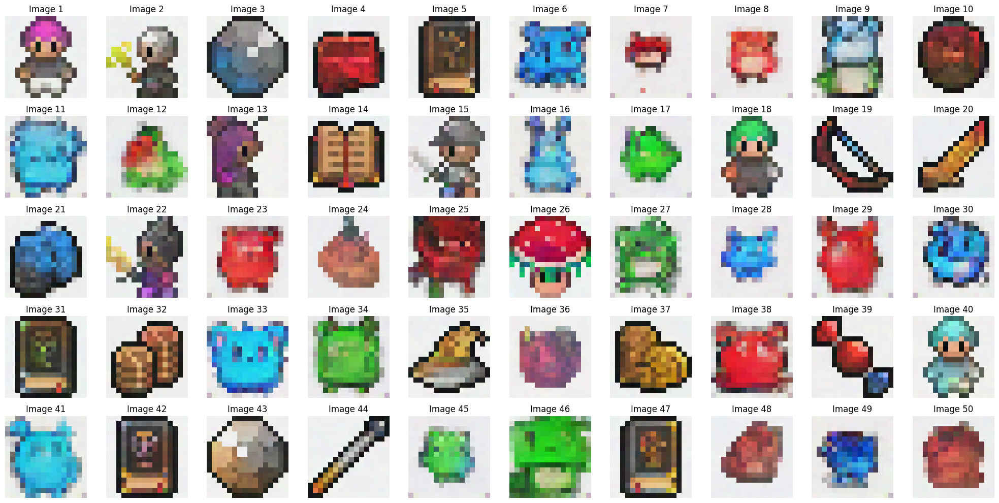

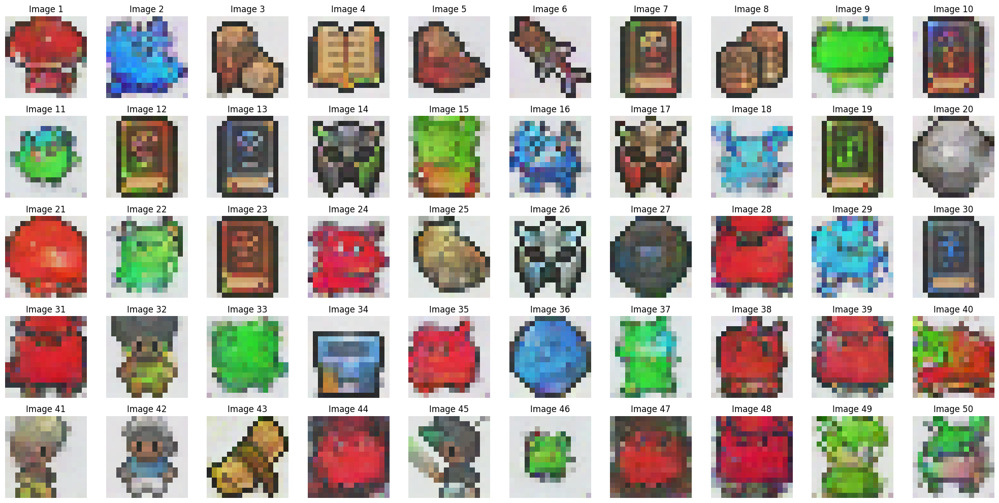

100%|██████████| 1/1 [00:00<00:00,  2.83it/s]


FID Score for DDPM at Epoch 37: 139.83931175363827


100%|██████████| 1/1 [00:00<00:00,  2.97it/s]


FID Score for DDIM at Epoch 37: 172.32155816795864

Epoch 38/40


Training: 100%|██████████| 716/716 [00:34<00:00, 20.74it/s]


Average Loss: 0.036909


DDPM Sampling: 1000it [00:07, 137.16it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 14it [00:00, 134.84it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step
Step 475/500: Deterministic step
Step 474/500: Deterministic step


DDIM Sampling: 42it [00:00, 130.88it/s]

Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step
Step 450/500: Deterministic step
Step 449/500: Deterministic step
Step 448/500: Deterministic step
Step 447/500: Deterministic step

DDIM Sampling: 69it [00:00, 126.35it/s]


Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step


DDIM Sampling: 96it [00:00, 128.02it/s]

Step 422/500: Deterministic step
Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step


DDIM Sampling: 122it [00:00, 117.96it/s]

Step 396/500: Deterministic step
Step 395/500: Deterministic step
Step 394/500: Deterministic step
Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step


DDIM Sampling: 149it [00:01, 124.61it/s]

Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step
Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step


DDIM Sampling: 176it [00:01, 126.72it/s]

Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step


DDIM Sampling: 202it [00:01, 123.15it/s]

Step 321/500: Deterministic step
Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step


DDIM Sampling: 228it [00:01, 125.76it/s]

Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step


DDIM Sampling: 254it [00:02, 125.88it/s]

Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step


DDIM Sampling: 281it [00:02, 128.73it/s]

Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step
Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step


DDIM Sampling: 308it [00:02, 129.70it/s]

Step 218/500: Deterministic step
Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step


DDIM Sampling: 321it [00:02, 125.96it/s]

Step 191/500: Deterministic step
Step 190/500: Deterministic step
Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step


DDIM Sampling: 348it [00:02, 125.42it/s]

Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step


DDIM Sampling: 375it [00:02, 125.80it/s]

Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step


DDIM Sampling: 401it [00:03, 126.65it/s]

Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step


DDIM Sampling: 428it [00:03, 128.56it/s]

Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step


DDIM Sampling: 455it [00:03, 127.95it/s]

Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step

DDIM Sampling: 481it [00:03, 127.11it/s]


Step 35/500: Deterministic step
Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step
Step 11/500: Deterministic step


DDIM Sampling: 500it [00:03, 125.94it/s]


Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


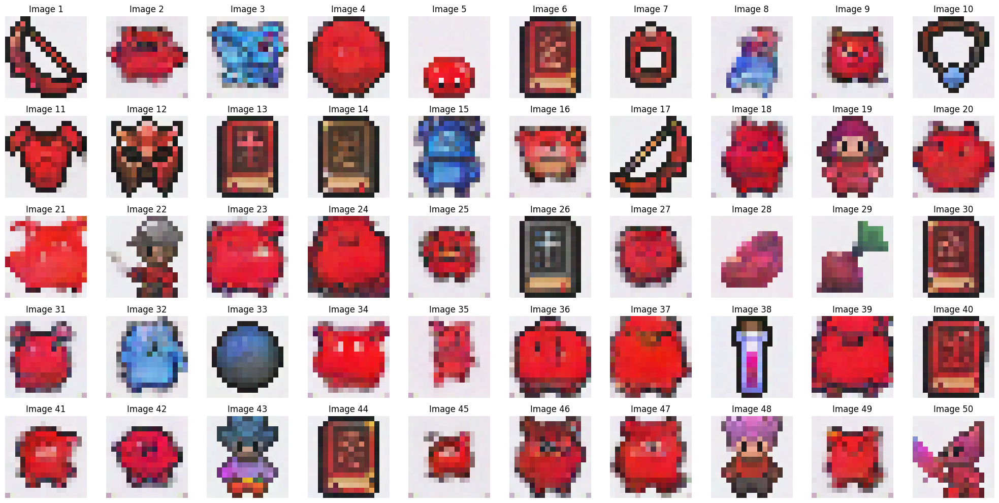

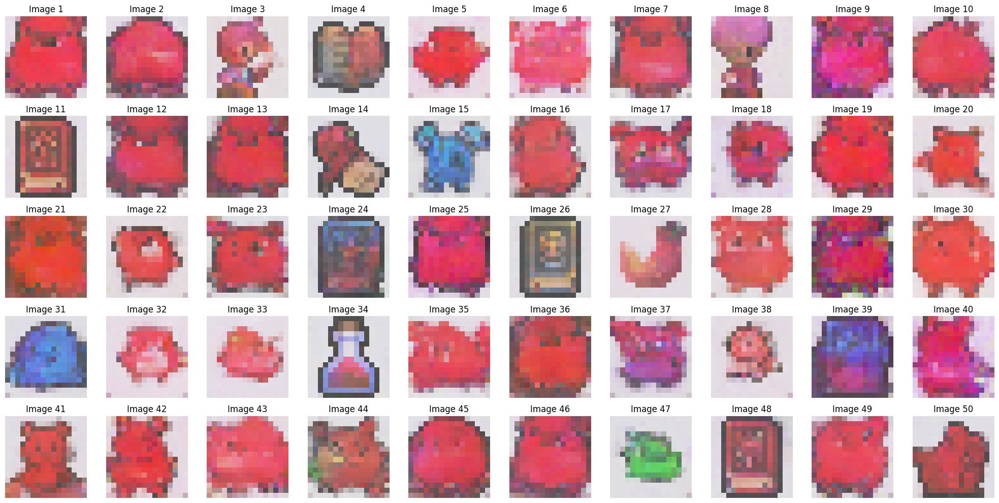

100%|██████████| 1/1 [00:00<00:00,  3.03it/s]


FID Score for DDPM at Epoch 38: 164.07094371576648


100%|██████████| 1/1 [00:00<00:00,  3.00it/s]


FID Score for DDIM at Epoch 38: 219.77584471747997

Epoch 39/40


Training: 100%|██████████| 716/716 [00:34<00:00, 20.92it/s]


Average Loss: 0.035625


DDPM Sampling: 1000it [00:07, 133.67it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 13it [00:00, 127.71it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step


DDIM Sampling: 27it [00:00, 131.27it/s]

Step 475/500: Deterministic step
Step 474/500: Deterministic step


DDIM Sampling: 41it [00:00, 130.90it/s]

Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step
Step 450/500: Deterministic step
Step 449/500: Deterministic step
Step 448/500: Deterministic step


DDIM Sampling: 69it [00:00, 128.42it/s]

Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step
Step 422/500: Deterministic step
Step 421/500: Deterministic step


DDIM Sampling: 96it [00:00, 129.69it/s]

Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step
Step 396/500: Deterministic step
Step 395/500: Deterministic step


DDIM Sampling: 122it [00:00, 126.98it/s]

Step 394/500: Deterministic step
Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step


DDIM Sampling: 149it [00:01, 121.86it/s]

Step 371/500: Deterministic step
Step 370/500: Deterministic step
Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step


DDIM Sampling: 176it [00:01, 124.00it/s]

Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step


DDIM Sampling: 203it [00:01, 124.56it/s]

Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step


DDIM Sampling: 229it [00:01, 125.78it/s]

Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step


DDIM Sampling: 255it [00:02, 123.49it/s]

Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step


DDIM Sampling: 281it [00:02, 125.07it/s]

Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step


DDIM Sampling: 308it [00:02, 127.84it/s]

Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step


DDIM Sampling: 321it [00:02, 124.04it/s]

Step 190/500: Deterministic step
Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step


DDIM Sampling: 335it [00:02, 127.11it/s]

Step 166/500: Deterministic step
Step 165/500: Deterministic step


DDIM Sampling: 348it [00:02, 125.42it/s]

Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step


DDIM Sampling: 361it [00:02, 125.61it/s]

Step 141/500: Deterministic step
Step 140/500: Deterministic step


DDIM Sampling: 374it [00:02, 125.95it/s]

Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step


DDIM Sampling: 400it [00:03, 125.55it/s]

Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step


DDIM Sampling: 413it [00:03, 124.24it/s]

Step 89/500: Deterministic step
Step 88/500: Deterministic step


DDIM Sampling: 426it [00:03, 124.45it/s]

Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step


DDIM Sampling: 439it [00:03, 124.77it/s]

Step 63/500: Deterministic step
Step 62/500: Deterministic step


DDIM Sampling: 452it [00:03, 120.76it/s]

Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step


DDIM Sampling: 479it [00:03, 121.63it/s]

Step 35/500: Deterministic step
Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step
Step 11/500: Deterministic step


DDIM Sampling: 500it [00:04, 124.38it/s]


Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


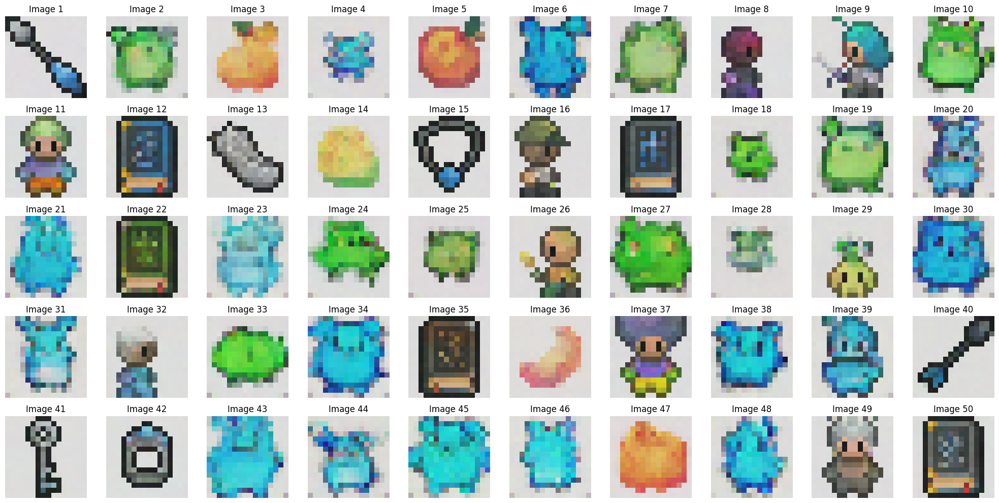

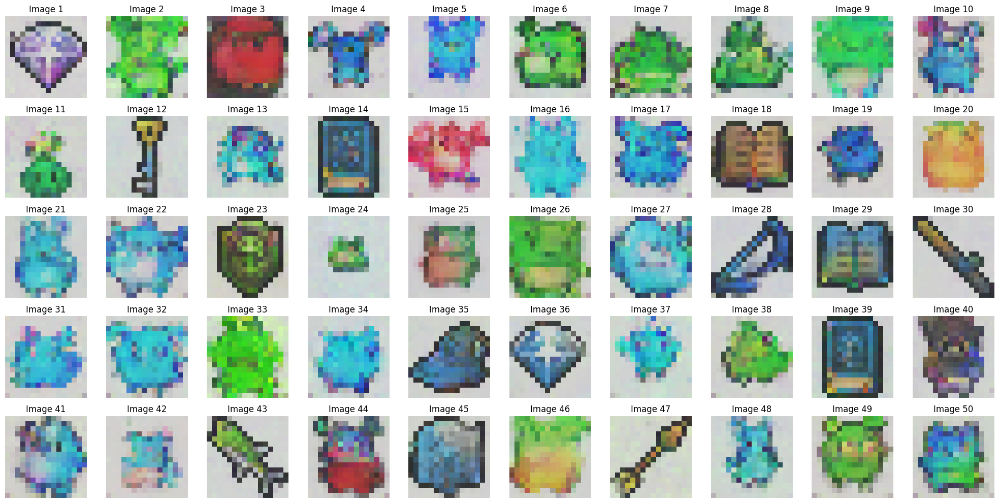

100%|██████████| 1/1 [00:00<00:00,  2.97it/s]


FID Score for DDPM at Epoch 39: 160.57762650949908


100%|██████████| 1/1 [00:00<00:00,  2.96it/s]


FID Score for DDIM at Epoch 39: 178.8487068526901

Epoch 40/40


Training: 100%|██████████| 716/716 [00:35<00:00, 20.01it/s]


Average Loss: 0.035344


DDPM Sampling: 1000it [00:06, 143.76it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 13it [00:00, 129.37it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step


DDIM Sampling: 26it [00:00, 127.90it/s]

Step 475/500: Deterministic step


DDIM Sampling: 39it [00:00, 118.33it/s]

Step 474/500: Deterministic step
Step 473/500: Deterministic step
Step 472/500: Deterministic step
Step 471/500: Deterministic step
Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step


DDIM Sampling: 66it [00:00, 126.03it/s]

Step 450/500: Deterministic step
Step 449/500: Deterministic step
Step 448/500: Deterministic step
Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step
Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step


DDIM Sampling: 94it [00:00, 129.98it/s]

Step 423/500: Deterministic step
Step 422/500: Deterministic step
Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step
Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step


DDIM Sampling: 121it [00:00, 121.49it/s]

Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step
Step 396/500: Deterministic step
Step 395/500: Deterministic step
Step 394/500: Deterministic step
Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step
Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step


DDIM Sampling: 148it [00:01, 125.63it/s]

Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step
Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step
Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step


DDIM Sampling: 174it [00:01, 124.33it/s]

Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step
Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step

DDIM Sampling: 201it [00:01, 128.05it/s]


Step 321/500: Deterministic step
Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step
Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step


DDIM Sampling: 227it [00:01, 125.76it/s]

Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step
Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step


DDIM Sampling: 255it [00:02, 128.59it/s]

Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step
Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step


DDIM Sampling: 283it [00:02, 130.42it/s]

Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step
Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step
Step 217/500: Deterministic step
Step 216/500: Deterministic step


DDIM Sampling: 310it [00:02, 126.25it/s]

Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step
Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step


DDIM Sampling: 337it [00:02, 128.65it/s]

Step 190/500: Deterministic step
Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step
Step 180/500: Deterministic step
Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step


DDIM Sampling: 350it [00:02, 126.97it/s]

Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step
Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step


DDIM Sampling: 390it [00:03, 127.17it/s]

Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step
Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step


DDIM Sampling: 418it [00:03, 129.89it/s]

Step 110/500: Deterministic step
Step 109/500: Deterministic step
Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step
Step 83/500: Deterministic step


DDIM Sampling: 431it [00:03, 128.51it/s]

Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step
Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step


DDIM Sampling: 457it [00:03, 118.37it/s]

Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step


DDIM Sampling: 481it [00:03, 112.08it/s]

Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step


DDIM Sampling: 500it [00:04, 123.86it/s]


Step 12/500: Deterministic step
Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step
Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


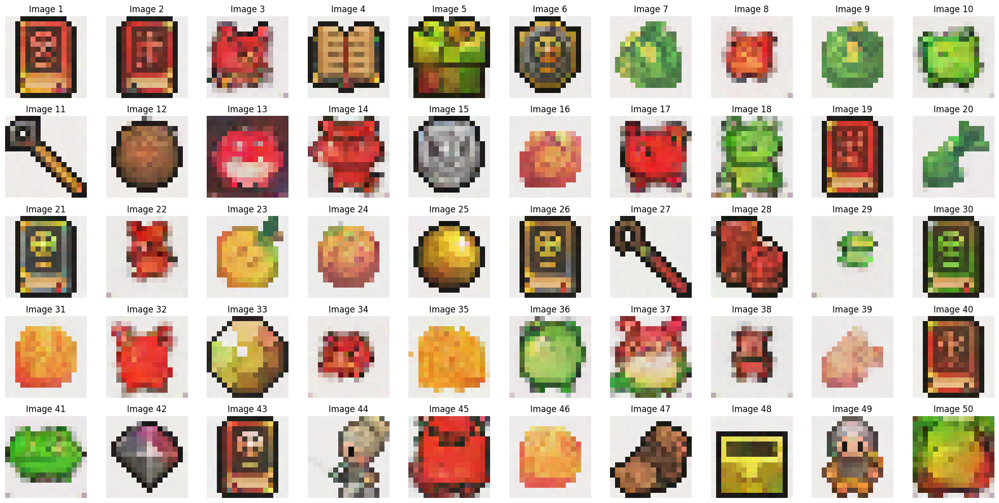

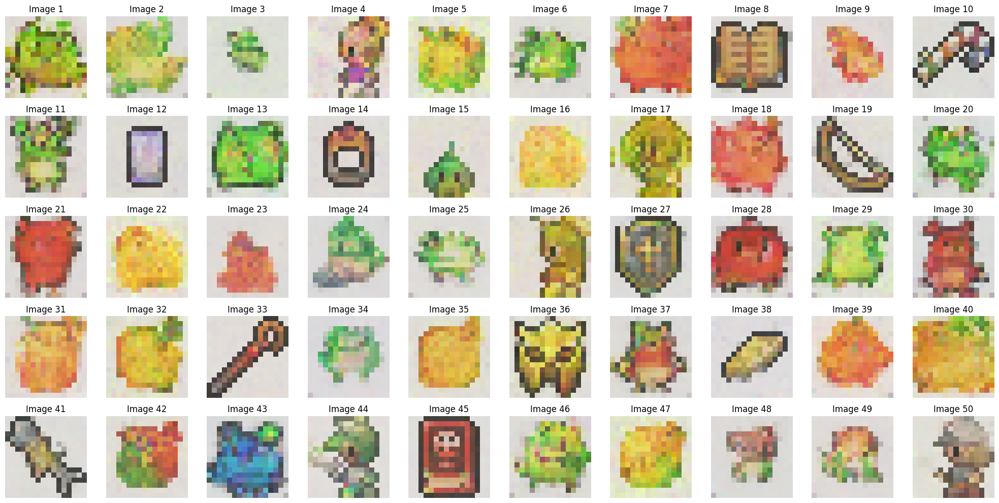

100%|██████████| 1/1 [00:00<00:00,  3.09it/s]


FID Score for DDPM at Epoch 40: 161.85769883524122


100%|██████████| 1/1 [00:00<00:00,  2.57it/s]


FID Score for DDIM at Epoch 40: 194.07722617842623


ValueError: x and y must have same first dimension, but have shapes (40,) and (43,)

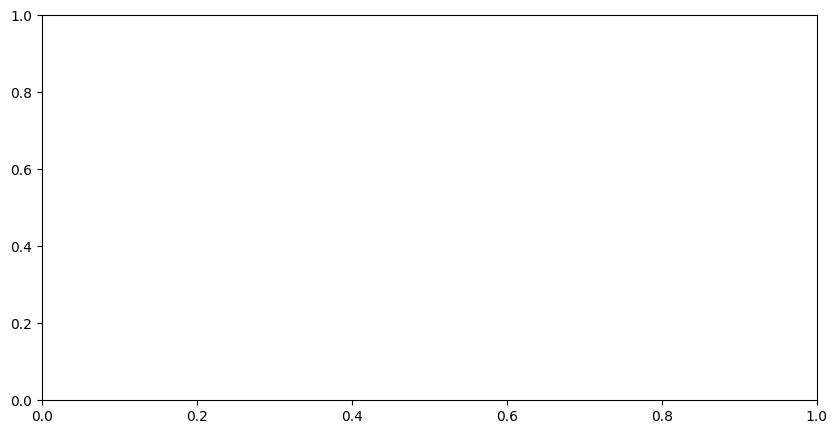

In [25]:

# Begin training
for ep in range(n_epoch):
    print(f'\nEpoch {ep+1}/{n_epoch}')
    epoch_loss = 0.0
    nn_model.train()

    for batch_idx, (x0, _) in enumerate(tqdm(train_dataloader, desc='Training')):
        x0 = x0.to(device)
        batch_size_current = x0.size(0)
        t = torch.randint(0, timesteps, (batch_size_current,), device=device).long()
        xt, noise = perturb_input(x0, t, alpha_bar)
        t_normalized = t.float() / timesteps
        noise_pred = nn_model(xt, t_normalized)
        loss = F.mse_loss(noise_pred, noise)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()

    avg_loss = epoch_loss / len(train_dataloader)
    loss_history.append(avg_loss)
    print(f'Average Loss: {avg_loss:.6f}')

    n_sample = 50
    nn_model.eval()

    samples_ddpm = sample_ddpm(nn_model, n_sample, timesteps, beta, alpha, alpha_bar, device, height=height).cpu()
    samples_ddim = sample_ddim(nn_model, n_sample, timesteps, beta, alpha, alpha_bar, device, height=height, eta=0.0, n_steps=500).cpu()

    ddpm_epoch_dir = os.path.join(save_dir_ddpm, f'epoch_{ep+1}')
    ddim_epoch_dir = os.path.join(save_dir_ddim, f'epoch_{ep+1}')
    os.makedirs(ddpm_epoch_dir, exist_ok=True)
    os.makedirs(ddim_epoch_dir, exist_ok=True)

    for i in range(n_sample):
        save_image(samples_ddpm[i], os.path.join(ddpm_epoch_dir, f'ddpm_{i}.png'))
    plot_sample(samples_ddpm, n_sample, nrows=5)
    plt.savefig(os.path.join(ddpm_epoch_dir, 'ddpm_samples.png'))
    plt.close()

    for i in range(n_sample):
        save_image(samples_ddim[i], os.path.join(ddim_epoch_dir, f'ddim_{i}.png'))
    plot_sample(samples_ddim, n_sample, nrows=5)
    plt.savefig(os.path.join(ddim_epoch_dir, 'ddim_samples.png'))
    plt.close()

    real_batch, _ = next(iter(val_dataloader))
    real_batch = real_batch[:n_sample].to(device)

    fid_ddpm = compute_fid(real_batch.cpu(), samples_ddpm)
    fid_history_ddpm.append(fid_ddpm)
    print(f"FID Score for DDPM at Epoch {ep+1}: {fid_ddpm}")

    fid_ddim = compute_fid(real_batch.cpu(), samples_ddim)
    fid_history_ddim.append(fid_ddim)
    print(f"FID Score for DDIM at Epoch {ep+1}: {fid_ddim}")
    assert len(fid_history_ddpm) == len(fid_history_ddim), \
    f"FID history mismatch: {len(fid_history_ddpm)} != {len(fid_history_ddim)}"


plt.figure(figsize=(10,5))
plt.plot(range(1, ep+2), fid_history_ddpm, label='FID DDPM')
plt.plot(range(1, ep+2), fid_history_ddim, label='FID DDIM')
plt.xlabel('Epoch')
plt.ylabel('FID Score')
plt.title('FID Scores over Epochs')
plt.legend()
plt.savefig(os.path.join(save_dir, 'fid_scores.png'))
plt.close()


### **Training Loop for Denoising Diffusion Models (DDPM & DDIM)**

#### **Overview**
This section provides a comprehensive explanation of the training loop implemented for **Denoising Diffusion Probabilistic Models (DDPMs)** and their deterministic variant, **Denoising Diffusion Implicit Models (DDIMs)**. The training loop encompasses multiple epochs of training, batch-wise data processing, noise perturbation, model optimization, sample generation, and evaluation using the **Fréchet Inception Distance (FID)** metric. The goal is to train the neural network to effectively denoise images, enabling the generation of high-quality synthetic samples.

---

#### **1. Hyperparameter and Setup Recap**

Before diving into the training loop, it's essential to recall the key hyperparameters and setup configurations established earlier:

- **Diffusion Process:**
  - `timesteps = 1000`: Total number of timesteps in the diffusion process.
  - `beta1 = 1e-4`, `beta2 = 0.02`: Start and end values for the linear beta schedule.

- **Network Configuration:**
  - `n_feat = 64`: Number of hidden feature dimensions.
  - `n_cfeat = 5`: Size of the context vector.
  - `height = 16`: Image height and width (16x16 pixels).

- **Training Configuration:**
  - `batch_size = 100`: Number of samples per training batch.
  - `n_epoch = 40`: Total number of training epochs.
  - `lrate = 1e-3`: Learning rate for the optimizer.

- **Directories:**
  - `save_dir = './samples/'`: Directory for saving generated samples.
  - `save_dir_ddpm = './samples/ddpm_samples/'`: Directory for DDPM-generated samples.
  - `save_dir_ddim = './samples/ddim_samples/'`: Directory for DDIM-generated samples.

- **Evaluation Metrics:**
  - `loss_history = []`: List to track training loss per epoch.
  - `fid_history_ddpm = []`, `fid_history_ddim = []`: Lists to track FID scores for DDPM and DDIM, respectively.

---

#### **2. Detailed Explanation of the Training Loop**

The training loop iterates over multiple epochs, each comprising multiple batches of data. Within each epoch, the model learns to denoise images by predicting the added noise, optimizing its parameters to minimize the discrepancy between predicted and actual noise. After each epoch, the model generates samples using both DDPM and DDIM methods, saves these samples, and evaluates their quality using the FID metric.

##### **2.1. Epoch Iteration**

```python
for ep in range(n_epoch):
    print(f'\nEpoch {ep+1}/{n_epoch}')
    epoch_loss = 0.0
    nn_model.train()
```

- **Purpose:**
  - Iterates over the total number of training epochs (`n_epoch`).
  - Initializes `epoch_loss` to accumulate the loss over all batches in the current epoch.
  - Sets the model to training mode using `nn_model.train()`, enabling training-specific behaviors like dropout and batch normalization updates.

##### **2.2. Batch-wise Training**

```python
for batch_idx, (x0, _) in enumerate(tqdm(train_dataloader, desc='Training')):
    x0 = x0.to(device)
    batch_size_current = x0.size(0)
```

- **Purpose:**
  - Iterates over batches of data from the training dataloader (`train_dataloader`).
  - `x0`: Batch of real images with shape `[batch_size, C, H, W]`.
  - `_`: Placeholder for labels, which are not used in this context.
  - Moves the batch of images `x0` to the designated computational device (`CPU` or `GPU`).
  - Retrieves the current batch size (`batch_size_current`), which is crucial for handling cases where the last batch might be smaller.

##### **2.3. Sampling Random Timesteps**

```python
t = torch.randint(0, timesteps, (batch_size_current,), device=device).long()
```

- **Purpose:**
  - For each image in the batch, randomly selects a timestep `t` within the range `[0, timesteps)`.
  - **Mathematical Representation:**
    \[
    t_i \sim \text{Uniform}(0, T-1) \quad \forall i \in \{1, 2, \dots, \text{batch\_size}\}
    \]
    where \( T = \text{timesteps} \).
  - This randomness introduces variability in the noise addition process, enabling the model to learn denoising across different levels of noise.

##### **2.4. Perturbing the Inputs**

```python
xt, noise = perturb_input(x0, t, alpha_bar)
```

- **Purpose:**
  - Perturbs the original images `x0` by adding noise corresponding to the sampled timesteps `t`.
  - **Function Call:** `perturb_input(x0, t, alpha_bar)`
  
- **Functionality:**
  - **Mathematical Operation:**
    \[
    x_t = \sqrt{\bar{\alpha}_t} \cdot x_0 + \sqrt{1 - \bar{\alpha}_t} \cdot \epsilon
    \]
    where:
    - \( x_0 \): Original image.
    - \( \epsilon \sim \mathcal{N}(0, I) \): Gaussian noise.
    - \( \bar{\alpha}_t \): Cumulative product of \(\alpha_t\) up to timestep \(t\).
  - **Outputs:**
    - `xt`: Noised images at timestep `t`.
    - `noise`: The actual noise added, used for loss computation.

##### **2.5. Normalizing Timesteps**

```python
t_normalized = t.float() / timesteps
```

- **Purpose:**
  - Converts the integer timesteps `t` to floating-point numbers.
  - Normalizes `t` by dividing by the total number of timesteps `timesteps` to scale it within the range `[0, 1]`.
  
- **Mathematical Representation:**
  \[
  \hat{t} = \frac{t}{T} \quad \text{where } T = \text{timesteps}
  \]
  
- **Implications:**
  - Normalization ensures that the timestep input to the model is within a standardized range, which can improve model stability and performance.

##### **2.6. Predicting Noise with the Model**

```python
noise_pred = nn_model(xt, t_normalized)
```

- **Purpose:**
  - Utilizes the neural network model (`nn_model`) to predict the noise added to the noised images `xt` at timestep `t`.
  
- **Functionality:**
  - **Input:**
    - `xt`: Noised images.
    - `t_normalized`: Normalized timesteps.
  - **Output:**
    - `noise_pred`: Predicted noise by the model.
  
- **Mathematical Representation:**
  \[
  \epsilon_{\theta}(x_t, \hat{t}) = \text{nn\_model}(x_t, \hat{t})
  \]
  where \( \epsilon_{\theta} \) is the predicted noise.

##### **2.7. Computing the Loss**

```python
loss = F.mse_loss(noise_pred, noise)
```

- **Purpose:**
  - Calculates the **Mean Squared Error (MSE)** between the predicted noise (`noise_pred`) and the actual noise added (`noise`).
  
- **Mathematical Representation:**
  \[
  \text{Loss} = \frac{1}{N} \sum_{i=1}^{N} \left\| \epsilon_{\theta}(x_t^{(i)}, \hat{t}^{(i)}) - \epsilon^{(i)} \right\|^2
  \]
  where:
  - \( N \): Batch size.
  - \( \epsilon_{\theta} \): Predicted noise.
  - \( \epsilon \): Actual noise.
  
- **Implications:**
  - Minimizing this loss encourages the model to accurately predict the noise added at each timestep, thereby enabling effective denoising.

##### **2.8. Backpropagation and Optimizer Step**

```python
optimizer.zero_grad()
loss.backward()
optimizer.step()

epoch_loss += loss.item()
```

- **Purpose:**
  - Updates the model's parameters to minimize the loss.
  
- **Process:**
  1. **Zeroing Gradients:**
     - `optimizer.zero_grad()`: Clears old gradients from the last step to prevent accumulation.
  2. **Backward Pass:**
     - `loss.backward()`: Computes the gradient of the loss with respect to the model's parameters.
  3. **Optimizer Step:**
     - `optimizer.step()`: Updates the model's parameters based on the computed gradients.
  
- **Accumulating Loss:**
  - `epoch_loss += loss.item()`: Adds the current batch's loss to `epoch_loss` for tracking the average loss over the epoch.
  
- **Implications:**
  - Proper gradient management and optimizer steps are crucial for effective learning and convergence of the model.

##### **2.9. End of Epoch: Calculating and Logging Average Loss**

```python
avg_loss = epoch_loss / len(train_dataloader)
loss_history.append(avg_loss)
print(f'Average Loss: {avg_loss:.6f}')
```

- **Purpose:**
  - Computes the average loss over all batches in the epoch.
  - Logs and stores the average loss for future analysis.
  
- **Process:**
  - **Average Loss Calculation:**
    \[
    \text{Average Loss} = \frac{\text{Total Loss}}{\text{Number of Batches}}
    \]
  - **Logging:**
    - Prints the average loss to monitor training progress.
    - Appends the average loss to `loss_history` for potential visualization.
  
- **Implications:**
  - Tracking the average loss over epochs helps in assessing the model's learning trajectory and diagnosing potential issues like overfitting or underfitting.

##### **2.10. Generating Samples Post-Epoch**

```python
n_sample = 50  
nn_model.eval()

samples_ddpm = sample_ddpm(nn_model, n_sample, timesteps, beta, alpha, alpha_bar, device, height=height).cpu()
samples_ddim = sample_ddim(nn_model, n_sample, timesteps, beta, alpha, alpha_bar, device, height=height, eta=0.0, n_steps=50).cpu()
```

- **Purpose:**
  - After each epoch, the model generates synthetic samples using both DDPM and DDIM sampling functions to evaluate the quality of generated images.
  
- **Process:**
  1. **Setting the Model to Evaluation Mode:**
     - `nn_model.eval()`: Switches the model to evaluation mode, disabling training-specific behaviors.
  2. **Generating DDPM Samples:**
     - Calls `sample_ddpm` to generate `n_sample` images using the DDPM method.
     - Moves the generated samples to the CPU for further processing.
  3. **Generating DDIM Samples:**
     - Calls `sample_ddim` with `eta=0.0` (deterministic sampling) and `n_steps=50` to generate `n_sample` images using the DDIM method.
     - Moves the generated samples to the CPU for further processing.
  
- **Implications:**
  - Generating samples post-epoch allows for qualitative evaluation of the model's generative capabilities and monitoring improvements over time.

##### **2.11. Saving Generated Samples**

```python
ddpm_epoch_dir = os.path.join(save_dir_ddpm, f'epoch_{ep+1}')
ddim_epoch_dir = os.path.join(save_dir_ddim, f'epoch_{ep+1}')
os.makedirs(ddpm_epoch_dir, exist_ok=True)
os.makedirs(ddim_epoch_dir, exist_ok=True)

for i in range(n_sample):
    save_image(samples_ddpm[i], os.path.join(ddpm_epoch_dir, f'ddpm_{i}.png'))
plot_sample(samples_ddpm, n_sample, nrows=5)
plt.savefig(os.path.join(ddpm_epoch_dir, 'ddpm_samples.png'))
plt.close()

for i in range(n_sample):
    save_image(samples_ddim[i], os.path.join(ddim_epoch_dir, f'ddim_{i}.png'))
plot_sample(samples_ddim, n_sample, nrows=5)
plt.savefig(os.path.join(ddim_epoch_dir, 'ddim_samples.png'))
plt.close()
```

- **Purpose:**
  - Organizes and saves the generated samples for both DDPM and DDIM methods for later analysis and visualization.
  
- **Process:**
  1. **Directory Setup:**
     - Creates epoch-specific directories for DDPM and DDIM samples (e.g., `./samples/ddpm_samples/epoch_1/`).
  2. **Saving Individual Samples:**
     - Iterates over each generated sample and saves it as a PNG image in the respective directory using `save_image`.
  3. **Plotting and Saving Sample Grids:**
     - `plot_sample(samples_ddpm, n_sample, nrows=5)`: Plots a grid of DDPM samples with 5 rows.
     - Saves the plotted grid as `ddpm_samples.png` in the epoch-specific directory.
     - Closes the plot to free memory.
     - Repeats the same process for DDIM samples.
  
- **Implications:**
  - Saving individual samples and their grid visualizations aids in qualitative assessment of the model's performance across epochs.
  - Organized storage facilitates easy retrieval and comparison of samples generated at different training stages.

##### **2.12. Evaluating with Fréchet Inception Distance (FID)**

```python
real_batch, _ = next(iter(val_dataloader))
real_batch = real_batch[:n_sample].to(device)

fid_ddpm = compute_fid(real_batch.cpu(), samples_ddpm)
fid_history_ddpm.append(fid_ddpm)
print(f"FID Score for DDPM at Epoch {ep+1}: {fid_ddpm}")

fid_ddim = compute_fid(real_batch.cpu(), samples_ddim)
fid_history_ddim.append(fid_ddim)
print(f"FID Score for DDIM at Epoch {ep+1}: {fid_ddim}")

plt.figure(figsize=(10,5))
plt.plot(range(1, ep+2), fid_history_ddpm, label='FID DDPM')
plt.plot(range(1, ep+2), fid_history_ddim, label='FID DDIM')
plt.xlabel('Epoch')
plt.ylabel('FID Score')
plt.title('FID Scores over Epochs')
plt.legend()
plt.savefig(os.path.join(save_dir, 'fid_scores.png'))
plt.close()
```

- **Purpose:**
  - Quantitatively evaluates the quality of generated samples by comparing them to real images using the **Fréchet Inception Distance (FID)** metric.
  - FID measures the distance between the feature distributions of real and generated images, where a lower score indicates higher similarity and better generative performance.
  
- **Process:**
  1. **Selecting Real Images:**
     - Retrieves a batch of real images from the validation dataloader (`val_dataloader`).
     - Selects the first `n_sample` images for FID computation.
     - Moves the selected real images to the computational device.
  2. **Computing FID for DDPM Samples:**
     - Calls `compute_fid` with the real images and DDPM-generated samples.
     - Appends the resulting FID score to `fid_history_ddpm`.
     - Logs the FID score for the current epoch.
  3. **Computing FID for DDIM Samples:**
     - Calls `compute_fid` with the real images and DDIM-generated samples.
     - Appends the resulting FID score to `fid_history_ddim`.
     - Logs the FID score for the current epoch.
  4. **Plotting FID Scores:**
     - Creates a line plot displaying FID scores over epochs for both DDPM and DDIM.
     - Saves the plot as `fid_scores.png` in the main `save_dir`.
     - Closes the plot to free memory.
  
- **Mathematical Representation:**
  - **Fréchet Inception Distance (FID):**
    \[
    \text{FID}(x, g) = \|\mu_x - \mu_g\|^2 + \text{Tr}(\Sigma_x + \Sigma_g - 2(\Sigma_x \Sigma_g)^{1/2})
    \]
    where:
    - \( \mu_x, \Sigma_x \): Mean and covariance of real images' features.
    - \( \mu_g, \Sigma_g \): Mean and covariance of generated images' features.
  
- **Implications:**
  - FID provides a robust metric to assess the generative quality, capturing both the fidelity and diversity of the generated samples.
  - Tracking FID over epochs helps in monitoring the model's improvement and convergence.

---

#### **3. Comprehensive Workflow Summary**

1. **Initialization:**
   - Define diffusion hyperparameters (`timesteps`, `beta1`, `beta2`).
   - Configure network and training hyperparameters (`n_feat`, `n_cfeat`, `height`, `batch_size`, `n_epoch`, `lrate`).
   - Set up data transformations and download/load the dataset.
   - Split the dataset into training and validation sets.
   - Initialize datasets and dataloaders.
   - Instantiate the U-Net model and configure the optimizer.
   - Define the linear beta schedule (`beta`, `alpha`, `alpha_bar`).
   - Initialize loss and FID tracking lists.
   - Create directories for saving generated samples.

2. **Training Loop:**
   - Iterate over each epoch:
     - Set the model to training mode.
     - Iterate over each batch in the training dataloader:
       - Move data to device.
       - Sample random timesteps for noise addition.
       - Perturb inputs by adding noise corresponding to the sampled timesteps.
       - Normalize timesteps and predict noise using the model.
       - Compute the MSE loss between predicted and actual noise.
       - Perform backpropagation and update model parameters.
       - Accumulate loss for the epoch.
     - After all batches:
       - Calculate and log the average loss for the epoch.
       - Generate synthetic samples using both DDPM and DDIM methods.
       - Save individual samples and plot grids of generated images.
       - Select a subset of real images from the validation set.
       - Compute FID scores for DDPM and DDIM samples against the real images.
       - Append FID scores to their respective tracking lists.
       - Plot and save the evolution of FID scores over epochs.

3. **Post-Training:**
   - The model can be further evaluated, fine-tuned, or used for generating high-quality synthetic images based on the trained parameters.

---

#### **4. Mathematical Foundations and Variable Relationships**

Understanding the mathematical relationships between variables is crucial for comprehending the training dynamics and the effectiveness of the model.

##### **4.1. Diffusion Process Equations**

The core idea behind DDPMs and DDIMs is to model the data generation process as a reverse diffusion process, where noise is iteratively removed from a noisy image to recover a clean image.

1. **Forward Diffusion Process:**
   - **Equation:**
     \[
     x_t = \sqrt{\bar{\alpha}_t} \cdot x_0 + \sqrt{1 - \bar{\alpha}_t} \cdot \epsilon
     \]
     where:
     - \( x_0 \): Original image.
     - \( x_t \): Noised image at timestep \( t \).
     - \( \epsilon \sim \mathcal{N}(0, I) \): Gaussian noise.
     - \( \bar{\alpha}_t = \prod_{s=1}^{t} \alpha_s \): Cumulative product of \(\alpha_s = 1 - \beta_s\).
   
2. **Reverse Diffusion Process:**
   - **Mean Prediction:**
     \[
     \mu_{\theta}(x_t, t) = \frac{1}{\sqrt{\alpha_t}} \left( x_t - \frac{\beta_t}{\sqrt{1 - \bar{\alpha}_t}} \epsilon_{\theta}(x_t, t) \right)
     \]
     where:
     - \( \epsilon_{\theta}(x_t, t) \): Predicted noise by the model.
   - **Sample Update:**
     \[
     x_{t-1} = \mu_{\theta}(x_t, t) + \sigma_t z \quad \text{for } t > 0
     \]
     \[
     x_{t-1} = \mu_{\theta}(x_t, t) \quad \text{for } t = 0
     \]
     where:
     - \( \sigma_t = \sqrt{\beta_t} \cdot \eta \): Noise scale factor controlled by parameter \( \eta \).
     - \( z \sim \mathcal{N}(0, I) \): Gaussian noise.

##### **4.2. Loss Function**

The loss function used is the **Mean Squared Error (MSE)** between the predicted noise and the actual noise added during perturbation.

- **Equation:**
  \[
  \text{Loss} = \frac{1}{N} \sum_{i=1}^{N} \left\| \epsilon_{\theta}(x_t^{(i)}, \hat{t}^{(i)}) - \epsilon^{(i)} \right\|^2
  \]
  where:
  - \( N \): Batch size.
  - \( \epsilon_{\theta} \): Predicted noise.
  - \( \epsilon \): Actual noise.

---

#### **5. Key Variables and Their Roles**

| Variable             | Type          | Description                                                                                               |
|----------------------|---------------|-----------------------------------------------------------------------------------------------------------|
| `nn_model`           | `torch.nn.Module` | The trained neural network model (U-Net) used to predict noise in the noised images.                   |
| `n_epoch`            | `int`         | Total number of training epochs.                                                                         |
| `batch_size`         | `int`         | Number of samples processed in each training batch.                                                       |
| `x0`                 | `torch.Tensor` | Original batch of real images with shape `[batch_size, C, H, W]`.                                       |
| `t`                  | `torch.Tensor` | Randomly sampled timesteps for each image in the batch, shape `[batch_size]`.                            |
| `xt`                 | `torch.Tensor` | Noised images at timestep `t`, computed as a combination of `x0` and added noise.                        |
| `noise`              | `torch.Tensor` | Actual Gaussian noise added to `x0` to obtain `xt`, used as the ground truth for training.               |
| `t_normalized`       | `torch.Tensor` | Normalized timesteps, scaled to `[0, 1]`, used as input to the model for conditioning.                   |
| `noise_pred`         | `torch.Tensor` | Noise predicted by the model, intended to match the actual `noise` added.                                |
| `loss`               | `float`       | MSE loss between `noise_pred` and `noise`, used to guide model optimization.                             |
| `epoch_loss`         | `float`       | Accumulates the total loss over all batches in the current epoch.                                        |
| `samples_ddpm`       | `torch.Tensor` | Images generated using the DDPM sampling method after the current epoch.                                |
| `samples_ddim`       | `torch.Tensor` | Images generated using the DDIM sampling method after the current epoch.                                |
| `fid_ddpm`           | `float`       | FID score computed for DDPM-generated samples against real images.                                      |
| `fid_ddim`           | `float`       | FID score computed for DDIM-generated samples against real images.                                      |
| `fid_history_ddpm`   | `list`        | List tracking FID scores for DDPM samples across epochs.                                                |
| `fid_history_ddim`   | `list`        | List tracking FID scores for DDIM samples across epochs.                                                |
| `save_dir_ddpm`      | `str`         | Directory path for saving DDPM-generated samples for the current epoch.                                 |
| `save_dir_ddim`      | `str`         | Directory path for saving DDIM-generated samples for the current epoch.                                 |

---

#### **6. Step-by-Step Process with Mathematical Formulas**

##### **6.1. Training Phase**

1. **Model in Training Mode:**
   - **Code:**
     ```python
     nn_model.train()
     ```
   - **Purpose:** Enables training-specific behaviors like dropout and updates to running statistics in batch normalization layers.

2. **Iterating Over Batches:**
   - **Code:**
     ```python
     for batch_idx, (x0, _) in enumerate(tqdm(train_dataloader, desc='Training')):
     ```
   - **Process:**
     - Iterates over each batch of data in the training dataloader.
     - `x0`: Batch of real images.
     - `_`: Corresponding labels, which are ignored in this context.

3. **Moving Data to Device:**
   - **Code:**
     ```python
     x0 = x0.to(device)
     ```
   - **Purpose:** Transfers the batch of images to the designated computational device (CPU or GPU) for processing.

4. **Sampling Random Timesteps:**
   - **Code:**
     ```python
     t = torch.randint(0, timesteps, (batch_size_current,), device=device).long()
     ```
   - **Mathematical Representation:**
     \[
     t_i \sim \text{Uniform}(0, T-1) \quad \forall i \in \{1, 2, \dots, N\}
     \]
     where \( N = \text{batch\_size\_current} \) and \( T = \text{timesteps} \).
   - **Explanation:** For each image in the batch, a random timestep `t_i` is sampled, determining the level of noise to be added.

5. **Perturbing the Inputs:**
   - **Code:**
     ```python
     xt, noise = perturb_input(x0, t, alpha_bar)
     ```
   - **Functionality:**
     - **Mathematical Operation:**
       \[
       x_t = \sqrt{\bar{\alpha}_t} \cdot x_0 + \sqrt{1 - \bar{\alpha}_t} \cdot \epsilon
       \]
       where:
       - \( \epsilon \sim \mathcal{N}(0, I) \): Gaussian noise.
       - \( \bar{\alpha}_t = \prod_{s=1}^{t} \alpha_s \).
     - **Outputs:**
       - `xt`: Noised images.
       - `noise`: Actual noise added, serving as ground truth for the model to predict.

6. **Normalizing Timesteps:**
   - **Code:**
     ```python
     t_normalized = t.float() / timesteps
     ```
   - **Mathematical Representation:**
     \[
     \hat{t} = \frac{t}{T}
     \]
     where \( T = \text{timesteps} \).
   - **Explanation:** Scales the timestep values to the range `[0, 1]` for model conditioning.

7. **Predicting Noise with the Model:**
   - **Code:**
     ```python
     noise_pred = nn_model(xt, t_normalized)
     ```
   - **Mathematical Representation:**
     \[
     \epsilon_{\theta}(x_t, \hat{t}) = \text{nn\_model}(x_t, \hat{t})
     \]
     where \( \epsilon_{\theta} \) is the predicted noise.
   - **Explanation:** The model predicts the noise component added to the noised images at the given timestep.

8. **Computing the Loss:**
   - **Code:**
     ```python
     loss = F.mse_loss(noise_pred, noise)
     ```
   - **Mathematical Representation:**
     \[
     \text{Loss} = \frac{1}{N} \sum_{i=1}^{N} \left\| \epsilon_{\theta}(x_t^{(i)}, \hat{t}^{(i)}) - \epsilon^{(i)} \right\|^2
     \]
   - **Explanation:** The MSE loss measures how closely the predicted noise matches the actual noise, guiding the model to improve its denoising capabilities.

9. **Backpropagation and Optimizer Step:**
   - **Code:**
     ```python
     optimizer.zero_grad()
     loss.backward()
     optimizer.step()
     ```
   - **Process:**
     - **`optimizer.zero_grad()`**: Clears previous gradients.
     - **`loss.backward()`**: Computes gradients of the loss w.r.t. model parameters.
     - **`optimizer.step()`**: Updates model parameters based on computed gradients.

10. **Accumulating Loss:**
    - **Code:**
      ```python
      epoch_loss += loss.item()
      ```
    - **Purpose:** Aggregates the loss over all batches within the current epoch for average loss computation.

##### **6.2. Post-Epoch Operations**

After completing all batches within an epoch, the training loop performs several operations to evaluate and log the model's performance.

1. **Calculating and Logging Average Loss:**
   - **Code:**
     ```python
     avg_loss = epoch_loss / len(train_dataloader)
     loss_history.append(avg_loss)
     print(f'Average Loss: {avg_loss:.6f}')
     ```
   - **Mathematical Representation:**
     \[
     \text{Average Loss} = \frac{\text{Total Loss}}{\text{Number of Batches}}
     \]
   - **Explanation:** Computes the mean loss for the epoch and logs it for monitoring training progress.

2. **Generating Synthetic Samples:**
   - **Code:**
     ```python
     n_sample = 50
     nn_model.eval()

     samples_ddpm = sample_ddpm(nn_model, n_sample, timesteps, beta, alpha, alpha_bar, device, height=height).cpu()
     samples_ddim = sample_ddim(nn_model, n_sample, timesteps, beta, alpha, alpha_bar, device, height=height, eta=0.0, n_steps=50).cpu()
     ```
   - **Purpose:**
     - Switches the model to evaluation mode (`nn_model.eval()`).
     - Generates `n_sample` synthetic images using both DDPM and DDIM sampling functions.
     - Moves the generated samples to the CPU for saving and further processing.
   
3. **Saving Generated Samples:**
   - **Code:**
     ```python
     ddpm_epoch_dir = os.path.join(save_dir_ddpm, f'epoch_{ep+1}')
     ddim_epoch_dir = os.path.join(save_dir_ddim, f'epoch_{ep+1}')
     os.makedirs(ddpm_epoch_dir, exist_ok=True)
     os.makedirs(ddim_epoch_dir, exist_ok=True)

     for i in range(n_sample):
         save_image(samples_ddpm[i], os.path.join(ddpm_epoch_dir, f'ddpm_{i}.png'))
     plot_sample(samples_ddpm, n_sample, nrows=5)
     plt.savefig(os.path.join(ddpm_epoch_dir, 'ddpm_samples.png'))
     plt.close()

     for i in range(n_sample):
         save_image(samples_ddim[i], os.path.join(ddim_epoch_dir, f'ddim_{i}.png'))
     plot_sample(samples_ddim, n_sample, nrows=5)
     plt.savefig(os.path.join(ddim_epoch_dir, 'ddim_samples.png'))
     plt.close()
     ```
   - **Purpose:**
     - Creates epoch-specific directories for storing DDPM and DDIM samples.
     - Saves each generated image as an individual PNG file.
     - Plots and saves a grid of generated images for visual inspection.
   
   - **Functionality:**
     - **`save_image`:** Saves individual images.
     - **`plot_sample`:** Plots a grid of images with specified rows.
     - **`plt.savefig`:** Saves the plotted grid as a PNG image.
     - **`plt.close()`:** Closes the plot to free memory.
   
   - **Implications:**
     - Facilitates qualitative evaluation by allowing visual comparison of generated samples across epochs.
     - Organized storage aids in tracking model progress and identifying improvements or issues over time.

4. **Computing FID Scores:**
   - **Code:**
     ```python
     real_batch, _ = next(iter(val_dataloader))
     real_batch = real_batch[:n_sample].to(device)

     fid_ddpm = compute_fid(real_batch.cpu(), samples_ddpm)
     fid_history_ddpm.append(fid_ddpm)
     print(f"FID Score for DDPM at Epoch {ep+1}: {fid_ddpm}")

     fid_ddim = compute_fid(real_batch.cpu(), samples_ddim)
     fid_history_ddim.append(fid_ddim)
     print(f"FID Score for DDIM at Epoch {ep+1}: {fid_ddim}")
     ```
   - **Purpose:**
     - Quantitatively evaluates the quality of generated samples by computing the FID score between real and generated images.
   
   - **Process:**
     1. **Selecting Real Images:**
        - Retrieves a batch of real images from the validation dataloader.
        - Selects the first `n_sample` images for FID computation.
        - Moves the selected real images to the computational device.
     2. **Computing FID for DDPM Samples:**
        - Calls `compute_fid` with real images and DDPM-generated samples.
        - Appends the resulting FID score to `fid_history_ddpm`.
        - Logs the FID score for the current epoch.
     3. **Computing FID for DDIM Samples:**
        - Similarly, calls `compute_fid` with real images and DDIM-generated samples.
        - Appends the resulting FID score to `fid_history_ddim`.
        - Logs the FID score for the current epoch.
   
   - **Mathematical Representation:**
     - **FID Formula:**
       \[
       \text{FID}(x, g) = \|\mu_x - \mu_g\|^2 + \text{Tr}(\Sigma_x + \Sigma_g - 2(\Sigma_x \Sigma_g)^{1/2})
       \]
       where:
       - \( \mu_x, \Sigma_x \): Mean and covariance of real images' features.
       - \( \mu_g, \Sigma_g \): Mean and covariance of generated images' features.
   
   - **Implications:**
     - Provides a quantitative measure to assess the similarity between real and generated image distributions.
     - Lower FID scores indicate higher quality and more realistic generated images.

5. **Plotting FID Scores Over Epochs**

```python
plt.figure(figsize=(10,5))
plt.plot(range(1, ep+2), fid_history_ddpm, label='FID DDPM')
plt.plot(range(1, ep+2), fid_history_ddim, label='FID DDIM')
plt.xlabel('Epoch')
plt.ylabel('FID Score')
plt.title('FID Scores over Epochs')
plt.legend()
plt.savefig(os.path.join(save_dir, 'fid_scores.png'))
plt.close()
```

- **Purpose:**
  - Visualizes the progression of FID scores for both DDPM and DDIM over the training epochs.
  
- **Process:**
  - Creates a line plot with epochs on the x-axis and FID scores on the y-axis.
  - Plots two lines:
    - **FID DDPM:** FID scores for DDPM-generated samples.
    - **FID DDIM:** FID scores for DDIM-generated samples.
  - Labels the axes and adds a title and legend for clarity.
  - Saves the plot as `fid_scores.png` in the main `save_dir`.
  - Closes the plot to free memory.
  
- **Implications:**
  - Enables tracking of generative performance over time.
  - Facilitates comparison between DDPM and DDIM methods, highlighting which approach yields better FID scores.

---

#### **7. Mathematical Relationships and Variable Interactions**

Understanding the interplay between variables and their mathematical relationships is pivotal for grasping the training dynamics of DDPMs and DDIMs.

##### **7.1. Perturbation Function (`perturb_input`)**

- **Functionality:**
  - Perturbs the original image by adding noise based on the sampled timestep.
  
- **Mathematical Representation:**
  \[
  x_t = \sqrt{\bar{\alpha}_t} \cdot x_0 + \sqrt{1 - \bar{\alpha}_t} \cdot \epsilon
  \]
  where:
  - \( x_0 \): Original image.
  - \( x_t \): Noised image at timestep \( t \).
  - \( \epsilon \sim \mathcal{N}(0, I) \): Gaussian noise.
  - \( \bar{\alpha}_t = \prod_{s=1}^{t} \alpha_s \).
  
- **Variables:**
  - `x0`: Original images.
  - `t`: Sampled timesteps.
  - `alpha_bar`: Cumulative product of \(\alpha_t\).

##### **7.2. Loss Function**

- **Equation:**
  \[
  \text{Loss} = \frac{1}{N} \sum_{i=1}^{N} \left\| \epsilon_{\theta}(x_t^{(i)}, \hat{t}^{(i)}) - \epsilon^{(i)} \right\|^2
  \]
  
- **Variables:**
  - `noise_pred`: Predicted noise by the model.
  - `noise`: Actual noise added during perturbation.
  
- **Implications:**
  - The model learns to minimize the discrepancy between predicted and actual noise, enhancing its denoising capabilities.

##### **7.3. Sampling Functions (`sample_ddpm` & `sample_ddim`)**

- **Sampling Process:**
  - Starts from pure noise (\( x_T \sim \mathcal{N}(0, I) \)).
  - Iteratively denoises the sample by predicting and removing noise at each timestep.
  
- **Key Equations:**
  - **Mean Prediction:**
    \[
    \mu_{\theta}(x_t, t) = \frac{1}{\sqrt{\alpha_t}} \left( x_t - \frac{\beta_t}{\sqrt{1 - \bar{\alpha}_t}} \epsilon_{\theta}(x_t, t) \right)
    \]
  - **Sample Update:**
    \[
    x_{t-1} = \mu_{\theta}(x_t, t) + \sigma_t z \quad \text{for } t > 0
    \]
    \[
    x_{t-1} = \mu_{\theta}(x_t, t) \quad \text{for } t = 0
    \]
    where \( \sigma_t = \sqrt{\beta_t} \cdot \eta \) and \( z \sim \mathcal{N}(0, I) \).
  
- **Variables:**
  - `samples`: Current state of the generated samples.
  - `t`: Current timestep.
  - `beta`, `alpha`, `alpha_bar`: Noise schedule parameters.
  - `eta`: Controls the amount of stochasticity in DDIM sampling.

- **Differences Between DDPM and DDIM:**
  - **DDPM:**
    - Uses all timesteps (`timesteps = 1000`).
    - Stochastic sampling with `eta > 0`.
  - **DDIM:**
    - Uses fewer timesteps (`n_steps = 50`).
    - Can perform deterministic sampling with `eta = 0`.

---

#### **8. Evaluation Metrics: Fréchet Inception Distance (FID)**

- **Purpose:**
  - Quantifies the similarity between the distributions of real and generated images.
  - Lower FID scores indicate higher similarity and better generative performance.

- **Computation Steps:**
  1. **Feature Extraction:**
     - Both real and generated images are passed through a pre-trained Inception network to extract high-level features.
  2. **Statistics Calculation:**
     - Compute the mean (\( \mu \)) and covariance (\( \Sigma \)) of the extracted features for both real and generated images.
  3. **FID Score Calculation:**
     \[
     \text{FID} = \|\mu_{\text{real}} - \mu_{\text{gen}}\|^2 + \text{Tr}\left(\Sigma_{\text{real}} + \Sigma_{\text{gen}} - 2\left(\Sigma_{\text{real}} \Sigma_{\text{gen}}\right)^{1/2}\right)
     \]
  
- **Implementation in Code:**
  - **Function Call:**
    ```python
    fid_ddpm = compute_fid(real_batch.cpu(), samples_ddpm)
    fid_ddim = compute_fid(real_batch.cpu(), samples_ddim)
    ```
  - **Explanation:**
    - `compute_fid` takes real and generated images as inputs, saves them temporarily, and computes the FID score using the `pytorch_fid` library.
  
- **Implications:**
  - Regularly computing FID scores during training provides insights into how well the model is learning to generate realistic images.
  - Comparing FID scores across epochs helps in tracking the improvement and convergence of the model.

---

#### **9. Visualization and Monitoring**

- **Sample Visualization:**
  - **Function Calls:**
    ```python
    plot_sample(samples_ddpm, n_sample, nrows=5)
    plt.savefig(os.path.join(ddpm_epoch_dir, 'ddpm_samples.png'))
    plt.close()
    ```
    ```python
    plot_sample(samples_ddim, n_sample, nrows=5)
    plt.savefig(os.path.join(ddim_epoch_dir, 'ddim_samples.png'))
    plt.close()
    ```
  - **Purpose:**
    - Plots a grid of generated samples for both DDPM and DDIM methods.
    - Saves the visualizations for qualitative assessment.
  
- **FID Score Plotting:**
  - **Code:**
    ```python
    plt.figure(figsize=(10,5))
    plt.plot(range(1, ep+2), fid_history_ddpm, label='FID DDPM')
    plt.plot(range(1, ep+2), fid_history_ddim, label='FID DDIM')
    plt.xlabel('Epoch')
    plt.ylabel('FID Score')
    plt.title('FID Scores over Epochs')
    plt.legend()
    plt.savefig(os.path.join(save_dir, 'fid_scores.png'))
    plt.close()
    ```
  - **Purpose:**
    - Creates a line plot showing the progression of FID scores over epochs for both DDPM and DDIM.
    - Saves the plot for ongoing monitoring of generative performance.
  
- **Implications:**
  - **Qualitative Assessment:** Visual plots of generated samples allow for subjective evaluation of image quality and diversity.
  - **Quantitative Monitoring:** FID plots provide objective metrics to gauge the model's generative capabilities over time.

---

#### **10. Summary and Best Practices**

- **Loss Minimization:**
  - Consistently reducing the MSE loss indicates that the model is improving its ability to predict the added noise, thereby enhancing its denoising and generative capabilities.

- **Sample Generation:**
  - Regularly generating and saving samples after each epoch facilitates both qualitative and quantitative evaluation.
  - Using both DDPM and DDIM sampling methods allows for comparison between stochastic and deterministic generative processes.

- **FID Monitoring:**
  - Tracking FID scores provides an objective measure of generative performance.
  - Observing the trend of FID scores helps in diagnosing training issues and assessing convergence.

- **Data Management:**
  - Organized storage of samples and plots aids in efficient monitoring and analysis.
  - Ensuring reproducibility by maintaining consistent directory structures and logging mechanisms.

- **Optimization Considerations:**
  - Selecting an appropriate learning rate (`lrate`) is crucial for effective convergence.
  - Balancing the number of epochs (`n_epoch`) to ensure sufficient training without overfitting.

- **Model Evaluation:**
  - Setting the model to evaluation mode (`nn_model.eval()`) during sampling ensures that generated samples are consistent and free from training-specific variations.

---

#### **11. Potential Enhancements and Considerations**

- **Learning Rate Scheduling:**
  - Implementing learning rate schedulers can dynamically adjust the learning rate during training, potentially leading to better convergence and performance.

- **Early Stopping:**
  - Incorporating early stopping mechanisms based on FID scores or loss trends can prevent overfitting and reduce unnecessary training epochs.

- **Data Augmentation:**
  - Enhancing the data transformation pipeline with augmentation techniques (e.g., random flips, rotations) can improve model generalization.

- **Advanced Optimizers:**
  - Exploring optimizers like **AdamW** or **Ranger** might offer better optimization dynamics and performance.

- **Hyperparameter Tuning:**
  - Experimenting with different hyperparameter values (e.g., `n_feat`, `n_cfeat`, `beta1`, `beta2`) can lead to improved model performance.

- **Checkpointing:**
  - Saving model checkpoints periodically allows for resuming training in case of interruptions and facilitates model versioning.

- **Extended Evaluation Metrics:**
  - Incorporating additional metrics like **Inception Score (IS)**, **Precision and Recall**, or **Kernel Inception Distance (KID)** can provide a more comprehensive evaluation of generative performance.

---

#### **Conclusion**

The provided training loop meticulously orchestrates the training of a denoising diffusion model, leveraging both DDPM and DDIM sampling techniques to generate high-quality synthetic images. By systematically perturbing input images, optimizing the model through loss minimization, and rigorously evaluating generative performance using FID scores, the training process ensures the development of a robust and effective generative model. Proper visualization and tracking mechanisms further enhance the ability to monitor progress and make informed adjustments, ultimately contributing to the successful training and deployment of advanced generative models.

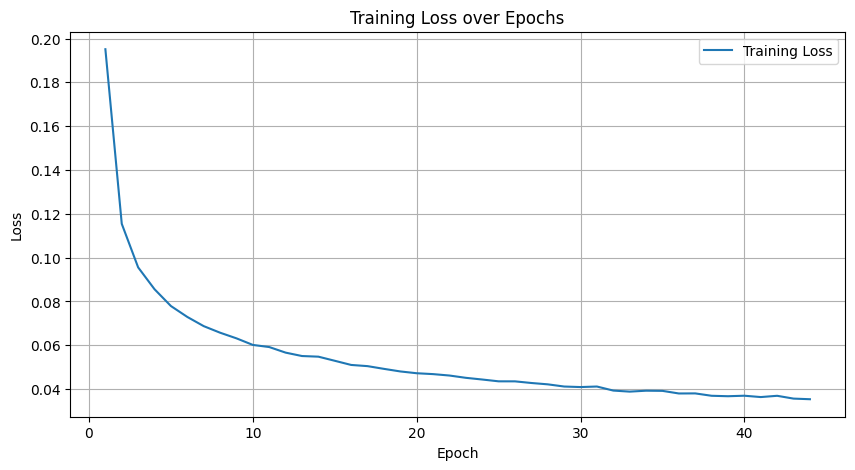


Generating final samples using DDPM and DDIM...


DDPM Sampling: 1000it [00:06, 162.66it/s]


Starting DDIM sampling with 500 steps (step size: 2)


DDIM Sampling: 15it [00:00, 144.92it/s]

Step 500/500: Deterministic step
Step 499/500: Deterministic step
Step 498/500: Deterministic step
Step 497/500: Deterministic step
Step 496/500: Deterministic step
Step 495/500: Deterministic step
Step 494/500: Deterministic step
Step 493/500: Deterministic step
Step 492/500: Deterministic step
Step 491/500: Deterministic step
Step 490/500: Deterministic step
Step 489/500: Deterministic step
Step 488/500: Deterministic step
Step 487/500: Deterministic step
Step 486/500: Deterministic step
Step 485/500: Deterministic step
Step 484/500: Deterministic step
Step 483/500: Deterministic step
Step 482/500: Deterministic step
Step 481/500: Deterministic step
Step 480/500: Deterministic step
Step 479/500: Deterministic step
Step 478/500: Deterministic step
Step 477/500: Deterministic step
Step 476/500: Deterministic step
Step 475/500: Deterministic step
Step 474/500: Deterministic step
Step 473/500: Deterministic step


DDIM Sampling: 30it [00:00, 144.17it/s]

Step 472/500: Deterministic step
Step 471/500: Deterministic step


DDIM Sampling: 45it [00:00, 136.47it/s]

Step 470/500: Deterministic step
Step 469/500: Deterministic step
Step 468/500: Deterministic step
Step 467/500: Deterministic step
Step 466/500: Deterministic step
Step 465/500: Deterministic step
Step 464/500: Deterministic step
Step 463/500: Deterministic step
Step 462/500: Deterministic step
Step 461/500: Deterministic step
Step 460/500: Deterministic step
Step 459/500: Deterministic step
Step 458/500: Deterministic step
Step 457/500: Deterministic step
Step 456/500: Deterministic step
Step 455/500: Deterministic step
Step 454/500: Deterministic step
Step 453/500: Deterministic step
Step 452/500: Deterministic step
Step 451/500: Deterministic step
Step 450/500: Deterministic step
Step 449/500: Deterministic step
Step 448/500: Deterministic step
Step 447/500: Deterministic step
Step 446/500: Deterministic step
Step 445/500: Deterministic step
Step 444/500: Deterministic step
Step 443/500: Deterministic step


DDIM Sampling: 74it [00:00, 139.10it/s]

Step 442/500: Deterministic step
Step 441/500: Deterministic step
Step 440/500: Deterministic step
Step 439/500: Deterministic step
Step 438/500: Deterministic step
Step 437/500: Deterministic step
Step 436/500: Deterministic step
Step 435/500: Deterministic step
Step 434/500: Deterministic step
Step 433/500: Deterministic step
Step 432/500: Deterministic step
Step 431/500: Deterministic step
Step 430/500: Deterministic step
Step 429/500: Deterministic step
Step 428/500: Deterministic step
Step 427/500: Deterministic step
Step 426/500: Deterministic step
Step 425/500: Deterministic step
Step 424/500: Deterministic step
Step 423/500: Deterministic step
Step 422/500: Deterministic step
Step 421/500: Deterministic step
Step 420/500: Deterministic step
Step 419/500: Deterministic step
Step 418/500: Deterministic step
Step 417/500: Deterministic step
Step 416/500: Deterministic step
Step 415/500: Deterministic step
Step 414/500: Deterministic step


DDIM Sampling: 103it [00:00, 142.02it/s]

Step 413/500: Deterministic step
Step 412/500: Deterministic step
Step 411/500: Deterministic step
Step 410/500: Deterministic step
Step 409/500: Deterministic step
Step 408/500: Deterministic step
Step 407/500: Deterministic step
Step 406/500: Deterministic step
Step 405/500: Deterministic step
Step 404/500: Deterministic step
Step 403/500: Deterministic step
Step 402/500: Deterministic step
Step 401/500: Deterministic step
Step 400/500: Deterministic step
Step 399/500: Deterministic step
Step 398/500: Deterministic step
Step 397/500: Deterministic step
Step 396/500: Deterministic step
Step 395/500: Deterministic step
Step 394/500: Deterministic step
Step 393/500: Deterministic step
Step 392/500: Deterministic step
Step 391/500: Deterministic step
Step 390/500: Deterministic step
Step 389/500: Deterministic step
Step 388/500: Deterministic step
Step 387/500: Deterministic step
Step 386/500: Deterministic step
Step 385/500: Deterministic step
Step 384/500: Deterministic step


DDIM Sampling: 133it [00:00, 139.69it/s]

Step 383/500: Deterministic step
Step 382/500: Deterministic step
Step 381/500: Deterministic step
Step 380/500: Deterministic step
Step 379/500: Deterministic step
Step 378/500: Deterministic step
Step 377/500: Deterministic step
Step 376/500: Deterministic step
Step 375/500: Deterministic step
Step 374/500: Deterministic step
Step 373/500: Deterministic step
Step 372/500: Deterministic step
Step 371/500: Deterministic step
Step 370/500: Deterministic step
Step 369/500: Deterministic step
Step 368/500: Deterministic step
Step 367/500: Deterministic step
Step 366/500: Deterministic step
Step 365/500: Deterministic step
Step 364/500: Deterministic step
Step 363/500: Deterministic step
Step 362/500: Deterministic step
Step 361/500: Deterministic step
Step 360/500: Deterministic step
Step 359/500: Deterministic step
Step 358/500: Deterministic step


DDIM Sampling: 161it [00:01, 128.87it/s]

Step 357/500: Deterministic step
Step 356/500: Deterministic step
Step 355/500: Deterministic step
Step 354/500: Deterministic step
Step 353/500: Deterministic step
Step 352/500: Deterministic step
Step 351/500: Deterministic step
Step 350/500: Deterministic step
Step 349/500: Deterministic step
Step 348/500: Deterministic step
Step 347/500: Deterministic step
Step 346/500: Deterministic step
Step 345/500: Deterministic step
Step 344/500: Deterministic step
Step 343/500: Deterministic step
Step 342/500: Deterministic step
Step 341/500: Deterministic step
Step 340/500: Deterministic step
Step 339/500: Deterministic step
Step 338/500: Deterministic step
Step 337/500: Deterministic step
Step 336/500: Deterministic step
Step 335/500: Deterministic step
Step 334/500: Deterministic step
Step 333/500: Deterministic step
Step 332/500: Deterministic step

DDIM Sampling: 187it [00:01, 124.49it/s]


Step 331/500: Deterministic step
Step 330/500: Deterministic step
Step 329/500: Deterministic step
Step 328/500: Deterministic step
Step 327/500: Deterministic step
Step 326/500: Deterministic step
Step 325/500: Deterministic step
Step 324/500: Deterministic step
Step 323/500: Deterministic step
Step 322/500: Deterministic step
Step 321/500: Deterministic step
Step 320/500: Deterministic step
Step 319/500: Deterministic step
Step 318/500: Deterministic step
Step 317/500: Deterministic step
Step 316/500: Deterministic step
Step 315/500: Deterministic step
Step 314/500: Deterministic step
Step 313/500: Deterministic step
Step 312/500: Deterministic step
Step 311/500: Deterministic step
Step 310/500: Deterministic step
Step 309/500: Deterministic step


DDIM Sampling: 213it [00:01, 123.51it/s]

Step 308/500: Deterministic step
Step 307/500: Deterministic step
Step 306/500: Deterministic step
Step 305/500: Deterministic step
Step 304/500: Deterministic step
Step 303/500: Deterministic step
Step 302/500: Deterministic step
Step 301/500: Deterministic step
Step 300/500: Deterministic step
Step 299/500: Deterministic step
Step 298/500: Deterministic step
Step 297/500: Deterministic step
Step 296/500: Deterministic step
Step 295/500: Deterministic step
Step 294/500: Deterministic step
Step 293/500: Deterministic step
Step 292/500: Deterministic step
Step 291/500: Deterministic step
Step 290/500: Deterministic step
Step 289/500: Deterministic step
Step 288/500: Deterministic step
Step 287/500: Deterministic step
Step 286/500: Deterministic step
Step 285/500: Deterministic step
Step 284/500: Deterministic step
Step 283/500: Deterministic step


DDIM Sampling: 240it [00:01, 126.21it/s]

Step 282/500: Deterministic step
Step 281/500: Deterministic step
Step 280/500: Deterministic step
Step 279/500: Deterministic step
Step 278/500: Deterministic step
Step 277/500: Deterministic step
Step 276/500: Deterministic step
Step 275/500: Deterministic step
Step 274/500: Deterministic step
Step 273/500: Deterministic step
Step 272/500: Deterministic step
Step 271/500: Deterministic step
Step 270/500: Deterministic step
Step 269/500: Deterministic step
Step 268/500: Deterministic step
Step 267/500: Deterministic step
Step 266/500: Deterministic step
Step 265/500: Deterministic step
Step 264/500: Deterministic step
Step 263/500: Deterministic step
Step 262/500: Deterministic step
Step 261/500: Deterministic step
Step 260/500: Deterministic step
Step 259/500: Deterministic step
Step 258/500: Deterministic step
Step 257/500: Deterministic step


DDIM Sampling: 267it [00:02, 128.51it/s]

Step 256/500: Deterministic step
Step 255/500: Deterministic step
Step 254/500: Deterministic step
Step 253/500: Deterministic step
Step 252/500: Deterministic step
Step 251/500: Deterministic step
Step 250/500: Deterministic step
Step 249/500: Deterministic step
Step 248/500: Deterministic step
Step 247/500: Deterministic step
Step 246/500: Deterministic step
Step 245/500: Deterministic step
Step 244/500: Deterministic step
Step 243/500: Deterministic step
Step 242/500: Deterministic step
Step 241/500: Deterministic step
Step 240/500: Deterministic step
Step 239/500: Deterministic step
Step 238/500: Deterministic step
Step 237/500: Deterministic step
Step 236/500: Deterministic step
Step 235/500: Deterministic step
Step 234/500: Deterministic step
Step 233/500: Deterministic step
Step 232/500: Deterministic step
Step 231/500: Deterministic step
Step 230/500: Deterministic step


DDIM Sampling: 294it [00:02, 130.10it/s]

Step 229/500: Deterministic step
Step 228/500: Deterministic step
Step 227/500: Deterministic step
Step 226/500: Deterministic step
Step 225/500: Deterministic step
Step 224/500: Deterministic step
Step 223/500: Deterministic step
Step 222/500: Deterministic step
Step 221/500: Deterministic step
Step 220/500: Deterministic step
Step 219/500: Deterministic step
Step 218/500: Deterministic step
Step 217/500: Deterministic step
Step 216/500: Deterministic step
Step 215/500: Deterministic step
Step 214/500: Deterministic step
Step 213/500: Deterministic step
Step 212/500: Deterministic step
Step 211/500: Deterministic step
Step 210/500: Deterministic step
Step 209/500: Deterministic step
Step 208/500: Deterministic step
Step 207/500: Deterministic step
Step 206/500: Deterministic step
Step 205/500: Deterministic step
Step 204/500: Deterministic step
Step 203/500: Deterministic step


DDIM Sampling: 308it [00:02, 126.60it/s]

Step 202/500: Deterministic step
Step 201/500: Deterministic step
Step 200/500: Deterministic step
Step 199/500: Deterministic step
Step 198/500: Deterministic step
Step 197/500: Deterministic step
Step 196/500: Deterministic step
Step 195/500: Deterministic step
Step 194/500: Deterministic step
Step 193/500: Deterministic step
Step 192/500: Deterministic step
Step 191/500: Deterministic step
Step 190/500: Deterministic step
Step 189/500: Deterministic step
Step 188/500: Deterministic step
Step 187/500: Deterministic step
Step 186/500: Deterministic step
Step 185/500: Deterministic step
Step 184/500: Deterministic step
Step 183/500: Deterministic step
Step 182/500: Deterministic step
Step 181/500: Deterministic step


DDIM Sampling: 321it [00:02, 118.93it/s]

Step 180/500: Deterministic step


DDIM Sampling: 333it [00:02, 116.71it/s]

Step 179/500: Deterministic step
Step 178/500: Deterministic step
Step 177/500: Deterministic step
Step 176/500: Deterministic step
Step 175/500: Deterministic step
Step 174/500: Deterministic step
Step 173/500: Deterministic step
Step 172/500: Deterministic step
Step 171/500: Deterministic step
Step 170/500: Deterministic step
Step 169/500: Deterministic step
Step 168/500: Deterministic step
Step 167/500: Deterministic step
Step 166/500: Deterministic step
Step 165/500: Deterministic step
Step 164/500: Deterministic step
Step 163/500: Deterministic step
Step 162/500: Deterministic step
Step 161/500: Deterministic step
Step 160/500: Deterministic step
Step 159/500: Deterministic step
Step 158/500: Deterministic step
Step 157/500: Deterministic step
Step 156/500: Deterministic step


DDIM Sampling: 359it [00:02, 118.26it/s]

Step 155/500: Deterministic step
Step 154/500: Deterministic step
Step 153/500: Deterministic step
Step 152/500: Deterministic step
Step 151/500: Deterministic step
Step 150/500: Deterministic step
Step 149/500: Deterministic step
Step 148/500: Deterministic step
Step 147/500: Deterministic step
Step 146/500: Deterministic step
Step 145/500: Deterministic step
Step 144/500: Deterministic step
Step 143/500: Deterministic step
Step 142/500: Deterministic step
Step 141/500: Deterministic step
Step 140/500: Deterministic step
Step 139/500: Deterministic step
Step 138/500: Deterministic step
Step 137/500: Deterministic step
Step 136/500: Deterministic step
Step 135/500: Deterministic step
Step 134/500: Deterministic step
Step 133/500: Deterministic step
Step 132/500: Deterministic step


DDIM Sampling: 383it [00:03, 115.13it/s]

Step 131/500: Deterministic step
Step 130/500: Deterministic step
Step 129/500: Deterministic step
Step 128/500: Deterministic step
Step 127/500: Deterministic step
Step 126/500: Deterministic step
Step 125/500: Deterministic step
Step 124/500: Deterministic step
Step 123/500: Deterministic step
Step 122/500: Deterministic step
Step 121/500: Deterministic step
Step 120/500: Deterministic step
Step 119/500: Deterministic step
Step 118/500: Deterministic step
Step 117/500: Deterministic step
Step 116/500: Deterministic step
Step 115/500: Deterministic step
Step 114/500: Deterministic step
Step 113/500: Deterministic step
Step 112/500: Deterministic step
Step 111/500: Deterministic step
Step 110/500: Deterministic step
Step 109/500: Deterministic step


DDIM Sampling: 408it [00:03, 117.93it/s]

Step 108/500: Deterministic step
Step 107/500: Deterministic step
Step 106/500: Deterministic step
Step 105/500: Deterministic step
Step 104/500: Deterministic step
Step 103/500: Deterministic step
Step 102/500: Deterministic step
Step 101/500: Deterministic step
Step 100/500: Deterministic step
Step 99/500: Deterministic step
Step 98/500: Deterministic step
Step 97/500: Deterministic step
Step 96/500: Deterministic step
Step 95/500: Deterministic step
Step 94/500: Deterministic step
Step 93/500: Deterministic step
Step 92/500: Deterministic step
Step 91/500: Deterministic step
Step 90/500: Deterministic step
Step 89/500: Deterministic step
Step 88/500: Deterministic step
Step 87/500: Deterministic step
Step 86/500: Deterministic step
Step 85/500: Deterministic step
Step 84/500: Deterministic step


DDIM Sampling: 432it [00:03, 110.90it/s]

Step 83/500: Deterministic step
Step 82/500: Deterministic step
Step 81/500: Deterministic step
Step 80/500: Deterministic step
Step 79/500: Deterministic step
Step 78/500: Deterministic step
Step 77/500: Deterministic step
Step 76/500: Deterministic step
Step 75/500: Deterministic step
Step 74/500: Deterministic step
Step 73/500: Deterministic step
Step 72/500: Deterministic step
Step 71/500: Deterministic step
Step 70/500: Deterministic step
Step 69/500: Deterministic step
Step 68/500: Deterministic step
Step 67/500: Deterministic step
Step 66/500: Deterministic step
Step 65/500: Deterministic step
Step 64/500: Deterministic step
Step 63/500: Deterministic step


DDIM Sampling: 459it [00:03, 119.75it/s]

Step 62/500: Deterministic step
Step 61/500: Deterministic step
Step 60/500: Deterministic step
Step 59/500: Deterministic step
Step 58/500: Deterministic step
Step 57/500: Deterministic step
Step 56/500: Deterministic step
Step 55/500: Deterministic step
Step 54/500: Deterministic step
Step 53/500: Deterministic step
Step 52/500: Deterministic step
Step 51/500: Deterministic step
Step 50/500: Deterministic step
Step 49/500: Deterministic step
Step 48/500: Deterministic step
Step 47/500: Deterministic step
Step 46/500: Deterministic step
Step 45/500: Deterministic step
Step 44/500: Deterministic step
Step 43/500: Deterministic step
Step 42/500: Deterministic step
Step 41/500: Deterministic step
Step 40/500: Deterministic step
Step 39/500: Deterministic step
Step 38/500: Deterministic step
Step 37/500: Deterministic step
Step 36/500: Deterministic step
Step 35/500: Deterministic step


DDIM Sampling: 488it [00:03, 130.67it/s]

Step 34/500: Deterministic step
Step 33/500: Deterministic step
Step 32/500: Deterministic step
Step 31/500: Deterministic step
Step 30/500: Deterministic step
Step 29/500: Deterministic step
Step 28/500: Deterministic step
Step 27/500: Deterministic step
Step 26/500: Deterministic step
Step 25/500: Deterministic step
Step 24/500: Deterministic step
Step 23/500: Deterministic step
Step 22/500: Deterministic step
Step 21/500: Deterministic step
Step 20/500: Deterministic step
Step 19/500: Deterministic step
Step 18/500: Deterministic step
Step 17/500: Deterministic step
Step 16/500: Deterministic step
Step 15/500: Deterministic step
Step 14/500: Deterministic step
Step 13/500: Deterministic step
Step 12/500: Deterministic step
Step 11/500: Deterministic step
Step 10/500: Deterministic step
Step 9/500: Deterministic step
Step 8/500: Deterministic step
Step 7/500: Deterministic step
Step 6/500: Deterministic step


DDIM Sampling: 500it [00:03, 126.28it/s]


Step 5/500: Deterministic step
Step 4/500: Deterministic step
Step 3/500: Deterministic step
Step 2/500: Deterministic step
Step 1/500: Deterministic step
DDIM sampling completed.


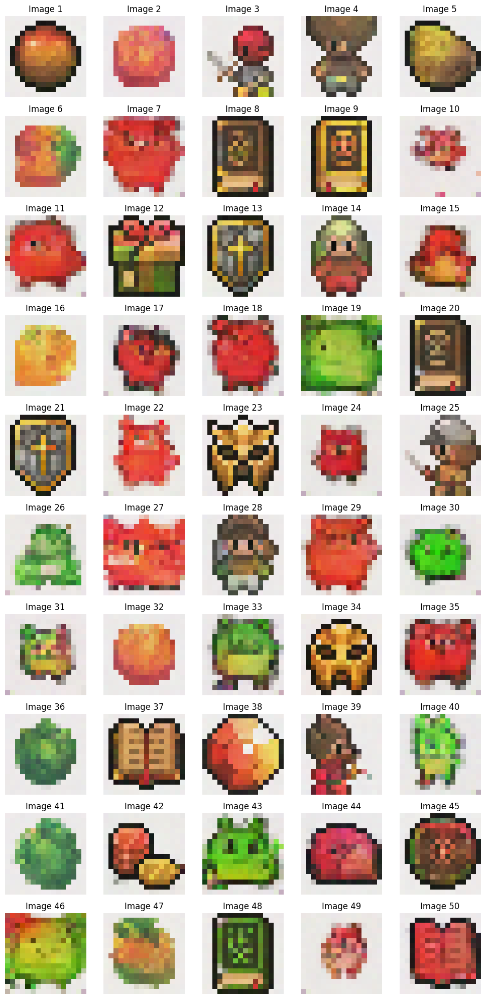

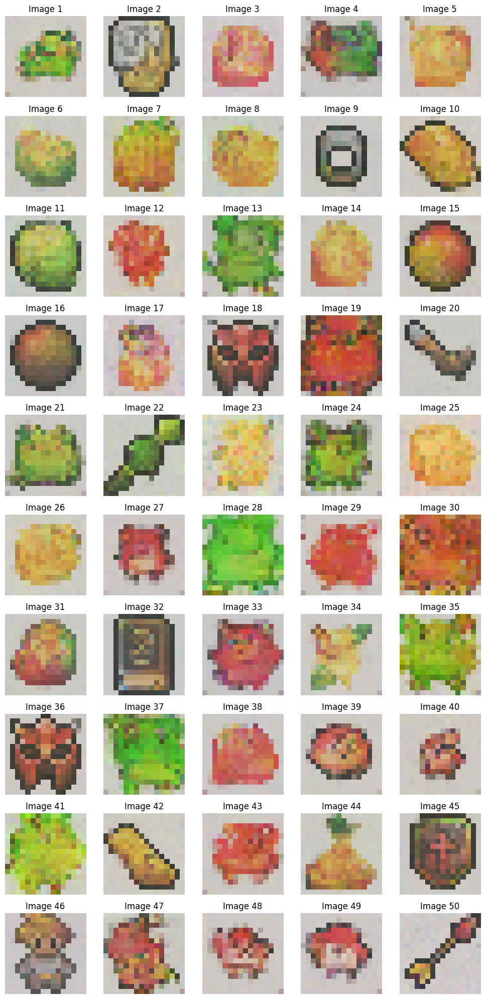

100%|██████████| 1/1 [00:00<00:00,  3.21it/s]


Final FID Score for DDPM: 162.0255772645357


100%|██████████| 1/1 [00:00<00:00,  2.81it/s]


Final FID Score for DDIM: 200.27266581052746

Training and sampling completed successfully.


In [28]:
# Adjust the range to match the length of `loss_history`
plt.figure(figsize=(10, 5))
plt.plot(range(1, len(loss_history) + 1), loss_history, label='Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss over Epochs')
plt.legend()
plt.grid(True)
plt.show()


print("\nGenerating final samples using DDPM and DDIM...")

final_samples_ddpm = sample_ddpm(nn_model, n_sample=50, timesteps=timesteps, beta=beta, alpha=alpha, alpha_bar=alpha_bar, device=device, height=height).cpu()
final_samples_ddim = sample_ddim(nn_model, n_sample=50, timesteps=timesteps, beta=beta, alpha=alpha, alpha_bar=alpha_bar, device=device, height=height, eta=0.0, n_steps=500).cpu()

final_ddpm_dir = os.path.join(save_dir_ddpm, 'final')
final_ddim_dir = os.path.join(save_dir_ddim, 'final')
os.makedirs(final_ddpm_dir, exist_ok=True)
os.makedirs(final_ddim_dir, exist_ok=True)

for i in range(50):
    save_image(final_samples_ddpm[i], os.path.join(final_ddpm_dir, f'ddpm_final_{i}.png'))
plot_sample(final_samples_ddpm, 50, nrows=10)
plt.savefig(os.path.join(final_ddpm_dir, 'ddpm_final_samples.png'))
plt.close()

for i in range(50):
    save_image(final_samples_ddim[i], os.path.join(final_ddim_dir, f'ddim_final_{i}.png'))
plot_sample(final_samples_ddim, 50, nrows=10)
plt.savefig(os.path.join(final_ddim_dir, 'ddim_final_samples.png'))
plt.close()

real_final_batch, _ = next(iter(val_dataloader))
real_final_batch = real_final_batch[:50].to(device)

final_fid_ddpm = compute_fid(real_final_batch.cpu(), final_samples_ddpm)
print(f"Final FID Score for DDPM: {final_fid_ddpm}")

final_fid_ddim = compute_fid(real_final_batch.cpu(), final_samples_ddim)
print(f"Final FID Score for DDIM: {final_fid_ddim}")

print("\nTraining and sampling completed successfully.")





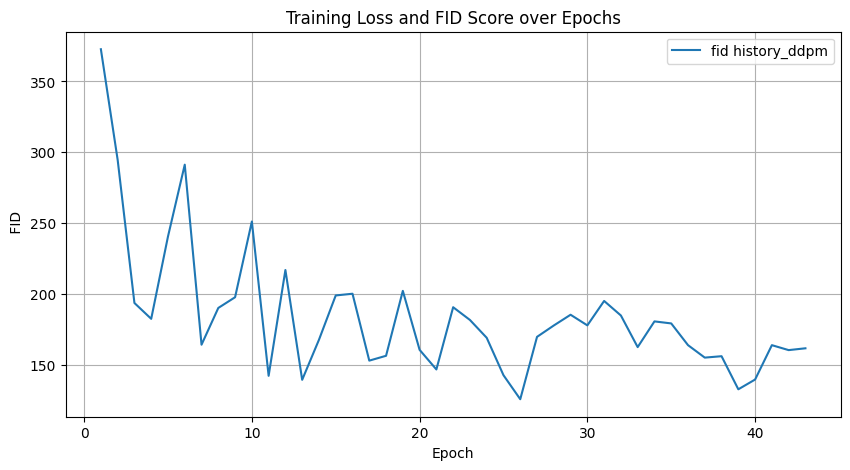

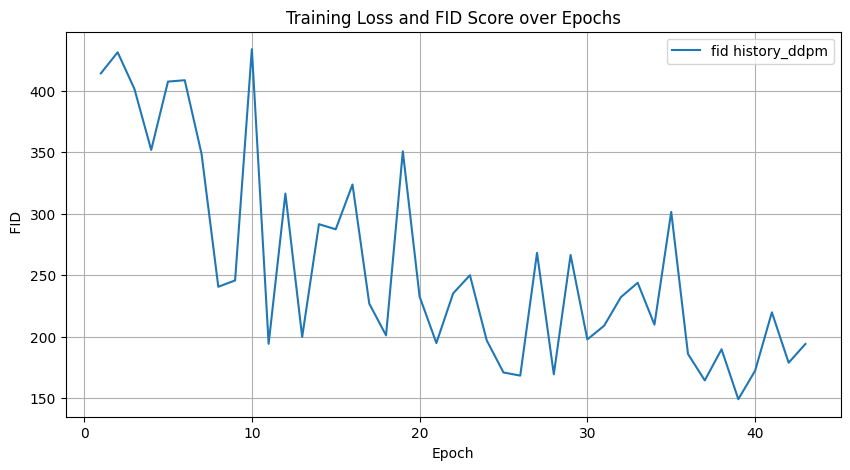

In [32]:
# prompt: plot fid scores too

import os
import time
import numpy as np
import matplotlib.pyplot as plt
from typing import Tuple
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from torchvision.utils import save_image
from tqdm import tqdm
from pytorch_fid import fid_score

# ... (Your existing code) ...

# Assuming you have fid_history list to store FID scores per epoch

plt.figure(figsize=(10, 5))
plt.plot(range(1, len(fid_history_ddpm) + 1), fid_history_ddpm, label='fid history_ddpm')
plt.xlabel('Epoch')
plt.ylabel(' FID')
plt.title('Training Loss and FID Score over Epochs')
plt.legend()
plt.grid(True)
plt.show()



# Assuming you have fid_history list to store FID scores per epoch

plt.figure(figsize=(10, 5))
plt.plot(range(1, len(fid_history_ddim) + 1), fid_history_ddim, label='fid history_ddpm')
plt.xlabel('Epoch')
plt.ylabel(' FID')
plt.title('Training Loss and FID Score over Epochs')
plt.legend()
plt.grid(True)
plt.show()

# ... (rest of your existing code) ...


Generating final samples using DDPM and DDIM...


DDPM Sampling: 1000it [00:06, 162.67it/s]


Starting DDIM sampling with 400 steps (step size: 2)


DDIM Sampling: 16it [00:00, 151.13it/s]

Step 400/400: Deterministic step
Step 399/400: Deterministic step
Step 398/400: Deterministic step
Step 397/400: Deterministic step
Step 396/400: Deterministic step
Step 395/400: Deterministic step
Step 394/400: Deterministic step
Step 393/400: Deterministic step
Step 392/400: Deterministic step
Step 391/400: Deterministic step
Step 390/400: Deterministic step
Step 389/400: Deterministic step
Step 388/400: Deterministic step
Step 387/400: Deterministic step
Step 386/400: Deterministic step
Step 385/400: Deterministic step
Step 384/400: Deterministic step
Step 383/400: Deterministic step
Step 382/400: Deterministic step
Step 381/400: Deterministic step
Step 380/400: Deterministic step
Step 379/400: Deterministic step
Step 378/400: Deterministic step
Step 377/400: Deterministic step
Step 376/400: Deterministic step
Step 375/400: Deterministic step
Step 374/400: Deterministic step
Step 373/400: Deterministic step
Step 372/400: Deterministic step
Step 371/400: Deterministic step


DDIM Sampling: 47it [00:00, 145.14it/s]

Step 370/400: Deterministic step
Step 369/400: Deterministic step
Step 368/400: Deterministic step
Step 367/400: Deterministic step
Step 366/400: Deterministic step
Step 365/400: Deterministic step
Step 364/400: Deterministic step
Step 363/400: Deterministic step
Step 362/400: Deterministic step
Step 361/400: Deterministic step
Step 360/400: Deterministic step
Step 359/400: Deterministic step
Step 358/400: Deterministic step
Step 357/400: Deterministic step
Step 356/400: Deterministic step
Step 355/400: Deterministic step
Step 354/400: Deterministic step
Step 353/400: Deterministic step
Step 352/400: Deterministic step
Step 351/400: Deterministic step
Step 350/400: Deterministic step
Step 349/400: Deterministic step
Step 348/400: Deterministic step
Step 347/400: Deterministic step
Step 346/400: Deterministic step
Step 345/400: Deterministic step
Step 344/400: Deterministic step
Step 343/400: Deterministic step
Step 342/400: Deterministic step


DDIM Sampling: 77it [00:00, 143.19it/s]

Step 341/400: Deterministic step
Step 340/400: Deterministic step
Step 339/400: Deterministic step
Step 338/400: Deterministic step
Step 337/400: Deterministic step
Step 336/400: Deterministic step
Step 335/400: Deterministic step
Step 334/400: Deterministic step
Step 333/400: Deterministic step
Step 332/400: Deterministic step
Step 331/400: Deterministic step
Step 330/400: Deterministic step
Step 329/400: Deterministic step
Step 328/400: Deterministic step
Step 327/400: Deterministic step
Step 326/400: Deterministic step
Step 325/400: Deterministic step
Step 324/400: Deterministic step
Step 323/400: Deterministic step
Step 322/400: Deterministic step
Step 321/400: Deterministic step
Step 320/400: Deterministic step
Step 319/400: Deterministic step
Step 318/400: Deterministic step
Step 317/400: Deterministic step
Step 316/400: Deterministic step
Step 315/400: Deterministic step
Step 314/400: Deterministic step
Step 313/400: Deterministic step


DDIM Sampling: 107it [00:00, 140.00it/s]

Step 312/400: Deterministic step
Step 311/400: Deterministic step
Step 310/400: Deterministic step
Step 309/400: Deterministic step
Step 308/400: Deterministic step
Step 307/400: Deterministic step
Step 306/400: Deterministic step
Step 305/400: Deterministic step
Step 304/400: Deterministic step
Step 303/400: Deterministic step
Step 302/400: Deterministic step
Step 301/400: Deterministic step
Step 300/400: Deterministic step
Step 299/400: Deterministic step
Step 298/400: Deterministic step
Step 297/400: Deterministic step
Step 296/400: Deterministic step
Step 295/400: Deterministic step
Step 294/400: Deterministic step
Step 293/400: Deterministic step
Step 292/400: Deterministic step
Step 291/400: Deterministic step
Step 290/400: Deterministic step
Step 289/400: Deterministic step
Step 288/400: Deterministic step
Step 287/400: Deterministic step
Step 286/400: Deterministic step
Step 285/400: Deterministic step
Step 284/400: Deterministic step


DDIM Sampling: 137it [00:00, 139.61it/s]

Step 283/400: Deterministic step
Step 282/400: Deterministic step
Step 281/400: Deterministic step
Step 280/400: Deterministic step
Step 279/400: Deterministic step
Step 278/400: Deterministic step
Step 277/400: Deterministic step
Step 276/400: Deterministic step
Step 275/400: Deterministic step
Step 274/400: Deterministic step
Step 273/400: Deterministic step
Step 272/400: Deterministic step
Step 271/400: Deterministic step
Step 270/400: Deterministic step
Step 269/400: Deterministic step
Step 268/400: Deterministic step
Step 267/400: Deterministic step
Step 266/400: Deterministic step
Step 265/400: Deterministic step
Step 264/400: Deterministic step
Step 263/400: Deterministic step
Step 262/400: Deterministic step
Step 261/400: Deterministic step
Step 260/400: Deterministic step
Step 259/400: Deterministic step
Step 258/400: Deterministic step
Step 257/400: Deterministic step
Step 256/400: Deterministic step
Step 255/400: Deterministic step


DDIM Sampling: 167it [00:01, 141.12it/s]

Step 254/400: Deterministic step
Step 253/400: Deterministic step
Step 252/400: Deterministic step
Step 251/400: Deterministic step
Step 250/400: Deterministic step
Step 249/400: Deterministic step
Step 248/400: Deterministic step
Step 247/400: Deterministic step
Step 246/400: Deterministic step
Step 245/400: Deterministic step
Step 244/400: Deterministic step
Step 243/400: Deterministic step
Step 242/400: Deterministic step
Step 241/400: Deterministic step
Step 240/400: Deterministic step
Step 239/400: Deterministic step
Step 238/400: Deterministic step
Step 237/400: Deterministic step
Step 236/400: Deterministic step
Step 235/400: Deterministic step
Step 234/400: Deterministic step
Step 233/400: Deterministic step
Step 232/400: Deterministic step
Step 231/400: Deterministic step
Step 230/400: Deterministic step
Step 229/400: Deterministic step
Step 228/400: Deterministic step
Step 227/400: Deterministic step
Step 226/400: Deterministic step


DDIM Sampling: 197it [00:01, 143.20it/s]

Step 225/400: Deterministic step
Step 224/400: Deterministic step
Step 223/400: Deterministic step
Step 222/400: Deterministic step
Step 221/400: Deterministic step
Step 220/400: Deterministic step
Step 219/400: Deterministic step
Step 218/400: Deterministic step
Step 217/400: Deterministic step
Step 216/400: Deterministic step
Step 215/400: Deterministic step
Step 214/400: Deterministic step
Step 213/400: Deterministic step
Step 212/400: Deterministic step
Step 211/400: Deterministic step
Step 210/400: Deterministic step
Step 209/400: Deterministic step
Step 208/400: Deterministic step
Step 207/400: Deterministic step
Step 206/400: Deterministic step
Step 205/400: Deterministic step
Step 204/400: Deterministic step
Step 203/400: Deterministic step
Step 202/400: Deterministic step
Step 201/400: Deterministic step
Step 200/400: Deterministic step
Step 199/400: Deterministic step
Step 198/400: Deterministic step
Step 197/400: Deterministic step


DDIM Sampling: 227it [00:01, 143.06it/s]

Step 196/400: Deterministic step
Step 195/400: Deterministic step
Step 194/400: Deterministic step
Step 193/400: Deterministic step
Step 192/400: Deterministic step
Step 191/400: Deterministic step
Step 190/400: Deterministic step
Step 189/400: Deterministic step
Step 188/400: Deterministic step
Step 187/400: Deterministic step
Step 186/400: Deterministic step
Step 185/400: Deterministic step
Step 184/400: Deterministic step
Step 183/400: Deterministic step
Step 182/400: Deterministic step
Step 181/400: Deterministic step
Step 180/400: Deterministic step
Step 179/400: Deterministic step
Step 178/400: Deterministic step
Step 177/400: Deterministic step
Step 176/400: Deterministic step
Step 175/400: Deterministic step
Step 174/400: Deterministic step
Step 173/400: Deterministic step
Step 172/400: Deterministic step
Step 171/400: Deterministic step
Step 170/400: Deterministic step
Step 169/400: Deterministic step
Step 168/400: Deterministic step


DDIM Sampling: 257it [00:01, 141.87it/s]

Step 167/400: Deterministic step
Step 166/400: Deterministic step
Step 165/400: Deterministic step
Step 164/400: Deterministic step
Step 163/400: Deterministic step
Step 162/400: Deterministic step
Step 161/400: Deterministic step
Step 160/400: Deterministic step
Step 159/400: Deterministic step
Step 158/400: Deterministic step
Step 157/400: Deterministic step
Step 156/400: Deterministic step
Step 155/400: Deterministic step
Step 154/400: Deterministic step
Step 153/400: Deterministic step
Step 152/400: Deterministic step
Step 151/400: Deterministic step
Step 150/400: Deterministic step
Step 149/400: Deterministic step
Step 148/400: Deterministic step
Step 147/400: Deterministic step
Step 146/400: Deterministic step
Step 145/400: Deterministic step
Step 144/400: Deterministic step
Step 143/400: Deterministic step
Step 142/400: Deterministic step
Step 141/400: Deterministic step
Step 140/400: Deterministic step
Step 139/400: Deterministic step
Step 138/400: Deterministic step


DDIM Sampling: 287it [00:02, 142.07it/s]

Step 137/400: Deterministic step
Step 136/400: Deterministic step
Step 135/400: Deterministic step
Step 134/400: Deterministic step
Step 133/400: Deterministic step
Step 132/400: Deterministic step
Step 131/400: Deterministic step
Step 130/400: Deterministic step
Step 129/400: Deterministic step
Step 128/400: Deterministic step
Step 127/400: Deterministic step
Step 126/400: Deterministic step
Step 125/400: Deterministic step
Step 124/400: Deterministic step
Step 123/400: Deterministic step
Step 122/400: Deterministic step
Step 121/400: Deterministic step
Step 120/400: Deterministic step
Step 119/400: Deterministic step
Step 118/400: Deterministic step
Step 117/400: Deterministic step
Step 116/400: Deterministic step
Step 115/400: Deterministic step
Step 114/400: Deterministic step
Step 113/400: Deterministic step
Step 112/400: Deterministic step
Step 111/400: Deterministic step
Step 110/400: Deterministic step
Step 109/400: Deterministic step


DDIM Sampling: 317it [00:02, 145.07it/s]

Step 108/400: Deterministic step
Step 107/400: Deterministic step
Step 106/400: Deterministic step
Step 105/400: Deterministic step
Step 104/400: Deterministic step
Step 103/400: Deterministic step
Step 102/400: Deterministic step
Step 101/400: Deterministic step
Step 100/400: Deterministic step
Step 99/400: Deterministic step
Step 98/400: Deterministic step
Step 97/400: Deterministic step
Step 96/400: Deterministic step
Step 95/400: Deterministic step
Step 94/400: Deterministic step
Step 93/400: Deterministic step
Step 92/400: Deterministic step
Step 91/400: Deterministic step
Step 90/400: Deterministic step
Step 89/400: Deterministic step
Step 88/400: Deterministic step
Step 87/400: Deterministic step
Step 86/400: Deterministic step
Step 85/400: Deterministic step
Step 84/400: Deterministic step
Step 83/400: Deterministic step
Step 82/400: Deterministic step
Step 81/400: Deterministic step
Step 80/400: Deterministic step
Step 79/400: Deterministic step


DDIM Sampling: 347it [00:02, 144.18it/s]

Step 78/400: Deterministic step
Step 77/400: Deterministic step
Step 76/400: Deterministic step
Step 75/400: Deterministic step
Step 74/400: Deterministic step
Step 73/400: Deterministic step
Step 72/400: Deterministic step
Step 71/400: Deterministic step
Step 70/400: Deterministic step
Step 69/400: Deterministic step
Step 68/400: Deterministic step
Step 67/400: Deterministic step
Step 66/400: Deterministic step
Step 65/400: Deterministic step
Step 64/400: Deterministic step
Step 63/400: Deterministic step
Step 62/400: Deterministic step
Step 61/400: Deterministic step
Step 60/400: Deterministic step
Step 59/400: Deterministic step
Step 58/400: Deterministic step
Step 57/400: Deterministic step
Step 56/400: Deterministic step
Step 55/400: Deterministic step
Step 54/400: Deterministic step
Step 53/400: Deterministic step
Step 52/400: Deterministic step
Step 51/400: Deterministic step
Step 50/400: Deterministic step
Step 49/400: Deterministic step


DDIM Sampling: 377it [00:02, 141.68it/s]

Step 48/400: Deterministic step
Step 47/400: Deterministic step
Step 46/400: Deterministic step
Step 45/400: Deterministic step
Step 44/400: Deterministic step
Step 43/400: Deterministic step
Step 42/400: Deterministic step
Step 41/400: Deterministic step
Step 40/400: Deterministic step
Step 39/400: Deterministic step
Step 38/400: Deterministic step
Step 37/400: Deterministic step
Step 36/400: Deterministic step
Step 35/400: Deterministic step
Step 34/400: Deterministic step
Step 33/400: Deterministic step
Step 32/400: Deterministic step
Step 31/400: Deterministic step
Step 30/400: Deterministic step
Step 29/400: Deterministic step
Step 28/400: Deterministic step
Step 27/400: Deterministic step
Step 26/400: Deterministic step
Step 25/400: Deterministic step
Step 24/400: Deterministic step
Step 23/400: Deterministic step
Step 22/400: Deterministic step
Step 21/400: Deterministic step


DDIM Sampling: 400it [00:02, 142.11it/s]


Step 20/400: Deterministic step
Step 19/400: Deterministic step
Step 18/400: Deterministic step
Step 17/400: Deterministic step
Step 16/400: Deterministic step
Step 15/400: Deterministic step
Step 14/400: Deterministic step
Step 13/400: Deterministic step
Step 12/400: Deterministic step
Step 11/400: Deterministic step
Step 10/400: Deterministic step
Step 9/400: Deterministic step
Step 8/400: Deterministic step
Step 7/400: Deterministic step
Step 6/400: Deterministic step
Step 5/400: Deterministic step
Step 4/400: Deterministic step
Step 3/400: Deterministic step
Step 2/400: Deterministic step
Step 1/400: Deterministic step
DDIM sampling completed.


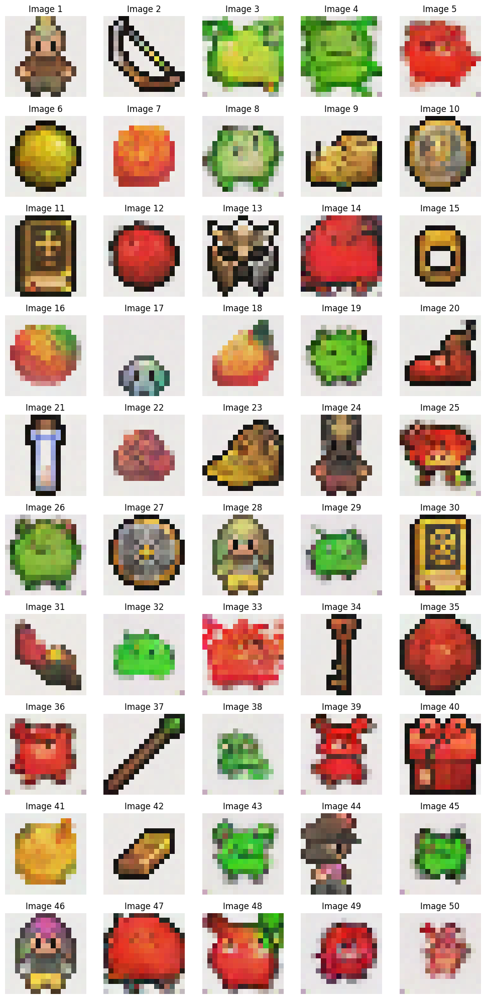

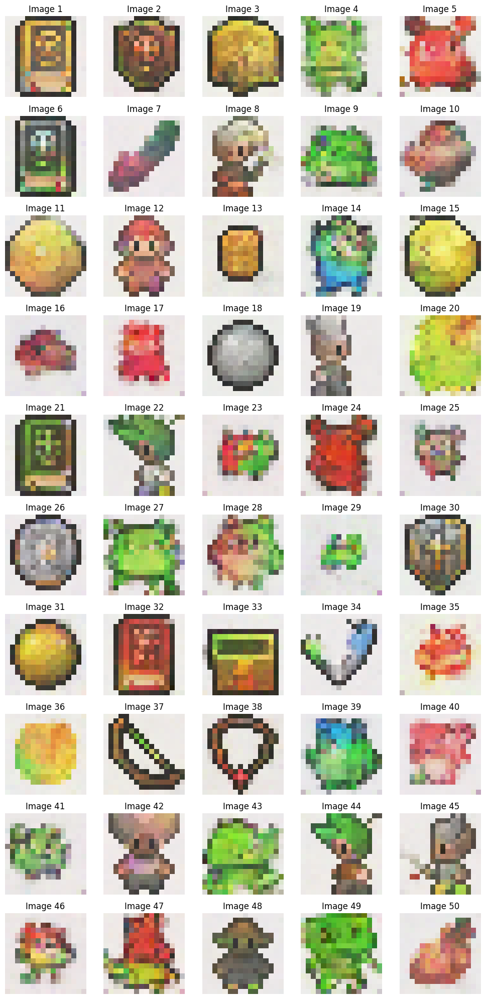

In [35]:
print("\nGenerating final samples using DDPM and DDIM...")

final_samples_ddpm = sample_ddpm(nn_model, n_sample=50, timesteps=timesteps, beta=beta, alpha=alpha, alpha_bar=alpha_bar, device=device, height=height).cpu()
final_samples_ddim = sample_ddim(nn_model, n_sample=50, timesteps=timesteps, beta=beta, alpha=alpha, alpha_bar=alpha_bar, device=device, height=height, eta=  0, n_steps=400).cpu()

plot_sample(final_samples_ddpm, 50, nrows=10)
plt.savefig(os.path.join(final_ddpm_dir, 'ddpm_final_samples.png'))
plt.close()

plot_sample(final_samples_ddim, 50, nrows=10)
plt.savefig(os.path.join(final_ddim_dir, 'ddim_final_samples.png'))
plt.close()



Generating final samples using DDPM and DDIM...


DDPM Sampling: 1000it [00:06, 143.59it/s]


Starting DDIM sampling with 600 steps (step size: 1)


DDIM Sampling: 15it [00:00, 143.29it/s]

Step 600/600: Added noise with sigma_t=0.10969061404466629
Step 599/600: Added noise with sigma_t=0.10959978401660919
Step 598/600: Added noise with sigma_t=0.10950886458158493
Step 597/600: Added noise with sigma_t=0.1094178780913353
Step 596/600: Added noise with sigma_t=0.1093268096446991
Step 595/600: Added noise with sigma_t=0.10923567414283752
Step 594/600: Added noise with sigma_t=0.10914445668458939
Step 593/600: Added noise with sigma_t=0.10905315726995468
Step 592/600: Added noise with sigma_t=0.1089617908000946
Step 591/600: Added noise with sigma_t=0.10887034982442856
Step 590/600: Added noise with sigma_t=0.10877881944179535
Step 589/600: Added noise with sigma_t=0.10868722200393677
Step 588/600: Added noise with sigma_t=0.10859554260969162
Step 587/600: Added noise with sigma_t=0.1085037887096405
Step 586/600: Added noise with sigma_t=0.10841195285320282
Step 585/600: Added noise with sigma_t=0.10832004994153976
Step 584/600: Added noise with sigma_t=0.10822805762290955
S

DDIM Sampling: 45it [00:00, 139.13it/s]

Step 571/600: Added noise with sigma_t=0.10702501237392426
Step 570/600: Added noise with sigma_t=0.1069319099187851
Step 569/600: Added noise with sigma_t=0.10683872550725937
Step 568/600: Added noise with sigma_t=0.10674546658992767
Step 567/600: Added noise with sigma_t=0.10665211826562881
Step 566/600: Added noise with sigma_t=0.10655868798494339
Step 565/600: Added noise with sigma_t=0.106465183198452
Step 564/600: Added noise with sigma_t=0.10637158900499344
Step 563/600: Added noise with sigma_t=0.10627791285514832
Step 562/600: Added noise with sigma_t=0.10618415474891663
Step 561/600: Added noise with sigma_t=0.10609031468629837
Step 560/600: Added noise with sigma_t=0.10599638521671295
Step 559/600: Added noise with sigma_t=0.10590238124132156
Step 558/600: Added noise with sigma_t=0.10580829530954361
Step 557/600: Added noise with sigma_t=0.10571411997079849
Step 556/600: Added noise with sigma_t=0.10561986267566681
Step 555/600: Added noise with sigma_t=0.10552551597356796


DDIM Sampling: 74it [00:00, 141.35it/s]

Step 542/600: Added noise with sigma_t=0.10429130494594574
Step 541/600: Added noise with sigma_t=0.10419575870037079
Step 540/600: Added noise with sigma_t=0.10410012304782867
Step 539/600: Added noise with sigma_t=0.1040044054389
Step 538/600: Added noise with sigma_t=0.10390859842300415
Step 537/600: Added noise with sigma_t=0.10381270200014114
Step 536/600: Added noise with sigma_t=0.10371671617031097
Step 535/600: Added noise with sigma_t=0.10362064093351364
Step 534/600: Added noise with sigma_t=0.10352447628974915
Step 533/600: Added noise with sigma_t=0.10342822223901749
Step 532/600: Added noise with sigma_t=0.10333187878131866
Step 531/600: Added noise with sigma_t=0.10323544591665268
Step 530/600: Added noise with sigma_t=0.10313892364501953
Step 529/600: Added noise with sigma_t=0.10304230451583862
Step 528/600: Added noise with sigma_t=0.10294560343027115
Step 527/600: Added noise with sigma_t=0.10284880548715591
Step 526/600: Added noise with sigma_t=0.10275191813707352
S

DDIM Sampling: 104it [00:00, 142.35it/s]

Step 513/600: Added noise with sigma_t=0.10148397833108902
Step 512/600: Added noise with sigma_t=0.10138578712940216
Step 511/600: Added noise with sigma_t=0.10128750652074814
Step 510/600: Added noise with sigma_t=0.10118912160396576
Step 509/600: Added noise with sigma_t=0.10109064728021622
Step 508/600: Added noise with sigma_t=0.10099207609891891
Step 507/600: Added noise with sigma_t=0.10089340060949326
Step 506/600: Added noise with sigma_t=0.10079463571310043
Step 505/600: Added noise with sigma_t=0.10069577395915985
Step 504/600: Added noise with sigma_t=0.10059681534767151
Step 503/600: Added noise with sigma_t=0.1004977598786354
Step 502/600: Added noise with sigma_t=0.10039860010147095
Step 501/600: Added noise with sigma_t=0.10029935091733932
Step 500/600: Added noise with sigma_t=0.10019999742507935
Step 499/600: Added noise with sigma_t=0.1001005470752716
Step 498/600: Added noise with sigma_t=0.10000099986791611
Step 497/600: Added noise with sigma_t=0.09990135580301285

DDIM Sampling: 134it [00:00, 139.26it/s]

Step 484/600: Added noise with sigma_t=0.09859675914049149
Step 483/600: Added noise with sigma_t=0.09849569201469421
Step 482/600: Added noise with sigma_t=0.09839452058076859
Step 481/600: Added noise with sigma_t=0.0982932448387146
Step 480/600: Added noise with sigma_t=0.09819186478853226
Step 479/600: Added noise with sigma_t=0.09809037297964096
Step 478/600: Added noise with sigma_t=0.0979887843132019
Step 477/600: Added noise with sigma_t=0.09788709133863449
Step 476/600: Added noise with sigma_t=0.09778528660535812
Step 475/600: Added noise with sigma_t=0.0976833775639534
Step 474/600: Added noise with sigma_t=0.09758136421442032
Step 473/600: Added noise with sigma_t=0.09747923910617828
Step 472/600: Added noise with sigma_t=0.09737700968980789
Step 471/600: Added noise with sigma_t=0.09727467596530914
Step 470/600: Added noise with sigma_t=0.09717223048210144
Step 469/600: Added noise with sigma_t=0.09706968069076538
Step 468/600: Added noise with sigma_t=0.09696701914072037


DDIM Sampling: 163it [00:01, 136.28it/s]

Step 458/600: Added noise with sigma_t=0.09593436866998672
Step 457/600: Added noise with sigma_t=0.09583049267530441
Step 456/600: Added noise with sigma_t=0.09572650492191315
Step 455/600: Added noise with sigma_t=0.09562240540981293
Step 454/600: Added noise with sigma_t=0.09551818668842316
Step 453/600: Added noise with sigma_t=0.09541385620832443
Step 452/600: Added noise with sigma_t=0.09530941396951675
Step 451/600: Added noise with sigma_t=0.09520485252141953
Step 450/600: Added noise with sigma_t=0.09510017931461334
Step 449/600: Added noise with sigma_t=0.0949953943490982
Step 448/600: Added noise with sigma_t=0.09489049017429352
Step 447/600: Added noise with sigma_t=0.09478546679019928
Step 446/600: Added noise with sigma_t=0.09468032419681549
Step 445/600: Added noise with sigma_t=0.09457506984472275
Step 444/600: Added noise with sigma_t=0.09446970373392105
Step 443/600: Added noise with sigma_t=0.0943642184138298
Step 442/600: Added noise with sigma_t=0.09425860643386841

DDIM Sampling: 192it [00:01, 139.06it/s]

Step 429/600: Added noise with sigma_t=0.09287478774785995
Step 428/600: Added noise with sigma_t=0.09276748448610306
Step 427/600: Added noise with sigma_t=0.09266005456447601
Step 426/600: Added noise with sigma_t=0.09255250543355942
Step 425/600: Added noise with sigma_t=0.09244482964277267
Step 424/600: Added noise with sigma_t=0.09233702719211578
Step 423/600: Added noise with sigma_t=0.09222909808158875
Step 422/600: Added noise with sigma_t=0.09212104231119156
Step 421/600: Added noise with sigma_t=0.09201285988092422
Step 420/600: Added noise with sigma_t=0.09190455079078674
Step 419/600: Added noise with sigma_t=0.09179611504077911
Step 418/600: Added noise with sigma_t=0.09168754518032074
Step 417/600: Added noise with sigma_t=0.09157885611057281
Step 416/600: Added noise with sigma_t=0.09147003293037415
Step 415/600: Added noise with sigma_t=0.09136108309030533
Step 414/600: Added noise with sigma_t=0.09125199913978577
Step 413/600: Added noise with sigma_t=0.091142781078815

DDIM Sampling: 221it [00:01, 138.25it/s]

Step 400/600: Added noise with sigma_t=0.08971091359853745
Step 399/600: Added noise with sigma_t=0.08959982544183731
Step 398/600: Added noise with sigma_t=0.08948859572410583
Step 397/600: Added noise with sigma_t=0.08937722444534302
Step 396/600: Added noise with sigma_t=0.08926571905612946
Step 395/600: Added noise with sigma_t=0.08915407210588455
Step 394/600: Added noise with sigma_t=0.0890422835946083
Step 393/600: Added noise with sigma_t=0.08893036097288132
Step 392/600: Added noise with sigma_t=0.08881828933954239
Step 391/600: Added noise with sigma_t=0.08870608359575272
Step 390/600: Added noise with sigma_t=0.0885937288403511
Step 389/600: Added noise with sigma_t=0.08848123997449875
Step 388/600: Added noise with sigma_t=0.08836859464645386
Step 387/600: Added noise with sigma_t=0.08825581520795822
Step 386/600: Added noise with sigma_t=0.08814289420843124
Step 385/600: Added noise with sigma_t=0.08802981674671173
Step 384/600: Added noise with sigma_t=0.08791660517454147

DDIM Sampling: 250it [00:01, 140.12it/s]

Step 371/600: Added noise with sigma_t=0.08643130958080292
Step 370/600: Added noise with sigma_t=0.08631598949432373
Step 369/600: Added noise with sigma_t=0.0862005278468132
Step 368/600: Added noise with sigma_t=0.08608490228652954
Step 367/600: Added noise with sigma_t=0.08596912771463394
Step 366/600: Added noise with sigma_t=0.0858531966805458
Step 365/600: Added noise with sigma_t=0.08573710173368454
Step 364/600: Added noise with sigma_t=0.08562085777521133
Step 363/600: Added noise with sigma_t=0.085504449903965
Step 362/600: Added noise with sigma_t=0.08538788557052612
Step 361/600: Added noise with sigma_t=0.08527116477489471
Step 360/600: Added noise with sigma_t=0.08515428006649017
Step 359/600: Added noise with sigma_t=0.0850372388958931
Step 358/600: Added noise with sigma_t=0.08492002636194229
Step 357/600: Added noise with sigma_t=0.08480266481637955
Step 356/600: Added noise with sigma_t=0.08468513190746307
Step 355/600: Added noise with sigma_t=0.08456743508577347
St

DDIM Sampling: 279it [00:02, 133.95it/s]

Step 342/600: Added noise with sigma_t=0.08302224427461624
Step 341/600: Added noise with sigma_t=0.08290218561887741
Step 340/600: Added noise with sigma_t=0.08278196305036545
Step 339/600: Added noise with sigma_t=0.08266155421733856
Step 338/600: Added noise with sigma_t=0.08254097402095795
Step 337/600: Added noise with sigma_t=0.0824202224612236
Step 336/600: Added noise with sigma_t=0.08229929208755493
Step 335/600: Added noise with sigma_t=0.08217818289995193
Step 334/600: Added noise with sigma_t=0.08205689489841461
Step 333/600: Added noise with sigma_t=0.08193542063236237
Step 332/600: Added noise with sigma_t=0.08181377500295639
Step 331/600: Added noise with sigma_t=0.08169194310903549
Step 330/600: Added noise with sigma_t=0.08156993240118027
Step 329/600: Added noise with sigma_t=0.08144773542881012
Step 328/600: Added noise with sigma_t=0.08132535964250565
Step 327/600: Added noise with sigma_t=0.08120279759168625
Step 326/600: Added noise with sigma_t=0.0810800492763519

DDIM Sampling: 308it [00:02, 136.54it/s]

Step 316/600: Added noise with sigma_t=0.07984218746423721
Step 315/600: Added noise with sigma_t=0.07971734553575516
Step 314/600: Added noise with sigma_t=0.07959230244159698
Step 313/600: Added noise with sigma_t=0.07946707308292389
Step 312/600: Added noise with sigma_t=0.07934163510799408
Step 311/600: Added noise with sigma_t=0.07921600341796875
Step 310/600: Added noise with sigma_t=0.0790901705622673
Step 309/600: Added noise with sigma_t=0.07896414399147034
Step 308/600: Added noise with sigma_t=0.07883790880441666
Step 307/600: Added noise with sigma_t=0.07871147245168686
Step 306/600: Added noise with sigma_t=0.07858483493328094
Step 305/600: Added noise with sigma_t=0.07845798879861832
Step 304/600: Added noise with sigma_t=0.07833093404769897
Step 303/600: Added noise with sigma_t=0.07820368558168411
Step 302/600: Added noise with sigma_t=0.07807622104883194
Step 301/600: Added noise with sigma_t=0.07794854789972305
Step 300/600: Added noise with sigma_t=0.0778206661343574

DDIM Sampling: 337it [00:02, 138.16it/s]

Step 287/600: Added noise with sigma_t=0.07613866776227951
Step 286/600: Added noise with sigma_t=0.07600774616003036
Step 285/600: Added noise with sigma_t=0.07587659358978271
Step 284/600: Added noise with sigma_t=0.07574521005153656
Step 283/600: Added noise with sigma_t=0.0756136104464531
Step 282/600: Added noise with sigma_t=0.07548177242279053
Step 281/600: Added noise with sigma_t=0.07534970343112946
Step 280/600: Added noise with sigma_t=0.07521740347146988
Step 279/600: Added noise with sigma_t=0.0750848725438118
Step 278/600: Added noise with sigma_t=0.07495210319757462
Step 277/600: Added noise with sigma_t=0.07481910288333893
Step 276/600: Added noise with sigma_t=0.07468586415052414
Step 275/600: Added noise with sigma_t=0.07455238699913025
Step 274/600: Added noise with sigma_t=0.07441866397857666
Step 273/600: Added noise with sigma_t=0.07428470999002457
Step 272/600: Added noise with sigma_t=0.07415051013231277
Step 271/600: Added noise with sigma_t=0.07401607185602188

DDIM Sampling: 366it [00:02, 139.28it/s]

Step 258/600: Added noise with sigma_t=0.07224555313587189
Step 257/600: Added noise with sigma_t=0.07210755348205566
Step 256/600: Added noise with sigma_t=0.07196930050849915
Step 255/600: Added noise with sigma_t=0.07183077186346054
Step 254/600: Added noise with sigma_t=0.07169197499752045
Step 253/600: Added noise with sigma_t=0.07155291736125946
Step 252/600: Added noise with sigma_t=0.07141358405351639
Step 251/600: Added noise with sigma_t=0.07127397507429123
Step 250/600: Added noise with sigma_t=0.07113409787416458
Step 249/600: Added noise with sigma_t=0.07099394500255585
Step 248/600: Added noise with sigma_t=0.07085351645946503
Step 247/600: Added noise with sigma_t=0.07071280479431152
Step 246/600: Added noise with sigma_t=0.07057181000709534
Step 245/600: Added noise with sigma_t=0.07043053954839706
Step 244/600: Added noise with sigma_t=0.07028897851705551
Step 243/600: Added noise with sigma_t=0.07014713436365128
Step 242/600: Added noise with sigma_t=0.070005007088184

DDIM Sampling: 395it [00:02, 139.17it/s]

Step 229/600: Added noise with sigma_t=0.06813032925128937
Step 228/600: Added noise with sigma_t=0.06798398494720459
Step 227/600: Added noise with sigma_t=0.06783732026815414
Step 226/600: Added noise with sigma_t=0.06769034266471863
Step 225/600: Added noise with sigma_t=0.06754303723573685
Step 224/600: Added noise with sigma_t=0.06739541888237
Step 223/600: Added noise with sigma_t=0.06724747270345688
Step 222/600: Added noise with sigma_t=0.0670991986989975
Step 221/600: Added noise with sigma_t=0.06695059686899185
Step 220/600: Added noise with sigma_t=0.06680166721343994
Step 219/600: Added noise with sigma_t=0.06665240228176117
Step 218/600: Added noise with sigma_t=0.06650280207395554
Step 217/600: Added noise with sigma_t=0.06635286659002304
Step 216/600: Added noise with sigma_t=0.06620258837938309
Step 215/600: Added noise with sigma_t=0.06605197489261627
Step 214/600: Added noise with sigma_t=0.0659010112285614
Step 213/600: Added noise with sigma_t=0.06574969738721848
St

DDIM Sampling: 409it [00:02, 137.38it/s]

Step 200/600: Added noise with sigma_t=0.0637500137090683
Step 199/600: Added noise with sigma_t=0.06359358876943588
Step 198/600: Added noise with sigma_t=0.06343677639961243
Step 197/600: Added noise with sigma_t=0.06327956914901733
Step 196/600: Added noise with sigma_t=0.0631219819188118
Step 195/600: Added noise with sigma_t=0.06296399235725403
Step 194/600: Added noise with sigma_t=0.06280560791492462
Step 193/600: Added noise with sigma_t=0.06264682114124298
Step 192/600: Added noise with sigma_t=0.062487635761499405
Step 191/600: Added noise with sigma_t=0.062328044325113297
Step 190/600: Added noise with sigma_t=0.06216803565621376
Step 189/600: Added noise with sigma_t=0.06200762093067169
Step 188/600: Added noise with sigma_t=0.061846788972616196
Step 187/600: Added noise with sigma_t=0.061685532331466675
Step 186/600: Added noise with sigma_t=0.061523858457803726
Step 185/600: Added noise with sigma_t=0.061361756175756454
Step 184/600: Added noise with sigma_t=0.06119922548

DDIM Sampling: 423it [00:03, 130.04it/s]

Step 178/600: Added noise with sigma_t=0.06021483242511749
Step 177/600: Added noise with sigma_t=0.06004919484257698
Step 176/600: Added noise with sigma_t=0.059883102774620056
Step 175/600: Added noise with sigma_t=0.05971654877066612


DDIM Sampling: 437it [00:03, 132.08it/s]

Step 174/600: Added noise with sigma_t=0.05954952910542488
Step 173/600: Added noise with sigma_t=0.059382036328315735
Step 172/600: Added noise with sigma_t=0.059214070439338684
Step 171/600: Added noise with sigma_t=0.05904563143849373
Step 170/600: Added noise with sigma_t=0.058876704424619675
Step 169/600: Added noise with sigma_t=0.05870729684829712
Step 168/600: Added noise with sigma_t=0.05853739753365517
Step 167/600: Added noise with sigma_t=0.05836699903011322
Step 166/600: Added noise with sigma_t=0.05819610878825188
Step 165/600: Added noise with sigma_t=0.058024708181619644
Step 164/600: Added noise with sigma_t=0.05785280466079712
Step 163/600: Added noise with sigma_t=0.057680387049913406
Step 162/600: Added noise with sigma_t=0.05750745162367821
Step 161/600: Added noise with sigma_t=0.05733399838209152
Step 160/600: Added noise with sigma_t=0.057160016149282455
Step 159/600: Added noise with sigma_t=0.05698550119996071
Step 158/600: Added noise with sigma_t=0.056810453

DDIM Sampling: 452it [00:03, 135.00it/s]

Step 149/600: Added noise with sigma_t=0.055210039019584656
Step 148/600: Added noise with sigma_t=0.05502934008836746
Step 147/600: Added noise with sigma_t=0.05484804883599281
Step 146/600: Added noise with sigma_t=0.05466615408658981


DDIM Sampling: 466it [00:03, 135.70it/s]

Step 145/600: Added noise with sigma_t=0.054483652114868164
Step 144/600: Added noise with sigma_t=0.05430053919553757
Step 143/600: Added noise with sigma_t=0.05411680415272713
Step 142/600: Added noise with sigma_t=0.053932446986436844
Step 141/600: Added noise with sigma_t=0.05374745652079582
Step 140/600: Added noise with sigma_t=0.053561821579933167
Step 139/600: Added noise with sigma_t=0.053375545889139175
Step 138/600: Added noise with sigma_t=0.053188618272542953
Step 137/600: Added noise with sigma_t=0.053001031279563904
Step 136/600: Added noise with sigma_t=0.05281277745962143
Step 135/600: Added noise with sigma_t=0.052623845636844635
Step 134/600: Added noise with sigma_t=0.05243423953652382
Step 133/600: Added noise with sigma_t=0.05224394053220749
Step 132/600: Added noise with sigma_t=0.052052948623895645
Step 131/600: Added noise with sigma_t=0.05186125636100769
Step 130/600: Added noise with sigma_t=0.05166884511709213
Step 129/600: Added noise with sigma_t=0.0514757

DDIM Sampling: 481it [00:03, 137.71it/s]

Step 120/600: Added noise with sigma_t=0.04970382899045944
Step 119/600: Added noise with sigma_t=0.049503035843372345
Step 118/600: Added noise with sigma_t=0.049301426857709885
Step 117/600: Added noise with sigma_t=0.049098990857601166


DDIM Sampling: 495it [00:03, 138.31it/s]

Step 116/600: Added noise with sigma_t=0.048895712941884995
Step 115/600: Added noise with sigma_t=0.04869158938527107
Step 114/600: Added noise with sigma_t=0.048486609011888504
Step 113/600: Added noise with sigma_t=0.0482807531952858
Step 112/600: Added noise with sigma_t=0.04807401821017265
Step 111/600: Added noise with sigma_t=0.04786638915538788
Step 110/600: Added noise with sigma_t=0.047657858580350876
Step 109/600: Added noise with sigma_t=0.04744840785861015
Step 108/600: Added noise with sigma_t=0.047238029539585114
Step 107/600: Added noise with sigma_t=0.04702671244740486
Step 106/600: Added noise with sigma_t=0.046814437955617905
Step 105/600: Added noise with sigma_t=0.046601198613643646
Step 104/600: Added noise with sigma_t=0.04638697952032089
Step 103/600: Added noise with sigma_t=0.04617176577448845
Step 102/600: Added noise with sigma_t=0.04595554247498512
Step 101/600: Added noise with sigma_t=0.04573829844594002
Step 100/600: Added noise with sigma_t=0.0455200187

DDIM Sampling: 510it [00:03, 137.97it/s]

Step 91/600: Added noise with sigma_t=0.04350623860955238
Step 90/600: Added noise with sigma_t=0.043276701122522354
Step 89/600: Added noise with sigma_t=0.04304594174027443


DDIM Sampling: 524it [00:03, 138.35it/s]

Step 88/600: Added noise with sigma_t=0.04281393438577652
Step 87/600: Added noise with sigma_t=0.04258066415786743
Step 86/600: Added noise with sigma_t=0.04234611243009567
Step 85/600: Added noise with sigma_t=0.04211025312542915
Step 84/600: Added noise with sigma_t=0.04187306389212608
Step 83/600: Added noise with sigma_t=0.04163452237844467
Step 82/600: Added noise with sigma_t=0.04139460623264313
Step 81/600: Added noise with sigma_t=0.04115329310297966
Step 80/600: Added noise with sigma_t=0.04091055691242218
Step 79/600: Added noise with sigma_t=0.0406663715839386
Step 78/600: Added noise with sigma_t=0.040420711040496826
Step 77/600: Added noise with sigma_t=0.040173549205064774
Step 76/600: Added noise with sigma_t=0.039924852550029755
Step 75/600: Added noise with sigma_t=0.03967460244894028
Step 74/600: Added noise with sigma_t=0.039422761648893356
Step 73/600: Added noise with sigma_t=0.0391693040728569
Step 72/600: Added noise with sigma_t=0.03891419246792793
Step 71/600:

DDIM Sampling: 539it [00:03, 138.37it/s]

Step 62/600: Added noise with sigma_t=0.03626451641321182
Step 61/600: Added noise with sigma_t=0.03598881885409355


DDIM Sampling: 553it [00:04, 134.34it/s]

Step 60/600: Added noise with sigma_t=0.03571099787950516
Step 59/600: Added noise with sigma_t=0.035430993884801865
Step 58/600: Added noise with sigma_t=0.03514876216650009
Step 57/600: Added noise with sigma_t=0.03486424311995506
Step 56/600: Added noise with sigma_t=0.0345773845911026
Step 55/600: Added noise with sigma_t=0.03428812697529793
Step 54/600: Added noise with sigma_t=0.03399640694260597
Step 53/600: Added noise with sigma_t=0.03370216488838196
Step 52/600: Added noise with sigma_t=0.033405326306819916
Step 51/600: Added noise with sigma_t=0.03310583159327507
Step 50/600: Added noise with sigma_t=0.032803598791360855
Step 49/600: Added noise with sigma_t=0.0324985571205616
Step 48/600: Added noise with sigma_t=0.03219062462449074
Step 47/600: Added noise with sigma_t=0.031879715621471405
Step 46/600: Added noise with sigma_t=0.031565748155117035
Step 45/600: Added noise with sigma_t=0.03124862350523472
Step 44/600: Added noise with sigma_t=0.030928248539566994
Step 43/60

DDIM Sampling: 567it [00:04, 132.99it/s]

Step 36/600: Added noise with sigma_t=0.028234681114554405
Step 35/600: Added noise with sigma_t=0.02787969261407852
Step 34/600: Added noise with sigma_t=0.02752012573182583


DDIM Sampling: 581it [00:04, 134.81it/s]

Step 33/600: Added noise with sigma_t=0.02715579979121685
Step 32/600: Added noise with sigma_t=0.02678651735186577
Step 31/600: Added noise with sigma_t=0.026412073522806168
Step 30/600: Added noise with sigma_t=0.02603224292397499
Step 29/600: Added noise with sigma_t=0.025646788999438286
Step 28/600: Added noise with sigma_t=0.02525545284152031
Step 27/600: Added noise with sigma_t=0.024857955053448677
Step 26/600: Added noise with sigma_t=0.02445399761199951
Step 25/600: Added noise with sigma_t=0.024043254554271698
Step 24/600: Added noise with sigma_t=0.023625370115041733
Step 23/600: Added noise with sigma_t=0.023199962452054024
Step 22/600: Added noise with sigma_t=0.022766605019569397
Step 21/600: Added noise with sigma_t=0.022324837744235992
Step 20/600: Added noise with sigma_t=0.02187415212392807
Step 19/600: Added noise with sigma_t=0.021413980051875114
Step 18/600: Added noise with sigma_t=0.02094370126724243
Step 17/600: Added noise with sigma_t=0.02046261727809906
Step 

DDIM Sampling: 595it [00:04, 133.95it/s]

Step 7/600: Added noise with sigma_t=0.014816191047430038
Step 6/600: Added noise with sigma_t=0.014127972535789013


DDIM Sampling: 600it [00:04, 136.75it/s]


Step 5/600: Added noise with sigma_t=0.013404465280473232
Step 4/600: Added noise with sigma_t=0.012639611028134823
Step 3/600: Added noise with sigma_t=0.011825389228761196
Step 2/600: Added noise with sigma_t=0.010950795374810696
Step 1/600: Deterministic step
DDIM sampling completed.


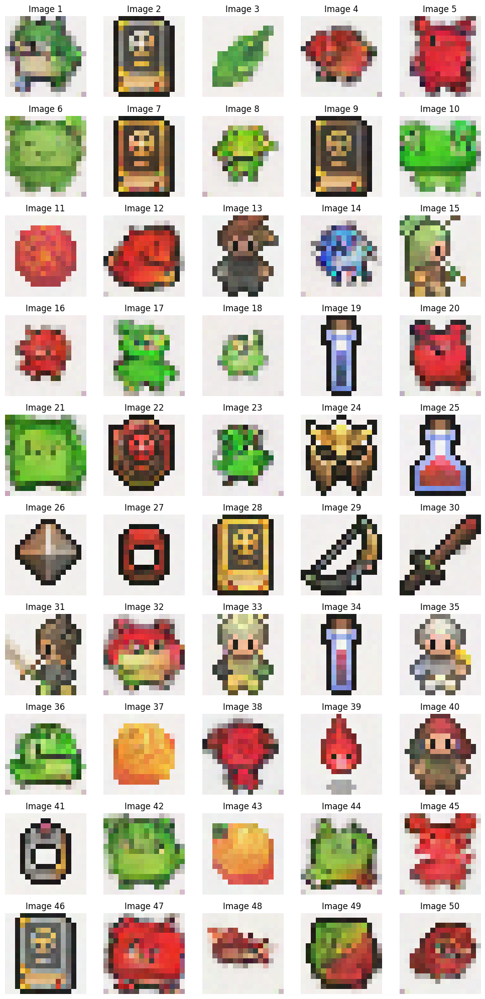

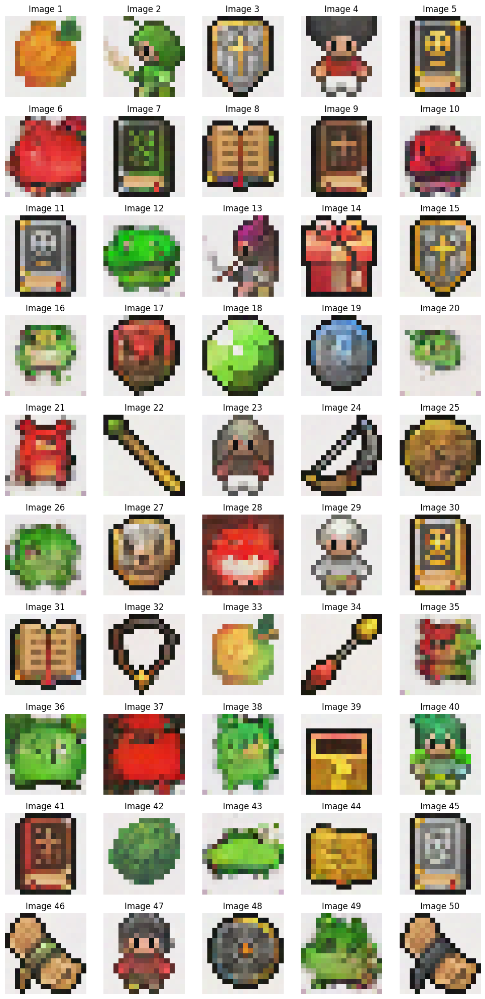

In [37]:
print("\nGenerating final samples using DDPM and DDIM...")

final_samples_ddpm = sample_ddpm(nn_model, n_sample=50, timesteps=timesteps, beta=beta, alpha=alpha, alpha_bar=alpha_bar, device=device, height=height).cpu()
final_samples_ddim = sample_ddim(nn_model, n_sample=50, timesteps=timesteps, beta=beta, alpha=alpha, alpha_bar=alpha_bar, device=device, height=height, eta=  1, n_steps=600).cpu()

plot_sample(final_samples_ddpm, 50, nrows=10)
plt.savefig(os.path.join(final_ddpm_dir, 'ddpm_final_samples.png'))
plt.close()

plot_sample(final_samples_ddim, 50, nrows=10)
plt.savefig(os.path.join(final_ddim_dir, 'ddim_final_samples.png'))
plt.close()



Generating final samples using DDPM and DDIM...


DDPM Sampling: 1000it [00:06, 149.73it/s]


Starting DDIM sampling with 600 steps (step size: 1)


DDIM Sampling: 11it [00:00, 104.52it/s]

Step 600/600: Added noise with sigma_t=0.010969061404466629
Step 599/600: Added noise with sigma_t=0.010959978215396404
Step 598/600: Added noise with sigma_t=0.010950886644423008
Step 597/600: Added noise with sigma_t=0.010941787622869015
Step 596/600: Added noise with sigma_t=0.010932681150734425
Step 595/600: Added noise with sigma_t=0.010923567228019238
Step 594/600: Added noise with sigma_t=0.010914445854723454
Step 593/600: Added noise with sigma_t=0.010905316099524498
Step 592/600: Added noise with sigma_t=0.010896178893744946
Step 591/600: Added noise with sigma_t=0.01088703516870737
Step 590/600: Added noise with sigma_t=0.01087788213044405
Step 589/600: Added noise with sigma_t=0.010868722572922707
Step 588/600: Added noise with sigma_t=0.010859554633498192
Step 587/600: Added noise with sigma_t=0.01085037924349308
Step 586/600: Added noise with sigma_t=0.010841195471584797
Step 585/600: Added noise with sigma_t=0.010832005180418491
Step 584/600: Added noise with sigma_t=0.01

DDIM Sampling: 34it [00:00, 108.34it/s]


Step 578/600: Added noise with sigma_t=0.010767447762191296
Step 577/600: Added noise with sigma_t=0.010758194141089916
Step 576/600: Added noise with sigma_t=0.010748932138085365
Step 575/600: Added noise with sigma_t=0.010739661753177643
Step 574/600: Added noise with sigma_t=0.010730383917689323
Step 573/600: Added noise with sigma_t=0.010721097700297832
Step 572/600: Added noise with sigma_t=0.010711804032325745
Step 571/600: Added noise with sigma_t=0.01070250105112791
Step 570/600: Added noise with sigma_t=0.010693191550672054
Step 569/600: Added noise with sigma_t=0.010683872736990452
Step 568/600: Added noise with sigma_t=0.010674546472728252
Step 567/600: Added noise with sigma_t=0.010665211826562881
Step 566/600: Added noise with sigma_t=0.010655868798494339
Step 565/600: Added noise with sigma_t=0.0106465183198452
Step 564/600: Added noise with sigma_t=0.010637159459292889
Step 563/600: Added noise with sigma_t=0.010627791285514832
Step 562/600: Added noise with sigma_t=0.0

DDIM Sampling: 58it [00:00, 111.48it/s]

Step 555/600: Added noise with sigma_t=0.010552551597356796
Step 554/600: Added noise with sigma_t=0.01054310891777277
Step 553/600: Added noise with sigma_t=0.010533657856285572
Step 552/600: Added noise with sigma_t=0.010524198412895203
Step 551/600: Added noise with sigma_t=0.010514730587601662
Step 550/600: Added noise with sigma_t=0.01050525438040495
Step 549/600: Added noise with sigma_t=0.01049576885998249
Step 548/600: Added noise with sigma_t=0.01048627495765686
Step 547/600: Added noise with sigma_t=0.010476772673428059
Step 546/600: Added noise with sigma_t=0.01046726107597351
Step 545/600: Added noise with sigma_t=0.010457742027938366
Step 544/600: Added noise with sigma_t=0.010448213666677475
Step 543/600: Added noise with sigma_t=0.010438675992190838
Step 542/600: Added noise with sigma_t=0.010429130867123604
Step 541/600: Added noise with sigma_t=0.010419576428830624
Step 540/600: Added noise with sigma_t=0.010410012677311897
Step 539/600: Added noise with sigma_t=0.0104

DDIM Sampling: 82it [00:00, 110.04it/s]

Step 532/600: Added noise with sigma_t=0.010333187878131866
Step 531/600: Added noise with sigma_t=0.010323544964194298
Step 530/600: Added noise with sigma_t=0.010313892737030983
Step 529/600: Added noise with sigma_t=0.010304230265319347
Step 528/600: Added noise with sigma_t=0.010294560343027115
Step 527/600: Added noise with sigma_t=0.010284881107509136
Step 526/600: Added noise with sigma_t=0.010275191627442837
Step 525/600: Added noise with sigma_t=0.01026549469679594
Step 524/600: Added noise with sigma_t=0.010255787521600723
Step 523/600: Added noise with sigma_t=0.01024607103317976
Step 522/600: Added noise with sigma_t=0.010236346162855625
Step 521/600: Added noise with sigma_t=0.01022661104798317
Step 520/600: Added noise with sigma_t=0.010216867551207542
Step 519/600: Added noise with sigma_t=0.010207113809883595
Step 518/600: Added noise with sigma_t=0.010197351686656475
Step 517/600: Added noise with sigma_t=0.01018758025020361
Step 516/600: Added noise with sigma_t=0.010

DDIM Sampling: 106it [00:00, 113.60it/s]

Step 509/600: Added noise with sigma_t=0.010109065100550652
Step 508/600: Added noise with sigma_t=0.010099207982420921
Step 507/600: Added noise with sigma_t=0.01008934061974287
Step 506/600: Added noise with sigma_t=0.010079463943839073
Step 505/600: Added noise with sigma_t=0.01006957795470953
Step 504/600: Added noise with sigma_t=0.010059681721031666
Step 503/600: Added noise with sigma_t=0.010049776174128056
Step 502/600: Added noise with sigma_t=0.010039860382676125
Step 501/600: Added noise with sigma_t=0.010029935277998447
Step 500/600: Added noise with sigma_t=0.01001999992877245
Step 499/600: Added noise with sigma_t=0.010010055266320705
Step 498/600: Added noise with sigma_t=0.01000010035932064
Step 497/600: Added noise with sigma_t=0.00999013613909483
Step 496/600: Added noise with sigma_t=0.009980160742998123
Step 495/600: Added noise with sigma_t=0.00997017603367567
Step 494/600: Added noise with sigma_t=0.009960181079804897
Step 493/600: Added noise with sigma_t=0.00995

DDIM Sampling: 130it [00:01, 110.49it/s]

Step 486/600: Added noise with sigma_t=0.009879859164357185
Step 485/600: Added noise with sigma_t=0.0098697729408741
Step 484/600: Added noise with sigma_t=0.009859676472842693
Step 483/600: Added noise with sigma_t=0.009849569760262966
Step 482/600: Added noise with sigma_t=0.009839451871812344
Step 481/600: Added noise with sigma_t=0.009829324670135975
Step 480/600: Added noise with sigma_t=0.00981918629258871
Step 479/600: Added noise with sigma_t=0.009809037670493126
Step 478/600: Added noise with sigma_t=0.00979887880384922
Step 477/600: Added noise with sigma_t=0.009788709692656994
Step 476/600: Added noise with sigma_t=0.009778528474271297
Step 475/600: Added noise with sigma_t=0.009768337942659855
Step 474/600: Added noise with sigma_t=0.009758136235177517
Step 473/600: Added noise with sigma_t=0.009747924283146858
Step 472/600: Added noise with sigma_t=0.009737701155245304
Step 471/600: Added noise with sigma_t=0.00972746778279543
Step 470/600: Added noise with sigma_t=0.0097

DDIM Sampling: 158it [00:01, 122.83it/s]

Step 462/600: Added noise with sigma_t=0.009634876623749733
Step 461/600: Added noise with sigma_t=0.009624532423913479
Step 460/600: Added noise with sigma_t=0.009614178910851479
Step 459/600: Added noise with sigma_t=0.009603813290596008
Step 458/600: Added noise with sigma_t=0.009593437425792217
Step 457/600: Added noise with sigma_t=0.009583049453794956
Step 456/600: Added noise with sigma_t=0.0095726503059268
Step 455/600: Added noise with sigma_t=0.009562240913510323
Step 454/600: Added noise with sigma_t=0.0095518184825778
Step 453/600: Added noise with sigma_t=0.009541385807096958
Step 452/600: Added noise with sigma_t=0.00953094195574522
Step 451/600: Added noise with sigma_t=0.009520485065877438
Step 450/600: Added noise with sigma_t=0.009510017931461334
Step 449/600: Added noise with sigma_t=0.009499539621174335
Step 448/600: Added noise with sigma_t=0.009489049203693867
Step 447/600: Added noise with sigma_t=0.009478546679019928
Step 446/600: Added noise with sigma_t=0.0094

DDIM Sampling: 186it [00:01, 130.37it/s]

Step 435/600: Added noise with sigma_t=0.00935160182416439
Step 434/600: Added noise with sigma_t=0.009340944699943066
Step 433/600: Added noise with sigma_t=0.009330276399850845
Step 432/600: Added noise with sigma_t=0.00931959506124258
Step 431/600: Added noise with sigma_t=0.00930890254676342
Step 430/600: Added noise with sigma_t=0.009298196993768215
Step 429/600: Added noise with sigma_t=0.00928747933357954
Step 428/600: Added noise with sigma_t=0.00927674863487482
Step 427/600: Added noise with sigma_t=0.009266005828976631
Step 426/600: Added noise with sigma_t=0.009255250915884972
Step 425/600: Added noise with sigma_t=0.009244482964277267
Step 424/600: Added noise with sigma_t=0.009233702905476093
Step 423/600: Added noise with sigma_t=0.009222909808158875
Step 422/600: Added noise with sigma_t=0.009212104603648186
Step 421/600: Added noise with sigma_t=0.009201286360621452
Step 420/600: Added noise with sigma_t=0.009190455079078674
Step 419/600: Added noise with sigma_t=0.0091

DDIM Sampling: 215it [00:01, 133.87it/s]

Step 406/600: Added noise with sigma_t=0.009037460200488567
Step 405/600: Added noise with sigma_t=0.009026432409882545
Step 404/600: Added noise with sigma_t=0.009015391580760479
Step 403/600: Added noise with sigma_t=0.009004336781799793
Step 402/600: Added noise with sigma_t=0.008993268944323063
Step 401/600: Added noise with sigma_t=0.008982187137007713
Step 400/600: Added noise with sigma_t=0.008971091359853745
Step 399/600: Added noise with sigma_t=0.008959982544183731
Step 398/600: Added noise with sigma_t=0.008948859758675098
Step 397/600: Added noise with sigma_t=0.008937723003327847
Step 396/600: Added noise with sigma_t=0.008926572278141975
Step 395/600: Added noise with sigma_t=0.008915407583117485
Step 394/600: Added noise with sigma_t=0.008904228918254375
Step 393/600: Added noise with sigma_t=0.008893036283552647
Step 392/600: Added noise with sigma_t=0.008881828747689724
Step 391/600: Added noise with sigma_t=0.008870608173310757
Step 390/600: Added noise with sigma_t=0

DDIM Sampling: 244it [00:02, 136.57it/s]

Step 378/600: Added noise with sigma_t=0.008723421953618526
Step 377/600: Added noise with sigma_t=0.008711997419595718
Step 376/600: Added noise with sigma_t=0.008700557984411716
Step 375/600: Added noise with sigma_t=0.008689102716743946
Step 374/600: Added noise with sigma_t=0.008677632547914982
Step 373/600: Added noise with sigma_t=0.008666147477924824
Step 372/600: Added noise with sigma_t=0.008654646575450897
Step 371/600: Added noise with sigma_t=0.008643130771815777
Step 370/600: Added noise with sigma_t=0.008631599135696888
Step 369/600: Added noise with sigma_t=0.008620052598416805
Step 368/600: Added noise with sigma_t=0.008608490228652954
Step 367/600: Added noise with sigma_t=0.008596912957727909
Step 366/600: Added noise with sigma_t=0.008585319854319096
Step 365/600: Added noise with sigma_t=0.008573709987103939
Step 364/600: Added noise with sigma_t=0.008562086150050163
Step 363/600: Added noise with sigma_t=0.008550445549190044
Step 362/600: Added noise with sigma_t=0

DDIM Sampling: 272it [00:02, 137.30it/s]

Step 349/600: Added noise with sigma_t=0.008385781198740005
Step 348/600: Added noise with sigma_t=0.008373895660042763
Step 347/600: Added noise with sigma_t=0.008361993357539177
Step 346/600: Added noise with sigma_t=0.008350073359906673
Step 345/600: Added noise with sigma_t=0.008338137529790401
Step 344/600: Added noise with sigma_t=0.008326183073222637
Step 343/600: Added noise with sigma_t=0.008314212784171104
Step 342/600: Added noise with sigma_t=0.008302224799990654
Step 341/600: Added noise with sigma_t=0.008290219120681286
Step 340/600: Added noise with sigma_t=0.008278196677565575
Step 339/600: Added noise with sigma_t=0.008266155607998371
Step 338/600: Added noise with sigma_t=0.008254097774624825
Step 337/600: Added noise with sigma_t=0.00824202224612236
Step 336/600: Added noise with sigma_t=0.008229929022490978
Step 335/600: Added noise with sigma_t=0.008217818103730679
Step 334/600: Added noise with sigma_t=0.008205689489841461
Step 333/600: Added noise with sigma_t=0.

DDIM Sampling: 300it [00:02, 135.74it/s]

Step 321/600: Added noise with sigma_t=0.008046350441873074
Step 320/600: Added noise with sigma_t=0.008033961988985538
Step 319/600: Added noise with sigma_t=0.008021554909646511
Step 318/600: Added noise with sigma_t=0.008009129203855991
Step 317/600: Added noise with sigma_t=0.007996683940291405
Step 316/600: Added noise with sigma_t=0.007984219118952751
Step 315/600: Added noise with sigma_t=0.00797173473984003
Step 314/600: Added noise with sigma_t=0.007959230802953243
Step 313/600: Added noise with sigma_t=0.007946707308292389
Step 312/600: Added noise with sigma_t=0.007934163324534893
Step 311/600: Added noise with sigma_t=0.007921600714325905
Step 310/600: Added noise with sigma_t=0.007909017615020275
Step 309/600: Added noise with sigma_t=0.007896414957940578
Step 308/600: Added noise with sigma_t=0.007883790880441666
Step 307/600: Added noise with sigma_t=0.007871147245168686
Step 306/600: Added noise with sigma_t=0.00785848405212164
Step 305/600: Added noise with sigma_t=0.0

DDIM Sampling: 330it [00:02, 138.57it/s]

Step 293/600: Added noise with sigma_t=0.007691954728215933
Step 292/600: Added noise with sigma_t=0.0076789953745901585
Step 291/600: Added noise with sigma_t=0.007666014134883881
Step 290/600: Added noise with sigma_t=0.007653010543435812
Step 289/600: Added noise with sigma_t=0.00763998506590724
Step 288/600: Added noise with sigma_t=0.007626937236636877
Step 287/600: Added noise with sigma_t=0.0076138670556247234
Step 286/600: Added noise with sigma_t=0.007600774522870779
Step 285/600: Added noise with sigma_t=0.007587659638375044
Step 284/600: Added noise with sigma_t=0.007574521005153656
Step 283/600: Added noise with sigma_t=0.007561360951513052
Step 282/600: Added noise with sigma_t=0.007548177149146795
Step 281/600: Added noise with sigma_t=0.0075349705293774605
Step 280/600: Added noise with sigma_t=0.00752174062654376
Step 279/600: Added noise with sigma_t=0.007508487440645695
Step 278/600: Added noise with sigma_t=0.0074952105060219765
Step 277/600: Added noise with sigma_t

DDIM Sampling: 359it [00:02, 138.51it/s]

Step 264/600: Added noise with sigma_t=0.0073068044148385525
Step 263/600: Added noise with sigma_t=0.007293161004781723
Step 262/600: Added noise with sigma_t=0.007279491517692804
Step 261/600: Added noise with sigma_t=0.007265795953571796
Step 260/600: Added noise with sigma_t=0.007252074778079987
Step 259/600: Added noise with sigma_t=0.007238328456878662
Step 258/600: Added noise with sigma_t=0.007224555592983961
Step 257/600: Added noise with sigma_t=0.007210755255073309
Step 256/600: Added noise with sigma_t=0.0071969302371144295
Step 255/600: Added noise with sigma_t=0.0071830772794783115
Step 254/600: Added noise with sigma_t=0.007169197779148817
Step 253/600: Added noise with sigma_t=0.007155291736125946
Step 252/600: Added noise with sigma_t=0.007141358684748411
Step 251/600: Added noise with sigma_t=0.007127397693693638
Step 250/600: Added noise with sigma_t=0.007113409694284201
Step 249/600: Added noise with sigma_t=0.0070993946865201
Step 248/600: Added noise with sigma_t=

DDIM Sampling: 388it [00:03, 140.30it/s]

Step 236/600: Added noise with sigma_t=0.006914609111845493
Step 235/600: Added noise with sigma_t=0.0069001889787614346
Step 234/600: Added noise with sigma_t=0.00688574044033885
Step 233/600: Added noise with sigma_t=0.0068712602369487286
Step 232/600: Added noise with sigma_t=0.006856750231236219
Step 231/600: Added noise with sigma_t=0.006842208560556173
Step 230/600: Added noise with sigma_t=0.006827636156231165
Step 229/600: Added noise with sigma_t=0.006813033018261194
Step 228/600: Added noise with sigma_t=0.006798398680984974
Step 227/600: Added noise with sigma_t=0.006783732213079929
Step 226/600: Added noise with sigma_t=0.006769034545868635
Step 225/600: Added noise with sigma_t=0.006754303816705942
Step 224/600: Added noise with sigma_t=0.0067395418882369995
Step 223/600: Added noise with sigma_t=0.006724747363477945
Step 222/600: Added noise with sigma_t=0.006709919776767492
Step 221/600: Added noise with sigma_t=0.006695059593766928
Step 220/600: Added noise with sigma_t

DDIM Sampling: 418it [00:03, 139.56it/s]

Step 207/600: Added noise with sigma_t=0.006483443081378937
Step 206/600: Added noise with sigma_t=0.0064680627547204494
Step 205/600: Added noise with sigma_t=0.006452646106481552
Step 204/600: Added noise with sigma_t=0.00643719220533967
Step 203/600: Added noise with sigma_t=0.006421700119972229
Step 202/600: Added noise with sigma_t=0.0064061726443469524
Step 201/600: Added noise with sigma_t=0.006390606053173542
Step 200/600: Added noise with sigma_t=0.006375001277774572
Step 199/600: Added noise with sigma_t=0.006359358783811331
Step 198/600: Added noise with sigma_t=0.006343677639961243
Step 197/600: Added noise with sigma_t=0.006327956914901733
Step 196/600: Added noise with sigma_t=0.006312198471277952
Step 195/600: Added noise with sigma_t=0.006296399515122175
Step 194/600: Added noise with sigma_t=0.006280560977756977
Step 193/600: Added noise with sigma_t=0.0062646823935210705
Step 192/600: Added noise with sigma_t=0.006248763762414455
Step 191/600: Added noise with sigma_t

DDIM Sampling: 446it [00:03, 135.96it/s]

Step 179/600: Added noise with sigma_t=0.006038001272827387
Step 178/600: Added noise with sigma_t=0.006021483335644007
Step 177/600: Added noise with sigma_t=0.0060049197636544704
Step 176/600: Added noise with sigma_t=0.005988310556858778
Step 175/600: Added noise with sigma_t=0.005971654783934355
Step 174/600: Added noise with sigma_t=0.005954952910542488
Step 173/600: Added noise with sigma_t=0.005938203539699316
Step 172/600: Added noise with sigma_t=0.005921407137066126
Step 171/600: Added noise with sigma_t=0.00590456323698163
Step 170/600: Added noise with sigma_t=0.0058876704424619675
Step 169/600: Added noise with sigma_t=0.005870729684829712
Step 168/600: Added noise with sigma_t=0.005853740032762289
Step 167/600: Added noise with sigma_t=0.005836700089275837
Step 166/600: Added noise with sigma_t=0.00581961078569293
Step 165/600: Added noise with sigma_t=0.005802470725029707
Step 164/600: Added noise with sigma_t=0.0057852803729474545
Step 163/600: Added noise with sigma_t=

DDIM Sampling: 476it [00:03, 140.04it/s]

Step 152/600: Added noise with sigma_t=0.005574861541390419
Step 151/600: Added noise with sigma_t=0.00555696664378047
Step 150/600: Added noise with sigma_t=0.005539014469832182
Step 149/600: Added noise with sigma_t=0.0055210040882229805
Step 148/600: Added noise with sigma_t=0.005502934101969004
Step 147/600: Added noise with sigma_t=0.005484804976731539
Step 146/600: Added noise with sigma_t=0.005466615315526724
Step 145/600: Added noise with sigma_t=0.005448365118354559
Step 144/600: Added noise with sigma_t=0.005430053919553757
Step 143/600: Added noise with sigma_t=0.005411680322140455
Step 142/600: Added noise with sigma_t=0.005393244791775942
Step 141/600: Added noise with sigma_t=0.005374745931476355
Step 140/600: Added noise with sigma_t=0.005356182344257832
Step 139/600: Added noise with sigma_t=0.00533755449578166
Step 138/600: Added noise with sigma_t=0.005318861920386553
Step 137/600: Added noise with sigma_t=0.005300103221088648
Step 136/600: Added noise with sigma_t=0.

DDIM Sampling: 491it [00:03, 137.51it/s]

Step 123/600: Added noise with sigma_t=0.0050301398150622845
Step 122/600: Added noise with sigma_t=0.005010299850255251
Step 121/600: Added noise with sigma_t=0.004990381188690662
Step 120/600: Added noise with sigma_t=0.004970382899045944
Step 119/600: Added noise with sigma_t=0.0049503035843372345
Step 118/600: Added noise with sigma_t=0.004930142778903246
Step 117/600: Added noise with sigma_t=0.004909899085760117
Step 116/600: Added noise with sigma_t=0.004889571573585272
Step 115/600: Added noise with sigma_t=0.00486915884539485
Step 114/600: Added noise with sigma_t=0.00484866090118885
Step 113/600: Added noise with sigma_t=0.004828075412660837
Step 112/600: Added noise with sigma_t=0.004807401914149523
Step 111/600: Added noise with sigma_t=0.004786639008671045
Step 110/600: Added noise with sigma_t=0.00476578576490283
Step 109/600: Added noise with sigma_t=0.004744840785861015
Step 108/600: Added noise with sigma_t=0.004723803140223026
Step 107/600: Added noise with sigma_t=0.

DDIM Sampling: 521it [00:04, 139.49it/s]

Step 95/600: Added noise with sigma_t=0.004441252909600735
Step 94/600: Added noise with sigma_t=0.0044187698513269424
Step 93/600: Added noise with sigma_t=0.004396171774715185
Step 92/600: Added noise with sigma_t=0.004373457282781601
Step 91/600: Added noise with sigma_t=0.004350624047219753
Step 90/600: Added noise with sigma_t=0.004327670205384493
Step 89/600: Added noise with sigma_t=0.004304594360291958
Step 88/600: Added noise with sigma_t=0.004281393717974424
Step 87/600: Added noise with sigma_t=0.004258066415786743
Step 86/600: Added noise with sigma_t=0.00423461152240634
Step 85/600: Added noise with sigma_t=0.004211025312542915
Step 84/600: Added noise with sigma_t=0.004187306389212608
Step 83/600: Added noise with sigma_t=0.004163452424108982
Step 82/600: Added noise with sigma_t=0.004139460623264313
Step 81/600: Added noise with sigma_t=0.004115329589694738
Step 80/600: Added noise with sigma_t=0.0040910555981099606
Step 79/600: Added noise with sigma_t=0.004066637251526

DDIM Sampling: 550it [00:04, 139.09it/s]

Step 67/600: Added noise with sigma_t=0.0037612696178257465
Step 66/600: Added noise with sigma_t=0.0037346952594816685
Step 65/600: Added noise with sigma_t=0.0037079304456710815
Step 64/600: Added noise with sigma_t=0.0036809712182730436
Step 63/600: Added noise with sigma_t=0.0036538131535053253
Step 62/600: Added noise with sigma_t=0.0036264515947550535
Step 61/600: Added noise with sigma_t=0.003598881885409355
Step 60/600: Added noise with sigma_t=0.0035710998345166445
Step 59/600: Added noise with sigma_t=0.0035430993884801865
Step 58/600: Added noise with sigma_t=0.0035148763563483953
Step 57/600: Added noise with sigma_t=0.0034864244516938925
Step 56/600: Added noise with sigma_t=0.0034577385522425175
Step 55/600: Added noise with sigma_t=0.003428812837228179
Step 54/600: Added noise with sigma_t=0.0033996407873928547
Step 53/600: Added noise with sigma_t=0.0033702165819704533
Step 52/600: Added noise with sigma_t=0.0033405327703803778
Step 51/600: Added noise with sigma_t=0.00

DDIM Sampling: 579it [00:04, 137.47it/s]

Step 38/600: Added noise with sigma_t=0.0028931591659784317
Step 37/600: Added noise with sigma_t=0.002858526073396206
Step 36/600: Added noise with sigma_t=0.002823468064889312
Step 35/600: Added noise with sigma_t=0.002787969307973981
Step 34/600: Added noise with sigma_t=0.002752012573182583
Step 33/600: Added noise with sigma_t=0.0027155799325555563
Step 32/600: Added noise with sigma_t=0.0026786518283188343
Step 31/600: Added noise with sigma_t=0.002641207305714488
Step 30/600: Added noise with sigma_t=0.0026032242458313704
Step 29/600: Added noise with sigma_t=0.0025646788999438286
Step 28/600: Added noise with sigma_t=0.002525545423850417
Step 27/600: Added noise with sigma_t=0.002485795645043254
Step 26/600: Added noise with sigma_t=0.002445399761199951
Step 25/600: Added noise with sigma_t=0.002404325408861041
Step 24/600: Added noise with sigma_t=0.0023625369649380445
Step 23/600: Added noise with sigma_t=0.0023199962452054024
Step 22/600: Added noise with sigma_t=0.002276660

DDIM Sampling: 600it [00:04, 130.71it/s]


Step 10/600: Added noise with sigma_t=0.0016711651114746928
Step 9/600: Added noise with sigma_t=0.0016104638343676925
Step 8/600: Added noise with sigma_t=0.0015473830280825496
Step 7/600: Added noise with sigma_t=0.0014816190814599395
Step 6/600: Added noise with sigma_t=0.0014127972535789013
Step 5/600: Added noise with sigma_t=0.0013404465280473232
Step 4/600: Added noise with sigma_t=0.001263961079530418
Step 3/600: Added noise with sigma_t=0.0011825389228761196
Step 2/600: Added noise with sigma_t=0.0010950795840471983
Step 1/600: Deterministic step
DDIM sampling completed.


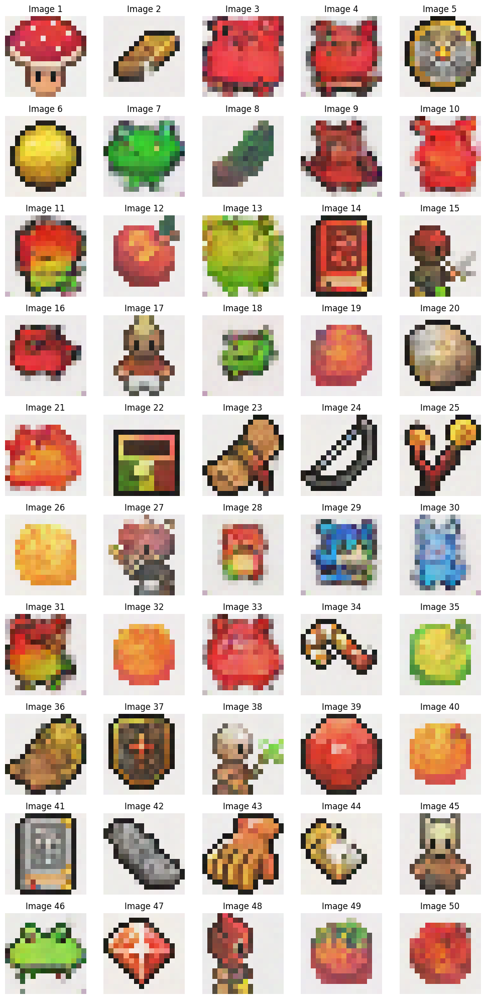

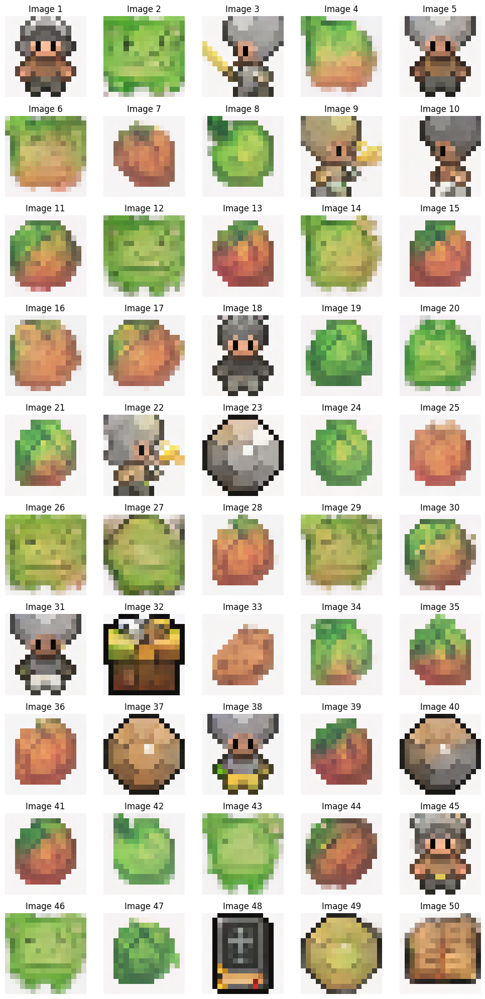

In [38]:
print("\nGenerating final samples using DDPM and DDIM...")

final_samples_ddpm = sample_ddpm(nn_model, n_sample=50, timesteps=timesteps, beta=beta, alpha=alpha, alpha_bar=alpha_bar, device=device, height=height).cpu()
final_samples_ddim = sample_ddim(nn_model, n_sample=50, timesteps=timesteps, beta=beta, alpha=alpha, alpha_bar=alpha_bar, device=device, height=height, eta=  0.1, n_steps=600).cpu()

plot_sample(final_samples_ddpm, 50, nrows=10)
plt.savefig(os.path.join(final_ddpm_dir, 'ddpm_final_samples.png'))
plt.close()

plot_sample(final_samples_ddim, 50, nrows=10)
plt.savefig(os.path.join(final_ddim_dir, 'ddim_final_samples.png'))
plt.close()



Timing the generation of samples using DDPM and DDIM...


DDPM Sampling: 1000it [00:06, 150.13it/s]


Time taken for DDPM sampling: 6.68 seconds
Starting DDIM sampling with 400 steps (step size: 2)


DDIM Sampling: 11it [00:00, 108.64it/s]

Step 400/400: Deterministic step
Step 399/400: Deterministic step
Step 398/400: Deterministic step
Step 397/400: Deterministic step
Step 396/400: Deterministic step
Step 395/400: Deterministic step
Step 394/400: Deterministic step
Step 393/400: Deterministic step
Step 392/400: Deterministic step
Step 391/400: Deterministic step
Step 390/400: Deterministic step
Step 389/400: Deterministic step
Step 388/400: Deterministic step
Step 387/400: Deterministic step
Step 386/400: Deterministic step
Step 385/400: Deterministic step
Step 384/400: Deterministic step
Step 383/400: Deterministic step
Step 382/400: Deterministic step
Step 381/400: Deterministic step
Step 380/400: Deterministic step
Step 379/400: Deterministic step


DDIM Sampling: 23it [00:00, 113.30it/s]

Step 378/400: Deterministic step


DDIM Sampling: 36it [00:00, 118.72it/s]

Step 377/400: Deterministic step
Step 376/400: Deterministic step
Step 375/400: Deterministic step
Step 374/400: Deterministic step
Step 373/400: Deterministic step
Step 372/400: Deterministic step
Step 371/400: Deterministic step
Step 370/400: Deterministic step
Step 369/400: Deterministic step
Step 368/400: Deterministic step
Step 367/400: Deterministic step
Step 366/400: Deterministic step
Step 365/400: Deterministic step
Step 364/400: Deterministic step
Step 363/400: Deterministic step
Step 362/400: Deterministic step
Step 361/400: Deterministic step
Step 360/400: Deterministic step
Step 359/400: Deterministic step
Step 358/400: Deterministic step
Step 357/400: Deterministic step
Step 356/400: Deterministic step
Step 355/400: Deterministic step
Step 354/400: Deterministic step
Step 353/400: Deterministic step


DDIM Sampling: 49it [00:00, 121.67it/s]

Step 352/400: Deterministic step


DDIM Sampling: 62it [00:00, 123.31it/s]

Step 351/400: Deterministic step
Step 350/400: Deterministic step
Step 349/400: Deterministic step
Step 348/400: Deterministic step
Step 347/400: Deterministic step
Step 346/400: Deterministic step
Step 345/400: Deterministic step
Step 344/400: Deterministic step
Step 343/400: Deterministic step
Step 342/400: Deterministic step
Step 341/400: Deterministic step
Step 340/400: Deterministic step
Step 339/400: Deterministic step
Step 338/400: Deterministic step
Step 337/400: Deterministic step
Step 336/400: Deterministic step
Step 335/400: Deterministic step
Step 334/400: Deterministic step
Step 333/400: Deterministic step
Step 332/400: Deterministic step
Step 331/400: Deterministic step
Step 330/400: Deterministic step
Step 329/400: Deterministic step
Step 328/400: Deterministic step
Step 327/400: Deterministic step
Step 326/400: Deterministic step

DDIM Sampling: 75it [00:00, 125.17it/s]

DDIM Sampling: 88it [00:00, 124.01it/s]

Step 325/400: Deterministic step
Step 324/400: Deterministic step
Step 323/400: Deterministic step
Step 322/400: Deterministic step
Step 321/400: Deterministic step
Step 320/400: Deterministic step
Step 319/400: Deterministic step
Step 318/400: Deterministic step
Step 317/400: Deterministic step
Step 316/400: Deterministic step
Step 315/400: Deterministic step
Step 314/400: Deterministic step
Step 313/400: Deterministic step
Step 312/400: Deterministic step
Step 311/400: Deterministic step
Step 310/400: Deterministic step
Step 309/400: Deterministic step
Step 308/400: Deterministic step
Step 307/400: Deterministic step
Step 306/400: Deterministic step
Step 305/400: Deterministic step
Step 304/400: Deterministic step
Step 303/400: Deterministic step
Step 302/400: Deterministic step
Step 301/400: Deterministic step


DDIM Sampling: 115it [00:00, 126.09it/s]

Step 300/400: Deterministic step
Step 299/400: Deterministic step
Step 298/400: Deterministic step
Step 297/400: Deterministic step
Step 296/400: Deterministic step
Step 295/400: Deterministic step
Step 294/400: Deterministic step
Step 293/400: Deterministic step
Step 292/400: Deterministic step
Step 291/400: Deterministic step
Step 290/400: Deterministic step
Step 289/400: Deterministic step
Step 288/400: Deterministic step
Step 287/400: Deterministic step
Step 286/400: Deterministic step
Step 285/400: Deterministic step
Step 284/400: Deterministic step
Step 283/400: Deterministic step
Step 282/400: Deterministic step
Step 281/400: Deterministic step
Step 280/400: Deterministic step
Step 279/400: Deterministic step
Step 278/400: Deterministic step
Step 277/400: Deterministic step
Step 276/400: Deterministic step
Step 275/400: Deterministic step
Step 274/400: Deterministic step


DDIM Sampling: 141it [00:01, 126.36it/s]

Step 273/400: Deterministic step
Step 272/400: Deterministic step
Step 271/400: Deterministic step
Step 270/400: Deterministic step
Step 269/400: Deterministic step
Step 268/400: Deterministic step
Step 267/400: Deterministic step
Step 266/400: Deterministic step
Step 265/400: Deterministic step
Step 264/400: Deterministic step
Step 263/400: Deterministic step
Step 262/400: Deterministic step
Step 261/400: Deterministic step
Step 260/400: Deterministic step
Step 259/400: Deterministic step
Step 258/400: Deterministic step
Step 257/400: Deterministic step
Step 256/400: Deterministic step
Step 255/400: Deterministic step
Step 254/400: Deterministic step
Step 253/400: Deterministic step
Step 252/400: Deterministic step
Step 251/400: Deterministic step
Step 250/400: Deterministic step


DDIM Sampling: 167it [00:01, 119.32it/s]

Step 249/400: Deterministic step
Step 248/400: Deterministic step
Step 247/400: Deterministic step
Step 246/400: Deterministic step
Step 245/400: Deterministic step
Step 244/400: Deterministic step
Step 243/400: Deterministic step
Step 242/400: Deterministic step
Step 241/400: Deterministic step
Step 240/400: Deterministic step
Step 239/400: Deterministic step
Step 238/400: Deterministic step
Step 237/400: Deterministic step
Step 236/400: Deterministic step
Step 235/400: Deterministic step
Step 234/400: Deterministic step
Step 233/400: Deterministic step
Step 232/400: Deterministic step
Step 231/400: Deterministic step
Step 230/400: Deterministic step
Step 229/400: Deterministic step
Step 228/400: Deterministic step
Step 227/400: Deterministic step


DDIM Sampling: 191it [00:01, 116.22it/s]

Step 226/400: Deterministic step
Step 225/400: Deterministic step
Step 224/400: Deterministic step
Step 223/400: Deterministic step
Step 222/400: Deterministic step
Step 221/400: Deterministic step
Step 220/400: Deterministic step
Step 219/400: Deterministic step
Step 218/400: Deterministic step
Step 217/400: Deterministic step
Step 216/400: Deterministic step
Step 215/400: Deterministic step
Step 214/400: Deterministic step
Step 213/400: Deterministic step
Step 212/400: Deterministic step
Step 211/400: Deterministic step
Step 210/400: Deterministic step
Step 209/400: Deterministic step
Step 208/400: Deterministic step
Step 207/400: Deterministic step
Step 206/400: Deterministic step
Step 205/400: Deterministic step
Step 204/400: Deterministic step


DDIM Sampling: 215it [00:01, 107.81it/s]

Step 203/400: Deterministic step
Step 202/400: Deterministic step
Step 201/400: Deterministic step
Step 200/400: Deterministic step
Step 199/400: Deterministic step
Step 198/400: Deterministic step
Step 197/400: Deterministic step
Step 196/400: Deterministic step
Step 195/400: Deterministic step
Step 194/400: Deterministic step
Step 193/400: Deterministic step
Step 192/400: Deterministic step
Step 191/400: Deterministic step
Step 190/400: Deterministic step
Step 189/400: Deterministic step
Step 188/400: Deterministic step
Step 187/400: Deterministic step
Step 186/400: Deterministic step
Step 185/400: Deterministic step
Step 184/400: Deterministic step
Step 183/400: Deterministic step


DDIM Sampling: 240it [00:02, 113.95it/s]

Step 182/400: Deterministic step
Step 181/400: Deterministic step
Step 180/400: Deterministic step
Step 179/400: Deterministic step
Step 178/400: Deterministic step
Step 177/400: Deterministic step
Step 176/400: Deterministic step
Step 175/400: Deterministic step
Step 174/400: Deterministic step
Step 173/400: Deterministic step
Step 172/400: Deterministic step
Step 171/400: Deterministic step
Step 170/400: Deterministic step
Step 169/400: Deterministic step
Step 168/400: Deterministic step
Step 167/400: Deterministic step
Step 166/400: Deterministic step
Step 165/400: Deterministic step
Step 164/400: Deterministic step
Step 163/400: Deterministic step
Step 162/400: Deterministic step
Step 161/400: Deterministic step
Step 160/400: Deterministic step
Step 159/400: Deterministic step
Step 158/400: Deterministic step


DDIM Sampling: 264it [00:02, 109.38it/s]

Step 157/400: Deterministic step
Step 156/400: Deterministic step
Step 155/400: Deterministic step
Step 154/400: Deterministic step
Step 153/400: Deterministic step
Step 152/400: Deterministic step
Step 151/400: Deterministic step
Step 150/400: Deterministic step
Step 149/400: Deterministic step
Step 148/400: Deterministic step
Step 147/400: Deterministic step
Step 146/400: Deterministic step
Step 145/400: Deterministic step
Step 144/400: Deterministic step
Step 143/400: Deterministic step
Step 142/400: Deterministic step
Step 141/400: Deterministic step
Step 140/400: Deterministic step
Step 139/400: Deterministic step
Step 138/400: Deterministic step
Step 137/400: Deterministic step


DDIM Sampling: 292it [00:02, 122.72it/s]

Step 136/400: Deterministic step
Step 135/400: Deterministic step
Step 134/400: Deterministic step
Step 133/400: Deterministic step
Step 132/400: Deterministic step
Step 131/400: Deterministic step
Step 130/400: Deterministic step
Step 129/400: Deterministic step
Step 128/400: Deterministic step
Step 127/400: Deterministic step
Step 126/400: Deterministic step
Step 125/400: Deterministic step
Step 124/400: Deterministic step
Step 123/400: Deterministic step
Step 122/400: Deterministic step
Step 121/400: Deterministic step
Step 120/400: Deterministic step
Step 119/400: Deterministic step
Step 118/400: Deterministic step
Step 117/400: Deterministic step
Step 116/400: Deterministic step
Step 115/400: Deterministic step
Step 114/400: Deterministic step
Step 113/400: Deterministic step
Step 112/400: Deterministic step
Step 111/400: Deterministic step
Step 110/400: Deterministic step
Step 109/400: Deterministic step


DDIM Sampling: 321it [00:02, 131.94it/s]

Step 108/400: Deterministic step
Step 107/400: Deterministic step
Step 106/400: Deterministic step
Step 105/400: Deterministic step
Step 104/400: Deterministic step
Step 103/400: Deterministic step
Step 102/400: Deterministic step
Step 101/400: Deterministic step
Step 100/400: Deterministic step
Step 99/400: Deterministic step
Step 98/400: Deterministic step
Step 97/400: Deterministic step
Step 96/400: Deterministic step
Step 95/400: Deterministic step
Step 94/400: Deterministic step
Step 93/400: Deterministic step
Step 92/400: Deterministic step
Step 91/400: Deterministic step
Step 90/400: Deterministic step
Step 89/400: Deterministic step
Step 88/400: Deterministic step
Step 87/400: Deterministic step
Step 86/400: Deterministic step
Step 85/400: Deterministic step
Step 84/400: Deterministic step
Step 83/400: Deterministic step
Step 82/400: Deterministic step
Step 81/400: Deterministic step
Step 80/400: Deterministic step
Step 79/400: Deterministic step


DDIM Sampling: 350it [00:02, 134.45it/s]

Step 78/400: Deterministic step
Step 77/400: Deterministic step
Step 76/400: Deterministic step
Step 75/400: Deterministic step
Step 74/400: Deterministic step
Step 73/400: Deterministic step
Step 72/400: Deterministic step
Step 71/400: Deterministic step
Step 70/400: Deterministic step
Step 69/400: Deterministic step
Step 68/400: Deterministic step
Step 67/400: Deterministic step
Step 66/400: Deterministic step
Step 65/400: Deterministic step
Step 64/400: Deterministic step
Step 63/400: Deterministic step
Step 62/400: Deterministic step
Step 61/400: Deterministic step
Step 60/400: Deterministic step
Step 59/400: Deterministic step
Step 58/400: Deterministic step
Step 57/400: Deterministic step
Step 56/400: Deterministic step
Step 55/400: Deterministic step
Step 54/400: Deterministic step
Step 53/400: Deterministic step
Step 52/400: Deterministic step
Step 51/400: Deterministic step


DDIM Sampling: 365it [00:02, 137.02it/s]

Step 50/400: Deterministic step
Step 49/400: Deterministic step
Step 48/400: Deterministic step
Step 47/400: Deterministic step
Step 46/400: Deterministic step
Step 45/400: Deterministic step
Step 44/400: Deterministic step
Step 43/400: Deterministic step
Step 42/400: Deterministic step
Step 41/400: Deterministic step
Step 40/400: Deterministic step
Step 39/400: Deterministic step
Step 38/400: Deterministic step
Step 37/400: Deterministic step
Step 36/400: Deterministic step
Step 35/400: Deterministic step
Step 34/400: Deterministic step
Step 33/400: Deterministic step
Step 32/400: Deterministic step
Step 31/400: Deterministic step
Step 30/400: Deterministic step
Step 29/400: Deterministic step
Step 28/400: Deterministic step
Step 27/400: Deterministic step
Step 26/400: Deterministic step
Step 25/400: Deterministic step
Step 24/400: Deterministic step
Step 23/400: Deterministic step
Step 22/400: Deterministic step


DDIM Sampling: 400it [00:03, 123.44it/s]

Step 21/400: Deterministic step
Step 20/400: Deterministic step
Step 19/400: Deterministic step
Step 18/400: Deterministic step
Step 17/400: Deterministic step
Step 16/400: Deterministic step
Step 15/400: Deterministic step
Step 14/400: Deterministic step
Step 13/400: Deterministic step
Step 12/400: Deterministic step
Step 11/400: Deterministic step
Step 10/400: Deterministic step
Step 9/400: Deterministic step
Step 8/400: Deterministic step
Step 7/400: Deterministic step
Step 6/400: Deterministic step
Step 5/400: Deterministic step
Step 4/400: Deterministic step
Step 3/400: Deterministic step
Step 2/400: Deterministic step
Step 1/400: Deterministic step
DDIM sampling completed.
Time taken for DDIM sampling: 3.25 seconds

Generating and saving DDPM samples...


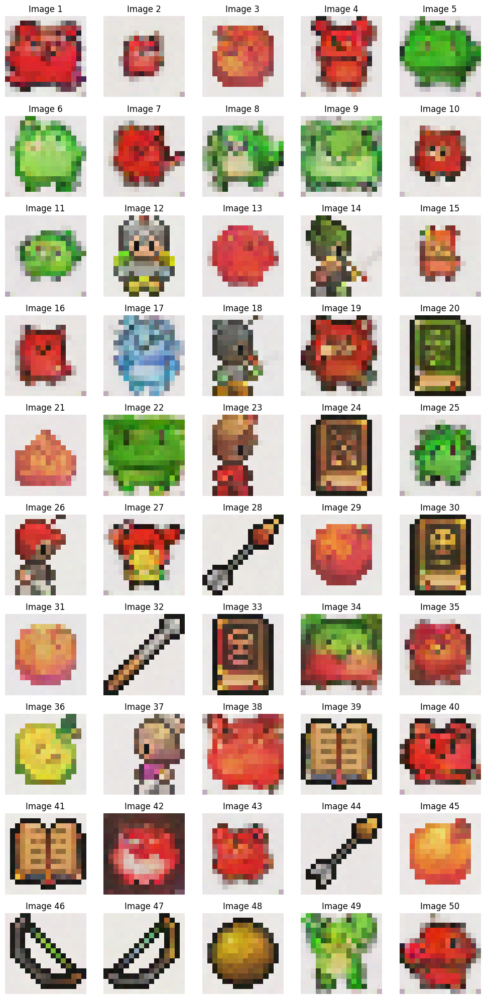


Generating and saving DDIM samples...


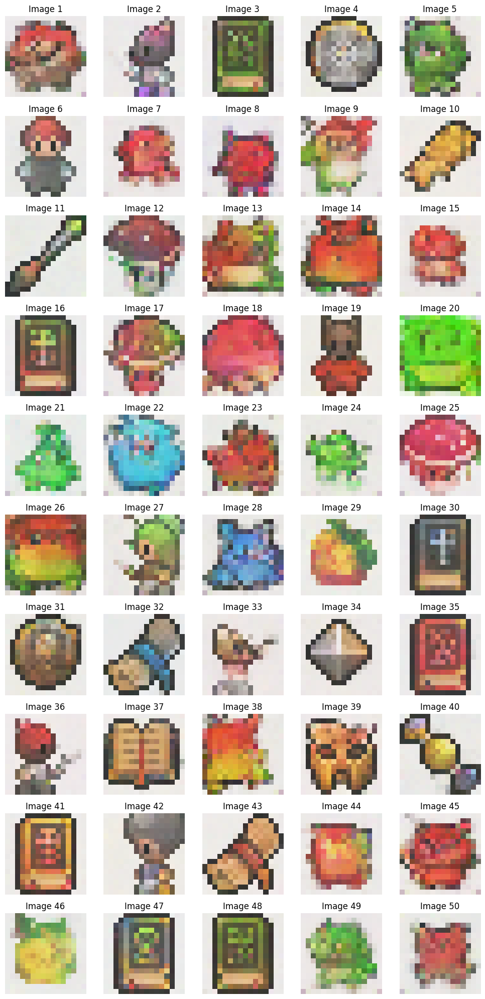


Summary:
DDPM Sampling Time: 6.68 seconds
DDIM Sampling Time: 3.25 seconds


In [39]:
import time
import os
import matplotlib.pyplot as plt

final_ddpm_dir = "results/ddpm"
final_ddim_dir = "results/ddim"
os.makedirs(final_ddpm_dir, exist_ok=True)
os.makedirs(final_ddim_dir, exist_ok=True)

print("\nTiming the generation of samples using DDPM and DDIM...")

start_ddpm = time.time()
final_samples_ddpm = sample_ddpm(
    nn_model, n_sample=50, timesteps=timesteps, beta=beta, alpha=alpha, alpha_bar=alpha_bar, device=device, height=height
).cpu()
end_ddpm = time.time()
ddpm_time = end_ddpm - start_ddpm
print(f"Time taken for DDPM sampling: {ddpm_time:.2f} seconds")

start_ddim = time.time()
final_samples_ddim = sample_ddim(
    nn_model, n_sample=50, timesteps=timesteps, beta=beta, alpha=alpha, alpha_bar=alpha_bar, device=device, height=height, eta=0.0, n_steps=400
).cpu()
end_ddim = time.time()
ddim_time = end_ddim - start_ddim
print(f"Time taken for DDIM sampling: {ddim_time:.2f} seconds")

print("\nGenerating and saving DDPM samples...")
plot_sample(final_samples_ddpm, 50, nrows=10)
plt.savefig(os.path.join(final_ddpm_dir, 'ddpm_final_samples.png'))
plt.close()

print("\nGenerating and saving DDIM samples...")
plot_sample(final_samples_ddim, 50, nrows=10)
plt.savefig(os.path.join(final_ddim_dir, 'ddim_final_samples.png'))
plt.close()

print("\nSummary:")
print(f"DDPM Sampling Time: {ddpm_time:.2f} seconds")
print(f"DDIM Sampling Time: {ddim_time:.2f} seconds")



Timing the generation of samples using DDPM and DDIM...


DDPM Sampling: 1000it [00:07, 141.32it/s]


Time taken for DDPM sampling: 7.09 seconds
Starting DDIM sampling with 600 steps (step size: 1)


DDIM Sampling: 15it [00:00, 144.63it/s]

Step 600/600: Added noise with sigma_t=0.10969061404466629
Step 599/600: Added noise with sigma_t=0.10959978401660919
Step 598/600: Added noise with sigma_t=0.10950886458158493
Step 597/600: Added noise with sigma_t=0.1094178780913353
Step 596/600: Added noise with sigma_t=0.1093268096446991
Step 595/600: Added noise with sigma_t=0.10923567414283752
Step 594/600: Added noise with sigma_t=0.10914445668458939
Step 593/600: Added noise with sigma_t=0.10905315726995468
Step 592/600: Added noise with sigma_t=0.1089617908000946
Step 591/600: Added noise with sigma_t=0.10887034982442856
Step 590/600: Added noise with sigma_t=0.10877881944179535
Step 589/600: Added noise with sigma_t=0.10868722200393677
Step 588/600: Added noise with sigma_t=0.10859554260969162
Step 587/600: Added noise with sigma_t=0.1085037887096405
Step 586/600: Added noise with sigma_t=0.10841195285320282
Step 585/600: Added noise with sigma_t=0.10832004994153976
Step 584/600: Added noise with sigma_t=0.10822805762290955
S

DDIM Sampling: 44it [00:00, 136.29it/s]

Step 572/600: Added noise with sigma_t=0.10711804032325745
Step 571/600: Added noise with sigma_t=0.10702501237392426
Step 570/600: Added noise with sigma_t=0.1069319099187851
Step 569/600: Added noise with sigma_t=0.10683872550725937
Step 568/600: Added noise with sigma_t=0.10674546658992767
Step 567/600: Added noise with sigma_t=0.10665211826562881
Step 566/600: Added noise with sigma_t=0.10655868798494339
Step 565/600: Added noise with sigma_t=0.106465183198452
Step 564/600: Added noise with sigma_t=0.10637158900499344
Step 563/600: Added noise with sigma_t=0.10627791285514832
Step 562/600: Added noise with sigma_t=0.10618415474891663
Step 561/600: Added noise with sigma_t=0.10609031468629837
Step 560/600: Added noise with sigma_t=0.10599638521671295
Step 559/600: Added noise with sigma_t=0.10590238124132156
Step 558/600: Added noise with sigma_t=0.10580829530954361
Step 557/600: Added noise with sigma_t=0.10571411997079849
Step 556/600: Added noise with sigma_t=0.10561986267566681


DDIM Sampling: 72it [00:00, 128.28it/s]

Step 544/600: Added noise with sigma_t=0.10448213666677475
Step 543/600: Added noise with sigma_t=0.10438676178455353
Step 542/600: Added noise with sigma_t=0.10429130494594574
Step 541/600: Added noise with sigma_t=0.10419575870037079
Step 540/600: Added noise with sigma_t=0.10410012304782867
Step 539/600: Added noise with sigma_t=0.1040044054389
Step 538/600: Added noise with sigma_t=0.10390859842300415
Step 537/600: Added noise with sigma_t=0.10381270200014114
Step 536/600: Added noise with sigma_t=0.10371671617031097
Step 535/600: Added noise with sigma_t=0.10362064093351364
Step 534/600: Added noise with sigma_t=0.10352447628974915
Step 533/600: Added noise with sigma_t=0.10342822223901749
Step 532/600: Added noise with sigma_t=0.10333187878131866
Step 531/600: Added noise with sigma_t=0.10323544591665268
Step 530/600: Added noise with sigma_t=0.10313892364501953
Step 529/600: Added noise with sigma_t=0.10304230451583862
Step 528/600: Added noise with sigma_t=0.10294560343027115
S

DDIM Sampling: 100it [00:00, 133.52it/s]

Step 519/600: Added noise with sigma_t=0.1020711362361908
Step 518/600: Added noise with sigma_t=0.1019735187292099
Step 517/600: Added noise with sigma_t=0.10187579691410065
Step 516/600: Added noise with sigma_t=0.10177798569202423
Step 515/600: Added noise with sigma_t=0.10168007761240005
Step 514/600: Added noise with sigma_t=0.10158207267522812
Step 513/600: Added noise with sigma_t=0.10148397833108902
Step 512/600: Added noise with sigma_t=0.10138578712940216
Step 511/600: Added noise with sigma_t=0.10128750652074814
Step 510/600: Added noise with sigma_t=0.10118912160396576
Step 509/600: Added noise with sigma_t=0.10109064728021622
Step 508/600: Added noise with sigma_t=0.10099207609891891
Step 507/600: Added noise with sigma_t=0.10089340060949326
Step 506/600: Added noise with sigma_t=0.10079463571310043
Step 505/600: Added noise with sigma_t=0.10069577395915985
Step 504/600: Added noise with sigma_t=0.10059681534767151
Step 503/600: Added noise with sigma_t=0.1004977598786354


DDIM Sampling: 129it [00:00, 136.59it/s]

Step 490/600: Added noise with sigma_t=0.0992010161280632
Step 489/600: Added noise with sigma_t=0.09910055994987488
Step 488/600: Added noise with sigma_t=0.0990000069141388
Step 487/600: Added noise with sigma_t=0.09889934957027435
Step 486/600: Added noise with sigma_t=0.09879858791828156
Step 485/600: Added noise with sigma_t=0.098697729408741
Step 484/600: Added noise with sigma_t=0.09859675914049149
Step 483/600: Added noise with sigma_t=0.09849569201469421
Step 482/600: Added noise with sigma_t=0.09839452058076859
Step 481/600: Added noise with sigma_t=0.0982932448387146
Step 480/600: Added noise with sigma_t=0.09819186478853226
Step 479/600: Added noise with sigma_t=0.09809037297964096
Step 478/600: Added noise with sigma_t=0.0979887843132019
Step 477/600: Added noise with sigma_t=0.09788709133863449
Step 476/600: Added noise with sigma_t=0.09778528660535812
Step 475/600: Added noise with sigma_t=0.0976833775639534
Step 474/600: Added noise with sigma_t=0.09758136421442032
Step

DDIM Sampling: 158it [00:01, 135.89it/s]

Step 462/600: Added noise with sigma_t=0.09634876251220703
Step 461/600: Added noise with sigma_t=0.09624532610177994
Step 460/600: Added noise with sigma_t=0.09614178538322449
Step 459/600: Added noise with sigma_t=0.09603813290596008
Step 458/600: Added noise with sigma_t=0.09593436866998672
Step 457/600: Added noise with sigma_t=0.09583049267530441
Step 456/600: Added noise with sigma_t=0.09572650492191315
Step 455/600: Added noise with sigma_t=0.09562240540981293
Step 454/600: Added noise with sigma_t=0.09551818668842316
Step 453/600: Added noise with sigma_t=0.09541385620832443
Step 452/600: Added noise with sigma_t=0.09530941396951675
Step 451/600: Added noise with sigma_t=0.09520485252141953
Step 450/600: Added noise with sigma_t=0.09510017931461334
Step 449/600: Added noise with sigma_t=0.0949953943490982
Step 448/600: Added noise with sigma_t=0.09489049017429352
Step 447/600: Added noise with sigma_t=0.09478546679019928
Step 446/600: Added noise with sigma_t=0.0946803241968154

DDIM Sampling: 186it [00:01, 132.60it/s]

Step 434/600: Added noise with sigma_t=0.0934094488620758
Step 433/600: Added noise with sigma_t=0.09330276399850845
Step 432/600: Added noise with sigma_t=0.09319595247507095
Step 431/600: Added noise with sigma_t=0.0930890217423439
Step 430/600: Added noise with sigma_t=0.0929819643497467
Step 429/600: Added noise with sigma_t=0.09287478774785995
Step 428/600: Added noise with sigma_t=0.09276748448610306
Step 427/600: Added noise with sigma_t=0.09266005456447601
Step 426/600: Added noise with sigma_t=0.09255250543355942
Step 425/600: Added noise with sigma_t=0.09244482964277267
Step 424/600: Added noise with sigma_t=0.09233702719211578
Step 423/600: Added noise with sigma_t=0.09222909808158875
Step 422/600: Added noise with sigma_t=0.09212104231119156
Step 421/600: Added noise with sigma_t=0.09201285988092422
Step 420/600: Added noise with sigma_t=0.09190455079078674
Step 419/600: Added noise with sigma_t=0.09179611504077911
Step 418/600: Added noise with sigma_t=0.09168754518032074


DDIM Sampling: 215it [00:01, 136.04it/s]

Step 408/600: Added noise with sigma_t=0.09059474617242813
Step 407/600: Added noise with sigma_t=0.09048473834991455
Step 406/600: Added noise with sigma_t=0.09037459641695023
Step 405/600: Added noise with sigma_t=0.09026432037353516
Step 404/600: Added noise with sigma_t=0.09015391021966934
Step 403/600: Added noise with sigma_t=0.09004336595535278
Step 402/600: Added noise with sigma_t=0.08993268758058548
Step 401/600: Added noise with sigma_t=0.08982186764478683
Step 400/600: Added noise with sigma_t=0.08971091359853745
Step 399/600: Added noise with sigma_t=0.08959982544183731
Step 398/600: Added noise with sigma_t=0.08948859572410583
Step 397/600: Added noise with sigma_t=0.08937722444534302
Step 396/600: Added noise with sigma_t=0.08926571905612946
Step 395/600: Added noise with sigma_t=0.08915407210588455
Step 394/600: Added noise with sigma_t=0.0890422835946083
Step 393/600: Added noise with sigma_t=0.08893036097288132
Step 392/600: Added noise with sigma_t=0.0888182893395423

DDIM Sampling: 229it [00:01, 133.78it/s]

Step 379/600: Added noise with sigma_t=0.0873483270406723
Step 378/600: Added noise with sigma_t=0.08723422139883041
Step 377/600: Added noise with sigma_t=0.08711997419595718
Step 376/600: Added noise with sigma_t=0.08700557798147202
Step 375/600: Added noise with sigma_t=0.08689102530479431
Step 374/600: Added noise with sigma_t=0.08677632361650467
Step 373/600: Added noise with sigma_t=0.08666147291660309
Step 372/600: Added noise with sigma_t=0.08654646575450897
Step 371/600: Added noise with sigma_t=0.08643130958080292
Step 370/600: Added noise with sigma_t=0.08631598949432373
Step 369/600: Added noise with sigma_t=0.0862005278468132
Step 368/600: Added noise with sigma_t=0.08608490228652954
Step 367/600: Added noise with sigma_t=0.08596912771463394
Step 366/600: Added noise with sigma_t=0.0858531966805458
Step 365/600: Added noise with sigma_t=0.08573710173368454
Step 364/600: Added noise with sigma_t=0.08562085777521133
Step 363/600: Added noise with sigma_t=0.085504449903965
St

DDIM Sampling: 255it [00:01, 111.73it/s]

Step 360/600: Added noise with sigma_t=0.08515428006649017
Step 359/600: Added noise with sigma_t=0.0850372388958931
Step 358/600: Added noise with sigma_t=0.08492002636194229
Step 357/600: Added noise with sigma_t=0.08480266481637955
Step 356/600: Added noise with sigma_t=0.08468513190746307
Step 355/600: Added noise with sigma_t=0.08456743508577347
Step 354/600: Added noise with sigma_t=0.08444958180189133
Step 353/600: Added noise with sigma_t=0.08433155715465546
Step 352/600: Added noise with sigma_t=0.08421336859464645
Step 351/600: Added noise with sigma_t=0.08409501612186432
Step 350/600: Added noise with sigma_t=0.08397649973630905
Step 349/600: Added noise with sigma_t=0.08385781198740005
Step 348/600: Added noise with sigma_t=0.08373895287513733
Step 347/600: Added noise with sigma_t=0.08361992985010147
Step 346/600: Added noise with sigma_t=0.08350073546171188
Step 345/600: Added noise with sigma_t=0.08338136970996857
Step 344/600: Added noise with sigma_t=0.0832618325948715

DDIM Sampling: 278it [00:02, 100.30it/s]

Step 341/600: Added noise with sigma_t=0.08290218561887741
Step 340/600: Added noise with sigma_t=0.08278196305036545
Step 339/600: Added noise with sigma_t=0.08266155421733856
Step 338/600: Added noise with sigma_t=0.08254097402095795
Step 337/600: Added noise with sigma_t=0.0824202224612236
Step 336/600: Added noise with sigma_t=0.08229929208755493
Step 335/600: Added noise with sigma_t=0.08217818289995193
Step 334/600: Added noise with sigma_t=0.08205689489841461
Step 333/600: Added noise with sigma_t=0.08193542063236237
Step 332/600: Added noise with sigma_t=0.08181377500295639
Step 331/600: Added noise with sigma_t=0.08169194310903549
Step 330/600: Added noise with sigma_t=0.08156993240118027
Step 329/600: Added noise with sigma_t=0.08144773542881012
Step 328/600: Added noise with sigma_t=0.08132535964250565
Step 327/600: Added noise with sigma_t=0.08120279759168625
Step 326/600: Added noise with sigma_t=0.08108004927635193
Step 325/600: Added noise with sigma_t=0.0809571146965026

DDIM Sampling: 289it [00:02, 92.85it/s] 

Step 321/600: Added noise with sigma_t=0.08046349883079529
Step 320/600: Added noise with sigma_t=0.08033961802721024
Step 319/600: Added noise with sigma_t=0.08021555095911026
Step 318/600: Added noise with sigma_t=0.08009129017591476
Step 317/600: Added noise with sigma_t=0.07996683567762375
Step 316/600: Added noise with sigma_t=0.07984218746423721
Step 315/600: Added noise with sigma_t=0.07971734553575516
Step 314/600: Added noise with sigma_t=0.07959230244159698
Step 313/600: Added noise with sigma_t=0.07946707308292389
Step 312/600: Added noise with sigma_t=0.07934163510799408
Step 311/600: Added noise with sigma_t=0.07921600341796875
Step 310/600: Added noise with sigma_t=0.0790901705622673
Step 309/600: Added noise with sigma_t=0.07896414399147034
Step 308/600: Added noise with sigma_t=0.07883790880441666
Step 307/600: Added noise with sigma_t=0.07871147245168686
Step 306/600: Added noise with sigma_t=0.07858483493328094
Step 305/600: Added noise with sigma_t=0.0784579887986183

DDIM Sampling: 309it [00:02, 91.59it/s]

Step 303/600: Added noise with sigma_t=0.07820368558168411
Step 302/600: Added noise with sigma_t=0.07807622104883194
Step 301/600: Added noise with sigma_t=0.07794854789972305
Step 300/600: Added noise with sigma_t=0.07782066613435745
Step 299/600: Added noise with sigma_t=0.07769257575273514
Step 298/600: Added noise with sigma_t=0.07756426930427551
Step 297/600: Added noise with sigma_t=0.07743575423955917
Step 296/600: Added noise with sigma_t=0.07730703055858612
Step 295/600: Added noise with sigma_t=0.07717808336019516
Step 294/600: Added noise with sigma_t=0.07704892009496689
Step 293/600: Added noise with sigma_t=0.0769195482134819
Step 292/600: Added noise with sigma_t=0.07678995281457901
Step 291/600: Added noise with sigma_t=0.0766601413488388
Step 290/600: Added noise with sigma_t=0.0765301063656807
Step 289/600: Added noise with sigma_t=0.07639984786510468
Step 288/600: Added noise with sigma_t=0.07626937329769135
Step 287/600: Added noise with sigma_t=0.07613866776227951


DDIM Sampling: 338it [00:02, 114.75it/s]

Step 281/600: Added noise with sigma_t=0.07534970343112946
Step 280/600: Added noise with sigma_t=0.07521740347146988
Step 279/600: Added noise with sigma_t=0.0750848725438118
Step 278/600: Added noise with sigma_t=0.07495210319757462
Step 277/600: Added noise with sigma_t=0.07481910288333893
Step 276/600: Added noise with sigma_t=0.07468586415052414
Step 275/600: Added noise with sigma_t=0.07455238699913025
Step 274/600: Added noise with sigma_t=0.07441866397857666
Step 273/600: Added noise with sigma_t=0.07428470999002457
Step 272/600: Added noise with sigma_t=0.07415051013231277
Step 271/600: Added noise with sigma_t=0.07401607185602188
Step 270/600: Added noise with sigma_t=0.07388138025999069
Step 269/600: Added noise with sigma_t=0.0737464502453804
Step 268/600: Added noise with sigma_t=0.07361126691102982
Step 267/600: Added noise with sigma_t=0.07347583770751953
Step 266/600: Added noise with sigma_t=0.07334016263484955
Step 265/600: Added noise with sigma_t=0.07320422679185867

DDIM Sampling: 367it [00:03, 124.74it/s]

Step 252/600: Added noise with sigma_t=0.07141358405351639
Step 251/600: Added noise with sigma_t=0.07127397507429123
Step 250/600: Added noise with sigma_t=0.07113409787416458
Step 249/600: Added noise with sigma_t=0.07099394500255585
Step 248/600: Added noise with sigma_t=0.07085351645946503
Step 247/600: Added noise with sigma_t=0.07071280479431152
Step 246/600: Added noise with sigma_t=0.07057181000709534
Step 245/600: Added noise with sigma_t=0.07043053954839706
Step 244/600: Added noise with sigma_t=0.07028897851705551
Step 243/600: Added noise with sigma_t=0.07014713436365128
Step 242/600: Added noise with sigma_t=0.07000500708818436
Step 241/600: Added noise with sigma_t=0.06986258178949356
Step 240/600: Added noise with sigma_t=0.06971987336874008
Step 239/600: Added noise with sigma_t=0.06957687437534332
Step 238/600: Added noise with sigma_t=0.06943356990814209
Step 237/600: Added noise with sigma_t=0.06928997486829758
Step 236/600: Added noise with sigma_t=0.069146089255809

DDIM Sampling: 395it [00:03, 131.08it/s]

Step 225/600: Added noise with sigma_t=0.06754303723573685
Step 224/600: Added noise with sigma_t=0.06739541888237
Step 223/600: Added noise with sigma_t=0.06724747270345688
Step 222/600: Added noise with sigma_t=0.0670991986989975
Step 221/600: Added noise with sigma_t=0.06695059686899185
Step 220/600: Added noise with sigma_t=0.06680166721343994
Step 219/600: Added noise with sigma_t=0.06665240228176117
Step 218/600: Added noise with sigma_t=0.06650280207395554
Step 217/600: Added noise with sigma_t=0.06635286659002304
Step 216/600: Added noise with sigma_t=0.06620258837938309
Step 215/600: Added noise with sigma_t=0.06605197489261627
Step 214/600: Added noise with sigma_t=0.0659010112285614
Step 213/600: Added noise with sigma_t=0.06574969738721848
Step 212/600: Added noise with sigma_t=0.06559804081916809
Step 211/600: Added noise with sigma_t=0.06544603407382965
Step 210/600: Added noise with sigma_t=0.06529366970062256
Step 209/600: Added noise with sigma_t=0.06514095515012741
St

DDIM Sampling: 409it [00:03, 112.31it/s]

Step 199/600: Added noise with sigma_t=0.06359358876943588
Step 198/600: Added noise with sigma_t=0.06343677639961243
Step 197/600: Added noise with sigma_t=0.06327956914901733
Step 196/600: Added noise with sigma_t=0.0631219819188118
Step 195/600: Added noise with sigma_t=0.06296399235725403
Step 194/600: Added noise with sigma_t=0.06280560791492462
Step 193/600: Added noise with sigma_t=0.06264682114124298
Step 192/600: Added noise with sigma_t=0.062487635761499405
Step 191/600: Added noise with sigma_t=0.062328044325113297
Step 190/600: Added noise with sigma_t=0.06216803565621376
Step 189/600: Added noise with sigma_t=0.06200762093067169
Step 188/600: Added noise with sigma_t=0.061846788972616196
Step 187/600: Added noise with sigma_t=0.061685532331466675
Step 186/600: Added noise with sigma_t=0.061523858457803726
Step 185/600: Added noise with sigma_t=0.061361756175756454
Step 184/600: Added noise with sigma_t=0.06119922548532486
Step 183/600: Added noise with sigma_t=0.0610362626

DDIM Sampling: 433it [00:03, 106.01it/s]

Step 180/600: Added noise with sigma_t=0.06054474040865898
Step 179/600: Added noise with sigma_t=0.060380011796951294
Step 178/600: Added noise with sigma_t=0.06021483242511749
Step 177/600: Added noise with sigma_t=0.06004919484257698
Step 176/600: Added noise with sigma_t=0.059883102774620056
Step 175/600: Added noise with sigma_t=0.05971654877066612
Step 174/600: Added noise with sigma_t=0.05954952910542488
Step 173/600: Added noise with sigma_t=0.059382036328315735
Step 172/600: Added noise with sigma_t=0.059214070439338684
Step 171/600: Added noise with sigma_t=0.05904563143849373
Step 170/600: Added noise with sigma_t=0.058876704424619675
Step 169/600: Added noise with sigma_t=0.05870729684829712
Step 168/600: Added noise with sigma_t=0.05853739753365517
Step 167/600: Added noise with sigma_t=0.05836699903011322
Step 166/600: Added noise with sigma_t=0.05819610878825188
Step 165/600: Added noise with sigma_t=0.058024708181619644
Step 164/600: Added noise with sigma_t=0.057852804

DDIM Sampling: 455it [00:03, 95.52it/s]

Step 161/600: Added noise with sigma_t=0.05733399838209152
Step 160/600: Added noise with sigma_t=0.057160016149282455
Step 159/600: Added noise with sigma_t=0.05698550119996071
Step 158/600: Added noise with sigma_t=0.05681045353412628
Step 157/600: Added noise with sigma_t=0.05663486197590828
Step 156/600: Added noise with sigma_t=0.0564587265253067
Step 155/600: Added noise with sigma_t=0.05628203600645065
Step 154/600: Added noise with sigma_t=0.05610479414463043
Step 153/600: Added noise with sigma_t=0.055926986038684845
Step 152/600: Added noise with sigma_t=0.05574861541390419
Step 151/600: Added noise with sigma_t=0.055569667369127274
Step 150/600: Added noise with sigma_t=0.055390145629644394
Step 149/600: Added noise with sigma_t=0.055210039019584656
Step 148/600: Added noise with sigma_t=0.05502934008836746
Step 147/600: Added noise with sigma_t=0.05484804883599281
Step 146/600: Added noise with sigma_t=0.05466615408658981
Step 145/600: Added noise with sigma_t=0.05448365211

DDIM Sampling: 475it [00:04, 89.74it/s]

Step 142/600: Added noise with sigma_t=0.053932446986436844
Step 141/600: Added noise with sigma_t=0.05374745652079582
Step 140/600: Added noise with sigma_t=0.053561821579933167
Step 139/600: Added noise with sigma_t=0.053375545889139175
Step 138/600: Added noise with sigma_t=0.053188618272542953
Step 137/600: Added noise with sigma_t=0.053001031279563904
Step 136/600: Added noise with sigma_t=0.05281277745962143
Step 135/600: Added noise with sigma_t=0.052623845636844635
Step 134/600: Added noise with sigma_t=0.05243423953652382
Step 133/600: Added noise with sigma_t=0.05224394053220749
Step 132/600: Added noise with sigma_t=0.052052948623895645
Step 131/600: Added noise with sigma_t=0.05186125636100769
Step 130/600: Added noise with sigma_t=0.05166884511709213
Step 129/600: Added noise with sigma_t=0.05147572234272957
Step 128/600: Added noise with sigma_t=0.05128186568617821
Step 127/600: Added noise with sigma_t=0.05108727887272835
Step 126/600: Added noise with sigma_t=0.05089194

DDIM Sampling: 495it [00:04, 88.93it/s]

Step 124/600: Added noise with sigma_t=0.05049901083111763
Step 123/600: Added noise with sigma_t=0.05030139535665512
Step 122/600: Added noise with sigma_t=0.050102997571229935
Step 121/600: Added noise with sigma_t=0.049903810024261475
Step 120/600: Added noise with sigma_t=0.04970382899045944
Step 119/600: Added noise with sigma_t=0.049503035843372345
Step 118/600: Added noise with sigma_t=0.049301426857709885
Step 117/600: Added noise with sigma_t=0.049098990857601166
Step 116/600: Added noise with sigma_t=0.048895712941884995
Step 115/600: Added noise with sigma_t=0.04869158938527107
Step 114/600: Added noise with sigma_t=0.048486609011888504
Step 113/600: Added noise with sigma_t=0.0482807531952858
Step 112/600: Added noise with sigma_t=0.04807401821017265
Step 111/600: Added noise with sigma_t=0.04786638915538788
Step 110/600: Added noise with sigma_t=0.047657858580350876
Step 109/600: Added noise with sigma_t=0.04744840785861015
Step 108/600: Added noise with sigma_t=0.04723802

DDIM Sampling: 519it [00:04, 102.41it/s]

Step 105/600: Added noise with sigma_t=0.046601198613643646
Step 104/600: Added noise with sigma_t=0.04638697952032089
Step 103/600: Added noise with sigma_t=0.04617176577448845
Step 102/600: Added noise with sigma_t=0.04595554247498512
Step 101/600: Added noise with sigma_t=0.04573829844594002
Step 100/600: Added noise with sigma_t=0.04552001878619194
Step 99/600: Added noise with sigma_t=0.0453006885945797
Step 98/600: Added noise with sigma_t=0.045080285519361496
Step 97/600: Added noise with sigma_t=0.04485880583524704
Step 96/600: Added noise with sigma_t=0.04463622346520424
Step 95/600: Added noise with sigma_t=0.0444125272333622
Step 94/600: Added noise with sigma_t=0.044187698513269424
Step 93/600: Added noise with sigma_t=0.043961718678474426
Step 92/600: Added noise with sigma_t=0.04373457282781601
Step 91/600: Added noise with sigma_t=0.04350623860955238
Step 90/600: Added noise with sigma_t=0.043276701122522354
Step 89/600: Added noise with sigma_t=0.04304594174027443
Step 

DDIM Sampling: 543it [00:04, 109.51it/s]

Step 81/600: Added noise with sigma_t=0.04115329310297966
Step 80/600: Added noise with sigma_t=0.04091055691242218
Step 79/600: Added noise with sigma_t=0.0406663715839386
Step 78/600: Added noise with sigma_t=0.040420711040496826
Step 77/600: Added noise with sigma_t=0.040173549205064774
Step 76/600: Added noise with sigma_t=0.039924852550029755
Step 75/600: Added noise with sigma_t=0.03967460244894028
Step 74/600: Added noise with sigma_t=0.039422761648893356
Step 73/600: Added noise with sigma_t=0.0391693040728569
Step 72/600: Added noise with sigma_t=0.03891419246792793
Step 71/600: Added noise with sigma_t=0.03865739703178406
Step 70/600: Added noise with sigma_t=0.03839888796210289
Step 69/600: Added noise with sigma_t=0.03813862428069115
Step 68/600: Added noise with sigma_t=0.03787657245993614
Step 67/600: Added noise with sigma_t=0.03761269524693489
Step 66/600: Added noise with sigma_t=0.03734695166349411
Step 65/600: Added noise with sigma_t=0.037079304456710815
Step 64/600

DDIM Sampling: 556it [00:04, 114.81it/s]

Step 57/600: Added noise with sigma_t=0.03486424311995506
Step 56/600: Added noise with sigma_t=0.0345773845911026
Step 55/600: Added noise with sigma_t=0.03428812697529793
Step 54/600: Added noise with sigma_t=0.03399640694260597
Step 53/600: Added noise with sigma_t=0.03370216488838196
Step 52/600: Added noise with sigma_t=0.033405326306819916
Step 51/600: Added noise with sigma_t=0.03310583159327507
Step 50/600: Added noise with sigma_t=0.032803598791360855
Step 49/600: Added noise with sigma_t=0.0324985571205616
Step 48/600: Added noise with sigma_t=0.03219062462449074
Step 47/600: Added noise with sigma_t=0.031879715621471405
Step 46/600: Added noise with sigma_t=0.031565748155117035
Step 45/600: Added noise with sigma_t=0.03124862350523472
Step 44/600: Added noise with sigma_t=0.030928248539566994
Step 43/600: Added noise with sigma_t=0.030604520812630653
Step 42/600: Added noise with sigma_t=0.030277330428361893
Step 41/600: Added noise with sigma_t=0.029946565628051758
Step 40/

DDIM Sampling: 568it [00:04, 110.87it/s]

Step 33/600: Added noise with sigma_t=0.02715579979121685
Step 32/600: Added noise with sigma_t=0.02678651735186577
Step 31/600: Added noise with sigma_t=0.026412073522806168
Step 30/600: Added noise with sigma_t=0.02603224292397499
Step 29/600: Added noise with sigma_t=0.025646788999438286
Step 28/600: Added noise with sigma_t=0.02525545284152031
Step 27/600: Added noise with sigma_t=0.024857955053448677
Step 26/600: Added noise with sigma_t=0.02445399761199951
Step 25/600: Added noise with sigma_t=0.024043254554271698
Step 24/600: Added noise with sigma_t=0.023625370115041733
Step 23/600: Added noise with sigma_t=0.023199962452054024


DDIM Sampling: 580it [00:05, 83.31it/s] 

Step 22/600: Added noise with sigma_t=0.022766605019569397
Step 21/600: Added noise with sigma_t=0.022324837744235992
Step 20/600: Added noise with sigma_t=0.02187415212392807
Step 19/600: Added noise with sigma_t=0.021413980051875114
Step 18/600: Added noise with sigma_t=0.02094370126724243
Step 17/600: Added noise with sigma_t=0.02046261727809906
Step 16/600: Added noise with sigma_t=0.019969947636127472
Step 15/600: Added noise with sigma_t=0.01946481131017208
Step 14/600: Added noise with sigma_t=0.01894621178507805


DDIM Sampling: 600it [00:05, 107.13it/s]

Step 13/600: Added noise with sigma_t=0.018413012847304344
Step 12/600: Added noise with sigma_t=0.017863905057311058
Step 11/600: Added noise with sigma_t=0.017297375947237015
Step 10/600: Added noise with sigma_t=0.016711650416254997
Step 9/600: Added noise with sigma_t=0.01610463857650757
Step 8/600: Added noise with sigma_t=0.01547383051365614
Step 7/600: Added noise with sigma_t=0.014816191047430038
Step 6/600: Added noise with sigma_t=0.014127972535789013
Step 5/600: Added noise with sigma_t=0.013404465280473232
Step 4/600: Added noise with sigma_t=0.012639611028134823
Step 3/600: Added noise with sigma_t=0.011825389228761196
Step 2/600: Added noise with sigma_t=0.010950795374810696
Step 1/600: Deterministic step
DDIM sampling completed.
Time taken for DDIM sampling: 5.61 seconds

Generating and saving DDPM samples...


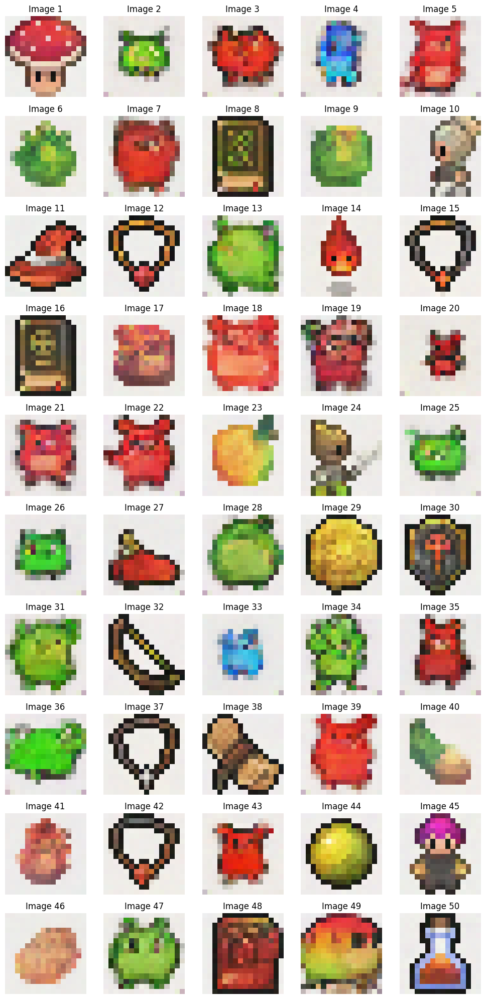


Generating and saving DDIM samples...


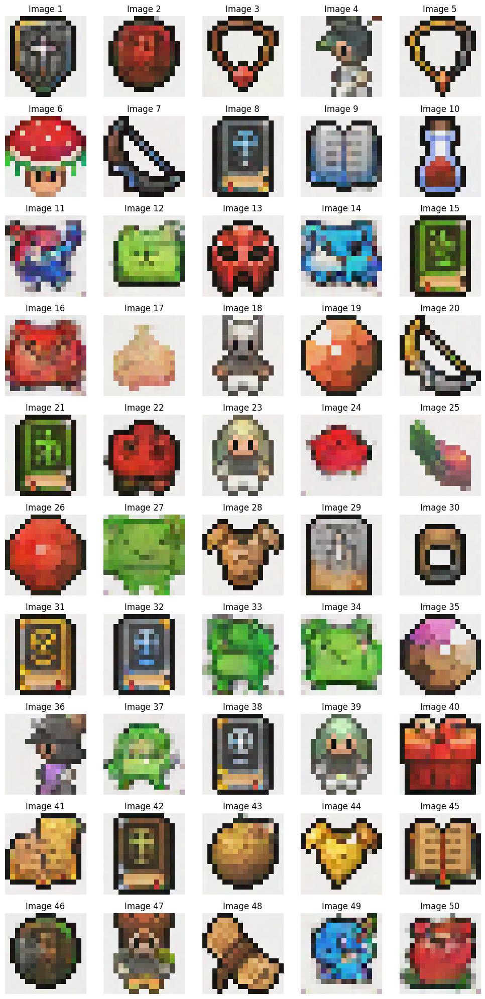


Summary:
DDPM Sampling Time: 7.09 seconds
DDIM Sampling Time: 5.61 seconds


In [41]:
import time
import os
import matplotlib.pyplot as plt

final_ddpm_dir = "results/ddpm"
final_ddim_dir = "results/ddim"
os.makedirs(final_ddpm_dir, exist_ok=True)
os.makedirs(final_ddim_dir, exist_ok=True)

print("\nTiming the generation of samples using DDPM and DDIM...")

start_ddpm = time.time()
final_samples_ddpm = sample_ddpm(
    nn_model, n_sample=50, timesteps=timesteps, beta=beta, alpha=alpha, alpha_bar=alpha_bar, device=device, height=height
).cpu()
end_ddpm = time.time()
ddpm_time = end_ddpm - start_ddpm
print(f"Time taken for DDPM sampling: {ddpm_time:.2f} seconds")

start_ddim = time.time()
final_samples_ddim = sample_ddim(
    nn_model, n_sample=50, timesteps=timesteps, beta=beta, alpha=alpha, alpha_bar=alpha_bar, device=device, height=height, eta=1, n_steps=600
).cpu()
end_ddim = time.time()
ddim_time = end_ddim - start_ddim
print(f"Time taken for DDIM sampling: {ddim_time:.2f} seconds")

print("\nGenerating and saving DDPM samples...")
plot_sample(final_samples_ddpm, 50, nrows=10)
plt.savefig(os.path.join(final_ddpm_dir, 'ddpm_final_samples.png'))
plt.close()

print("\nGenerating and saving DDIM samples...")
plot_sample(final_samples_ddim, 50, nrows=10)
plt.savefig(os.path.join(final_ddim_dir, 'ddim_final_samples.png'))
plt.close()

print("\nSummary:")
print(f"DDPM Sampling Time: {ddpm_time:.2f} seconds")
print(f"DDIM Sampling Time: {ddim_time:.2f} seconds")
